In [6]:
from __future__ import division
import os
import time
from glob import glob
import tensorflow as tf
from six.moves import xrange
import numpy as np
#from tflib.save_images import *
from save_images import *

In [7]:
data_dir = './data/patch_data'
import helper

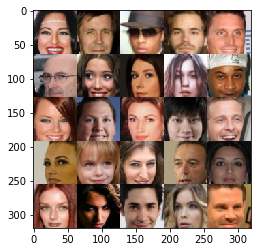

In [8]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

raw_images = helper.get_batch(glob(os.path.join(data_dir, 'newraw/*.jpg'))[:show_n_images], 64, 64, 'RGB')
pyplot.imshow(helper.images_square_grid(raw_images, 'RGB'))

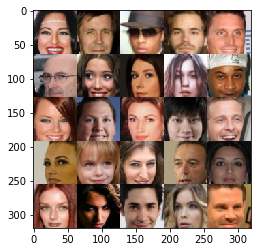

In [9]:
# Preprocess the patches
from skimage.util import view_as_windows
import scipy
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
resized_raw = helper.get_batch(glob(os.path.join(data_dir, 'newraw/*.jpg')), 64, 64, 'RGB')
pyplot.imshow(helper.images_square_grid(resized_raw, 'RGB'))

"""
DON'T RUN ANYTHING IN THIS CELL
"""
resized_dir = './data/patch_data/resized_raw'
for i, img in enumerate(resized_raw):
    filename = "%02d.png" % i
    result = scipy.misc.toimage(img, high=np.max(img), low=np.min(img))
    path = os.path.join(resized_dir, filename)
    scipy.misc.imsave(path, result)
   

In [10]:
"""
DON'T RUN ANYTHING IN THIS CELL
"""
from sklearn.feature_extraction.image import extract_patches_2d, reconstruct_from_patches_2d
PATCH_SIZE = (8, 8)
STEP_SIZE = 1

#patches = view_as_windows(resized_raw[-1], (8,8,3))

"""
for i, img in enumerate(resized_raw[:-1]):
    patch_dir = os.path.join(data_dir, 'training')
    if i == 25:
        patch_dir = os.path.join(data_dir, 'validation')
    elif i == 26:
        patch_dir = os.path.join(data_dir, 'testing')
        
    for j, patch in enumerate(extract_patches_2d(img, patch_size=PATCH_SIZE)):
        filename = "%02d_%04d.png" % (i,j)
        result = scipy.misc.toimage(patch, high=np.max(patch), low=np.min(patch))
        path = os.path.join(patch_dir, filename)
        scipy.misc.imsave(path, result)
"""

"""
for i, img in enumerate(resized_raw, 25):
    patch_dir = os.path.join(data_dir, 'training')
    #if i == 25:
    #    patch_dir = os.path.join(data_dir, 'validation')
    #elif i == 26:
    #    patch_dir = os.path.join(data_dir, 'testing')
        
    for j, patch in enumerate(extract_patches_2d(img, patch_size=PATCH_SIZE)):
        filename = "%02d_%04d.png" % (i,j)
        result = scipy.misc.toimage(patch, high=np.max(patch), low=np.min(patch))
        path = os.path.join(patch_dir, filename)
        scipy.misc.imsave(path, result)
"""
print("You have run this!")

        

    


You have run this!


In [11]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

"""
# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))
"""

"\n# Check TensorFlow Version\nassert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)\nprint('TensorFlow Version: {}'.format(tf.__version__))\n\n# Check for a GPU\nif not tf.test.gpu_device_name():\n    warnings.warn('No GPU found. Please use a GPU to train your neural network.')\nelse:\n    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))\n"

In [12]:
def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    real_imgs = tf.placeholder(tf.float32, [None, image_width,image_height,image_channels], name='input_real')
    fake_imgs = tf.placeholder(tf.float32, [None, image_width,image_height,image_channels], name='input_fake')
    inputs_z = tf.placeholder(tf.float32, [None, z_dim], name='input_z')
    learning_rate = tf.placeholder(tf.float32, name='learning_rate')
    return real_imgs, fake_imgs,inputs_z, learning_rate

In [13]:
HIDDEN_DIM = 320
INPUT_DIM = 8 * 8 * 3
IMAGE_SHAPE = [8, 8, 3]
PENALTY = 0.2

## Encoder

In [14]:
def encoder(images, z_dim, leaky_factor=0.2, name='encoder', reuse=False):
    """
    Create the encoder network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :leaky_factor: leaky_factor for leaky relu layer
    :return: Tensor of output vector (latent z )
    """
    with tf.variable_scope(name, reuse=reuse):

        # Flatten it
        #norm = tf.random_normal_initializer(stddev=0.01)
        x1 = tf.contrib.layers.flatten(images)
        x1 = tf.layers.dense(x1, HIDDEN_DIM / 5)
        #x1 = tf.layers.batch_normalization(x1, training=(not reuse))
        #relu1 = tf.maximum(leaky_factor * x1, x1)
        relu1 = tf.nn.relu(x1, name='en_ac1')
        #relu1 = tf.nn.sigmoid(x1)
        #tf.add_to_collection('activations', relu1)
        
        x2 = tf.layers.dense(relu1, HIDDEN_DIM / 5)
        #x2 = tf.layers.batch_normalization(x2, training=(not reuse))
        #relu2 = tf.maximum(leaky_factor * x2, x2)
        relu2 = tf.nn.relu(x2, name='en_ac2')
        #relu2 = tf.nn.sigmoid(x2)
        
        x3 = tf.layers.dense(relu2, HIDDEN_DIM / 5)
        relu3 = tf.nn.relu(x3, name = 'en_ac3')

        #out = tf.nn.relu(x2, name='en_ac2')
        #tf.add_to_collection('activations', out)
        out = tf.nn.relu(tf.layers.dense(relu3, z_dim), name='en_ac3')
        #tf.add_to_collection('activations', out)
        #out = tf.maximum(leaky_factor * out, out)
        return out

## Decoder

In [15]:
def decoder(z, out_channel_dim, leaky_factor=0.2, name='decoder',is_train=True):
    """
    Create the decoder network
    :param images: Tensor of input z
    :param out_channel_dim: the output channel format
    :param leaky_factor: leaky_factor for leaky relu layer
    :param is_train: Boolean if it is train mode or test mode
    :return: Tensor of output vector (latent z )
    """    
    with tf.variable_scope(name, reuse= (not is_train)):
        x1 = tf.layers.dense(z, HIDDEN_DIM)
        #x1 = tf.layers.batch_normalization(x1, training=is_train)
        #relu1 = tf.maximum(leaky_factor * x1, x1)
        relu1 = tf.nn.sigmoid(x1, name='de_ac1')
        #relu1 = tf.nn.sigmoid(x1)
        tf.add_to_collection('activations', relu1)
        #x2 = tf.layers.dense(relu1, HIDDEN_DIM)
        #x2 = tf.layers.batch_normalization(x2, training=is_train)
        #relu2 = tf.maximum(leaky_factor * x2, x2)
        #relu2 = tf.nn.relu(x2)
        #relu2 = tf.nn.sigmoid(x2)
       
        out = tf.tanh(tf.layers.dense(relu1, INPUT_DIM), name='de_ac2')
        #out = tf.nn.sigmoid(tf.layers.dense(relu2, INPUT_DIM))
        return tf.reshape(out, [-1] + IMAGE_SHAPE)

## Discriminator

In [16]:
def discriminator(input_z, leaky_factor=0.2, name='discriminator',reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input z
    :param leaky_factor: leaky_factor for leaky relu layer
    :param reuse: Boolean if it is train mode or test mode
    :return: tuple of (classification result, logits)
    """     
    with tf.variable_scope(name, reuse=reuse):
        
        x1 = tf.layers.dense(input_z, HIDDEN_DIM)
        #x1 = tf.layers.batch_normalization(x1, training=(not reuse))
        #relu1 = tf.maximum(leaky_factor * x1, x1)
        relu1 = tf.nn.relu(x1, name)

        x2 = tf.layers.dense(relu1, HIDDEN_DIM)
        #x2 = tf.layers.batch_normalization(x2, training=(not reuse))
        #relu2 = tf.maximum(leaky_factor * x2, x2)
        relu2 = tf.nn.relu(x2)

        logits = tf.layers.dense(x2, 1)
        out = tf.sigmoid(logits)

        return out, logits

## Corruptor

In [17]:
def corrupt(images, mask_type='inpainting',noise=False):
    """
    Create the discriminator network
    :param images: Tensor of input images
    :param noise: Boolean if gaussian noise will be added
    :return: Tensor of corrupted images
    """ 
    image_shape = images.get_shape().as_list()[1:]
    x, y, z = image_shape
    length_input = x * y * z
    mu = 0.0
    sigma = 0.5
    gnoise = np.random.normal(loc=mu, scale=sigma, size=image_shape)
    if noise:
        images = tf.add(images, gnoise)
        
    if mask_type == 'inpainting':
        # inpainting 
        a, b = 2, 2
        pixFrac = np.random.beta(a,b)
        #pixFrac = 0.5
        mask = np.random.binomial(1, pixFrac, image_shape)
        result = tf.multiply(images, mask)
        return result
    elif mask_type == 'compress':
        # compressive sensing
        flat_images = tf.contrib.layers.flatten(images)
        #A = np.random.normal(loc=mu, scale=sigma,size=[length_input//5, length_input])
        #A = np.array(A, dtype=np.float32)
        #mask = np.matmul(A.transpose(), A)
        A = tf.random_normal([length_input // 5, length_input], name='sensing_matrix')
        mask = tf.matmul(tf.transpose(A), A)
        result = tf.matmul(flat_images, mask)
        return tf.reshape(result, [-1] + image_shape)
    else:
        return images
    
    
def corrupt_func(images, mask_type='inpainting',noise=True):
    """
    Create the discriminator network
    :param images: Tensor of input images
    :param noise: Boolean if gaussian noise will be added
    :return: Tensor of corrupted images
    """ 
    image_shape = images.shape[1:]
    x, y, z = image_shape
    length_input = x * y * z
    mu = 0.0
    sigma = 0.5
    gnoise = np.random.normal(loc=mu, scale=sigma, size=image_shape)
    result = np.zeros(images.shape)
    result += images
    if noise:
        result += gnoise
        
    if mask_type == 'inpainting':
        # inpainting 
        #a, b = 2, 2
        #pixFrac = np.random.beta(a,b)
        pixFrac = 0.2
        mask = np.random.binomial(1, pixFrac, image_shape)
        result = np.multiply(result, mask)
        return result
    elif mask_type == 'compress':
        # compressive sensing
        flat_images = np.array(list(map(lambda x: x.flatten(), result)))
        
        A = np.random.normal(loc=mu, scale=sigma,size=[length_input//5, length_input])
        A = np.array(A, dtype=np.float32)
        mask = np.matmul(A.transpose(), A)
        #A = tf.random_normal([length_input // 5, length_input], name='sensing_matrix')
        #mask = tf.matmul(tf.transpose(A), A)
        #result = tf.matmul(flat_images, mask)
        result = np.array(list(map(lambda x : np.matmul(x, mask), flat_images)))
        return result.reshape(images.shape)
    else:
        return result

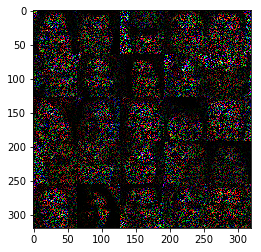

In [18]:
# test corrupt_func
A = corrupt_func(resized_raw[:25], mask_type='inpainting', noise=False)
pyplot.imshow(helper.images_square_grid(A, 'RGB'))

### Loss
Implement `model_loss` to build the DAAE for training and calculate the loss.  The function should return a tuple of (discriminator loss, encoder loss, encoder-decoder loss).  Use the following functions you implemented:
- `discriminator(input_z, leaky_factor, reuse=False)`
- `decoder(z, out_channel_dim, leaky_factor, is_train=True)`
- `encoder(images, z_dim, leaky_factor, reuse=False)`

In [19]:
def kl_divergence(p, p_hat):
    return p * tf.log(p) - p * tf.log(p_hat) + (1 - p) * tf.log(1 - p) - (1 - p) * tf.log(1 - p_hat)

In [20]:
def model_loss(input_real, input_fake, input_z, z_dim, output_channel_dim):
    """
    Get the loss for the discriminator, encoder and decoder
    :param input_real: Images from the real dataset
    :param input_z: Z input from Laplacian distribution
    :param out_channel_dim: The number of channels in the output image
    :param M : how many iterations to sample from p(z|x)
    :return: A tuple of (discriminator loss, encoder loss, recon loss, dis_loss_sum, en_loss_sum, recon_loss_sum)
    """
    
    En = encoder(input_real, z_dim, name='encoder')
    De = decoder(En, output_channel_dim, name='decoder')
    
    recon_loss = tf.reduce_mean(tf.square(tf.subtract(De, input_real)))
    activations = tf.get_collection('activations')
    #l1_regularizer = tf.contrib.layers.l1_regularizer(scale=PENALTY, scope=None)
    #sparse_penalty = tf.contrib.layers.apply_regularization(l1_regularizer, activations)
    sparse_penalty = tf.reduce_mean(kl_divergence(PENALTY, activations[0]))
    #for ac in activations:
    #    sparse_penalty += tf.reduce_mean(kl_divergence(PENALTY, ac))
    
    total_loss = recon_loss + sparse_penalty / len(activations)

    en_sum = tf.summary.histogram("encoded",En)
    recon_loss_sum = tf.summary.scalar("recon_loss", recon_loss)
    
    return De, recon_loss, total_loss, recon_loss_sum,en_sum
    
    

In [21]:
def model_opt(total_loss, learning_rate, beta1, beta2):
    """
    Get optimization operations
    :param dis_loss: Discriminator loss Tensor
    :param en_loss: encoder loss Tensor
    :param recon_loss: reconstruction loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param beta2: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, encoder training operation, recontraining operations)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    
    #dis_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    de_vars = [var for var in t_vars if var.name.startswith('decoder')]
    en_real_vars = [var for var in t_vars if var.name.startswith('encoder')]
    #en_fake_vars = [var for var in t_vars if var.name.startswith('en_fake')]
    ed_vars = de_vars + en_real_vars
    
    
    #with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS, scope='decoder')):
    #de_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1,beta2=beta2).minimize(recon_loss, var_list=ed_vars)
    de_train_opt = tf.train.GradientDescentOptimizer(learning_rate).minimize(total_loss, var_list=ed_vars)
    #d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1,beta2=beta2).minimize(dis_loss, var_list=dis_vars)
    
    #with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS, scope='encoder')):
    #en_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1,beta2=beta2).minimize(en_loss, var_list=en_fake_vars)
    
    return de_train_opt





## Training

In [22]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np
import scipy.stats as stats
from skimage.measure import compare_psnr

from scipy.stats import sem
def mean_score(scores):
    return ("##### What? The Mean score: {0:.3f} (+/-{1: .3f})").format(np.mean(scores), sem(scores))


def sample_from_dis(n_images, z_dim,dis = 'laplacian'):
    if dis == 'laplacian':
        mu = 0.0
        lam = 1.0
        return np.random.laplace(loc=mu, scale=lam, size=[n_images, z_dim])
    elif dis == 'gaussian':
        mu = 0
        lower = -1
        upper = 1
        sigma = 1 / np.sqrt(z_dim)
        sigma = 1
        z = stats.truncnorm.rvs((lower-mu)/sigma, (upper-mu)/sigma, loc=mu, scale=sigma, size=[n_images,z_dim])
        return z
    else:
        return np.random.uniform(-1, 1, size=[n_images, z_dim])


def show_decoder_output(sess, n_images, input_z, out_channel_dim, image_mode, distribution='laplacian'):
    """
    Show example output for the decoder
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
        
    example_z = sample_from_dis(n_images, z_dim, dis=None)

    samples = sess.run(
        decoder(input_z, out_channel_dim, leaky_factor=0.2, is_train = False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()
    
    
def show_endecoder_output(sess, samples, corrupt_samples, recon_samples,input_z, out_channel_dim, image_mode, distribution='laplacian'):
    """
    Show example output for the encoder-decoder
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
        
    #example_z = sample_from_dis(n_images, z_dim, dis=distribution)
    #corrupt_images = corrupt_func(sample_images, mask_type='inpainting', noise=False)
    
    #ops = [reconstruction]
    
    #samples = sess.run(
    #    ops,
    #    feed_dict={'input_fake': corrupt_images})
    
    #mse = np.mean((samples - recon_samples) ** 2)
    #print("######### what? the reconstruction mse is: %2.4f"  % mse)

    psnr = compare_psnr(samples, recon_samples)
    print("#########reconstruction test psnr: %2.4f "  % psnr)
    
    images_grid = helper.images_square_grid(recon_samples, image_mode)
    corr_grid = helper.images_square_grid(corrupt_samples, image_mode)
    
    pyplot.subplot(121)
    pyplot.imshow(corr_grid, cmap=cmap)
    
    pyplot.subplot(122)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()
    
    

## run

In [23]:
import time

checkpoint_dir = './checkpoint'
model_name = "spAE_scratch.model"
mask_t = ''
NOISE = False

def save(saver, sess, checkpoint_dir, model_name, steps):
    if not os.path.exists(checkpoint_dir):
        os.makedirs(checkpoint_dir)

    saver.save(sess,os.path.join(checkpoint_dir, model_name),
                        global_step=steps)

    
def load(saver, sess, checkpoint_dir):
    print(" [*] Reading checkpoints...")

    ckpt = tf.train.get_checkpoint_state(checkpoint_dir)
    if ckpt and ckpt.model_checkpoint_path:
        saver.restore(sess, ckpt.model_checkpoint_path)
        return True
    else:
        return False

    


def train(epoch_count, batch_size, z_dim, learning_rate, beta1, beta2, M, get_batches, samples, example_images,training_samples,data_shape, data_image_mode):
    """
    Train the DAAE
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param beta2: The exponential decay rate for the 1st moment in the optimizer
    :param M: iterations to sample fake_z
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model

    num_imgs, image_width, image_height, image_channels = data_shape
    
    input_real, input_fake,input_z, _ = model_inputs(image_width, image_height, image_channels, z_dim)
    #tf.assign(lr, learning_rate)
    output_channel_dim = image_channels
    
    reconstruction, recon_loss, total_loss, recon_loss_sum, en_sum = model_loss(input_real, input_fake,input_z, z_dim, output_channel_dim)
    
    
    de_train_opt = model_opt(total_loss, learning_rate, beta1,beta2)
    ITER = 1 # we can train en-decoder more than 1 time...later~
    steps = 0
    
    recon_sum = tf.summary.merge([recon_loss_sum])
    encoded_sum = tf.summary.merge([en_sum])
    #dis_sum = tf.summary.merge([dis_loss_sum])

    saver = tf.train.Saver(max_to_keep=1)
    
    train_psnr_lst = list()
    test_psnr_lst = list()
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        writer = tf.summary.FileWriter("./logs", sess.graph)
        
        # check if already exists a model
        if load(saver, sess, checkpoint_dir):
            print("""
            We found a existing model and continue to train on it! 
            If you need a new model, delete checkpoint directory""")
        else:
            print("""NOT found a model === Initializing a new one""")
            
        
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps += 1
                batch_imgs = batch_images * 2

                batch_z = sample_from_dis(batch_size, z_dim,dis = '')
 
                # Run optimizers

                # Update real_EnDecoder network
                for i in range(ITER):
                    _, summary_str = sess.run([de_train_opt, encoded_sum],
                            feed_dict={ input_real: batch_imgs})
                writer.add_summary(summary_str, steps)

                
                if steps % 10 == 0:
                    ops = [recon_loss, total_loss]
                    recon_val, total_val = sess.run(ops, feed_dict={input_real:batch_imgs})
                    #print("EPO: %d, recon_loss: %2.4f, total_loss: %2.4f" % (epoch_i, recon_val, total_val))
                    #train_corrupt_samples = corrupt_func(training_samples, mask_type=mask_t, noise=NOISE)
                    #corrupt_samples = corrupt_func(samples, mask_type=mask_t, noise=NOISE)
                    recon_train_samples = sess.run(reconstruction, feed_dict={input_real:training_samples})
                    psnr_train = compare_psnr(training_samples, recon_train_samples)
                    
                    psnr_test_scores = list()
                    for j in range(samples.shape[0] // batch_size):
                        sample_imgs = next(samples.get_batches(batch_size))
                        scaled_samples = sample_imgs * 2
                        recon_test_samples = sess.run(reconstruction, feed_dict={input_real:scaled_samples})
                        psnr_test = compare_psnr(scaled_samples, recon_test_samples)
                        psnr_test_scores.append(psnr_test)
                    
                    validation_psnr = sum(psnr_test_scores) * 1.0 / len(psnr_test_scores)
                    print("EPO: %d, recon_loss: %2.4f, total_loss: %2.4f, train_psnr:%2.4f, validation_psnr:%2.4f" % (epoch_i, recon_val, total_val, psnr_train,validation_psnr))
                    train_psnr_lst.append(psnr_train)
                    test_psnr_lst.append(validation_psnr)
                    
                if steps % 100 == 0:
                    #show_decoder_output(sess, show_n_images, input_z, output_channel_dim, data_image_mode)
                    corrupt_samples = corrupt_func(example_images, mask_type=mask_t, noise=NOISE)
                    recon_samples = sess.run(reconstruction, feed_dict={input_real:example_images})
                    recon_training_samples = sess.run(reconstruction, feed_dict={input_real:training_samples})
                    show_endecoder_output(sess, example_images,corrupt_samples,recon_samples,input_z, output_channel_dim, data_image_mode)
                    
                if steps % 500 == 1:
                    save(saver, sess, checkpoint_dir, model_name, steps)
    return np.array(train_psnr_lst), np.array(test_psnr_lst)
                    
                    

## Test!

In [24]:
def test(z_dim, get_batches, data_shape, data_image_mode):
    """
    Train the DAAE
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param beta2: The exponential decay rate for the 1st moment in the optimizer
    :param M: iterations to sample fake_z
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model

    num_imgs, image_width, image_height, image_channels = data_shape
    
    input_real, input_fake,input_z, _ = model_inputs(image_width, image_height, image_channels, z_dim)
    #tf.assign(lr, learning_rate)
    output_channel_dim = image_channels
    
    reconstruction, recon_loss, total_loss, recon_loss_sum,en_sum = model_loss(input_real, input_fake,input_z, z_dim, output_channel_dim)

    saver = tf.train.Saver(max_to_keep=1)
    
    recon_patches = np.zeros(data_shape)
    steps = 0
    test_psnr_lst = list()
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        writer = tf.summary.FileWriter("./logs", sess.graph)
        
        # check if already exists a model
        if load(saver, sess, checkpoint_dir):
            print("""
            We found a existing model and continue to train on it! 
            If you need a new model, delete checkpoint directory""")
        else:
            print("""NOT found a model === Go to train a new one""")
            return
        
        for batch_images in get_batches(batch_size):
            steps += 1
            batch_imgs = batch_images * 2

            batch_z = sample_from_dis(batch_size, z_dim,dis = '')
    
            recon_test_samples = sess.run(reconstruction, feed_dict={input_real:batch_imgs})
            recon_patches[(steps - 1) * batch_size:steps * batch_size] = recon_test_samples
            
            psnr_test = compare_psnr(batch_imgs, recon_test_samples)
            test_psnr_lst.append(psnr_test)
            
    return recon_patches, test_psnr_lst
            
            

In [25]:
def check_var(z_dim, get_batches, data_shape, data_image_mode):
    """
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model

    num_imgs, image_width, image_height, image_channels = data_shape
    
    input_real, input_fake,input_z, _ = model_inputs(image_width, image_height, image_channels, z_dim)
    #tf.assign(lr, learning_rate)
    output_channel_dim = image_channels
    
    reconstruction, recon_loss, total_loss, recon_loss_sum,en_sum = model_loss(input_real, input_fake,input_z, z_dim, output_channel_dim)

    saver = tf.train.Saver(max_to_keep=1)
    
    recon_patches = np.zeros(data_shape)
    steps = 0
    test_psnr_lst = list()
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        writer = tf.summary.FileWriter("./logs", sess.graph)
        
        # check if already exists a model
        if load(saver, sess, checkpoint_dir):
            print("""
            We found a existing model and continue to train on it! 
            If you need a new model, delete checkpoint directory""")
        else:
            print("""NOT found a model === Go to train a new one""")
            return
        print(sess.graph.get_all_collection_keys())

## Faces

 [*] Reading checkpoints...
NOT found a model === Initializing a new one
EPO: 0, recon_loss: 0.1948, total_loss: 0.3892, train_psnr:11.3671, validation_psnr:7.8950
EPO: 0, recon_loss: 0.1150, total_loss: 0.3085, train_psnr:12.3023, validation_psnr:7.2414
EPO: 0, recon_loss: 0.1102, total_loss: 0.3033, train_psnr:12.9039, validation_psnr:7.8059
EPO: 0, recon_loss: 0.0651, total_loss: 0.2574, train_psnr:12.6799, validation_psnr:6.8651
EPO: 0, recon_loss: 0.0615, total_loss: 0.2532, train_psnr:12.6766, validation_psnr:6.8121
EPO: 0, recon_loss: 0.1510, total_loss: 0.3434, train_psnr:12.6120, validation_psnr:11.0863
EPO: 0, recon_loss: 0.1555, total_loss: 0.3467, train_psnr:12.1733, validation_psnr:12.0104
EPO: 0, recon_loss: 0.0556, total_loss: 0.2458, train_psnr:11.8561, validation_psnr:12.5130
EPO: 0, recon_loss: 0.0974, total_loss: 0.2869, train_psnr:12.3381, validation_psnr:11.1460
EPO: 0, recon_loss: 0.1388, total_loss: 0.3281, train_psnr:12.0279, validation_psnr:11.8290
#########rec

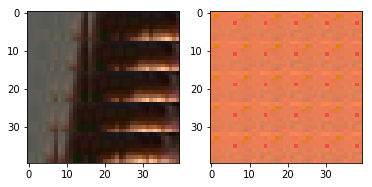

EPO: 0, recon_loss: 0.0781, total_loss: 0.2665, train_psnr:10.7995, validation_psnr:15.1364
EPO: 0, recon_loss: 0.0947, total_loss: 0.2824, train_psnr:11.2786, validation_psnr:14.1441
EPO: 0, recon_loss: 0.0610, total_loss: 0.2475, train_psnr:11.0107, validation_psnr:14.7244
EPO: 0, recon_loss: 0.0576, total_loss: 0.2442, train_psnr:11.8496, validation_psnr:13.0077
EPO: 0, recon_loss: 0.0695, total_loss: 0.2547, train_psnr:11.7293, validation_psnr:13.2267
EPO: 0, recon_loss: 0.2510, total_loss: 0.4358, train_psnr:12.7124, validation_psnr:11.1316
EPO: 0, recon_loss: 0.1661, total_loss: 0.3502, train_psnr:13.2334, validation_psnr:9.4637
EPO: 0, recon_loss: 0.1604, total_loss: 0.3438, train_psnr:13.0709, validation_psnr:10.0377
EPO: 0, recon_loss: 0.1512, total_loss: 0.3333, train_psnr:13.2468, validation_psnr:9.5295
EPO: 0, recon_loss: 0.1167, total_loss: 0.2982, train_psnr:13.0852, validation_psnr:10.0884
#########reconstruction test psnr: 10.0665 


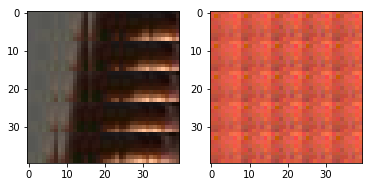

EPO: 0, recon_loss: 0.1229, total_loss: 0.3051, train_psnr:13.6454, validation_psnr:8.5710
EPO: 0, recon_loss: 0.0844, total_loss: 0.2650, train_psnr:12.9713, validation_psnr:6.8572
EPO: 0, recon_loss: 0.1196, total_loss: 0.3000, train_psnr:13.1632, validation_psnr:7.1903
EPO: 0, recon_loss: 0.0516, total_loss: 0.2300, train_psnr:12.9187, validation_psnr:6.7939
EPO: 0, recon_loss: 0.0334, total_loss: 0.2111, train_psnr:12.6214, validation_psnr:6.4883
EPO: 0, recon_loss: 0.3025, total_loss: 0.4775, train_psnr:13.2332, validation_psnr:7.3789
EPO: 0, recon_loss: 0.2170, total_loss: 0.3879, train_psnr:13.3695, validation_psnr:10.1369
EPO: 0, recon_loss: 0.1566, total_loss: 0.3257, train_psnr:12.8436, validation_psnr:11.5474
EPO: 0, recon_loss: 0.1677, total_loss: 0.3373, train_psnr:12.7925, validation_psnr:11.8191
EPO: 0, recon_loss: 0.1304, total_loss: 0.2986, train_psnr:13.0481, validation_psnr:11.3957
#########reconstruction test psnr: 11.3452 


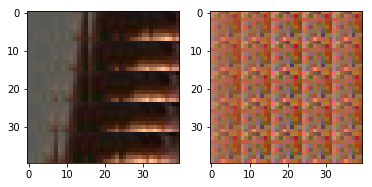

EPO: 0, recon_loss: 0.1670, total_loss: 0.3275, train_psnr:12.5767, validation_psnr:12.4363
EPO: 0, recon_loss: 0.1928, total_loss: 0.3549, train_psnr:13.7347, validation_psnr:10.3040
EPO: 0, recon_loss: 0.0953, total_loss: 0.2552, train_psnr:13.7820, validation_psnr:10.2099
EPO: 0, recon_loss: 0.0519, total_loss: 0.2125, train_psnr:13.9820, validation_psnr:9.2032
EPO: 0, recon_loss: 0.1006, total_loss: 0.2564, train_psnr:13.9456, validation_psnr:9.0039
EPO: 0, recon_loss: 0.0565, total_loss: 0.2032, train_psnr:13.8830, validation_psnr:10.1618
EPO: 0, recon_loss: 0.0706, total_loss: 0.2132, train_psnr:13.5952, validation_psnr:11.0376
EPO: 0, recon_loss: 0.0821, total_loss: 0.2068, train_psnr:13.0427, validation_psnr:12.1446
EPO: 0, recon_loss: 0.0927, total_loss: 0.2161, train_psnr:12.7156, validation_psnr:12.8568
EPO: 0, recon_loss: 0.0987, total_loss: 0.2021, train_psnr:12.1899, validation_psnr:13.7703
#########reconstruction test psnr: 13.6536 


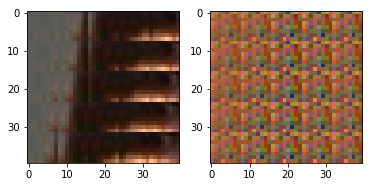

EPO: 0, recon_loss: 0.1793, total_loss: 0.2906, train_psnr:11.5637, validation_psnr:15.0151
EPO: 0, recon_loss: 0.3355, total_loss: 0.4453, train_psnr:12.7949, validation_psnr:13.2511
EPO: 0, recon_loss: 0.1617, total_loss: 0.2623, train_psnr:13.7937, validation_psnr:11.8605
EPO: 0, recon_loss: 0.1630, total_loss: 0.2583, train_psnr:14.1797, validation_psnr:11.3447
EPO: 0, recon_loss: 0.1637, total_loss: 0.2516, train_psnr:14.4903, validation_psnr:10.1888
EPO: 0, recon_loss: 0.2964, total_loss: 0.3751, train_psnr:14.5771, validation_psnr:11.2842
EPO: 0, recon_loss: 0.1913, total_loss: 0.2627, train_psnr:14.6826, validation_psnr:11.5620
EPO: 0, recon_loss: 0.1220, total_loss: 0.1873, train_psnr:14.9276, validation_psnr:10.9685
EPO: 0, recon_loss: 0.1008, total_loss: 0.1577, train_psnr:14.9923, validation_psnr:10.9536
EPO: 0, recon_loss: 0.0635, total_loss: 0.1120, train_psnr:14.9703, validation_psnr:10.4469
#########reconstruction test psnr: 10.4056 


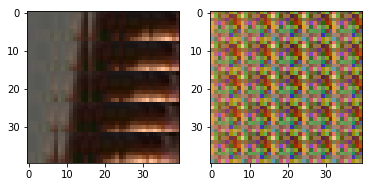

EPO: 0, recon_loss: 0.1349, total_loss: 0.1719, train_psnr:15.0148, validation_psnr:10.4738
EPO: 0, recon_loss: 0.1004, total_loss: 0.1318, train_psnr:15.1790, validation_psnr:10.5230
EPO: 0, recon_loss: 0.1274, total_loss: 0.1631, train_psnr:15.2829, validation_psnr:10.9434
EPO: 0, recon_loss: 0.0820, total_loss: 0.1130, train_psnr:15.3602, validation_psnr:11.6050
EPO: 0, recon_loss: 0.0940, total_loss: 0.1210, train_psnr:15.3705, validation_psnr:11.3574
EPO: 0, recon_loss: 0.2205, total_loss: 0.2662, train_psnr:15.2413, validation_psnr:12.0063
EPO: 0, recon_loss: 0.1787, total_loss: 0.2150, train_psnr:15.1071, validation_psnr:11.7696
EPO: 0, recon_loss: 0.1576, total_loss: 0.1944, train_psnr:15.0207, validation_psnr:11.5789
EPO: 0, recon_loss: 0.1372, total_loss: 0.1750, train_psnr:15.0913, validation_psnr:11.9523
EPO: 0, recon_loss: 0.0985, total_loss: 0.1360, train_psnr:14.9203, validation_psnr:11.7160
#########reconstruction test psnr: 11.6878 


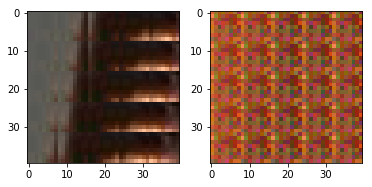

EPO: 0, recon_loss: 0.1666, total_loss: 0.2344, train_psnr:14.9797, validation_psnr:12.0942
EPO: 0, recon_loss: 0.0756, total_loss: 0.1098, train_psnr:15.6496, validation_psnr:12.8600
EPO: 0, recon_loss: 0.1080, total_loss: 0.1326, train_psnr:15.7583, validation_psnr:12.8964
EPO: 0, recon_loss: 0.0779, total_loss: 0.1048, train_psnr:15.9920, validation_psnr:13.0082
EPO: 0, recon_loss: 0.1237, total_loss: 0.1608, train_psnr:15.9787, validation_psnr:13.0049
EPO: 0, recon_loss: 0.1280, total_loss: 0.1840, train_psnr:15.7553, validation_psnr:13.9247
EPO: 0, recon_loss: 0.1155, total_loss: 0.1554, train_psnr:16.5113, validation_psnr:13.6320
EPO: 0, recon_loss: 0.0977, total_loss: 0.1398, train_psnr:16.8215, validation_psnr:13.3322
EPO: 0, recon_loss: 0.1102, total_loss: 0.1367, train_psnr:16.8497, validation_psnr:13.5068
EPO: 0, recon_loss: 0.0816, total_loss: 0.1212, train_psnr:16.8813, validation_psnr:13.2101
#########reconstruction test psnr: 13.1152 


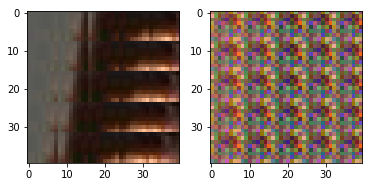

EPO: 0, recon_loss: 0.1048, total_loss: 0.1403, train_psnr:16.9150, validation_psnr:13.6179
EPO: 0, recon_loss: 0.1530, total_loss: 0.2106, train_psnr:16.8671, validation_psnr:13.8042
EPO: 0, recon_loss: 0.1315, total_loss: 0.1722, train_psnr:16.8131, validation_psnr:13.9226
EPO: 0, recon_loss: 0.2046, total_loss: 0.2410, train_psnr:17.0596, validation_psnr:14.2197
EPO: 0, recon_loss: 0.1151, total_loss: 0.1547, train_psnr:16.9657, validation_psnr:14.1587
EPO: 0, recon_loss: 0.1294, total_loss: 0.1568, train_psnr:16.9855, validation_psnr:14.2094
EPO: 0, recon_loss: 0.1179, total_loss: 0.1654, train_psnr:16.7638, validation_psnr:14.0242
EPO: 0, recon_loss: 0.1226, total_loss: 0.1850, train_psnr:16.6206, validation_psnr:13.9546
EPO: 0, recon_loss: 0.1430, total_loss: 0.1984, train_psnr:16.7972, validation_psnr:14.1749
EPO: 0, recon_loss: 0.1324, total_loss: 0.1894, train_psnr:16.4834, validation_psnr:13.8741
#########reconstruction test psnr: 13.8097 


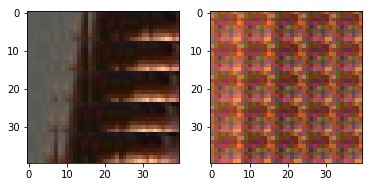

EPO: 0, recon_loss: 0.1044, total_loss: 0.1659, train_psnr:16.4023, validation_psnr:13.8685
EPO: 0, recon_loss: 0.1216, total_loss: 0.2326, train_psnr:17.4848, validation_psnr:16.1648
EPO: 0, recon_loss: 0.1632, total_loss: 0.2146, train_psnr:17.6513, validation_psnr:16.6343
EPO: 0, recon_loss: 0.1328, total_loss: 0.1707, train_psnr:17.6423, validation_psnr:16.1370
EPO: 0, recon_loss: 0.0670, total_loss: 0.0778, train_psnr:17.4898, validation_psnr:16.5622
EPO: 0, recon_loss: 0.0425, total_loss: 0.0548, train_psnr:17.5162, validation_psnr:16.2023
EPO: 0, recon_loss: 0.0571, total_loss: 0.0845, train_psnr:17.5672, validation_psnr:15.2552
EPO: 0, recon_loss: 0.0579, total_loss: 0.0972, train_psnr:17.5564, validation_psnr:15.4996
EPO: 0, recon_loss: 0.0712, total_loss: 0.1007, train_psnr:17.5249, validation_psnr:15.8135
EPO: 0, recon_loss: 0.0650, total_loss: 0.1043, train_psnr:17.4402, validation_psnr:15.8834
#########reconstruction test psnr: 15.7421 


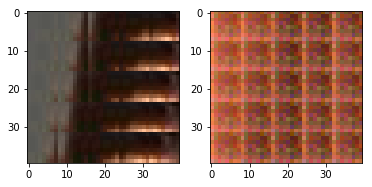

EPO: 0, recon_loss: 0.0691, total_loss: 0.1028, train_psnr:17.4562, validation_psnr:16.4216
EPO: 0, recon_loss: 0.0157, total_loss: 0.0376, train_psnr:17.3911, validation_psnr:16.5450
EPO: 0, recon_loss: 0.0106, total_loss: 0.0217, train_psnr:17.1505, validation_psnr:16.4466
EPO: 0, recon_loss: 0.0282, total_loss: 0.0577, train_psnr:16.3906, validation_psnr:16.7282
EPO: 0, recon_loss: 0.0098, total_loss: 0.0142, train_psnr:16.2926, validation_psnr:16.1182
EPO: 0, recon_loss: 0.0237, total_loss: 0.0458, train_psnr:15.8578, validation_psnr:15.8155
EPO: 0, recon_loss: 0.1115, total_loss: 0.1640, train_psnr:16.0058, validation_psnr:16.4244
EPO: 0, recon_loss: 0.0627, total_loss: 0.0834, train_psnr:16.7460, validation_psnr:16.3788
EPO: 0, recon_loss: 0.0662, total_loss: 0.0830, train_psnr:16.8379, validation_psnr:16.7141
EPO: 0, recon_loss: 0.0434, total_loss: 0.0565, train_psnr:17.1102, validation_psnr:16.5534
#########reconstruction test psnr: 16.3490 


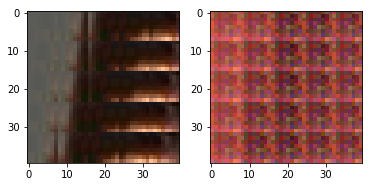

EPO: 0, recon_loss: 0.0435, total_loss: 0.0680, train_psnr:17.2030, validation_psnr:16.8571
EPO: 0, recon_loss: 0.1028, total_loss: 0.1364, train_psnr:17.5385, validation_psnr:16.6562
EPO: 0, recon_loss: 0.1027, total_loss: 0.1369, train_psnr:17.6134, validation_psnr:16.9070
EPO: 0, recon_loss: 0.0912, total_loss: 0.1433, train_psnr:17.5196, validation_psnr:16.9970
EPO: 0, recon_loss: 0.1330, total_loss: 0.1521, train_psnr:17.6228, validation_psnr:16.6378
EPO: 0, recon_loss: 0.0456, total_loss: 0.0696, train_psnr:17.5862, validation_psnr:16.0907
EPO: 0, recon_loss: 0.0712, total_loss: 0.0871, train_psnr:17.7052, validation_psnr:16.1707
EPO: 0, recon_loss: 0.0420, total_loss: 0.0503, train_psnr:17.8532, validation_psnr:16.6637
EPO: 0, recon_loss: 0.0552, total_loss: 0.0722, train_psnr:17.7963, validation_psnr:16.3793
EPO: 0, recon_loss: 0.0440, total_loss: 0.0560, train_psnr:17.8127, validation_psnr:16.4308
#########reconstruction test psnr: 16.2252 


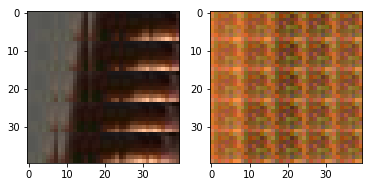

EPO: 0, recon_loss: 0.0396, total_loss: 0.0497, train_psnr:17.7215, validation_psnr:16.5067
EPO: 0, recon_loss: 0.0923, total_loss: 0.1701, train_psnr:17.7287, validation_psnr:18.1805
EPO: 0, recon_loss: 0.0411, total_loss: 0.0710, train_psnr:17.8430, validation_psnr:18.1801
EPO: 0, recon_loss: 0.0699, total_loss: 0.1030, train_psnr:17.8573, validation_psnr:17.9153
EPO: 0, recon_loss: 0.0429, total_loss: 0.0606, train_psnr:17.8160, validation_psnr:17.7209
EPO: 0, recon_loss: 0.0473, total_loss: 0.0645, train_psnr:17.8443, validation_psnr:17.7405
EPO: 0, recon_loss: 0.0381, total_loss: 0.0463, train_psnr:17.8623, validation_psnr:17.6664
EPO: 0, recon_loss: 0.0253, total_loss: 0.0368, train_psnr:17.8832, validation_psnr:17.4145
EPO: 0, recon_loss: 0.0407, total_loss: 0.0499, train_psnr:17.7649, validation_psnr:17.4644
EPO: 0, recon_loss: 0.0377, total_loss: 0.0472, train_psnr:17.7655, validation_psnr:17.2215
#########reconstruction test psnr: 16.9589 


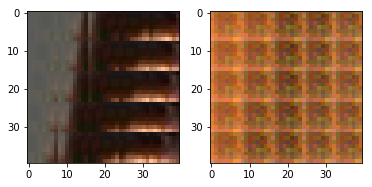

EPO: 0, recon_loss: 0.0248, total_loss: 0.0321, train_psnr:17.6005, validation_psnr:17.2595
EPO: 0, recon_loss: 0.0854, total_loss: 0.1145, train_psnr:17.5867, validation_psnr:17.1723
EPO: 0, recon_loss: 0.0503, total_loss: 0.0749, train_psnr:17.7235, validation_psnr:17.2171
EPO: 0, recon_loss: 0.0623, total_loss: 0.0874, train_psnr:17.8092, validation_psnr:17.2660
EPO: 0, recon_loss: 0.0509, total_loss: 0.0744, train_psnr:17.8344, validation_psnr:17.4901
EPO: 0, recon_loss: 0.0296, total_loss: 0.0580, train_psnr:17.8093, validation_psnr:17.3045
EPO: 0, recon_loss: 0.1196, total_loss: 0.1706, train_psnr:17.8490, validation_psnr:17.5836
EPO: 0, recon_loss: 0.0770, total_loss: 0.1185, train_psnr:17.9000, validation_psnr:18.8097
EPO: 0, recon_loss: 0.0819, total_loss: 0.1136, train_psnr:17.9132, validation_psnr:18.8113
EPO: 0, recon_loss: 0.0968, total_loss: 0.1128, train_psnr:17.8689, validation_psnr:18.3093
#########reconstruction test psnr: 17.9148 


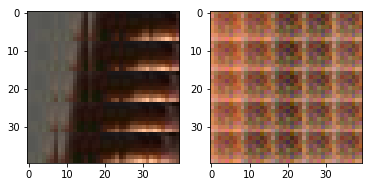

EPO: 0, recon_loss: 0.0700, total_loss: 0.0862, train_psnr:17.9171, validation_psnr:18.2361
EPO: 0, recon_loss: 0.1202, total_loss: 0.1439, train_psnr:17.8626, validation_psnr:18.9027
EPO: 0, recon_loss: 0.0232, total_loss: 0.0480, train_psnr:17.7241, validation_psnr:18.2825
EPO: 0, recon_loss: 0.0602, total_loss: 0.0729, train_psnr:17.5442, validation_psnr:17.4354
EPO: 0, recon_loss: 0.0799, total_loss: 0.0933, train_psnr:17.2375, validation_psnr:16.1099
EPO: 0, recon_loss: 0.0541, total_loss: 0.0665, train_psnr:17.2103, validation_psnr:15.8015
EPO: 0, recon_loss: 0.0366, total_loss: 0.0720, train_psnr:17.1115, validation_psnr:17.7826
EPO: 0, recon_loss: 0.0753, total_loss: 0.1017, train_psnr:17.7492, validation_psnr:18.3653
EPO: 0, recon_loss: 0.0769, total_loss: 0.1064, train_psnr:17.8644, validation_psnr:18.8867
EPO: 0, recon_loss: 0.0858, total_loss: 0.1117, train_psnr:17.8228, validation_psnr:19.1323
#########reconstruction test psnr: 18.7298 


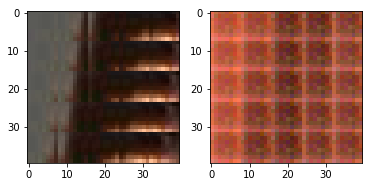

EPO: 0, recon_loss: 0.0431, total_loss: 0.0576, train_psnr:17.8170, validation_psnr:19.0851
EPO: 0, recon_loss: 0.0520, total_loss: 0.0669, train_psnr:17.7018, validation_psnr:18.9291
EPO: 0, recon_loss: 0.0387, total_loss: 0.0540, train_psnr:17.7320, validation_psnr:18.5487
EPO: 0, recon_loss: 0.0545, total_loss: 0.0685, train_psnr:17.7113, validation_psnr:18.3139
EPO: 0, recon_loss: 0.0784, total_loss: 0.0999, train_psnr:17.7499, validation_psnr:18.1871
EPO: 0, recon_loss: 0.0469, total_loss: 0.0598, train_psnr:17.6576, validation_psnr:17.9716
EPO: 0, recon_loss: 0.0409, total_loss: 0.0582, train_psnr:17.5302, validation_psnr:17.5161
EPO: 0, recon_loss: 0.0719, total_loss: 0.0946, train_psnr:17.5907, validation_psnr:17.7373
EPO: 0, recon_loss: 0.0430, total_loss: 0.0763, train_psnr:17.7093, validation_psnr:18.0850
EPO: 0, recon_loss: 0.0590, total_loss: 0.0815, train_psnr:17.7335, validation_psnr:18.1712
#########reconstruction test psnr: 17.8478 


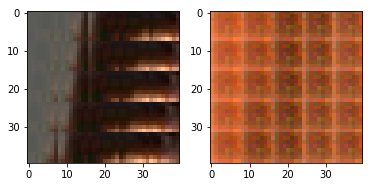

EPO: 0, recon_loss: 0.0637, total_loss: 0.0895, train_psnr:17.7304, validation_psnr:18.1352
EPO: 0, recon_loss: 0.0663, total_loss: 0.0808, train_psnr:17.6064, validation_psnr:18.1610
EPO: 0, recon_loss: 0.0774, total_loss: 0.1101, train_psnr:17.6795, validation_psnr:19.0197
EPO: 0, recon_loss: 0.0252, total_loss: 0.0444, train_psnr:17.7506, validation_psnr:18.9556
EPO: 0, recon_loss: 0.0436, total_loss: 0.0602, train_psnr:17.7981, validation_psnr:18.9499
EPO: 0, recon_loss: 0.0470, total_loss: 0.0625, train_psnr:17.7828, validation_psnr:19.5214
EPO: 0, recon_loss: 0.0469, total_loss: 0.0658, train_psnr:17.7732, validation_psnr:19.9056
EPO: 0, recon_loss: 0.0781, total_loss: 0.1053, train_psnr:17.8901, validation_psnr:19.2055
EPO: 0, recon_loss: 0.0506, total_loss: 0.0741, train_psnr:17.9150, validation_psnr:19.3286
EPO: 0, recon_loss: 0.0755, total_loss: 0.0996, train_psnr:17.8948, validation_psnr:19.1641
#########reconstruction test psnr: 18.6254 


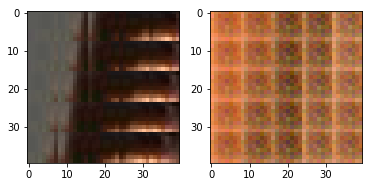

EPO: 0, recon_loss: 0.0550, total_loss: 0.0797, train_psnr:17.9240, validation_psnr:19.5438
EPO: 0, recon_loss: 0.0606, total_loss: 0.0895, train_psnr:17.8238, validation_psnr:20.1805
EPO: 0, recon_loss: 0.0752, total_loss: 0.1180, train_psnr:17.8713, validation_psnr:20.6143
EPO: 0, recon_loss: 0.0393, total_loss: 0.0642, train_psnr:17.8208, validation_psnr:19.9981
EPO: 0, recon_loss: 0.0897, total_loss: 0.1092, train_psnr:17.7033, validation_psnr:19.3024
EPO: 0, recon_loss: 0.0541, total_loss: 0.0754, train_psnr:17.6591, validation_psnr:19.5144
EPO: 0, recon_loss: 0.0687, total_loss: 0.0912, train_psnr:17.6162, validation_psnr:19.6787
EPO: 0, recon_loss: 0.0238, total_loss: 0.0276, train_psnr:17.6097, validation_psnr:19.8242
EPO: 0, recon_loss: 0.0281, total_loss: 0.0352, train_psnr:17.7396, validation_psnr:20.1395
EPO: 0, recon_loss: 0.0365, total_loss: 0.0504, train_psnr:17.7024, validation_psnr:19.7744
#########reconstruction test psnr: 19.2330 


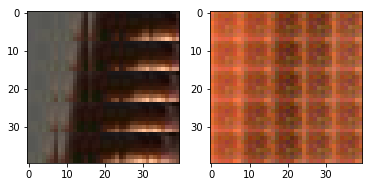

EPO: 0, recon_loss: 0.0377, total_loss: 0.0519, train_psnr:17.7400, validation_psnr:19.3729
EPO: 0, recon_loss: 0.0445, total_loss: 0.0526, train_psnr:17.7369, validation_psnr:19.5850
EPO: 0, recon_loss: 0.0809, total_loss: 0.1408, train_psnr:17.5313, validation_psnr:21.2485
EPO: 0, recon_loss: 0.0991, total_loss: 0.1410, train_psnr:17.5345, validation_psnr:21.5488
EPO: 0, recon_loss: 0.1054, total_loss: 0.1606, train_psnr:17.5657, validation_psnr:21.8481
EPO: 0, recon_loss: 0.1050, total_loss: 0.1464, train_psnr:17.6764, validation_psnr:21.9908
EPO: 0, recon_loss: 0.1009, total_loss: 0.1557, train_psnr:17.6118, validation_psnr:22.1683
EPO: 0, recon_loss: 0.0864, total_loss: 0.1372, train_psnr:17.8726, validation_psnr:20.1233
EPO: 0, recon_loss: 0.0616, total_loss: 0.0865, train_psnr:17.6470, validation_psnr:16.8861
EPO: 0, recon_loss: 0.0997, total_loss: 0.1372, train_psnr:17.7141, validation_psnr:20.0579
#########reconstruction test psnr: 19.2914 


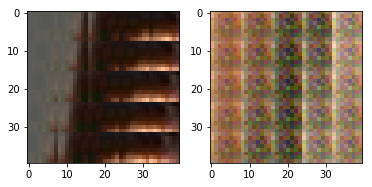

EPO: 0, recon_loss: 0.1272, total_loss: 0.1420, train_psnr:17.9057, validation_psnr:22.6678
EPO: 0, recon_loss: 0.0669, total_loss: 0.0903, train_psnr:18.0191, validation_psnr:22.9936
EPO: 0, recon_loss: 0.0372, total_loss: 0.1015, train_psnr:18.0820, validation_psnr:22.4257
EPO: 0, recon_loss: 0.0662, total_loss: 0.1018, train_psnr:18.0520, validation_psnr:22.5463
EPO: 0, recon_loss: 0.0753, total_loss: 0.1068, train_psnr:17.9888, validation_psnr:22.6508
EPO: 0, recon_loss: 0.0590, total_loss: 0.0808, train_psnr:17.9470, validation_psnr:22.8035
EPO: 0, recon_loss: 0.0528, total_loss: 0.0740, train_psnr:17.8039, validation_psnr:22.5428
EPO: 0, recon_loss: 0.0561, total_loss: 0.0756, train_psnr:17.7099, validation_psnr:21.3071
EPO: 0, recon_loss: 0.0388, total_loss: 0.0708, train_psnr:17.7195, validation_psnr:21.4807
EPO: 0, recon_loss: 0.0687, total_loss: 0.0945, train_psnr:17.7238, validation_psnr:21.6033
#########reconstruction test psnr: 20.8350 


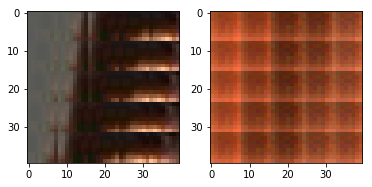

EPO: 0, recon_loss: 0.0415, total_loss: 0.0678, train_psnr:17.7633, validation_psnr:21.2792
EPO: 0, recon_loss: 0.0343, total_loss: 0.0640, train_psnr:17.7046, validation_psnr:21.2111
EPO: 0, recon_loss: 0.0545, total_loss: 0.0869, train_psnr:17.6809, validation_psnr:20.8053
EPO: 0, recon_loss: 0.0382, total_loss: 0.0640, train_psnr:17.9525, validation_psnr:20.5339
EPO: 0, recon_loss: 0.0896, total_loss: 0.1190, train_psnr:17.9996, validation_psnr:20.8869
EPO: 0, recon_loss: 0.1066, total_loss: 0.1191, train_psnr:18.0459, validation_psnr:19.9929
EPO: 0, recon_loss: 0.0866, total_loss: 0.1102, train_psnr:18.0283, validation_psnr:21.1155
EPO: 0, recon_loss: 0.0606, total_loss: 0.0841, train_psnr:17.9334, validation_psnr:21.5664
EPO: 0, recon_loss: 0.0380, total_loss: 0.0633, train_psnr:17.9789, validation_psnr:22.1146
EPO: 0, recon_loss: 0.1057, total_loss: 0.1158, train_psnr:17.9322, validation_psnr:21.9160
#########reconstruction test psnr: 20.9735 


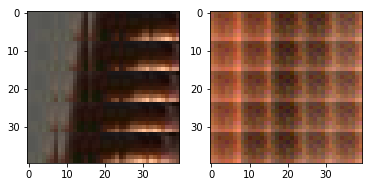

EPO: 0, recon_loss: 0.0644, total_loss: 0.0701, train_psnr:17.9358, validation_psnr:21.7638
EPO: 0, recon_loss: 0.0646, total_loss: 0.0776, train_psnr:17.9373, validation_psnr:21.4491
EPO: 0, recon_loss: 0.0577, total_loss: 0.0758, train_psnr:17.9971, validation_psnr:21.2938
EPO: 0, recon_loss: 0.0402, total_loss: 0.0654, train_psnr:18.0861, validation_psnr:22.0456
EPO: 0, recon_loss: 0.0732, total_loss: 0.0944, train_psnr:18.0981, validation_psnr:22.3643
EPO: 0, recon_loss: 0.0604, total_loss: 0.0724, train_psnr:18.0848, validation_psnr:22.1344
EPO: 0, recon_loss: 0.0369, total_loss: 0.0518, train_psnr:18.0983, validation_psnr:21.7921
EPO: 0, recon_loss: 0.0302, total_loss: 0.0451, train_psnr:18.0479, validation_psnr:21.7653
EPO: 0, recon_loss: 0.1320, total_loss: 0.1668, train_psnr:18.0274, validation_psnr:19.4373
EPO: 0, recon_loss: 0.0811, total_loss: 0.1001, train_psnr:17.7667, validation_psnr:18.4719
#########reconstruction test psnr: 17.8392 


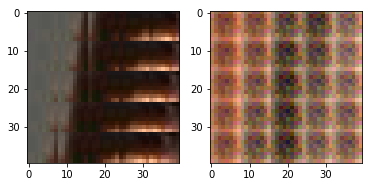

EPO: 0, recon_loss: 0.0674, total_loss: 0.0764, train_psnr:17.6191, validation_psnr:18.3951
EPO: 0, recon_loss: 0.0850, total_loss: 0.0988, train_psnr:17.5936, validation_psnr:18.5842
EPO: 0, recon_loss: 0.0536, total_loss: 0.0610, train_psnr:17.6176, validation_psnr:19.4853
EPO: 0, recon_loss: 0.0345, total_loss: 0.0993, train_psnr:17.5929, validation_psnr:22.4363
EPO: 0, recon_loss: 0.0219, total_loss: 0.0644, train_psnr:17.6367, validation_psnr:21.7283
EPO: 0, recon_loss: 0.0892, total_loss: 0.1018, train_psnr:17.7325, validation_psnr:20.9108
EPO: 0, recon_loss: 0.0654, total_loss: 0.0817, train_psnr:17.6737, validation_psnr:21.5029
EPO: 0, recon_loss: 0.0729, total_loss: 0.0837, train_psnr:17.6193, validation_psnr:21.1613
EPO: 0, recon_loss: 0.0254, total_loss: 0.0348, train_psnr:17.7148, validation_psnr:22.5788
EPO: 0, recon_loss: 0.0151, total_loss: 0.0245, train_psnr:17.9299, validation_psnr:22.6960
#########reconstruction test psnr: 21.6142 


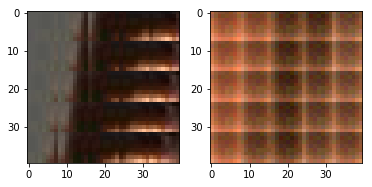

EPO: 0, recon_loss: 0.0353, total_loss: 0.0438, train_psnr:17.9365, validation_psnr:22.1655
EPO: 0, recon_loss: 0.0232, total_loss: 0.0322, train_psnr:17.9488, validation_psnr:22.4908
EPO: 0, recon_loss: 0.0272, total_loss: 0.0375, train_psnr:17.9637, validation_psnr:21.9294
EPO: 0, recon_loss: 0.0646, total_loss: 0.0764, train_psnr:17.8742, validation_psnr:20.0734
EPO: 0, recon_loss: 0.0621, total_loss: 0.0746, train_psnr:17.8308, validation_psnr:20.9542
EPO: 0, recon_loss: 0.0576, total_loss: 0.0660, train_psnr:17.7342, validation_psnr:20.7238
EPO: 0, recon_loss: 0.0293, total_loss: 0.0434, train_psnr:17.7457, validation_psnr:21.0408
EPO: 0, recon_loss: 0.0485, total_loss: 0.0517, train_psnr:17.7568, validation_psnr:21.2111
EPO: 0, recon_loss: 0.1057, total_loss: 0.1199, train_psnr:18.0114, validation_psnr:22.4454
EPO: 0, recon_loss: 0.0714, total_loss: 0.0882, train_psnr:18.2305, validation_psnr:22.8884
#########reconstruction test psnr: 21.8093 


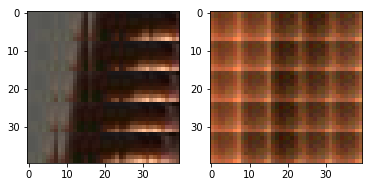

EPO: 0, recon_loss: 0.0563, total_loss: 0.0667, train_psnr:18.1299, validation_psnr:22.7880
EPO: 0, recon_loss: 0.0504, total_loss: 0.0637, train_psnr:18.0787, validation_psnr:22.5220
EPO: 0, recon_loss: 0.0445, total_loss: 0.0571, train_psnr:17.9740, validation_psnr:22.2913
EPO: 0, recon_loss: 0.0769, total_loss: 0.1272, train_psnr:18.1195, validation_psnr:22.4024
EPO: 0, recon_loss: 0.1609, total_loss: 0.1706, train_psnr:18.1369, validation_psnr:22.4627
EPO: 0, recon_loss: 0.0473, total_loss: 0.0632, train_psnr:18.0746, validation_psnr:21.9057
EPO: 0, recon_loss: 0.0649, total_loss: 0.0741, train_psnr:18.0035, validation_psnr:21.6950
EPO: 0, recon_loss: 0.0462, total_loss: 0.0605, train_psnr:17.8485, validation_psnr:21.5417
EPO: 0, recon_loss: 0.0591, total_loss: 0.0813, train_psnr:18.1176, validation_psnr:20.0716
EPO: 0, recon_loss: 0.0249, total_loss: 0.0535, train_psnr:18.1816, validation_psnr:19.8079
#########reconstruction test psnr: 19.2003 


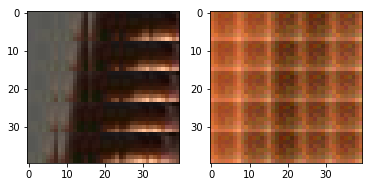

EPO: 0, recon_loss: 0.0430, total_loss: 0.0521, train_psnr:18.1316, validation_psnr:19.7425
EPO: 0, recon_loss: 0.0452, total_loss: 0.0632, train_psnr:18.1526, validation_psnr:19.4238
EPO: 0, recon_loss: 0.0424, total_loss: 0.0493, train_psnr:18.1042, validation_psnr:19.4512
EPO: 0, recon_loss: 0.0353, total_loss: 0.0973, train_psnr:17.9747, validation_psnr:22.6141
EPO: 0, recon_loss: 0.0190, total_loss: 0.0468, train_psnr:18.0744, validation_psnr:21.7964
EPO: 0, recon_loss: 0.0302, total_loss: 0.0537, train_psnr:18.0125, validation_psnr:21.7631
EPO: 0, recon_loss: 0.0160, total_loss: 0.0281, train_psnr:17.9714, validation_psnr:21.0577
EPO: 0, recon_loss: 0.0111, total_loss: 0.0187, train_psnr:17.9139, validation_psnr:21.4706
EPO: 0, recon_loss: 0.1304, total_loss: 0.1393, train_psnr:18.0168, validation_psnr:22.9266
EPO: 0, recon_loss: 0.0641, total_loss: 0.0755, train_psnr:18.2361, validation_psnr:22.6704
#########reconstruction test psnr: 21.6632 


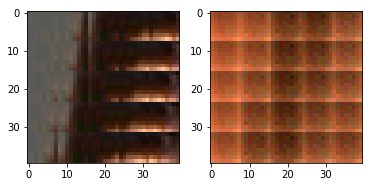

EPO: 0, recon_loss: 0.0916, total_loss: 0.0979, train_psnr:17.9558, validation_psnr:22.1716
EPO: 0, recon_loss: 0.0563, total_loss: 0.0709, train_psnr:17.7280, validation_psnr:22.6345
EPO: 0, recon_loss: 0.0653, total_loss: 0.0724, train_psnr:17.4697, validation_psnr:22.2363
EPO: 1, recon_loss: 0.0395, total_loss: 0.0555, train_psnr:17.4864, validation_psnr:22.1705
EPO: 1, recon_loss: 0.0142, total_loss: 0.0283, train_psnr:17.7743, validation_psnr:21.9210
EPO: 1, recon_loss: 0.0354, total_loss: 0.0404, train_psnr:17.8855, validation_psnr:22.1492
EPO: 1, recon_loss: 0.0390, total_loss: 0.0469, train_psnr:17.9073, validation_psnr:22.4248
EPO: 1, recon_loss: 0.0181, total_loss: 0.0259, train_psnr:17.8747, validation_psnr:22.2851
EPO: 1, recon_loss: 0.0348, total_loss: 0.0890, train_psnr:17.7370, validation_psnr:22.6679
EPO: 1, recon_loss: 0.0194, total_loss: 0.0419, train_psnr:17.6119, validation_psnr:22.4973
#########reconstruction test psnr: 21.5727 


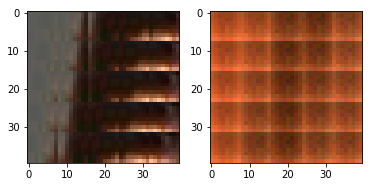

EPO: 1, recon_loss: 0.0322, total_loss: 0.0488, train_psnr:17.5923, validation_psnr:22.4053
EPO: 1, recon_loss: 0.0356, total_loss: 0.0455, train_psnr:17.4951, validation_psnr:22.1262
EPO: 1, recon_loss: 0.0445, total_loss: 0.0529, train_psnr:17.2993, validation_psnr:22.0568
EPO: 1, recon_loss: 0.0438, total_loss: 0.0739, train_psnr:17.2889, validation_psnr:22.1026
EPO: 1, recon_loss: 0.0352, total_loss: 0.0572, train_psnr:17.6997, validation_psnr:22.0221
EPO: 1, recon_loss: 0.0531, total_loss: 0.0694, train_psnr:17.9690, validation_psnr:22.1962
EPO: 1, recon_loss: 0.0326, total_loss: 0.0440, train_psnr:17.9934, validation_psnr:22.2780
EPO: 1, recon_loss: 0.0317, total_loss: 0.0373, train_psnr:18.1060, validation_psnr:21.6327
EPO: 1, recon_loss: 0.0710, total_loss: 0.0867, train_psnr:18.1039, validation_psnr:22.1883
EPO: 1, recon_loss: 0.0291, total_loss: 0.0428, train_psnr:17.8886, validation_psnr:23.4900
#########reconstruction test psnr: 22.2496 


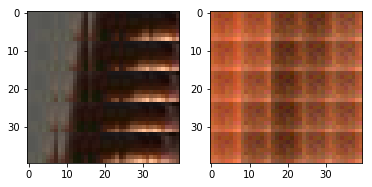

EPO: 1, recon_loss: 0.0383, total_loss: 0.0555, train_psnr:17.7093, validation_psnr:23.3142
EPO: 1, recon_loss: 0.0525, total_loss: 0.0636, train_psnr:17.6753, validation_psnr:23.0130
EPO: 1, recon_loss: 0.0341, total_loss: 0.0441, train_psnr:17.5566, validation_psnr:22.7890
EPO: 1, recon_loss: 0.0321, total_loss: 0.0452, train_psnr:17.5375, validation_psnr:22.7618
EPO: 1, recon_loss: 0.0269, total_loss: 0.0432, train_psnr:17.8981, validation_psnr:22.6271
EPO: 1, recon_loss: 0.0286, total_loss: 0.0425, train_psnr:17.9985, validation_psnr:22.5963
EPO: 1, recon_loss: 0.0585, total_loss: 0.0649, train_psnr:18.0554, validation_psnr:22.2793
EPO: 1, recon_loss: 0.0209, total_loss: 0.0344, train_psnr:18.1310, validation_psnr:22.0151
EPO: 1, recon_loss: 0.0263, total_loss: 0.0322, train_psnr:18.1183, validation_psnr:21.9718
EPO: 1, recon_loss: 0.1125, total_loss: 0.1318, train_psnr:18.1658, validation_psnr:20.3198
#########reconstruction test psnr: 19.5834 


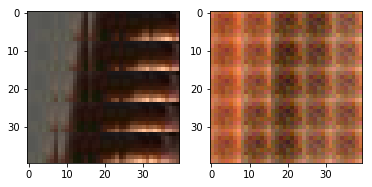

EPO: 1, recon_loss: 0.0620, total_loss: 0.0817, train_psnr:18.1814, validation_psnr:21.0876
EPO: 1, recon_loss: 0.0742, total_loss: 0.0893, train_psnr:18.1985, validation_psnr:22.3301
EPO: 1, recon_loss: 0.0643, total_loss: 0.0785, train_psnr:18.2037, validation_psnr:22.0507
EPO: 1, recon_loss: 0.0678, total_loss: 0.0782, train_psnr:18.1102, validation_psnr:21.4658
EPO: 1, recon_loss: 0.1110, total_loss: 0.1234, train_psnr:18.2530, validation_psnr:22.8130
EPO: 1, recon_loss: 0.0466, total_loss: 0.0567, train_psnr:18.3854, validation_psnr:22.6768
EPO: 1, recon_loss: 0.0548, total_loss: 0.0617, train_psnr:18.4065, validation_psnr:21.6932
EPO: 1, recon_loss: 0.0275, total_loss: 0.0332, train_psnr:18.4050, validation_psnr:21.5374
EPO: 1, recon_loss: 0.0450, total_loss: 0.0566, train_psnr:18.2352, validation_psnr:21.0743
EPO: 1, recon_loss: 0.0114, total_loss: 0.0174, train_psnr:18.1607, validation_psnr:20.8950
#########reconstruction test psnr: 20.0457 


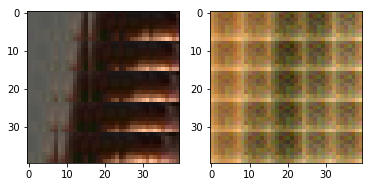

EPO: 1, recon_loss: 0.0176, total_loss: 0.0273, train_psnr:18.1363, validation_psnr:22.9072
EPO: 1, recon_loss: 0.0346, total_loss: 0.0506, train_psnr:18.1953, validation_psnr:22.6220
EPO: 1, recon_loss: 0.0284, total_loss: 0.0427, train_psnr:18.1124, validation_psnr:23.6591
EPO: 1, recon_loss: 0.0316, total_loss: 0.0557, train_psnr:18.1340, validation_psnr:23.2447
EPO: 1, recon_loss: 0.0554, total_loss: 0.0758, train_psnr:18.2381, validation_psnr:22.8009
EPO: 1, recon_loss: 0.0432, total_loss: 0.0685, train_psnr:18.3131, validation_psnr:23.4345
EPO: 1, recon_loss: 0.0559, total_loss: 0.0701, train_psnr:18.3344, validation_psnr:22.8490
EPO: 1, recon_loss: 0.0252, total_loss: 0.0412, train_psnr:18.3970, validation_psnr:22.9948
EPO: 1, recon_loss: 0.0480, total_loss: 0.0620, train_psnr:18.4064, validation_psnr:23.4531
EPO: 1, recon_loss: 0.1031, total_loss: 0.1315, train_psnr:18.3546, validation_psnr:24.0089
#########reconstruction test psnr: 22.6186 


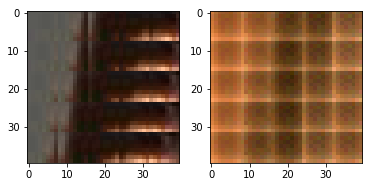

EPO: 1, recon_loss: 0.0334, total_loss: 0.0531, train_psnr:18.4704, validation_psnr:23.6047
EPO: 1, recon_loss: 0.0672, total_loss: 0.0752, train_psnr:18.4327, validation_psnr:23.8429
EPO: 1, recon_loss: 0.0247, total_loss: 0.0412, train_psnr:18.4630, validation_psnr:23.7837
EPO: 1, recon_loss: 0.0304, total_loss: 0.0400, train_psnr:18.4142, validation_psnr:23.8649
EPO: 1, recon_loss: 0.0642, total_loss: 0.0766, train_psnr:18.4781, validation_psnr:22.2792
EPO: 1, recon_loss: 0.0387, total_loss: 0.0490, train_psnr:18.5099, validation_psnr:22.0783
EPO: 1, recon_loss: 0.0423, total_loss: 0.0572, train_psnr:18.4094, validation_psnr:22.9569
EPO: 1, recon_loss: 0.0331, total_loss: 0.0417, train_psnr:18.5172, validation_psnr:22.4123
EPO: 1, recon_loss: 0.0493, total_loss: 0.0567, train_psnr:18.3409, validation_psnr:23.5375
EPO: 1, recon_loss: 0.1419, total_loss: 0.1542, train_psnr:18.0491, validation_psnr:23.7189
#########reconstruction test psnr: 22.5466 


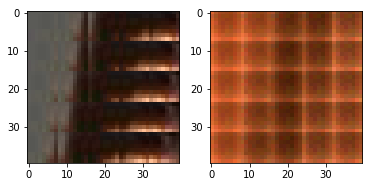

EPO: 1, recon_loss: 0.0556, total_loss: 0.0781, train_psnr:17.6577, validation_psnr:23.0227
EPO: 1, recon_loss: 0.0884, total_loss: 0.1068, train_psnr:17.4484, validation_psnr:22.6014
EPO: 1, recon_loss: 0.0505, total_loss: 0.0719, train_psnr:17.3487, validation_psnr:22.3995
EPO: 1, recon_loss: 0.0422, total_loss: 0.0653, train_psnr:17.0178, validation_psnr:21.8768
EPO: 1, recon_loss: 0.0736, total_loss: 0.0989, train_psnr:17.1316, validation_psnr:21.9618
EPO: 1, recon_loss: 0.0356, total_loss: 0.0525, train_psnr:17.5591, validation_psnr:21.6825
EPO: 1, recon_loss: 0.1107, total_loss: 0.1216, train_psnr:17.5457, validation_psnr:21.3811
EPO: 1, recon_loss: 0.0467, total_loss: 0.0633, train_psnr:17.8947, validation_psnr:20.0763
EPO: 1, recon_loss: 0.0594, total_loss: 0.0808, train_psnr:17.6616, validation_psnr:22.2246
EPO: 1, recon_loss: 0.1198, total_loss: 0.1424, train_psnr:17.8125, validation_psnr:22.6080
#########reconstruction test psnr: 21.7209 


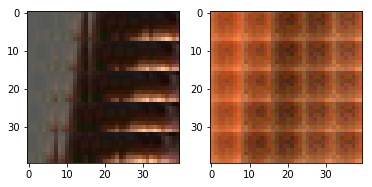

EPO: 1, recon_loss: 0.0373, total_loss: 0.0678, train_psnr:18.2663, validation_psnr:23.1931
EPO: 1, recon_loss: 0.0601, total_loss: 0.0753, train_psnr:18.4296, validation_psnr:22.2451
EPO: 1, recon_loss: 0.0438, total_loss: 0.0632, train_psnr:18.5212, validation_psnr:21.4338
EPO: 1, recon_loss: 0.0446, total_loss: 0.0672, train_psnr:18.5655, validation_psnr:21.3663
EPO: 1, recon_loss: 0.0885, total_loss: 0.1190, train_psnr:18.5754, validation_psnr:21.2529
EPO: 1, recon_loss: 0.0602, total_loss: 0.1008, train_psnr:18.6408, validation_psnr:22.6040
EPO: 1, recon_loss: 0.1079, total_loss: 0.1400, train_psnr:18.6181, validation_psnr:23.2627
EPO: 1, recon_loss: 0.0998, total_loss: 0.1294, train_psnr:18.6514, validation_psnr:23.3657
EPO: 1, recon_loss: 0.0564, total_loss: 0.0907, train_psnr:18.6132, validation_psnr:23.4077
EPO: 1, recon_loss: 0.1254, total_loss: 0.1632, train_psnr:18.5377, validation_psnr:23.5688
#########reconstruction test psnr: 22.5008 


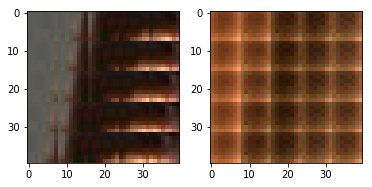

EPO: 1, recon_loss: 0.0633, total_loss: 0.0998, train_psnr:18.2577, validation_psnr:23.6998
EPO: 1, recon_loss: 0.0881, total_loss: 0.1211, train_psnr:18.2653, validation_psnr:22.9153
EPO: 1, recon_loss: 0.0863, total_loss: 0.1208, train_psnr:18.2842, validation_psnr:22.6142
EPO: 1, recon_loss: 0.0690, total_loss: 0.1086, train_psnr:18.2521, validation_psnr:22.3653
EPO: 1, recon_loss: 0.0505, total_loss: 0.0874, train_psnr:18.1498, validation_psnr:21.9661
EPO: 1, recon_loss: 0.0483, total_loss: 0.0922, train_psnr:18.6430, validation_psnr:22.8120
EPO: 1, recon_loss: 0.1199, total_loss: 0.1364, train_psnr:18.7830, validation_psnr:21.6075
EPO: 1, recon_loss: 0.0871, total_loss: 0.0967, train_psnr:18.7661, validation_psnr:21.0383
EPO: 1, recon_loss: 0.0353, total_loss: 0.0439, train_psnr:18.6991, validation_psnr:20.2002
EPO: 1, recon_loss: 0.0295, total_loss: 0.0380, train_psnr:18.6051, validation_psnr:20.2956
#########reconstruction test psnr: 19.6491 


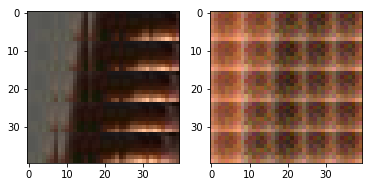

EPO: 1, recon_loss: 0.0291, total_loss: 0.0460, train_psnr:18.8117, validation_psnr:21.2336
EPO: 1, recon_loss: 0.0526, total_loss: 0.0715, train_psnr:18.7980, validation_psnr:22.4965
EPO: 1, recon_loss: 0.0527, total_loss: 0.0691, train_psnr:18.6896, validation_psnr:22.9867
EPO: 1, recon_loss: 0.0407, total_loss: 0.0647, train_psnr:18.6357, validation_psnr:23.5401
EPO: 1, recon_loss: 0.0571, total_loss: 0.0815, train_psnr:18.5481, validation_psnr:23.7841
EPO: 1, recon_loss: 0.0109, total_loss: 0.0203, train_psnr:18.3586, validation_psnr:24.0138
EPO: 1, recon_loss: 0.0158, total_loss: 0.0216, train_psnr:18.1459, validation_psnr:23.9084
EPO: 1, recon_loss: 0.0201, total_loss: 0.0274, train_psnr:17.6220, validation_psnr:23.4762
EPO: 1, recon_loss: 0.0092, total_loss: 0.0114, train_psnr:17.5639, validation_psnr:23.0056
EPO: 1, recon_loss: 0.0236, total_loss: 0.0296, train_psnr:17.2530, validation_psnr:22.1469
#########reconstruction test psnr: 21.1910 


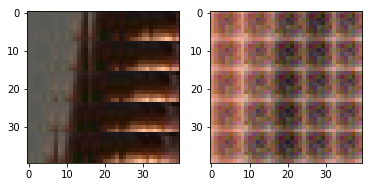

EPO: 1, recon_loss: 0.0573, total_loss: 0.0746, train_psnr:17.6651, validation_psnr:22.8947
EPO: 1, recon_loss: 0.0445, total_loss: 0.0538, train_psnr:18.0970, validation_psnr:22.6729
EPO: 1, recon_loss: 0.0542, total_loss: 0.0619, train_psnr:18.1339, validation_psnr:22.2436
EPO: 1, recon_loss: 0.0301, total_loss: 0.0387, train_psnr:18.3063, validation_psnr:22.0677
EPO: 1, recon_loss: 0.0319, total_loss: 0.0411, train_psnr:18.3087, validation_psnr:22.4471
EPO: 1, recon_loss: 0.0719, total_loss: 0.0989, train_psnr:18.6946, validation_psnr:22.4137
EPO: 1, recon_loss: 0.1051, total_loss: 0.1297, train_psnr:18.7271, validation_psnr:21.9953
EPO: 1, recon_loss: 0.0962, total_loss: 0.1186, train_psnr:18.7247, validation_psnr:21.8806
EPO: 1, recon_loss: 0.0727, total_loss: 0.0870, train_psnr:18.8885, validation_psnr:22.1196
EPO: 1, recon_loss: 0.0401, total_loss: 0.0542, train_psnr:18.8550, validation_psnr:21.1151
#########reconstruction test psnr: 20.4286 


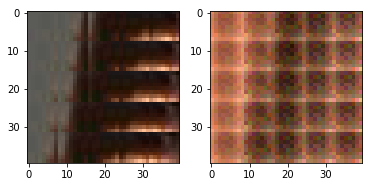

EPO: 1, recon_loss: 0.0469, total_loss: 0.0582, train_psnr:18.9773, validation_psnr:21.2625
EPO: 1, recon_loss: 0.0305, total_loss: 0.0383, train_psnr:19.0421, validation_psnr:21.4932
EPO: 1, recon_loss: 0.0411, total_loss: 0.0530, train_psnr:19.0104, validation_psnr:21.9880
EPO: 1, recon_loss: 0.0247, total_loss: 0.0324, train_psnr:19.0395, validation_psnr:22.0378
EPO: 1, recon_loss: 0.0343, total_loss: 0.0429, train_psnr:18.9666, validation_psnr:22.1541
EPO: 1, recon_loss: 0.0722, total_loss: 0.1082, train_psnr:18.9817, validation_psnr:23.2117
EPO: 1, recon_loss: 0.0165, total_loss: 0.0373, train_psnr:19.0619, validation_psnr:22.7973
EPO: 1, recon_loss: 0.0623, total_loss: 0.0763, train_psnr:19.0215, validation_psnr:23.0029
EPO: 1, recon_loss: 0.0319, total_loss: 0.0440, train_psnr:19.0370, validation_psnr:22.9876
EPO: 1, recon_loss: 0.0504, total_loss: 0.0615, train_psnr:19.0221, validation_psnr:23.2975
#########reconstruction test psnr: 22.1772 


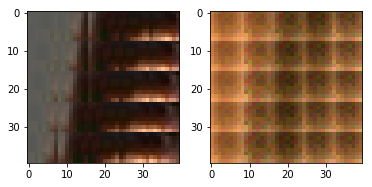

EPO: 1, recon_loss: 0.0211, total_loss: 0.0270, train_psnr:19.1083, validation_psnr:22.7219
EPO: 1, recon_loss: 0.0173, total_loss: 0.0239, train_psnr:19.0966, validation_psnr:22.7651
EPO: 1, recon_loss: 0.0337, total_loss: 0.0432, train_psnr:19.0121, validation_psnr:22.7048
EPO: 1, recon_loss: 0.0155, total_loss: 0.0234, train_psnr:19.0227, validation_psnr:22.5834
EPO: 1, recon_loss: 0.0151, total_loss: 0.0209, train_psnr:18.8717, validation_psnr:22.6058
EPO: 1, recon_loss: 0.0592, total_loss: 0.0780, train_psnr:18.9274, validation_psnr:22.6458
EPO: 1, recon_loss: 0.0328, total_loss: 0.0479, train_psnr:19.0323, validation_psnr:22.2690
EPO: 1, recon_loss: 0.0494, total_loss: 0.0642, train_psnr:19.0907, validation_psnr:22.4045
EPO: 1, recon_loss: 0.0310, total_loss: 0.0466, train_psnr:19.0856, validation_psnr:22.4242
EPO: 1, recon_loss: 0.0171, total_loss: 0.0334, train_psnr:19.0556, validation_psnr:21.3809
#########reconstruction test psnr: 20.7669 


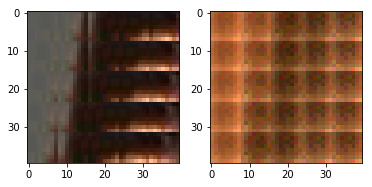

EPO: 1, recon_loss: 0.0780, total_loss: 0.1089, train_psnr:19.0857, validation_psnr:22.9451
EPO: 1, recon_loss: 0.0373, total_loss: 0.0646, train_psnr:19.1145, validation_psnr:23.6667
EPO: 1, recon_loss: 0.0665, total_loss: 0.0837, train_psnr:19.1323, validation_psnr:23.3872
EPO: 1, recon_loss: 0.0427, total_loss: 0.0568, train_psnr:19.1822, validation_psnr:22.8901
EPO: 1, recon_loss: 0.0615, total_loss: 0.0754, train_psnr:19.2019, validation_psnr:23.1494
EPO: 1, recon_loss: 0.0720, total_loss: 0.0918, train_psnr:19.0024, validation_psnr:24.1969
EPO: 1, recon_loss: 0.0115, total_loss: 0.0249, train_psnr:18.9567, validation_psnr:21.0646
EPO: 1, recon_loss: 0.0598, total_loss: 0.0667, train_psnr:18.8003, validation_psnr:20.2396
EPO: 1, recon_loss: 0.0375, total_loss: 0.0459, train_psnr:18.5387, validation_psnr:19.1142
EPO: 1, recon_loss: 0.0411, total_loss: 0.0561, train_psnr:18.5227, validation_psnr:20.6177
#########reconstruction test psnr: 19.9626 


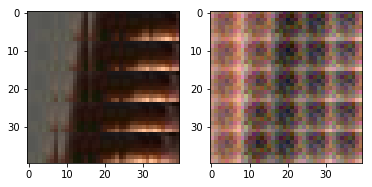

EPO: 1, recon_loss: 0.0659, total_loss: 0.0922, train_psnr:18.4648, validation_psnr:23.3085
EPO: 1, recon_loss: 0.0466, total_loss: 0.0663, train_psnr:19.1009, validation_psnr:23.1435
EPO: 1, recon_loss: 0.0397, total_loss: 0.0620, train_psnr:19.1433, validation_psnr:23.6794
EPO: 1, recon_loss: 0.0578, total_loss: 0.0715, train_psnr:19.1033, validation_psnr:23.9477
EPO: 1, recon_loss: 0.0255, total_loss: 0.0363, train_psnr:19.0886, validation_psnr:23.7658
EPO: 1, recon_loss: 0.0543, total_loss: 0.0737, train_psnr:18.9839, validation_psnr:23.2711
EPO: 1, recon_loss: 0.0274, total_loss: 0.0358, train_psnr:18.9500, validation_psnr:22.4552
EPO: 1, recon_loss: 0.0461, total_loss: 0.0583, train_psnr:18.9537, validation_psnr:22.3738
EPO: 1, recon_loss: 0.0583, total_loss: 0.0696, train_psnr:19.0133, validation_psnr:22.3018
EPO: 1, recon_loss: 0.0305, total_loss: 0.0396, train_psnr:18.9086, validation_psnr:21.9304
#########reconstruction test psnr: 21.2207 


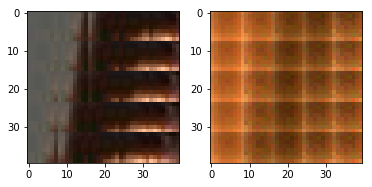

EPO: 1, recon_loss: 0.0305, total_loss: 0.0419, train_psnr:18.8343, validation_psnr:21.6783
EPO: 1, recon_loss: 0.0327, total_loss: 0.0529, train_psnr:18.9366, validation_psnr:22.0694
EPO: 1, recon_loss: 0.0336, total_loss: 0.0533, train_psnr:19.0544, validation_psnr:22.6256
EPO: 1, recon_loss: 0.0502, total_loss: 0.0637, train_psnr:19.0895, validation_psnr:23.0297
EPO: 1, recon_loss: 0.0425, total_loss: 0.0641, train_psnr:19.0517, validation_psnr:22.5476
EPO: 1, recon_loss: 0.0466, total_loss: 0.0587, train_psnr:18.9109, validation_psnr:22.6757
EPO: 1, recon_loss: 0.0309, total_loss: 0.0511, train_psnr:19.0525, validation_psnr:22.9026
EPO: 1, recon_loss: 0.0165, total_loss: 0.0282, train_psnr:19.1200, validation_psnr:22.7537
EPO: 1, recon_loss: 0.0277, total_loss: 0.0392, train_psnr:19.1724, validation_psnr:23.3120
EPO: 1, recon_loss: 0.0291, total_loss: 0.0440, train_psnr:19.1679, validation_psnr:23.8707
#########reconstruction test psnr: 22.7030 


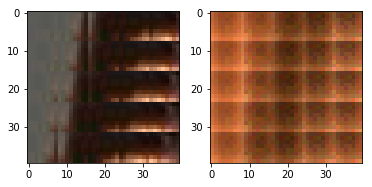

EPO: 1, recon_loss: 0.0338, total_loss: 0.0547, train_psnr:19.1415, validation_psnr:24.3114
EPO: 1, recon_loss: 0.0371, total_loss: 0.0577, train_psnr:19.3354, validation_psnr:22.7101
EPO: 1, recon_loss: 0.0417, total_loss: 0.0575, train_psnr:19.3487, validation_psnr:22.7817
EPO: 1, recon_loss: 0.0701, total_loss: 0.0874, train_psnr:19.3502, validation_psnr:22.6549
EPO: 1, recon_loss: 0.0441, total_loss: 0.0634, train_psnr:19.4163, validation_psnr:23.0030
EPO: 1, recon_loss: 0.0596, total_loss: 0.0818, train_psnr:19.2964, validation_psnr:23.6190
EPO: 1, recon_loss: 0.0405, total_loss: 0.0624, train_psnr:19.4202, validation_psnr:22.7711
EPO: 1, recon_loss: 0.0245, total_loss: 0.0419, train_psnr:19.2512, validation_psnr:23.2203
EPO: 1, recon_loss: 0.0751, total_loss: 0.0902, train_psnr:19.1971, validation_psnr:22.9297
EPO: 1, recon_loss: 0.0421, total_loss: 0.0590, train_psnr:19.1868, validation_psnr:23.5067
#########reconstruction test psnr: 22.3050 


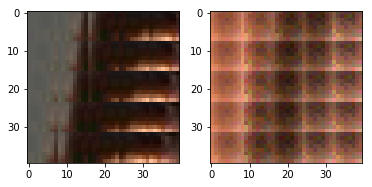

EPO: 1, recon_loss: 0.0593, total_loss: 0.0723, train_psnr:19.1236, validation_psnr:23.5309
EPO: 1, recon_loss: 0.0135, total_loss: 0.0187, train_psnr:19.1512, validation_psnr:23.2802
EPO: 1, recon_loss: 0.0165, total_loss: 0.0232, train_psnr:19.2106, validation_psnr:23.5417
EPO: 1, recon_loss: 0.0322, total_loss: 0.0413, train_psnr:19.1310, validation_psnr:23.4973
EPO: 1, recon_loss: 0.0188, total_loss: 0.0330, train_psnr:19.2497, validation_psnr:23.2497
EPO: 1, recon_loss: 0.0451, total_loss: 0.0525, train_psnr:19.1807, validation_psnr:23.6655
EPO: 1, recon_loss: 0.0541, total_loss: 0.0980, train_psnr:19.0737, validation_psnr:24.7107
EPO: 1, recon_loss: 0.0529, total_loss: 0.0900, train_psnr:19.0920, validation_psnr:24.8030
EPO: 1, recon_loss: 0.0676, total_loss: 0.1156, train_psnr:19.0419, validation_psnr:24.9397
EPO: 1, recon_loss: 0.0632, total_loss: 0.0951, train_psnr:19.1962, validation_psnr:24.6704
#########reconstruction test psnr: 23.3092 


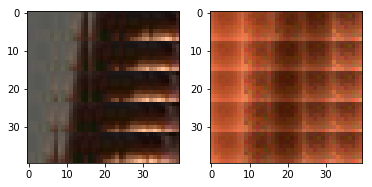

EPO: 1, recon_loss: 0.0700, total_loss: 0.1147, train_psnr:19.1430, validation_psnr:24.8100
EPO: 1, recon_loss: 0.0587, total_loss: 0.0878, train_psnr:19.4408, validation_psnr:22.1932
EPO: 1, recon_loss: 0.0480, total_loss: 0.0588, train_psnr:19.3220, validation_psnr:18.8989
EPO: 1, recon_loss: 0.0527, total_loss: 0.0913, train_psnr:19.3313, validation_psnr:24.3624
EPO: 1, recon_loss: 0.0568, total_loss: 0.0778, train_psnr:19.7332, validation_psnr:25.0651
EPO: 1, recon_loss: 0.0406, total_loss: 0.0607, train_psnr:19.7674, validation_psnr:24.8768
EPO: 1, recon_loss: 0.0346, total_loss: 0.0759, train_psnr:19.7239, validation_psnr:24.8295
EPO: 1, recon_loss: 0.0390, total_loss: 0.0691, train_psnr:19.7195, validation_psnr:24.9301
EPO: 1, recon_loss: 0.0593, total_loss: 0.0837, train_psnr:19.6289, validation_psnr:25.0078
EPO: 1, recon_loss: 0.0304, total_loss: 0.0507, train_psnr:19.5873, validation_psnr:24.9297
#########reconstruction test psnr: 23.6158 


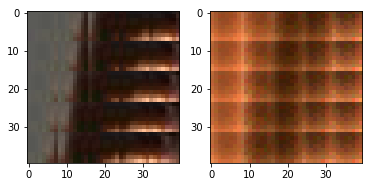

EPO: 1, recon_loss: 0.0285, total_loss: 0.0468, train_psnr:19.3886, validation_psnr:24.5098
EPO: 1, recon_loss: 0.0614, total_loss: 0.0801, train_psnr:19.2594, validation_psnr:23.6845
EPO: 1, recon_loss: 0.0184, total_loss: 0.0441, train_psnr:19.2883, validation_psnr:24.1134
EPO: 1, recon_loss: 0.0473, total_loss: 0.0668, train_psnr:19.2686, validation_psnr:24.3607
EPO: 1, recon_loss: 0.0187, total_loss: 0.0413, train_psnr:19.2896, validation_psnr:24.0847
EPO: 1, recon_loss: 0.0201, total_loss: 0.0408, train_psnr:19.2224, validation_psnr:24.0011
EPO: 1, recon_loss: 0.0297, total_loss: 0.0505, train_psnr:19.3349, validation_psnr:22.8996
EPO: 1, recon_loss: 0.0208, total_loss: 0.0444, train_psnr:19.5310, validation_psnr:23.4206
EPO: 1, recon_loss: 0.0724, total_loss: 0.0883, train_psnr:19.6334, validation_psnr:22.8709
EPO: 1, recon_loss: 0.0585, total_loss: 0.0799, train_psnr:19.7104, validation_psnr:23.2553
#########reconstruction test psnr: 22.3737 


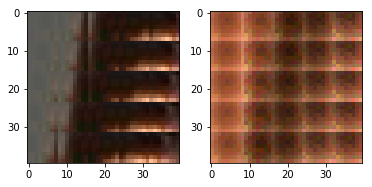

EPO: 1, recon_loss: 0.0371, total_loss: 0.0569, train_psnr:19.7083, validation_psnr:23.8357
EPO: 1, recon_loss: 0.0761, total_loss: 0.1115, train_psnr:19.5748, validation_psnr:24.9655
EPO: 1, recon_loss: 0.0203, total_loss: 0.0413, train_psnr:19.6607, validation_psnr:24.4736
EPO: 1, recon_loss: 0.0940, total_loss: 0.1104, train_psnr:19.6710, validation_psnr:24.3388
EPO: 1, recon_loss: 0.0297, total_loss: 0.0383, train_psnr:19.6876, validation_psnr:23.7224
EPO: 1, recon_loss: 0.0399, total_loss: 0.0526, train_psnr:19.6749, validation_psnr:23.6258
EPO: 1, recon_loss: 0.0455, total_loss: 0.0694, train_psnr:19.7155, validation_psnr:24.4136
EPO: 1, recon_loss: 0.0196, total_loss: 0.0399, train_psnr:19.9065, validation_psnr:24.1778
EPO: 1, recon_loss: 0.0451, total_loss: 0.0631, train_psnr:19.9310, validation_psnr:24.4748
EPO: 1, recon_loss: 0.0221, total_loss: 0.0375, train_psnr:19.8859, validation_psnr:24.3522
#########reconstruction test psnr: 23.2203 


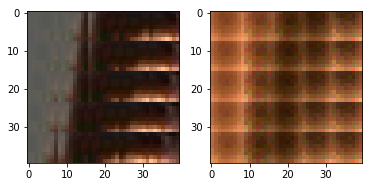

EPO: 1, recon_loss: 0.0254, total_loss: 0.0378, train_psnr:19.8851, validation_psnr:24.2559
EPO: 1, recon_loss: 0.0710, total_loss: 0.0960, train_psnr:19.9013, validation_psnr:23.5695
EPO: 1, recon_loss: 0.0898, total_loss: 0.1150, train_psnr:19.7968, validation_psnr:21.4204
EPO: 1, recon_loss: 0.0512, total_loss: 0.0668, train_psnr:19.5822, validation_psnr:20.4793
EPO: 1, recon_loss: 0.0578, total_loss: 0.0726, train_psnr:19.4362, validation_psnr:20.6685
EPO: 1, recon_loss: 0.0585, total_loss: 0.0722, train_psnr:19.4011, validation_psnr:20.8351
EPO: 1, recon_loss: 0.0247, total_loss: 0.0366, train_psnr:19.4114, validation_psnr:22.1776
EPO: 1, recon_loss: 0.0172, total_loss: 0.0590, train_psnr:19.4930, validation_psnr:24.1083
EPO: 1, recon_loss: 0.0322, total_loss: 0.0576, train_psnr:19.5324, validation_psnr:23.8018
EPO: 1, recon_loss: 0.0573, total_loss: 0.0761, train_psnr:19.5766, validation_psnr:23.7288
#########reconstruction test psnr: 22.6739 


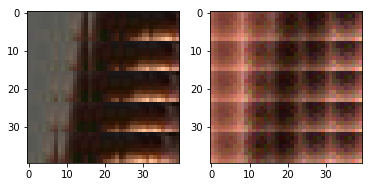

EPO: 1, recon_loss: 0.0439, total_loss: 0.0600, train_psnr:19.5297, validation_psnr:24.3648
EPO: 1, recon_loss: 0.0561, total_loss: 0.0714, train_psnr:19.4347, validation_psnr:23.5112
EPO: 1, recon_loss: 0.0142, total_loss: 0.0204, train_psnr:19.5767, validation_psnr:24.6941
EPO: 1, recon_loss: 0.0237, total_loss: 0.0306, train_psnr:19.7664, validation_psnr:24.7055
EPO: 1, recon_loss: 0.0197, total_loss: 0.0277, train_psnr:19.6772, validation_psnr:24.6972
EPO: 1, recon_loss: 0.0116, total_loss: 0.0197, train_psnr:19.8288, validation_psnr:24.7097
EPO: 1, recon_loss: 0.0221, total_loss: 0.0305, train_psnr:19.7327, validation_psnr:24.5142
EPO: 1, recon_loss: 0.0465, total_loss: 0.0624, train_psnr:19.6094, validation_psnr:23.3520
EPO: 1, recon_loss: 0.0369, total_loss: 0.0486, train_psnr:19.6191, validation_psnr:23.2363
EPO: 1, recon_loss: 0.0406, total_loss: 0.0529, train_psnr:19.5518, validation_psnr:23.6110
#########reconstruction test psnr: 22.5247 


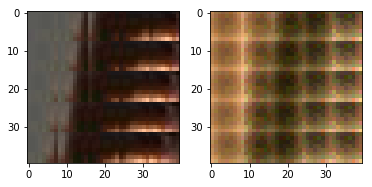

EPO: 1, recon_loss: 0.0248, total_loss: 0.0344, train_psnr:19.6051, validation_psnr:23.2785
EPO: 1, recon_loss: 0.0338, total_loss: 0.0401, train_psnr:19.5724, validation_psnr:23.4081
EPO: 1, recon_loss: 0.0573, total_loss: 0.0743, train_psnr:20.0974, validation_psnr:24.4341
EPO: 1, recon_loss: 0.0448, total_loss: 0.0603, train_psnr:20.1720, validation_psnr:24.7088
EPO: 1, recon_loss: 0.0462, total_loss: 0.0566, train_psnr:20.0519, validation_psnr:24.6987
EPO: 1, recon_loss: 0.0378, total_loss: 0.0484, train_psnr:19.9336, validation_psnr:24.4095
EPO: 1, recon_loss: 0.0358, total_loss: 0.0475, train_psnr:19.7787, validation_psnr:24.3178
EPO: 1, recon_loss: 0.0624, total_loss: 0.1010, train_psnr:19.9120, validation_psnr:24.7841
EPO: 1, recon_loss: 0.0673, total_loss: 0.0823, train_psnr:19.9807, validation_psnr:24.5606
EPO: 1, recon_loss: 0.0416, total_loss: 0.0544, train_psnr:19.9771, validation_psnr:24.3219
#########reconstruction test psnr: 23.2272 


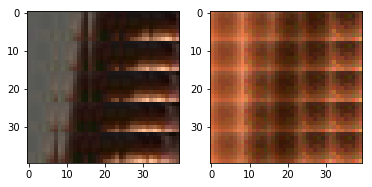

EPO: 1, recon_loss: 0.0366, total_loss: 0.0451, train_psnr:19.8233, validation_psnr:23.7221
EPO: 1, recon_loss: 0.0308, total_loss: 0.0453, train_psnr:19.6805, validation_psnr:24.0026
EPO: 1, recon_loss: 0.0189, total_loss: 0.0400, train_psnr:20.0022, validation_psnr:22.3346
EPO: 1, recon_loss: 0.0241, total_loss: 0.0439, train_psnr:20.0561, validation_psnr:22.0613
EPO: 1, recon_loss: 0.0284, total_loss: 0.0359, train_psnr:20.0089, validation_psnr:21.9839
EPO: 1, recon_loss: 0.0310, total_loss: 0.0491, train_psnr:20.0365, validation_psnr:21.4974
EPO: 1, recon_loss: 0.0340, total_loss: 0.0434, train_psnr:19.9510, validation_psnr:21.9824
EPO: 1, recon_loss: 0.0216, total_loss: 0.0621, train_psnr:19.9264, validation_psnr:24.5439
EPO: 1, recon_loss: 0.0092, total_loss: 0.0312, train_psnr:19.9447, validation_psnr:24.2167
EPO: 1, recon_loss: 0.0249, total_loss: 0.0422, train_psnr:19.8630, validation_psnr:23.5950
#########reconstruction test psnr: 22.5895 


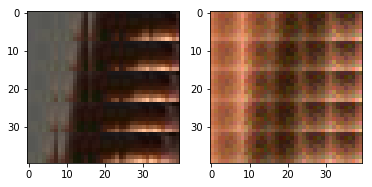

EPO: 1, recon_loss: 0.0065, total_loss: 0.0152, train_psnr:19.8024, validation_psnr:23.6079
EPO: 1, recon_loss: 0.0068, total_loss: 0.0136, train_psnr:19.7391, validation_psnr:23.5319
EPO: 1, recon_loss: 0.0599, total_loss: 0.0763, train_psnr:20.0992, validation_psnr:25.0845
EPO: 1, recon_loss: 0.0452, total_loss: 0.0574, train_psnr:20.0500, validation_psnr:24.1867
EPO: 1, recon_loss: 0.0483, total_loss: 0.0633, train_psnr:19.6475, validation_psnr:24.0764
EPO: 1, recon_loss: 0.0325, total_loss: 0.0482, train_psnr:19.4357, validation_psnr:24.2253
EPO: 1, recon_loss: 0.0307, total_loss: 0.0420, train_psnr:19.1832, validation_psnr:23.9314
EPO: 2, recon_loss: 0.0177, total_loss: 0.0317, train_psnr:19.3168, validation_psnr:23.6461
EPO: 2, recon_loss: 0.0087, total_loss: 0.0187, train_psnr:19.6328, validation_psnr:23.7800
EPO: 2, recon_loss: 0.0257, total_loss: 0.0338, train_psnr:19.7072, validation_psnr:23.9188
#########reconstruction test psnr: 23.0128 


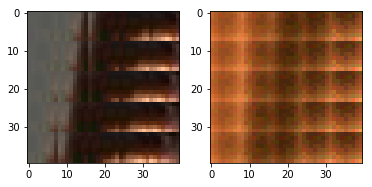

EPO: 2, recon_loss: 0.0125, total_loss: 0.0210, train_psnr:19.7169, validation_psnr:24.4692
EPO: 2, recon_loss: 0.0107, total_loss: 0.0181, train_psnr:19.6580, validation_psnr:24.4434
EPO: 2, recon_loss: 0.0162, total_loss: 0.0478, train_psnr:19.5339, validation_psnr:24.4520
EPO: 2, recon_loss: 0.0112, total_loss: 0.0294, train_psnr:19.3903, validation_psnr:24.3519
EPO: 2, recon_loss: 0.0162, total_loss: 0.0329, train_psnr:19.3632, validation_psnr:24.1068
EPO: 2, recon_loss: 0.0158, total_loss: 0.0228, train_psnr:19.2236, validation_psnr:24.0133
EPO: 2, recon_loss: 0.0261, total_loss: 0.0389, train_psnr:18.9924, validation_psnr:24.0459
EPO: 2, recon_loss: 0.0184, total_loss: 0.0502, train_psnr:19.1384, validation_psnr:23.6241
EPO: 2, recon_loss: 0.0186, total_loss: 0.0370, train_psnr:19.5478, validation_psnr:23.9536
EPO: 2, recon_loss: 0.0259, total_loss: 0.0423, train_psnr:19.7979, validation_psnr:23.9401
#########reconstruction test psnr: 22.9538 


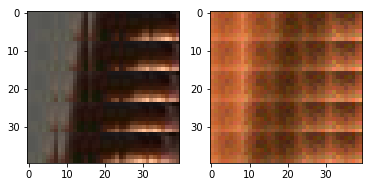

EPO: 2, recon_loss: 0.0162, total_loss: 0.0262, train_psnr:19.8439, validation_psnr:24.3546
EPO: 2, recon_loss: 0.0219, total_loss: 0.0329, train_psnr:19.9187, validation_psnr:24.1626
EPO: 2, recon_loss: 0.0265, total_loss: 0.0415, train_psnr:19.8828, validation_psnr:25.1889
EPO: 2, recon_loss: 0.0204, total_loss: 0.0358, train_psnr:19.6452, validation_psnr:25.0749
EPO: 2, recon_loss: 0.0245, total_loss: 0.0374, train_psnr:19.4755, validation_psnr:24.8023
EPO: 2, recon_loss: 0.0234, total_loss: 0.0369, train_psnr:19.4103, validation_psnr:24.7826
EPO: 2, recon_loss: 0.0160, total_loss: 0.0257, train_psnr:19.2866, validation_psnr:24.3998
EPO: 2, recon_loss: 0.0374, total_loss: 0.0515, train_psnr:19.3529, validation_psnr:24.6695
EPO: 2, recon_loss: 0.0196, total_loss: 0.0322, train_psnr:19.6470, validation_psnr:24.6871
EPO: 2, recon_loss: 0.0280, total_loss: 0.0390, train_psnr:19.7788, validation_psnr:24.6162
#########reconstruction test psnr: 23.3893 


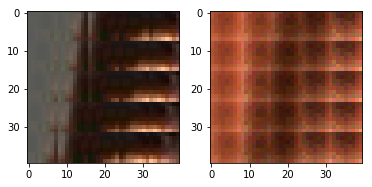

EPO: 2, recon_loss: 0.0382, total_loss: 0.0489, train_psnr:19.8533, validation_psnr:24.6532
EPO: 2, recon_loss: 0.0140, total_loss: 0.0223, train_psnr:19.9017, validation_psnr:24.3876
EPO: 2, recon_loss: 0.0257, total_loss: 0.0395, train_psnr:19.9124, validation_psnr:24.2778
EPO: 2, recon_loss: 0.0393, total_loss: 0.0584, train_psnr:20.0090, validation_psnr:23.0224
EPO: 2, recon_loss: 0.0414, total_loss: 0.0585, train_psnr:20.0891, validation_psnr:23.7536
EPO: 2, recon_loss: 0.0506, total_loss: 0.0662, train_psnr:20.1486, validation_psnr:24.0706
EPO: 2, recon_loss: 0.0620, total_loss: 0.0787, train_psnr:20.1418, validation_psnr:23.9898
EPO: 2, recon_loss: 0.0407, total_loss: 0.0525, train_psnr:20.0262, validation_psnr:23.3228
EPO: 2, recon_loss: 0.0398, total_loss: 0.0552, train_psnr:20.3579, validation_psnr:23.9933
EPO: 2, recon_loss: 0.0398, total_loss: 0.0525, train_psnr:20.4252, validation_psnr:23.8408
#########reconstruction test psnr: 22.8613 


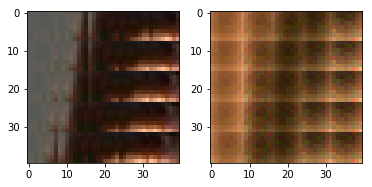

EPO: 2, recon_loss: 0.0286, total_loss: 0.0397, train_psnr:20.4029, validation_psnr:23.3696
EPO: 2, recon_loss: 0.0214, total_loss: 0.0273, train_psnr:20.3416, validation_psnr:23.0325
EPO: 2, recon_loss: 0.0407, total_loss: 0.0489, train_psnr:20.0745, validation_psnr:22.5844
EPO: 2, recon_loss: 0.0073, total_loss: 0.0128, train_psnr:20.0178, validation_psnr:23.0377
EPO: 2, recon_loss: 0.0166, total_loss: 0.0290, train_psnr:20.0481, validation_psnr:25.0825
EPO: 2, recon_loss: 0.0228, total_loss: 0.0354, train_psnr:20.1068, validation_psnr:24.9475
EPO: 2, recon_loss: 0.0172, total_loss: 0.0316, train_psnr:20.0492, validation_psnr:25.6758
EPO: 2, recon_loss: 0.0228, total_loss: 0.0441, train_psnr:20.0568, validation_psnr:25.5972
EPO: 2, recon_loss: 0.0198, total_loss: 0.0432, train_psnr:20.1954, validation_psnr:24.6930
EPO: 2, recon_loss: 0.0186, total_loss: 0.0409, train_psnr:20.3065, validation_psnr:25.0534
#########reconstruction test psnr: 23.7550 


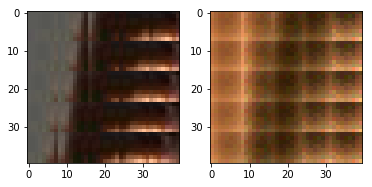

EPO: 2, recon_loss: 0.0344, total_loss: 0.0471, train_psnr:20.3275, validation_psnr:24.3748
EPO: 2, recon_loss: 0.0117, total_loss: 0.0272, train_psnr:20.4033, validation_psnr:24.6744
EPO: 2, recon_loss: 0.0347, total_loss: 0.0483, train_psnr:20.3817, validation_psnr:25.2506
EPO: 2, recon_loss: 0.0756, total_loss: 0.1095, train_psnr:20.4819, validation_psnr:25.2861
EPO: 2, recon_loss: 0.0202, total_loss: 0.0392, train_psnr:20.5296, validation_psnr:25.2042
EPO: 2, recon_loss: 0.0444, total_loss: 0.0540, train_psnr:20.5134, validation_psnr:25.2123
EPO: 2, recon_loss: 0.0163, total_loss: 0.0277, train_psnr:20.4859, validation_psnr:25.1949
EPO: 2, recon_loss: 0.0275, total_loss: 0.0354, train_psnr:20.3913, validation_psnr:25.2336
EPO: 2, recon_loss: 0.0415, total_loss: 0.0565, train_psnr:20.4705, validation_psnr:23.8729
EPO: 2, recon_loss: 0.0180, total_loss: 0.0294, train_psnr:20.5475, validation_psnr:23.7228
#########reconstruction test psnr: 22.9191 


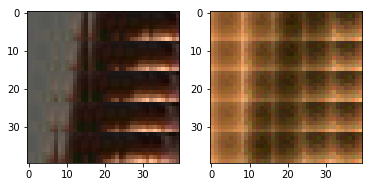

EPO: 2, recon_loss: 0.0325, total_loss: 0.0473, train_psnr:20.5019, validation_psnr:24.6160
EPO: 2, recon_loss: 0.0200, total_loss: 0.0296, train_psnr:20.5120, validation_psnr:24.0386
EPO: 2, recon_loss: 0.0411, total_loss: 0.0538, train_psnr:20.3646, validation_psnr:24.9292
EPO: 2, recon_loss: 0.0631, total_loss: 0.0789, train_psnr:19.8473, validation_psnr:25.2197
EPO: 2, recon_loss: 0.0424, total_loss: 0.0632, train_psnr:19.3722, validation_psnr:24.6119
EPO: 2, recon_loss: 0.0681, total_loss: 0.0894, train_psnr:19.1386, validation_psnr:24.4317
EPO: 2, recon_loss: 0.0423, total_loss: 0.0624, train_psnr:18.9444, validation_psnr:24.0828
EPO: 2, recon_loss: 0.0304, total_loss: 0.0501, train_psnr:18.5461, validation_psnr:23.5254
EPO: 2, recon_loss: 0.0373, total_loss: 0.0637, train_psnr:18.8873, validation_psnr:23.7584
EPO: 2, recon_loss: 0.0290, total_loss: 0.0435, train_psnr:19.2260, validation_psnr:22.6712
#########reconstruction test psnr: 22.1735 


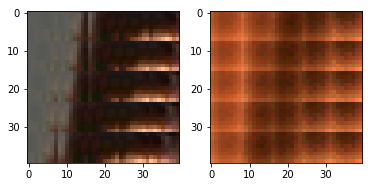

EPO: 2, recon_loss: 0.0481, total_loss: 0.0619, train_psnr:19.2905, validation_psnr:23.0050
EPO: 2, recon_loss: 0.0446, total_loss: 0.0563, train_psnr:19.6653, validation_psnr:20.9251
EPO: 2, recon_loss: 0.0332, total_loss: 0.0539, train_psnr:19.3828, validation_psnr:24.5598
EPO: 2, recon_loss: 0.0470, total_loss: 0.0742, train_psnr:19.7452, validation_psnr:24.4784
EPO: 2, recon_loss: 0.0186, total_loss: 0.0435, train_psnr:20.1244, validation_psnr:24.2106
EPO: 2, recon_loss: 0.0496, total_loss: 0.0596, train_psnr:20.2476, validation_psnr:23.2996
EPO: 2, recon_loss: 0.0212, total_loss: 0.0442, train_psnr:20.3848, validation_psnr:22.8187
EPO: 2, recon_loss: 0.0230, total_loss: 0.0404, train_psnr:20.3858, validation_psnr:23.2183
EPO: 2, recon_loss: 0.0484, total_loss: 0.0823, train_psnr:20.4470, validation_psnr:22.8721
EPO: 2, recon_loss: 0.0414, total_loss: 0.0845, train_psnr:20.5350, validation_psnr:24.1831
#########reconstruction test psnr: 23.3235 


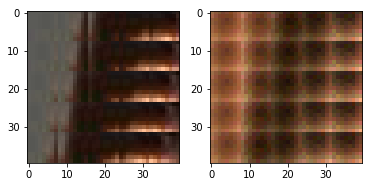

EPO: 2, recon_loss: 0.0801, total_loss: 0.1075, train_psnr:20.5390, validation_psnr:24.7520
EPO: 2, recon_loss: 0.0447, total_loss: 0.0788, train_psnr:20.5855, validation_psnr:24.8080
EPO: 2, recon_loss: 0.0405, total_loss: 0.0705, train_psnr:20.4635, validation_psnr:24.7062
EPO: 2, recon_loss: 0.0772, total_loss: 0.1017, train_psnr:20.2043, validation_psnr:25.6274
EPO: 2, recon_loss: 0.0368, total_loss: 0.0732, train_psnr:19.8742, validation_psnr:25.1821
EPO: 2, recon_loss: 0.0841, total_loss: 0.1142, train_psnr:19.8713, validation_psnr:24.7263
EPO: 2, recon_loss: 0.0440, total_loss: 0.0811, train_psnr:19.9487, validation_psnr:24.7145
EPO: 2, recon_loss: 0.0490, total_loss: 0.0858, train_psnr:19.8519, validation_psnr:24.2455
EPO: 2, recon_loss: 0.0446, total_loss: 0.0853, train_psnr:19.9893, validation_psnr:24.3067
EPO: 2, recon_loss: 0.0485, total_loss: 0.0822, train_psnr:20.4579, validation_psnr:24.2698
#########reconstruction test psnr: 23.3519 


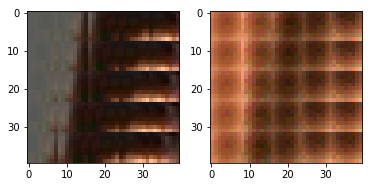

EPO: 2, recon_loss: 0.0864, total_loss: 0.1032, train_psnr:20.6967, validation_psnr:22.3213
EPO: 2, recon_loss: 0.0622, total_loss: 0.0728, train_psnr:20.6574, validation_psnr:22.1697
EPO: 2, recon_loss: 0.0210, total_loss: 0.0302, train_psnr:20.5541, validation_psnr:21.3281
EPO: 2, recon_loss: 0.0419, total_loss: 0.0504, train_psnr:20.4389, validation_psnr:22.0700
EPO: 2, recon_loss: 0.0170, total_loss: 0.0360, train_psnr:20.6241, validation_psnr:23.2277
EPO: 2, recon_loss: 0.0323, total_loss: 0.0507, train_psnr:20.5541, validation_psnr:24.2064
EPO: 2, recon_loss: 0.0273, total_loss: 0.0460, train_psnr:20.4349, validation_psnr:24.7466
EPO: 2, recon_loss: 0.0313, total_loss: 0.0561, train_psnr:20.3598, validation_psnr:25.4433
EPO: 2, recon_loss: 0.0490, total_loss: 0.0711, train_psnr:20.3573, validation_psnr:25.3770
EPO: 2, recon_loss: 0.0088, total_loss: 0.0147, train_psnr:20.1667, validation_psnr:26.0683
#########reconstruction test psnr: 24.6081 


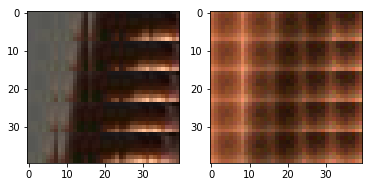

EPO: 2, recon_loss: 0.0158, total_loss: 0.0205, train_psnr:19.9151, validation_psnr:26.1065
EPO: 2, recon_loss: 0.0111, total_loss: 0.0143, train_psnr:19.4291, validation_psnr:25.7593
EPO: 2, recon_loss: 0.0081, total_loss: 0.0102, train_psnr:19.3551, validation_psnr:25.5612
EPO: 2, recon_loss: 0.0205, total_loss: 0.0246, train_psnr:19.0387, validation_psnr:24.6713
EPO: 2, recon_loss: 0.0329, total_loss: 0.0465, train_psnr:19.6855, validation_psnr:24.8995
EPO: 2, recon_loss: 0.0291, total_loss: 0.0413, train_psnr:19.9201, validation_psnr:24.3443
EPO: 2, recon_loss: 0.0391, total_loss: 0.0492, train_psnr:19.8869, validation_psnr:23.8352
EPO: 2, recon_loss: 0.0217, total_loss: 0.0276, train_psnr:20.0155, validation_psnr:23.4761
EPO: 2, recon_loss: 0.0331, total_loss: 0.0399, train_psnr:20.0010, validation_psnr:23.5721
EPO: 2, recon_loss: 0.0438, total_loss: 0.0720, train_psnr:20.4620, validation_psnr:22.9778
#########reconstruction test psnr: 22.2935 


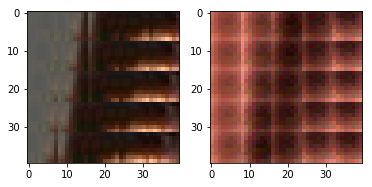

EPO: 2, recon_loss: 0.0685, total_loss: 0.0922, train_psnr:20.5602, validation_psnr:23.3777
EPO: 2, recon_loss: 0.0596, total_loss: 0.0820, train_psnr:20.6326, validation_psnr:23.3026
EPO: 2, recon_loss: 0.0345, total_loss: 0.0515, train_psnr:20.7387, validation_psnr:22.9989
EPO: 2, recon_loss: 0.0308, total_loss: 0.0452, train_psnr:20.6650, validation_psnr:22.4140
EPO: 2, recon_loss: 0.0286, total_loss: 0.0425, train_psnr:20.8478, validation_psnr:22.4478
EPO: 2, recon_loss: 0.0224, total_loss: 0.0301, train_psnr:20.8579, validation_psnr:22.1753
EPO: 2, recon_loss: 0.0285, total_loss: 0.0419, train_psnr:20.8449, validation_psnr:23.1110
EPO: 2, recon_loss: 0.0238, total_loss: 0.0318, train_psnr:20.8061, validation_psnr:23.0177
EPO: 2, recon_loss: 0.0280, total_loss: 0.0381, train_psnr:20.7386, validation_psnr:23.1206
EPO: 2, recon_loss: 0.0351, total_loss: 0.0661, train_psnr:20.8110, validation_psnr:24.7000
#########reconstruction test psnr: 23.7282 


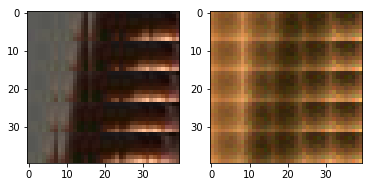

EPO: 2, recon_loss: 0.0111, total_loss: 0.0254, train_psnr:20.8365, validation_psnr:24.1101
EPO: 2, recon_loss: 0.0386, total_loss: 0.0502, train_psnr:20.8087, validation_psnr:24.3612
EPO: 2, recon_loss: 0.0232, total_loss: 0.0354, train_psnr:20.7811, validation_psnr:24.6833
EPO: 2, recon_loss: 0.0422, total_loss: 0.0585, train_psnr:20.7719, validation_psnr:24.9528
EPO: 2, recon_loss: 0.0147, total_loss: 0.0210, train_psnr:20.8238, validation_psnr:24.4863
EPO: 2, recon_loss: 0.0141, total_loss: 0.0205, train_psnr:20.7758, validation_psnr:24.5033
EPO: 2, recon_loss: 0.0218, total_loss: 0.0318, train_psnr:20.7036, validation_psnr:24.4198
EPO: 2, recon_loss: 0.0104, total_loss: 0.0172, train_psnr:20.6521, validation_psnr:24.0911
EPO: 2, recon_loss: 0.0117, total_loss: 0.0175, train_psnr:20.4884, validation_psnr:24.1019
EPO: 2, recon_loss: 0.0315, total_loss: 0.0468, train_psnr:20.6136, validation_psnr:23.9937
#########reconstruction test psnr: 23.1824 


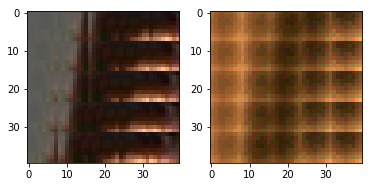

EPO: 2, recon_loss: 0.0212, total_loss: 0.0329, train_psnr:20.6598, validation_psnr:23.4619
EPO: 2, recon_loss: 0.0438, total_loss: 0.0574, train_psnr:20.7131, validation_psnr:23.7358
EPO: 2, recon_loss: 0.0252, total_loss: 0.0393, train_psnr:20.6642, validation_psnr:23.7100
EPO: 2, recon_loss: 0.0137, total_loss: 0.0255, train_psnr:20.6717, validation_psnr:22.8325
EPO: 2, recon_loss: 0.0300, total_loss: 0.0553, train_psnr:20.7583, validation_psnr:24.5789
EPO: 2, recon_loss: 0.0195, total_loss: 0.0421, train_psnr:20.7526, validation_psnr:24.6764
EPO: 2, recon_loss: 0.0650, total_loss: 0.0815, train_psnr:20.7649, validation_psnr:24.0184
EPO: 2, recon_loss: 0.0227, total_loss: 0.0379, train_psnr:20.8050, validation_psnr:23.9444
EPO: 2, recon_loss: 0.0489, total_loss: 0.0611, train_psnr:20.7498, validation_psnr:24.7163
EPO: 2, recon_loss: 0.0324, total_loss: 0.0452, train_psnr:20.5093, validation_psnr:25.7632
#########reconstruction test psnr: 24.4351 


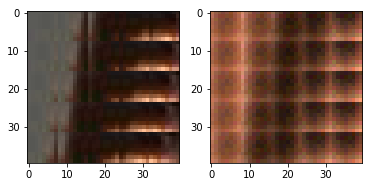

EPO: 2, recon_loss: 0.0079, total_loss: 0.0176, train_psnr:20.4844, validation_psnr:22.0151
EPO: 2, recon_loss: 0.0482, total_loss: 0.0585, train_psnr:20.3437, validation_psnr:21.8492
EPO: 2, recon_loss: 0.0242, total_loss: 0.0308, train_psnr:20.0460, validation_psnr:20.8764
EPO: 2, recon_loss: 0.0236, total_loss: 0.0345, train_psnr:20.1352, validation_psnr:22.6961
EPO: 2, recon_loss: 0.0441, total_loss: 0.0597, train_psnr:20.3522, validation_psnr:24.8720
EPO: 2, recon_loss: 0.0321, total_loss: 0.0530, train_psnr:20.6483, validation_psnr:25.1091
EPO: 2, recon_loss: 0.0308, total_loss: 0.0452, train_psnr:20.6332, validation_psnr:25.3835
EPO: 2, recon_loss: 0.0198, total_loss: 0.0340, train_psnr:20.6228, validation_psnr:25.3870
EPO: 2, recon_loss: 0.0162, total_loss: 0.0261, train_psnr:20.5327, validation_psnr:25.2256
EPO: 2, recon_loss: 0.0327, total_loss: 0.0474, train_psnr:20.4188, validation_psnr:24.4095
#########reconstruction test psnr: 23.3675 


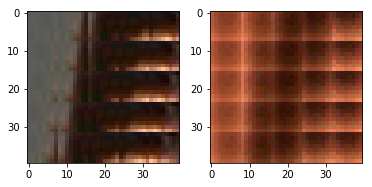

EPO: 2, recon_loss: 0.0217, total_loss: 0.0300, train_psnr:20.3662, validation_psnr:24.3600
EPO: 2, recon_loss: 0.0432, total_loss: 0.0589, train_psnr:20.4352, validation_psnr:24.1712
EPO: 2, recon_loss: 0.0257, total_loss: 0.0334, train_psnr:20.4363, validation_psnr:24.3683
EPO: 2, recon_loss: 0.0245, total_loss: 0.0328, train_psnr:20.2953, validation_psnr:24.1040
EPO: 2, recon_loss: 0.0311, total_loss: 0.0498, train_psnr:20.2082, validation_psnr:24.1414
EPO: 2, recon_loss: 0.0208, total_loss: 0.0397, train_psnr:20.3849, validation_psnr:24.1193
EPO: 2, recon_loss: 0.0254, total_loss: 0.0413, train_psnr:20.4648, validation_psnr:23.9847
EPO: 2, recon_loss: 0.0307, total_loss: 0.0437, train_psnr:20.4988, validation_psnr:24.7478
EPO: 2, recon_loss: 0.0325, total_loss: 0.0507, train_psnr:20.4091, validation_psnr:24.2052
EPO: 2, recon_loss: 0.0234, total_loss: 0.0694, train_psnr:20.2960, validation_psnr:25.0496
#########reconstruction test psnr: 23.9565 


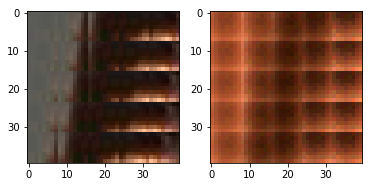

EPO: 2, recon_loss: 0.0140, total_loss: 0.0289, train_psnr:20.4709, validation_psnr:24.2388
EPO: 2, recon_loss: 0.0187, total_loss: 0.0307, train_psnr:20.5338, validation_psnr:24.0182
EPO: 2, recon_loss: 0.0142, total_loss: 0.0251, train_psnr:20.5650, validation_psnr:24.8515
EPO: 2, recon_loss: 0.0198, total_loss: 0.0369, train_psnr:20.5553, validation_psnr:25.4307
EPO: 2, recon_loss: 0.0282, total_loss: 0.0451, train_psnr:20.5977, validation_psnr:25.2169
EPO: 2, recon_loss: 0.0145, total_loss: 0.0316, train_psnr:20.7510, validation_psnr:24.0577
EPO: 2, recon_loss: 0.0342, total_loss: 0.0488, train_psnr:20.7661, validation_psnr:24.3295
EPO: 2, recon_loss: 0.0500, total_loss: 0.0666, train_psnr:20.7795, validation_psnr:24.2181
EPO: 2, recon_loss: 0.0393, total_loss: 0.0606, train_psnr:20.7890, validation_psnr:24.7033
EPO: 2, recon_loss: 0.0486, total_loss: 0.0660, train_psnr:20.6740, validation_psnr:24.8139
#########reconstruction test psnr: 23.8314 


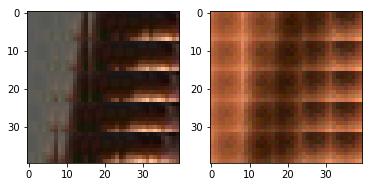

EPO: 2, recon_loss: 0.0267, total_loss: 0.0422, train_psnr:20.7417, validation_psnr:24.4325
EPO: 2, recon_loss: 0.0258, total_loss: 0.0405, train_psnr:20.6172, validation_psnr:24.6149
EPO: 2, recon_loss: 0.0430, total_loss: 0.0606, train_psnr:20.5959, validation_psnr:24.4586
EPO: 2, recon_loss: 0.0314, total_loss: 0.0458, train_psnr:20.5246, validation_psnr:25.0218
EPO: 2, recon_loss: 0.0489, total_loss: 0.0607, train_psnr:20.4161, validation_psnr:25.0157
EPO: 2, recon_loss: 0.0108, total_loss: 0.0158, train_psnr:20.5036, validation_psnr:24.5652
EPO: 2, recon_loss: 0.0124, total_loss: 0.0181, train_psnr:20.5186, validation_psnr:25.0122
EPO: 2, recon_loss: 0.0354, total_loss: 0.0470, train_psnr:20.4417, validation_psnr:25.0826
EPO: 2, recon_loss: 0.0143, total_loss: 0.0269, train_psnr:20.5549, validation_psnr:24.5790
EPO: 2, recon_loss: 0.0326, total_loss: 0.0401, train_psnr:20.5039, validation_psnr:24.9383
#########reconstruction test psnr: 23.7494 


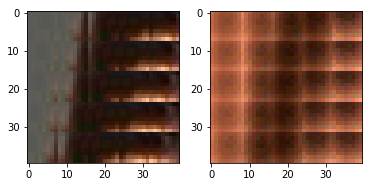

EPO: 2, recon_loss: 0.0501, total_loss: 0.0819, train_psnr:20.4739, validation_psnr:25.9813
EPO: 2, recon_loss: 0.0354, total_loss: 0.0694, train_psnr:20.4367, validation_psnr:26.0151
EPO: 2, recon_loss: 0.0520, total_loss: 0.0913, train_psnr:20.3769, validation_psnr:26.0543
EPO: 2, recon_loss: 0.0493, total_loss: 0.0820, train_psnr:20.4300, validation_psnr:25.8775
EPO: 2, recon_loss: 0.0464, total_loss: 0.0909, train_psnr:20.4023, validation_psnr:25.9894
EPO: 2, recon_loss: 0.0422, total_loss: 0.0644, train_psnr:20.7974, validation_psnr:22.5157
EPO: 2, recon_loss: 0.0368, total_loss: 0.0437, train_psnr:20.6627, validation_psnr:20.0723
EPO: 2, recon_loss: 0.0462, total_loss: 0.0750, train_psnr:20.8195, validation_psnr:25.6900
EPO: 2, recon_loss: 0.0335, total_loss: 0.0522, train_psnr:21.0097, validation_psnr:25.9334
EPO: 2, recon_loss: 0.0354, total_loss: 0.0516, train_psnr:21.0016, validation_psnr:25.6520
#########reconstruction test psnr: 24.4669 


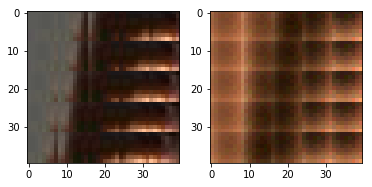

EPO: 2, recon_loss: 0.0314, total_loss: 0.0665, train_psnr:20.9244, validation_psnr:26.0164
EPO: 2, recon_loss: 0.0284, total_loss: 0.0504, train_psnr:20.9115, validation_psnr:25.7627
EPO: 2, recon_loss: 0.0491, total_loss: 0.0692, train_psnr:20.8121, validation_psnr:25.9243
EPO: 2, recon_loss: 0.0229, total_loss: 0.0408, train_psnr:20.7119, validation_psnr:25.5911
EPO: 2, recon_loss: 0.0228, total_loss: 0.0422, train_psnr:20.4871, validation_psnr:25.1862
EPO: 2, recon_loss: 0.0341, total_loss: 0.0545, train_psnr:20.4109, validation_psnr:24.6989
EPO: 2, recon_loss: 0.0119, total_loss: 0.0364, train_psnr:20.3772, validation_psnr:25.2355
EPO: 2, recon_loss: 0.0499, total_loss: 0.0640, train_psnr:20.4004, validation_psnr:25.0561
EPO: 2, recon_loss: 0.0135, total_loss: 0.0318, train_psnr:20.3673, validation_psnr:25.1579
EPO: 2, recon_loss: 0.0240, total_loss: 0.0423, train_psnr:20.3070, validation_psnr:25.1277
#########reconstruction test psnr: 24.1623 


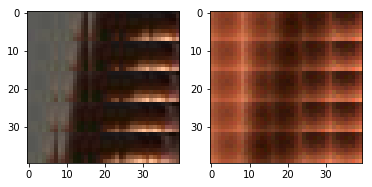

EPO: 2, recon_loss: 0.0213, total_loss: 0.0361, train_psnr:20.5256, validation_psnr:24.0592
EPO: 2, recon_loss: 0.0166, total_loss: 0.0408, train_psnr:20.6373, validation_psnr:24.5933
EPO: 2, recon_loss: 0.0508, total_loss: 0.0642, train_psnr:20.7440, validation_psnr:24.1587
EPO: 2, recon_loss: 0.0250, total_loss: 0.0463, train_psnr:20.8239, validation_psnr:24.5505
EPO: 2, recon_loss: 0.0224, total_loss: 0.0366, train_psnr:20.7824, validation_psnr:25.1269
EPO: 2, recon_loss: 0.0370, total_loss: 0.0685, train_psnr:20.7463, validation_psnr:25.8473
EPO: 2, recon_loss: 0.0149, total_loss: 0.0313, train_psnr:20.7772, validation_psnr:25.0676
EPO: 2, recon_loss: 0.0590, total_loss: 0.0766, train_psnr:20.7907, validation_psnr:25.0024
EPO: 2, recon_loss: 0.0156, total_loss: 0.0219, train_psnr:20.7671, validation_psnr:24.8603
EPO: 2, recon_loss: 0.0314, total_loss: 0.0462, train_psnr:20.8061, validation_psnr:24.6602
#########reconstruction test psnr: 23.7256 


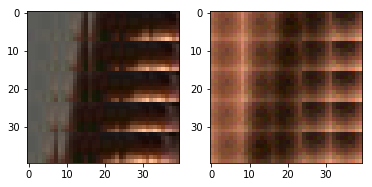

EPO: 2, recon_loss: 0.0279, total_loss: 0.0533, train_psnr:20.8811, validation_psnr:25.4543
EPO: 2, recon_loss: 0.0126, total_loss: 0.0307, train_psnr:20.9781, validation_psnr:25.2621
EPO: 2, recon_loss: 0.0344, total_loss: 0.0472, train_psnr:20.9590, validation_psnr:25.6068
EPO: 2, recon_loss: 0.0115, total_loss: 0.0238, train_psnr:20.9361, validation_psnr:25.3796
EPO: 2, recon_loss: 0.0230, total_loss: 0.0339, train_psnr:20.9429, validation_psnr:25.2134
EPO: 2, recon_loss: 0.0856, total_loss: 0.1128, train_psnr:20.9909, validation_psnr:24.0832
EPO: 2, recon_loss: 0.0620, total_loss: 0.0855, train_psnr:20.8391, validation_psnr:21.9119
EPO: 2, recon_loss: 0.0350, total_loss: 0.0463, train_psnr:20.6328, validation_psnr:22.0016
EPO: 2, recon_loss: 0.0389, total_loss: 0.0566, train_psnr:20.4986, validation_psnr:22.1664
EPO: 2, recon_loss: 0.0279, total_loss: 0.0411, train_psnr:20.4833, validation_psnr:22.5577
#########reconstruction test psnr: 22.0033 


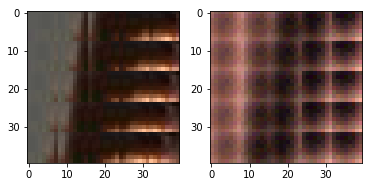

EPO: 2, recon_loss: 0.0176, total_loss: 0.0639, train_psnr:20.4010, validation_psnr:26.2106
EPO: 2, recon_loss: 0.0109, total_loss: 0.0442, train_psnr:20.5582, validation_psnr:25.0797
EPO: 2, recon_loss: 0.0230, total_loss: 0.0430, train_psnr:20.6036, validation_psnr:24.4784
EPO: 2, recon_loss: 0.0326, total_loss: 0.0496, train_psnr:20.5889, validation_psnr:24.9583
EPO: 2, recon_loss: 0.0426, total_loss: 0.0585, train_psnr:20.5555, validation_psnr:25.5619
EPO: 2, recon_loss: 0.0209, total_loss: 0.0358, train_psnr:20.4504, validation_psnr:25.2211
EPO: 2, recon_loss: 0.0116, total_loss: 0.0158, train_psnr:20.7112, validation_psnr:25.9102
EPO: 2, recon_loss: 0.0212, total_loss: 0.0280, train_psnr:20.8132, validation_psnr:26.1178
EPO: 2, recon_loss: 0.0134, total_loss: 0.0188, train_psnr:20.7599, validation_psnr:26.0242
EPO: 2, recon_loss: 0.0099, total_loss: 0.0158, train_psnr:20.8473, validation_psnr:26.0677
#########reconstruction test psnr: 24.6620 


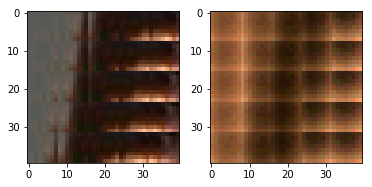

EPO: 2, recon_loss: 0.0202, total_loss: 0.0290, train_psnr:20.7999, validation_psnr:25.2221
EPO: 2, recon_loss: 0.0249, total_loss: 0.0383, train_psnr:20.7191, validation_psnr:24.1245
EPO: 2, recon_loss: 0.0347, total_loss: 0.0456, train_psnr:20.6941, validation_psnr:24.0753
EPO: 2, recon_loss: 0.0264, total_loss: 0.0379, train_psnr:20.6649, validation_psnr:24.3527
EPO: 2, recon_loss: 0.0205, total_loss: 0.0268, train_psnr:20.6723, validation_psnr:24.0570
EPO: 2, recon_loss: 0.0328, total_loss: 0.0375, train_psnr:20.6703, validation_psnr:24.2668
EPO: 2, recon_loss: 0.0438, total_loss: 0.0561, train_psnr:21.1231, validation_psnr:25.2649
EPO: 2, recon_loss: 0.0451, total_loss: 0.0585, train_psnr:21.0957, validation_psnr:25.0161
EPO: 2, recon_loss: 0.0358, total_loss: 0.0441, train_psnr:20.9673, validation_psnr:25.1268
EPO: 2, recon_loss: 0.0347, total_loss: 0.0442, train_psnr:20.8173, validation_psnr:24.5745
#########reconstruction test psnr: 23.7632 


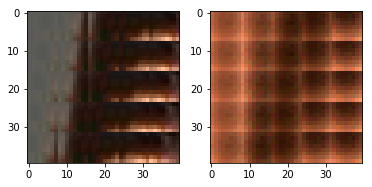

EPO: 2, recon_loss: 0.0356, total_loss: 0.0458, train_psnr:20.6633, validation_psnr:24.6175
EPO: 2, recon_loss: 0.0493, total_loss: 0.0817, train_psnr:20.8215, validation_psnr:25.5987
EPO: 2, recon_loss: 0.0389, total_loss: 0.0509, train_psnr:20.9525, validation_psnr:24.8040
EPO: 2, recon_loss: 0.0352, total_loss: 0.0451, train_psnr:20.9056, validation_psnr:24.6876
EPO: 2, recon_loss: 0.0283, total_loss: 0.0370, train_psnr:20.6828, validation_psnr:24.2474
EPO: 2, recon_loss: 0.0279, total_loss: 0.0417, train_psnr:20.6514, validation_psnr:24.4842
EPO: 2, recon_loss: 0.0157, total_loss: 0.0314, train_psnr:20.9433, validation_psnr:23.3154
EPO: 2, recon_loss: 0.0168, total_loss: 0.0312, train_psnr:20.9837, validation_psnr:23.0711
EPO: 2, recon_loss: 0.0277, total_loss: 0.0352, train_psnr:20.9180, validation_psnr:22.8526
EPO: 2, recon_loss: 0.0324, total_loss: 0.0476, train_psnr:20.9444, validation_psnr:22.2671
#########reconstruction test psnr: 21.8131 


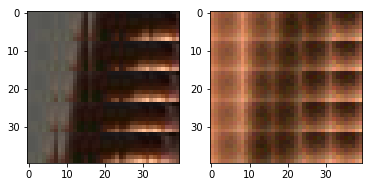

EPO: 2, recon_loss: 0.0518, total_loss: 0.0603, train_psnr:20.8736, validation_psnr:22.7480
EPO: 2, recon_loss: 0.0136, total_loss: 0.0426, train_psnr:20.8785, validation_psnr:25.1567
EPO: 2, recon_loss: 0.0113, total_loss: 0.0244, train_psnr:20.8320, validation_psnr:25.0083
EPO: 2, recon_loss: 0.0165, total_loss: 0.0300, train_psnr:20.7618, validation_psnr:24.5157
EPO: 2, recon_loss: 0.0047, total_loss: 0.0107, train_psnr:20.7060, validation_psnr:24.7165
EPO: 2, recon_loss: 0.0089, total_loss: 0.0158, train_psnr:20.6745, validation_psnr:24.8465
EPO: 2, recon_loss: 0.0472, total_loss: 0.0568, train_psnr:21.0296, validation_psnr:25.7458
EPO: 2, recon_loss: 0.0346, total_loss: 0.0463, train_psnr:20.8008, validation_psnr:24.6959
EPO: 2, recon_loss: 0.0445, total_loss: 0.0547, train_psnr:20.4059, validation_psnr:24.7647
EPO: 2, recon_loss: 0.0294, total_loss: 0.0430, train_psnr:20.1964, validation_psnr:24.6048
#########reconstruction test psnr: 23.7771 


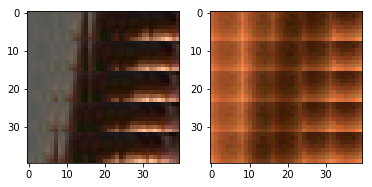

EPO: 2, recon_loss: 0.0229, total_loss: 0.0307, train_psnr:20.0263, validation_psnr:24.7029
EPO: 3, recon_loss: 0.0110, total_loss: 0.0200, train_psnr:20.2213, validation_psnr:24.2424
EPO: 3, recon_loss: 0.0085, total_loss: 0.0149, train_psnr:20.5224, validation_psnr:24.3666
EPO: 3, recon_loss: 0.0250, total_loss: 0.0306, train_psnr:20.5153, validation_psnr:25.2047
EPO: 3, recon_loss: 0.0105, total_loss: 0.0183, train_psnr:20.5566, validation_psnr:25.1489
EPO: 3, recon_loss: 0.0201, total_loss: 0.0269, train_psnr:20.4841, validation_psnr:25.2590
EPO: 3, recon_loss: 0.0125, total_loss: 0.0372, train_psnr:20.3732, validation_psnr:25.1037
EPO: 3, recon_loss: 0.0102, total_loss: 0.0290, train_psnr:20.2461, validation_psnr:25.1522
EPO: 3, recon_loss: 0.0191, total_loss: 0.0311, train_psnr:20.1911, validation_psnr:25.1155
EPO: 3, recon_loss: 0.0173, total_loss: 0.0232, train_psnr:20.0347, validation_psnr:24.9091
#########reconstruction test psnr: 23.9321 


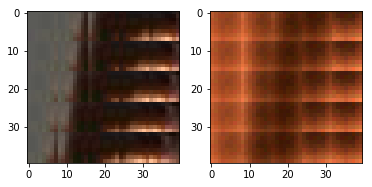

EPO: 3, recon_loss: 0.0239, total_loss: 0.0373, train_psnr:19.8328, validation_psnr:24.8564
EPO: 3, recon_loss: 0.0133, total_loss: 0.0387, train_psnr:20.0983, validation_psnr:24.7394
EPO: 3, recon_loss: 0.0129, total_loss: 0.0232, train_psnr:20.4882, validation_psnr:24.5736
EPO: 3, recon_loss: 0.0164, total_loss: 0.0320, train_psnr:20.6345, validation_psnr:25.3171
EPO: 3, recon_loss: 0.0118, total_loss: 0.0168, train_psnr:20.7277, validation_psnr:25.2655
EPO: 3, recon_loss: 0.0230, total_loss: 0.0326, train_psnr:20.7913, validation_psnr:24.5544
EPO: 3, recon_loss: 0.0188, total_loss: 0.0341, train_psnr:20.7265, validation_psnr:25.8598
EPO: 3, recon_loss: 0.0172, total_loss: 0.0272, train_psnr:20.4647, validation_psnr:25.5804
EPO: 3, recon_loss: 0.0211, total_loss: 0.0320, train_psnr:20.3107, validation_psnr:25.5881
EPO: 3, recon_loss: 0.0171, total_loss: 0.0285, train_psnr:20.2228, validation_psnr:25.5073
#########reconstruction test psnr: 24.3876 


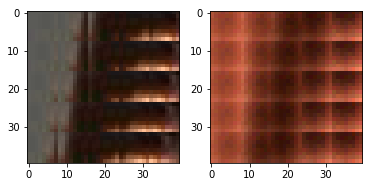

EPO: 3, recon_loss: 0.0117, total_loss: 0.0213, train_psnr:20.1348, validation_psnr:25.2460
EPO: 3, recon_loss: 0.0261, total_loss: 0.0341, train_psnr:20.2479, validation_psnr:25.8710
EPO: 3, recon_loss: 0.0140, total_loss: 0.0245, train_psnr:20.4936, validation_psnr:25.8731
EPO: 3, recon_loss: 0.0281, total_loss: 0.0373, train_psnr:20.6111, validation_psnr:25.6256
EPO: 3, recon_loss: 0.0171, total_loss: 0.0250, train_psnr:20.6813, validation_psnr:25.8495
EPO: 3, recon_loss: 0.0174, total_loss: 0.0230, train_psnr:20.7252, validation_psnr:25.4943
EPO: 3, recon_loss: 0.0729, total_loss: 0.0964, train_psnr:20.8036, validation_psnr:24.4406
EPO: 3, recon_loss: 0.0288, total_loss: 0.0451, train_psnr:20.8953, validation_psnr:24.3047
EPO: 3, recon_loss: 0.0428, total_loss: 0.0587, train_psnr:20.9835, validation_psnr:24.8059
EPO: 3, recon_loss: 0.0516, total_loss: 0.0688, train_psnr:21.0431, validation_psnr:25.0628
#########reconstruction test psnr: 24.0951 


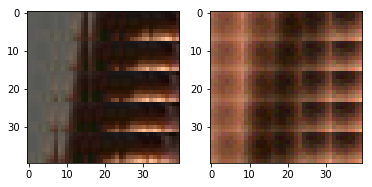

EPO: 3, recon_loss: 0.0313, total_loss: 0.0433, train_psnr:21.0209, validation_psnr:24.9294
EPO: 3, recon_loss: 0.0238, total_loss: 0.0442, train_psnr:20.9684, validation_psnr:24.4808
EPO: 3, recon_loss: 0.0227, total_loss: 0.0354, train_psnr:21.2219, validation_psnr:24.7698
EPO: 3, recon_loss: 0.0319, total_loss: 0.0442, train_psnr:21.2654, validation_psnr:24.5844
EPO: 3, recon_loss: 0.0143, total_loss: 0.0211, train_psnr:21.2425, validation_psnr:24.0503
EPO: 3, recon_loss: 0.0217, total_loss: 0.0269, train_psnr:21.1710, validation_psnr:23.8076
EPO: 3, recon_loss: 0.0135, total_loss: 0.0200, train_psnr:20.9797, validation_psnr:24.0183
EPO: 3, recon_loss: 0.0090, total_loss: 0.0159, train_psnr:20.9791, validation_psnr:24.6022
EPO: 3, recon_loss: 0.0115, total_loss: 0.0212, train_psnr:21.0007, validation_psnr:26.0246
EPO: 3, recon_loss: 0.0178, total_loss: 0.0264, train_psnr:20.9984, validation_psnr:25.8854
#########reconstruction test psnr: 24.5345 


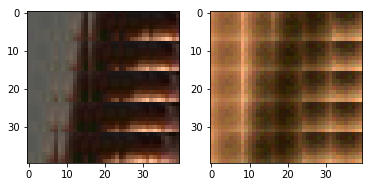

EPO: 3, recon_loss: 0.0174, total_loss: 0.0318, train_psnr:20.9617, validation_psnr:26.3952
EPO: 3, recon_loss: 0.0222, total_loss: 0.0442, train_psnr:20.9118, validation_psnr:26.4202
EPO: 3, recon_loss: 0.0136, total_loss: 0.0332, train_psnr:21.0812, validation_psnr:25.5017
EPO: 3, recon_loss: 0.0179, total_loss: 0.0341, train_psnr:21.1588, validation_psnr:25.7672
EPO: 3, recon_loss: 0.0188, total_loss: 0.0309, train_psnr:21.1689, validation_psnr:25.3186
EPO: 3, recon_loss: 0.0090, total_loss: 0.0212, train_psnr:21.2176, validation_psnr:25.3730
EPO: 3, recon_loss: 0.0352, total_loss: 0.0510, train_psnr:21.2051, validation_psnr:25.8145
EPO: 3, recon_loss: 0.0557, total_loss: 0.0830, train_psnr:21.2891, validation_psnr:26.2962
EPO: 3, recon_loss: 0.0264, total_loss: 0.0407, train_psnr:21.3051, validation_psnr:25.9683
EPO: 3, recon_loss: 0.0325, total_loss: 0.0409, train_psnr:21.2803, validation_psnr:25.9006
#########reconstruction test psnr: 24.7615 


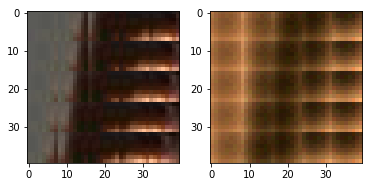

EPO: 3, recon_loss: 0.0163, total_loss: 0.0242, train_psnr:21.2413, validation_psnr:25.9271
EPO: 3, recon_loss: 0.0331, total_loss: 0.0389, train_psnr:21.1401, validation_psnr:26.0628
EPO: 3, recon_loss: 0.0247, total_loss: 0.0361, train_psnr:21.2907, validation_psnr:24.6553
EPO: 3, recon_loss: 0.0267, total_loss: 0.0376, train_psnr:21.3239, validation_psnr:24.4829
EPO: 3, recon_loss: 0.0306, total_loss: 0.0451, train_psnr:21.2770, validation_psnr:24.9354
EPO: 3, recon_loss: 0.0265, total_loss: 0.0369, train_psnr:21.2348, validation_psnr:24.9837
EPO: 3, recon_loss: 0.0393, total_loss: 0.0478, train_psnr:21.1003, validation_psnr:25.4111
EPO: 3, recon_loss: 0.0430, total_loss: 0.0590, train_psnr:20.4330, validation_psnr:25.4074
EPO: 3, recon_loss: 0.0424, total_loss: 0.0594, train_psnr:20.0180, validation_psnr:24.9970
EPO: 3, recon_loss: 0.0584, total_loss: 0.0785, train_psnr:19.8554, validation_psnr:24.9478
#########reconstruction test psnr: 24.0154 


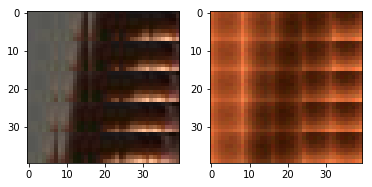

EPO: 3, recon_loss: 0.0353, total_loss: 0.0526, train_psnr:19.5788, validation_psnr:24.4222
EPO: 3, recon_loss: 0.0321, total_loss: 0.0489, train_psnr:19.2206, validation_psnr:24.1062
EPO: 3, recon_loss: 0.0237, total_loss: 0.0399, train_psnr:19.8284, validation_psnr:24.0201
EPO: 3, recon_loss: 0.0290, total_loss: 0.0395, train_psnr:19.9706, validation_psnr:23.1469
EPO: 3, recon_loss: 0.0435, total_loss: 0.0535, train_psnr:20.1526, validation_psnr:23.8123
EPO: 3, recon_loss: 0.0365, total_loss: 0.0476, train_psnr:20.4206, validation_psnr:22.3394
EPO: 3, recon_loss: 0.0346, total_loss: 0.0507, train_psnr:20.1499, validation_psnr:25.4826
EPO: 3, recon_loss: 0.0248, total_loss: 0.0468, train_psnr:20.5642, validation_psnr:25.4535
EPO: 3, recon_loss: 0.0196, total_loss: 0.0384, train_psnr:20.8422, validation_psnr:24.8439
EPO: 3, recon_loss: 0.0500, total_loss: 0.0604, train_psnr:20.9679, validation_psnr:24.3995
#########reconstruction test psnr: 23.5964 


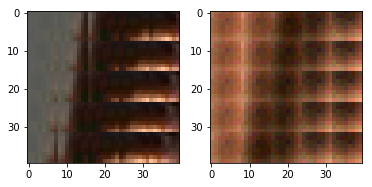

EPO: 3, recon_loss: 0.0135, total_loss: 0.0345, train_psnr:21.1039, validation_psnr:24.0646
EPO: 3, recon_loss: 0.0204, total_loss: 0.0344, train_psnr:21.0741, validation_psnr:24.6641
EPO: 3, recon_loss: 0.0353, total_loss: 0.0734, train_psnr:21.1719, validation_psnr:24.2260
EPO: 3, recon_loss: 0.0307, total_loss: 0.0626, train_psnr:21.2023, validation_psnr:25.0670
EPO: 3, recon_loss: 0.0900, total_loss: 0.1145, train_psnr:21.1804, validation_psnr:25.6427
EPO: 3, recon_loss: 0.0281, total_loss: 0.0578, train_psnr:21.2092, validation_psnr:25.3544
EPO: 3, recon_loss: 0.0339, total_loss: 0.0674, train_psnr:21.0413, validation_psnr:25.0647
EPO: 3, recon_loss: 0.0565, total_loss: 0.0780, train_psnr:20.6597, validation_psnr:26.0098
EPO: 3, recon_loss: 0.0339, total_loss: 0.0697, train_psnr:20.4231, validation_psnr:25.8784
EPO: 3, recon_loss: 0.0774, total_loss: 0.0996, train_psnr:20.4477, validation_psnr:25.6561
#########reconstruction test psnr: 24.5682 


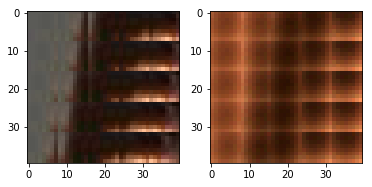

EPO: 3, recon_loss: 0.0353, total_loss: 0.0714, train_psnr:20.5225, validation_psnr:25.6047
EPO: 3, recon_loss: 0.0417, total_loss: 0.0726, train_psnr:20.3853, validation_psnr:25.0787
EPO: 3, recon_loss: 0.0469, total_loss: 0.0780, train_psnr:20.7264, validation_psnr:25.0865
EPO: 3, recon_loss: 0.0290, total_loss: 0.0570, train_psnr:21.0719, validation_psnr:24.9219
EPO: 3, recon_loss: 0.0814, total_loss: 0.0982, train_psnr:21.3252, validation_psnr:24.4553
EPO: 3, recon_loss: 0.0606, total_loss: 0.0681, train_psnr:21.3407, validation_psnr:23.4781
EPO: 3, recon_loss: 0.0245, total_loss: 0.0342, train_psnr:21.2154, validation_psnr:23.4296
EPO: 3, recon_loss: 0.0252, total_loss: 0.0360, train_psnr:21.1825, validation_psnr:24.1119
EPO: 3, recon_loss: 0.0129, total_loss: 0.0302, train_psnr:21.1893, validation_psnr:24.6545
EPO: 3, recon_loss: 0.0340, total_loss: 0.0466, train_psnr:21.0847, validation_psnr:25.1834
#########reconstruction test psnr: 24.2535 


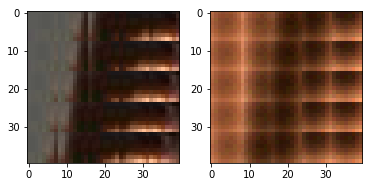

EPO: 3, recon_loss: 0.0187, total_loss: 0.0383, train_psnr:20.9837, validation_psnr:25.4843
EPO: 3, recon_loss: 0.0264, total_loss: 0.0451, train_psnr:20.9261, validation_psnr:26.0534
EPO: 3, recon_loss: 0.0176, total_loss: 0.0297, train_psnr:20.9468, validation_psnr:26.2145
EPO: 3, recon_loss: 0.0077, total_loss: 0.0119, train_psnr:20.8464, validation_psnr:26.8439
EPO: 3, recon_loss: 0.0187, total_loss: 0.0209, train_psnr:20.6108, validation_psnr:26.9349
EPO: 3, recon_loss: 0.0059, total_loss: 0.0077, train_psnr:20.4209, validation_psnr:26.6681
EPO: 3, recon_loss: 0.0092, total_loss: 0.0111, train_psnr:20.3667, validation_psnr:26.5800
EPO: 3, recon_loss: 0.0437, total_loss: 0.0762, train_psnr:20.3059, validation_psnr:25.8300
EPO: 3, recon_loss: 0.0239, total_loss: 0.0360, train_psnr:20.6766, validation_psnr:25.6647
EPO: 3, recon_loss: 0.0323, total_loss: 0.0427, train_psnr:20.7174, validation_psnr:24.9118
#########reconstruction test psnr: 23.8234 


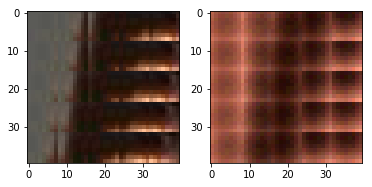

EPO: 3, recon_loss: 0.0255, total_loss: 0.0312, train_psnr:20.6946, validation_psnr:24.5918
EPO: 3, recon_loss: 0.0200, total_loss: 0.0233, train_psnr:20.7086, validation_psnr:23.9742
EPO: 3, recon_loss: 0.0381, total_loss: 0.0655, train_psnr:20.7209, validation_psnr:22.5316
EPO: 3, recon_loss: 0.0385, total_loss: 0.0586, train_psnr:21.0670, validation_psnr:22.8174
EPO: 3, recon_loss: 0.0521, total_loss: 0.0723, train_psnr:21.1401, validation_psnr:23.9372
EPO: 3, recon_loss: 0.0494, total_loss: 0.0718, train_psnr:21.2359, validation_psnr:24.0334
EPO: 3, recon_loss: 0.0217, total_loss: 0.0368, train_psnr:21.3222, validation_psnr:23.7013
EPO: 3, recon_loss: 0.0296, total_loss: 0.0405, train_psnr:21.2680, validation_psnr:22.9538
EPO: 3, recon_loss: 0.0194, total_loss: 0.0281, train_psnr:21.4366, validation_psnr:23.1924
EPO: 3, recon_loss: 0.0216, total_loss: 0.0280, train_psnr:21.4318, validation_psnr:23.2419
#########reconstruction test psnr: 22.6616 


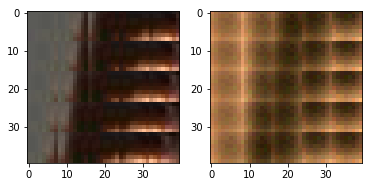

EPO: 3, recon_loss: 0.0196, total_loss: 0.0313, train_psnr:21.4027, validation_psnr:23.7977
EPO: 3, recon_loss: 0.0202, total_loss: 0.0268, train_psnr:21.3623, validation_psnr:23.7976
EPO: 3, recon_loss: 0.0241, total_loss: 0.0357, train_psnr:21.3196, validation_psnr:23.9237
EPO: 3, recon_loss: 0.0199, total_loss: 0.0415, train_psnr:21.4102, validation_psnr:25.3451
EPO: 3, recon_loss: 0.0179, total_loss: 0.0316, train_psnr:21.4212, validation_psnr:24.4661
EPO: 3, recon_loss: 0.0357, total_loss: 0.0457, train_psnr:21.3973, validation_psnr:25.0878
EPO: 3, recon_loss: 0.0296, total_loss: 0.0407, train_psnr:21.3977, validation_psnr:25.3172
EPO: 3, recon_loss: 0.0237, total_loss: 0.0373, train_psnr:21.4004, validation_psnr:25.4821
EPO: 3, recon_loss: 0.0120, total_loss: 0.0173, train_psnr:21.4185, validation_psnr:25.0387
EPO: 3, recon_loss: 0.0131, total_loss: 0.0189, train_psnr:21.3428, validation_psnr:24.9977
#########reconstruction test psnr: 24.1133 


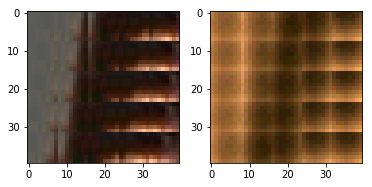

EPO: 3, recon_loss: 0.0209, total_loss: 0.0301, train_psnr:21.3115, validation_psnr:24.9321
EPO: 3, recon_loss: 0.0104, total_loss: 0.0152, train_psnr:21.2280, validation_psnr:24.7262
EPO: 3, recon_loss: 0.0160, total_loss: 0.0205, train_psnr:21.1067, validation_psnr:24.7368
EPO: 3, recon_loss: 0.0220, total_loss: 0.0319, train_psnr:21.2405, validation_psnr:24.7087
EPO: 3, recon_loss: 0.0232, total_loss: 0.0330, train_psnr:21.2813, validation_psnr:24.2103
EPO: 3, recon_loss: 0.0324, total_loss: 0.0436, train_psnr:21.3142, validation_psnr:24.4352
EPO: 3, recon_loss: 0.0193, total_loss: 0.0315, train_psnr:21.2497, validation_psnr:24.1587
EPO: 3, recon_loss: 0.0123, total_loss: 0.0206, train_psnr:21.2704, validation_psnr:23.8659
EPO: 3, recon_loss: 0.0181, total_loss: 0.0372, train_psnr:21.3215, validation_psnr:25.5618
EPO: 3, recon_loss: 0.0149, total_loss: 0.0351, train_psnr:21.3183, validation_psnr:25.2626
#########reconstruction test psnr: 24.3030 


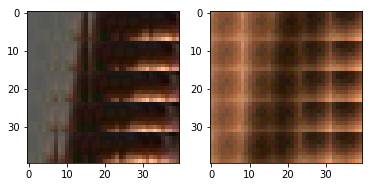

EPO: 3, recon_loss: 0.0595, total_loss: 0.0722, train_psnr:21.3176, validation_psnr:25.2985
EPO: 3, recon_loss: 0.0184, total_loss: 0.0318, train_psnr:21.3735, validation_psnr:24.8032
EPO: 3, recon_loss: 0.0729, total_loss: 0.0838, train_psnr:21.2329, validation_psnr:25.1341
EPO: 3, recon_loss: 0.0175, total_loss: 0.0273, train_psnr:21.2386, validation_psnr:25.8516
EPO: 3, recon_loss: 0.0070, total_loss: 0.0158, train_psnr:21.1093, validation_psnr:23.4865
EPO: 3, recon_loss: 0.0441, total_loss: 0.0528, train_psnr:20.9938, validation_psnr:23.5615
EPO: 3, recon_loss: 0.0181, total_loss: 0.0245, train_psnr:20.7974, validation_psnr:22.8257
EPO: 3, recon_loss: 0.0185, total_loss: 0.0288, train_psnr:20.8362, validation_psnr:24.1316
EPO: 3, recon_loss: 0.0305, total_loss: 0.0450, train_psnr:21.0614, validation_psnr:25.4492
EPO: 3, recon_loss: 0.0253, total_loss: 0.0413, train_psnr:21.1720, validation_psnr:25.7375
#########reconstruction test psnr: 24.5752 


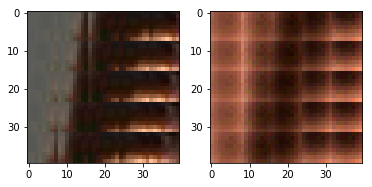

EPO: 3, recon_loss: 0.0358, total_loss: 0.0485, train_psnr:21.1253, validation_psnr:25.7235
EPO: 3, recon_loss: 0.0136, total_loss: 0.0245, train_psnr:21.1236, validation_psnr:25.9912
EPO: 3, recon_loss: 0.0171, total_loss: 0.0259, train_psnr:21.0030, validation_psnr:25.9375
EPO: 3, recon_loss: 0.0250, total_loss: 0.0345, train_psnr:20.9144, validation_psnr:25.5736
EPO: 3, recon_loss: 0.0169, total_loss: 0.0233, train_psnr:20.9598, validation_psnr:25.4284
EPO: 3, recon_loss: 0.0362, total_loss: 0.0503, train_psnr:21.0436, validation_psnr:25.4478
EPO: 3, recon_loss: 0.0196, total_loss: 0.0261, train_psnr:21.0203, validation_psnr:25.5151
EPO: 3, recon_loss: 0.0217, total_loss: 0.0304, train_psnr:20.9024, validation_psnr:25.2500
EPO: 3, recon_loss: 0.0329, total_loss: 0.0498, train_psnr:20.8441, validation_psnr:25.2404
EPO: 3, recon_loss: 0.0153, total_loss: 0.0337, train_psnr:21.0262, validation_psnr:24.8299
#########reconstruction test psnr: 23.9941 


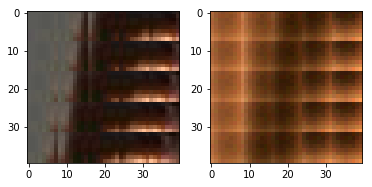

EPO: 3, recon_loss: 0.0282, total_loss: 0.0395, train_psnr:21.0597, validation_psnr:24.7722
EPO: 3, recon_loss: 0.0254, total_loss: 0.0385, train_psnr:21.0738, validation_psnr:25.3292
EPO: 3, recon_loss: 0.0252, total_loss: 0.0395, train_psnr:20.9317, validation_psnr:25.0545
EPO: 3, recon_loss: 0.0298, total_loss: 0.0625, train_psnr:20.8935, validation_psnr:25.7584
EPO: 3, recon_loss: 0.0075, total_loss: 0.0178, train_psnr:21.0526, validation_psnr:25.0018
EPO: 3, recon_loss: 0.0189, total_loss: 0.0282, train_psnr:21.1264, validation_psnr:24.9780
EPO: 3, recon_loss: 0.0138, total_loss: 0.0243, train_psnr:21.1445, validation_psnr:25.7585
EPO: 3, recon_loss: 0.0146, total_loss: 0.0259, train_psnr:21.1527, validation_psnr:26.1285
EPO: 3, recon_loss: 0.0269, total_loss: 0.0437, train_psnr:21.2255, validation_psnr:25.0620
EPO: 3, recon_loss: 0.0122, total_loss: 0.0258, train_psnr:21.3161, validation_psnr:24.9714
#########reconstruction test psnr: 24.1501 


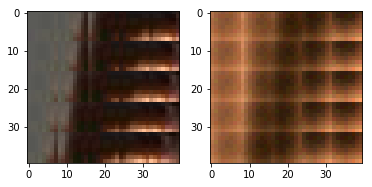

EPO: 3, recon_loss: 0.0275, total_loss: 0.0409, train_psnr:21.3212, validation_psnr:25.5442
EPO: 3, recon_loss: 0.0324, total_loss: 0.0472, train_psnr:21.3390, validation_psnr:25.1928
EPO: 3, recon_loss: 0.0406, total_loss: 0.0569, train_psnr:21.2997, validation_psnr:25.5896
EPO: 3, recon_loss: 0.0542, total_loss: 0.0762, train_psnr:21.2588, validation_psnr:25.2228
EPO: 3, recon_loss: 0.0238, total_loss: 0.0372, train_psnr:21.2764, validation_psnr:25.1393
EPO: 3, recon_loss: 0.0241, total_loss: 0.0383, train_psnr:21.1918, validation_psnr:25.3838
EPO: 3, recon_loss: 0.0327, total_loss: 0.0454, train_psnr:21.1464, validation_psnr:25.5975
EPO: 3, recon_loss: 0.0344, total_loss: 0.0461, train_psnr:21.0786, validation_psnr:25.5141
EPO: 3, recon_loss: 0.0237, total_loss: 0.0278, train_psnr:20.9965, validation_psnr:25.5448
EPO: 3, recon_loss: 0.0104, total_loss: 0.0153, train_psnr:21.0941, validation_psnr:25.4259
#########reconstruction test psnr: 24.3990 


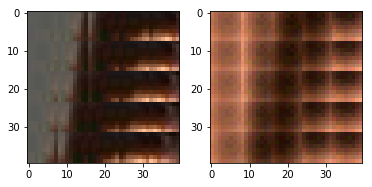

EPO: 3, recon_loss: 0.0116, total_loss: 0.0160, train_psnr:21.0649, validation_psnr:25.6326
EPO: 3, recon_loss: 0.0216, total_loss: 0.0327, train_psnr:21.0427, validation_psnr:25.4984
EPO: 3, recon_loss: 0.0166, total_loss: 0.0275, train_psnr:21.0995, validation_psnr:25.1800
EPO: 3, recon_loss: 0.0254, total_loss: 0.0345, train_psnr:21.0363, validation_psnr:25.5419
EPO: 3, recon_loss: 0.0408, total_loss: 0.0711, train_psnr:21.0283, validation_psnr:26.6737
EPO: 3, recon_loss: 0.0277, total_loss: 0.0541, train_psnr:20.9601, validation_psnr:26.4285
EPO: 3, recon_loss: 0.0496, total_loss: 0.0818, train_psnr:20.9435, validation_psnr:26.6156
EPO: 3, recon_loss: 0.0448, total_loss: 0.0790, train_psnr:20.9200, validation_psnr:26.4002
EPO: 3, recon_loss: 0.0377, total_loss: 0.0771, train_psnr:20.9168, validation_psnr:26.4958
EPO: 3, recon_loss: 0.0292, total_loss: 0.0438, train_psnr:21.3271, validation_psnr:23.1988
#########reconstruction test psnr: 22.6993 


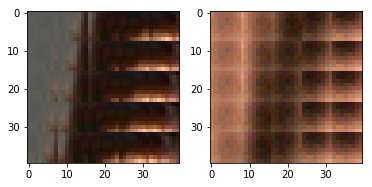

EPO: 3, recon_loss: 0.0462, total_loss: 0.0583, train_psnr:21.2932, validation_psnr:22.7721
EPO: 3, recon_loss: 0.0358, total_loss: 0.0614, train_psnr:21.3982, validation_psnr:26.3730
EPO: 3, recon_loss: 0.0281, total_loss: 0.0451, train_psnr:21.4568, validation_psnr:26.4795
EPO: 3, recon_loss: 0.0320, total_loss: 0.0503, train_psnr:21.4291, validation_psnr:26.0682
EPO: 3, recon_loss: 0.0293, total_loss: 0.0550, train_psnr:21.3714, validation_psnr:26.2348
EPO: 3, recon_loss: 0.0287, total_loss: 0.0479, train_psnr:21.3261, validation_psnr:26.1646
EPO: 3, recon_loss: 0.0374, total_loss: 0.0583, train_psnr:21.2563, validation_psnr:26.4424
EPO: 3, recon_loss: 0.0186, total_loss: 0.0370, train_psnr:21.1411, validation_psnr:26.1168
EPO: 3, recon_loss: 0.0248, total_loss: 0.0408, train_psnr:20.9499, validation_psnr:25.9250
EPO: 3, recon_loss: 0.0190, total_loss: 0.0331, train_psnr:20.9372, validation_psnr:25.7514
#########reconstruction test psnr: 24.8232 


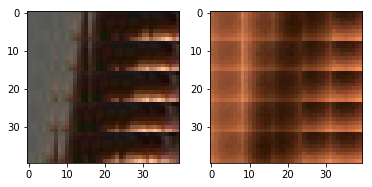

EPO: 3, recon_loss: 0.0142, total_loss: 0.0333, train_psnr:20.8895, validation_psnr:25.9618
EPO: 3, recon_loss: 0.0377, total_loss: 0.0502, train_psnr:20.8906, validation_psnr:25.8561
EPO: 3, recon_loss: 0.0125, total_loss: 0.0285, train_psnr:20.8649, validation_psnr:25.7817
EPO: 3, recon_loss: 0.0241, total_loss: 0.0387, train_psnr:20.7809, validation_psnr:25.8653
EPO: 3, recon_loss: 0.0134, total_loss: 0.0284, train_psnr:21.0604, validation_psnr:25.2094
EPO: 3, recon_loss: 0.0178, total_loss: 0.0399, train_psnr:21.1207, validation_psnr:25.3959
EPO: 3, recon_loss: 0.0475, total_loss: 0.0559, train_psnr:21.2217, validation_psnr:25.4983
EPO: 3, recon_loss: 0.0207, total_loss: 0.0406, train_psnr:21.2833, validation_psnr:25.4356
EPO: 3, recon_loss: 0.0261, total_loss: 0.0378, train_psnr:21.2038, validation_psnr:25.9883
EPO: 3, recon_loss: 0.0175, total_loss: 0.0371, train_psnr:21.2102, validation_psnr:26.2834
#########reconstruction test psnr: 25.1756 


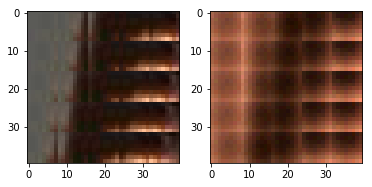

EPO: 3, recon_loss: 0.0147, total_loss: 0.0287, train_psnr:21.2339, validation_psnr:25.6550
EPO: 3, recon_loss: 0.0409, total_loss: 0.0548, train_psnr:21.2493, validation_psnr:25.7188
EPO: 3, recon_loss: 0.0145, total_loss: 0.0204, train_psnr:21.2529, validation_psnr:25.5629
EPO: 3, recon_loss: 0.0278, total_loss: 0.0405, train_psnr:21.2849, validation_psnr:25.4668
EPO: 3, recon_loss: 0.0181, total_loss: 0.0370, train_psnr:21.3502, validation_psnr:25.9922
EPO: 3, recon_loss: 0.0093, total_loss: 0.0240, train_psnr:21.3888, validation_psnr:25.8476
EPO: 3, recon_loss: 0.0246, total_loss: 0.0342, train_psnr:21.3744, validation_psnr:26.0434
EPO: 3, recon_loss: 0.0108, total_loss: 0.0222, train_psnr:21.3894, validation_psnr:25.7948
EPO: 3, recon_loss: 0.0165, total_loss: 0.0264, train_psnr:21.3890, validation_psnr:25.7861
EPO: 3, recon_loss: 0.0661, total_loss: 0.0906, train_psnr:21.4588, validation_psnr:24.5140
#########reconstruction test psnr: 23.8232 


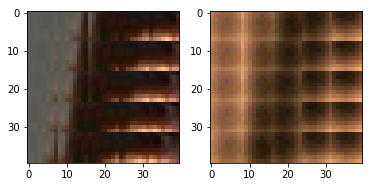

EPO: 3, recon_loss: 0.0471, total_loss: 0.0690, train_psnr:21.2834, validation_psnr:23.1933
EPO: 3, recon_loss: 0.0292, total_loss: 0.0392, train_psnr:21.1256, validation_psnr:23.8097
EPO: 3, recon_loss: 0.0345, total_loss: 0.0499, train_psnr:21.0055, validation_psnr:23.9449
EPO: 3, recon_loss: 0.0223, total_loss: 0.0312, train_psnr:20.9927, validation_psnr:24.5133
EPO: 3, recon_loss: 0.0161, total_loss: 0.0550, train_psnr:20.9756, validation_psnr:26.4519
EPO: 3, recon_loss: 0.0085, total_loss: 0.0366, train_psnr:21.0420, validation_psnr:25.7268
EPO: 3, recon_loss: 0.0335, total_loss: 0.0474, train_psnr:21.0794, validation_psnr:25.5608
EPO: 3, recon_loss: 0.0301, total_loss: 0.0464, train_psnr:21.0459, validation_psnr:25.9132
EPO: 3, recon_loss: 0.0326, total_loss: 0.0442, train_psnr:21.0376, validation_psnr:25.9711
EPO: 3, recon_loss: 0.0206, total_loss: 0.0313, train_psnr:21.0195, validation_psnr:26.1859
#########reconstruction test psnr: 24.9868 


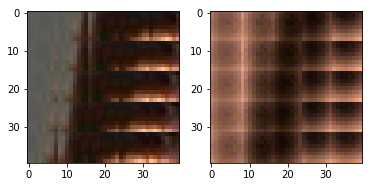

EPO: 3, recon_loss: 0.0075, total_loss: 0.0107, train_psnr:21.2333, validation_psnr:26.6048
EPO: 3, recon_loss: 0.0221, total_loss: 0.0273, train_psnr:21.2904, validation_psnr:26.5166
EPO: 3, recon_loss: 0.0100, total_loss: 0.0141, train_psnr:21.2854, validation_psnr:26.5366
EPO: 3, recon_loss: 0.0085, total_loss: 0.0134, train_psnr:21.3341, validation_psnr:26.4209
EPO: 3, recon_loss: 0.0217, total_loss: 0.0281, train_psnr:21.2810, validation_psnr:24.8052
EPO: 3, recon_loss: 0.0216, total_loss: 0.0316, train_psnr:21.2235, validation_psnr:24.7642
EPO: 3, recon_loss: 0.0351, total_loss: 0.0460, train_psnr:21.2244, validation_psnr:24.7215
EPO: 3, recon_loss: 0.0181, total_loss: 0.0282, train_psnr:21.1782, validation_psnr:24.9346
EPO: 3, recon_loss: 0.0184, total_loss: 0.0237, train_psnr:21.2123, validation_psnr:24.6023
EPO: 3, recon_loss: 0.0419, total_loss: 0.0671, train_psnr:21.2661, validation_psnr:25.8162
#########reconstruction test psnr: 24.7557 


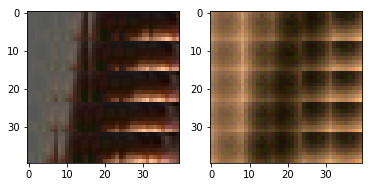

EPO: 3, recon_loss: 0.0457, total_loss: 0.0581, train_psnr:21.5442, validation_psnr:25.3946
EPO: 3, recon_loss: 0.0305, total_loss: 0.0416, train_psnr:21.4341, validation_psnr:24.9748
EPO: 3, recon_loss: 0.0323, total_loss: 0.0387, train_psnr:21.3216, validation_psnr:25.1348
EPO: 3, recon_loss: 0.0292, total_loss: 0.0372, train_psnr:21.1583, validation_psnr:24.6709
EPO: 3, recon_loss: 0.0557, total_loss: 0.0744, train_psnr:21.0839, validation_psnr:25.1842
EPO: 3, recon_loss: 0.0652, total_loss: 0.0917, train_psnr:21.3102, validation_psnr:25.1857
EPO: 3, recon_loss: 0.0303, total_loss: 0.0402, train_psnr:21.3567, validation_psnr:25.3960
EPO: 3, recon_loss: 0.0303, total_loss: 0.0384, train_psnr:21.2879, validation_psnr:24.8545
EPO: 3, recon_loss: 0.0239, total_loss: 0.0331, train_psnr:21.1247, validation_psnr:24.6493
EPO: 3, recon_loss: 0.0540, total_loss: 0.0655, train_psnr:21.2032, validation_psnr:24.9099
#########reconstruction test psnr: 24.1656 


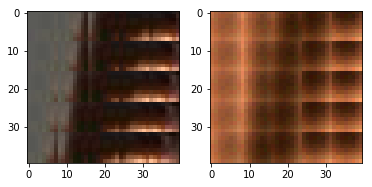

EPO: 3, recon_loss: 0.0098, total_loss: 0.0228, train_psnr:21.3924, validation_psnr:24.2916
EPO: 3, recon_loss: 0.0186, total_loss: 0.0314, train_psnr:21.4141, validation_psnr:24.1675
EPO: 3, recon_loss: 0.0246, total_loss: 0.0341, train_psnr:21.3464, validation_psnr:23.7693
EPO: 3, recon_loss: 0.0367, total_loss: 0.0480, train_psnr:21.3605, validation_psnr:23.6309
EPO: 3, recon_loss: 0.0612, total_loss: 0.0688, train_psnr:21.2814, validation_psnr:23.7675
EPO: 3, recon_loss: 0.0074, total_loss: 0.0257, train_psnr:21.2991, validation_psnr:25.9818
EPO: 3, recon_loss: 0.0127, total_loss: 0.0235, train_psnr:21.2568, validation_psnr:25.5616
EPO: 3, recon_loss: 0.0166, total_loss: 0.0284, train_psnr:21.2160, validation_psnr:25.4475
EPO: 3, recon_loss: 0.0055, total_loss: 0.0119, train_psnr:21.1844, validation_psnr:25.5215
EPO: 3, recon_loss: 0.0104, total_loss: 0.0155, train_psnr:21.1608, validation_psnr:25.6443
#########reconstruction test psnr: 24.5959 


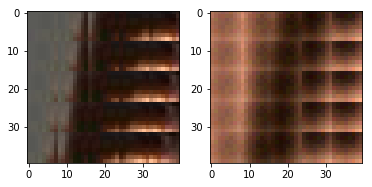

EPO: 3, recon_loss: 0.0382, total_loss: 0.0477, train_psnr:21.4213, validation_psnr:25.9910
EPO: 3, recon_loss: 0.0283, total_loss: 0.0395, train_psnr:21.1320, validation_psnr:25.1314
EPO: 3, recon_loss: 0.0357, total_loss: 0.0481, train_psnr:20.8286, validation_psnr:25.7835
EPO: 3, recon_loss: 0.0253, total_loss: 0.0374, train_psnr:20.6846, validation_psnr:24.9522
EPO: 3, recon_loss: 0.0298, total_loss: 0.0369, train_psnr:20.6462, validation_psnr:24.9984
EPO: 4, recon_loss: 0.0112, total_loss: 0.0180, train_psnr:20.9197, validation_psnr:24.9597
EPO: 4, recon_loss: 0.0078, total_loss: 0.0131, train_psnr:21.1502, validation_psnr:25.2507
EPO: 4, recon_loss: 0.0346, total_loss: 0.0410, train_psnr:21.1182, validation_psnr:25.6055
EPO: 4, recon_loss: 0.0118, total_loss: 0.0180, train_psnr:21.1230, validation_psnr:25.7568
EPO: 4, recon_loss: 0.0233, total_loss: 0.0282, train_psnr:21.0634, validation_psnr:25.7161
#########reconstruction test psnr: 24.7599 


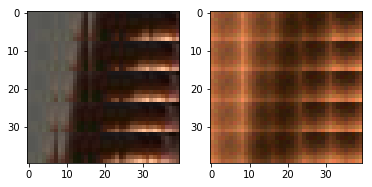

EPO: 4, recon_loss: 0.0106, total_loss: 0.0312, train_psnr:20.9415, validation_psnr:25.8262
EPO: 4, recon_loss: 0.0123, total_loss: 0.0253, train_psnr:20.8465, validation_psnr:25.6141
EPO: 4, recon_loss: 0.0180, total_loss: 0.0267, train_psnr:20.7695, validation_psnr:25.7300
EPO: 4, recon_loss: 0.0165, total_loss: 0.0221, train_psnr:20.6392, validation_psnr:25.3912
EPO: 4, recon_loss: 0.0238, total_loss: 0.0394, train_psnr:20.4906, validation_psnr:25.6273
EPO: 4, recon_loss: 0.0106, total_loss: 0.0314, train_psnr:20.7912, validation_psnr:25.4147
EPO: 4, recon_loss: 0.0113, total_loss: 0.0183, train_psnr:21.1320, validation_psnr:25.4811
EPO: 4, recon_loss: 0.0147, total_loss: 0.0280, train_psnr:21.1615, validation_psnr:25.7534
EPO: 4, recon_loss: 0.0126, total_loss: 0.0151, train_psnr:21.2723, validation_psnr:25.9522
EPO: 4, recon_loss: 0.0306, total_loss: 0.0408, train_psnr:21.2943, validation_psnr:25.8765
#########reconstruction test psnr: 24.8244 


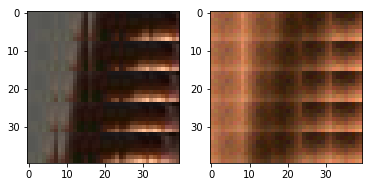

EPO: 4, recon_loss: 0.0167, total_loss: 0.0271, train_psnr:21.1775, validation_psnr:26.1747
EPO: 4, recon_loss: 0.0150, total_loss: 0.0242, train_psnr:20.9360, validation_psnr:26.1812
EPO: 4, recon_loss: 0.0181, total_loss: 0.0264, train_psnr:20.8298, validation_psnr:26.1922
EPO: 4, recon_loss: 0.0149, total_loss: 0.0266, train_psnr:20.7352, validation_psnr:26.0537
EPO: 4, recon_loss: 0.0147, total_loss: 0.0234, train_psnr:20.6779, validation_psnr:26.0135
EPO: 4, recon_loss: 0.0166, total_loss: 0.0224, train_psnr:20.8046, validation_psnr:26.5932
EPO: 4, recon_loss: 0.0108, total_loss: 0.0202, train_psnr:21.0162, validation_psnr:26.4971
EPO: 4, recon_loss: 0.0269, total_loss: 0.0321, train_psnr:21.0962, validation_psnr:26.4007
EPO: 4, recon_loss: 0.0108, total_loss: 0.0170, train_psnr:21.1601, validation_psnr:26.4641
EPO: 4, recon_loss: 0.0150, total_loss: 0.0191, train_psnr:21.1965, validation_psnr:26.2394
#########reconstruction test psnr: 25.1251 


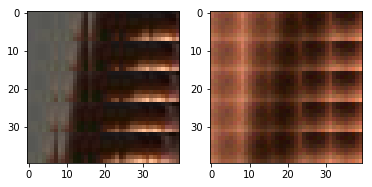

EPO: 4, recon_loss: 0.0432, total_loss: 0.0614, train_psnr:21.2842, validation_psnr:25.0186
EPO: 4, recon_loss: 0.0214, total_loss: 0.0359, train_psnr:21.3616, validation_psnr:25.2510
EPO: 4, recon_loss: 0.0381, total_loss: 0.0575, train_psnr:21.4433, validation_psnr:25.8813
EPO: 4, recon_loss: 0.0386, total_loss: 0.0510, train_psnr:21.4724, validation_psnr:25.3835
EPO: 4, recon_loss: 0.0313, total_loss: 0.0407, train_psnr:21.4405, validation_psnr:25.4187
EPO: 4, recon_loss: 0.0387, total_loss: 0.0600, train_psnr:21.4498, validation_psnr:25.5804
EPO: 4, recon_loss: 0.0185, total_loss: 0.0301, train_psnr:21.6224, validation_psnr:25.1424
EPO: 4, recon_loss: 0.0310, total_loss: 0.0392, train_psnr:21.6562, validation_psnr:25.3491
EPO: 4, recon_loss: 0.0097, total_loss: 0.0138, train_psnr:21.6528, validation_psnr:24.8471
EPO: 4, recon_loss: 0.0148, total_loss: 0.0195, train_psnr:21.5935, validation_psnr:24.5401
#########reconstruction test psnr: 23.8208 


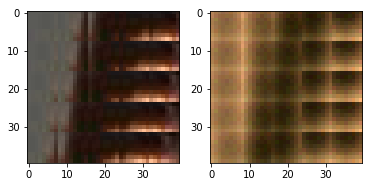

EPO: 4, recon_loss: 0.0082, total_loss: 0.0139, train_psnr:21.4949, validation_psnr:24.6551
EPO: 4, recon_loss: 0.0066, total_loss: 0.0126, train_psnr:21.5120, validation_psnr:25.6781
EPO: 4, recon_loss: 0.0125, total_loss: 0.0238, train_psnr:21.5018, validation_psnr:26.4746
EPO: 4, recon_loss: 0.0108, total_loss: 0.0181, train_psnr:21.4930, validation_psnr:26.2781
EPO: 4, recon_loss: 0.0171, total_loss: 0.0332, train_psnr:21.4521, validation_psnr:26.6362
EPO: 4, recon_loss: 0.0165, total_loss: 0.0367, train_psnr:21.4463, validation_psnr:25.8529
EPO: 4, recon_loss: 0.0099, total_loss: 0.0271, train_psnr:21.5494, validation_psnr:26.1626
EPO: 4, recon_loss: 0.0166, total_loss: 0.0292, train_psnr:21.5953, validation_psnr:26.1897
EPO: 4, recon_loss: 0.0126, total_loss: 0.0210, train_psnr:21.6078, validation_psnr:26.0280
EPO: 4, recon_loss: 0.0113, total_loss: 0.0243, train_psnr:21.6417, validation_psnr:25.9484
#########reconstruction test psnr: 24.9080 


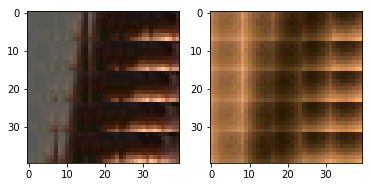

EPO: 4, recon_loss: 0.0161, total_loss: 0.0421, train_psnr:21.6286, validation_psnr:26.5631
EPO: 4, recon_loss: 0.0176, total_loss: 0.0345, train_psnr:21.6681, validation_psnr:26.9441
EPO: 4, recon_loss: 0.0346, total_loss: 0.0467, train_psnr:21.7061, validation_psnr:26.4974
EPO: 4, recon_loss: 0.0218, total_loss: 0.0294, train_psnr:21.6687, validation_psnr:26.5136
EPO: 4, recon_loss: 0.0190, total_loss: 0.0250, train_psnr:21.6470, validation_psnr:26.4486
EPO: 4, recon_loss: 0.0340, total_loss: 0.0424, train_psnr:21.6104, validation_psnr:26.4511
EPO: 4, recon_loss: 0.0180, total_loss: 0.0261, train_psnr:21.7210, validation_psnr:25.5466
EPO: 4, recon_loss: 0.0282, total_loss: 0.0415, train_psnr:21.7215, validation_psnr:25.5572
EPO: 4, recon_loss: 0.0249, total_loss: 0.0376, train_psnr:21.6764, validation_psnr:25.4728
EPO: 4, recon_loss: 0.0261, total_loss: 0.0361, train_psnr:21.6123, validation_psnr:25.6928
#########reconstruction test psnr: 24.7753 


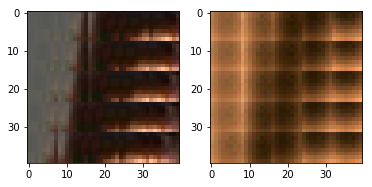

EPO: 4, recon_loss: 0.0392, total_loss: 0.0454, train_psnr:21.4687, validation_psnr:26.2891
EPO: 4, recon_loss: 0.0341, total_loss: 0.0509, train_psnr:20.8112, validation_psnr:25.6503
EPO: 4, recon_loss: 0.0425, total_loss: 0.0589, train_psnr:20.4988, validation_psnr:25.5355
EPO: 4, recon_loss: 0.0521, total_loss: 0.0682, train_psnr:20.4359, validation_psnr:25.3406
EPO: 4, recon_loss: 0.0323, total_loss: 0.0478, train_psnr:20.1192, validation_psnr:24.9692
EPO: 4, recon_loss: 0.0300, total_loss: 0.0451, train_psnr:19.8649, validation_psnr:24.8524
EPO: 4, recon_loss: 0.0185, total_loss: 0.0293, train_psnr:20.6035, validation_psnr:24.7132
EPO: 4, recon_loss: 0.0310, total_loss: 0.0393, train_psnr:20.6939, validation_psnr:23.8370
EPO: 4, recon_loss: 0.0293, total_loss: 0.0420, train_psnr:20.8980, validation_psnr:24.2729
EPO: 4, recon_loss: 0.0376, total_loss: 0.0515, train_psnr:20.9870, validation_psnr:24.5541
#########reconstruction test psnr: 23.9373 


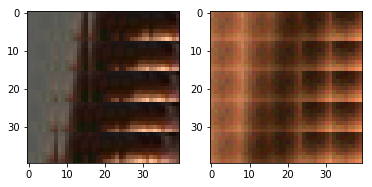

EPO: 4, recon_loss: 0.0289, total_loss: 0.0417, train_psnr:20.7841, validation_psnr:26.4606
EPO: 4, recon_loss: 0.0174, total_loss: 0.0373, train_psnr:21.1863, validation_psnr:26.1468
EPO: 4, recon_loss: 0.0317, total_loss: 0.0474, train_psnr:21.3654, validation_psnr:25.8996
EPO: 4, recon_loss: 0.0451, total_loss: 0.0575, train_psnr:21.4226, validation_psnr:25.5055
EPO: 4, recon_loss: 0.0115, total_loss: 0.0305, train_psnr:21.5367, validation_psnr:25.2122
EPO: 4, recon_loss: 0.0224, total_loss: 0.0336, train_psnr:21.4862, validation_psnr:25.9424
EPO: 4, recon_loss: 0.0227, total_loss: 0.0544, train_psnr:21.5895, validation_psnr:25.5643
EPO: 4, recon_loss: 0.0259, total_loss: 0.0536, train_psnr:21.5561, validation_psnr:25.8576
EPO: 4, recon_loss: 0.0734, total_loss: 0.0975, train_psnr:21.5508, validation_psnr:25.7384
EPO: 4, recon_loss: 0.0250, total_loss: 0.0568, train_psnr:21.5372, validation_psnr:26.0389
#########reconstruction test psnr: 25.0808 


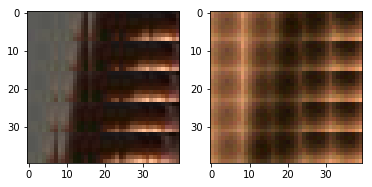

EPO: 4, recon_loss: 0.0295, total_loss: 0.0561, train_psnr:21.3959, validation_psnr:25.8965
EPO: 4, recon_loss: 0.0385, total_loss: 0.0598, train_psnr:20.9578, validation_psnr:26.3962
EPO: 4, recon_loss: 0.0239, total_loss: 0.0568, train_psnr:20.8617, validation_psnr:26.2690
EPO: 4, recon_loss: 0.0890, total_loss: 0.1071, train_psnr:20.8885, validation_psnr:26.0294
EPO: 4, recon_loss: 0.0365, total_loss: 0.0673, train_psnr:20.9287, validation_psnr:25.8603
EPO: 4, recon_loss: 0.0375, total_loss: 0.0654, train_psnr:20.7622, validation_psnr:25.5291
EPO: 4, recon_loss: 0.0247, total_loss: 0.0524, train_psnr:21.2102, validation_psnr:25.8344
EPO: 4, recon_loss: 0.0528, total_loss: 0.0802, train_psnr:21.4025, validation_psnr:26.4070
EPO: 4, recon_loss: 0.0847, total_loss: 0.0961, train_psnr:21.6976, validation_psnr:24.9801
EPO: 4, recon_loss: 0.0534, total_loss: 0.0622, train_psnr:21.6882, validation_psnr:24.6912
#########reconstruction test psnr: 23.9935 


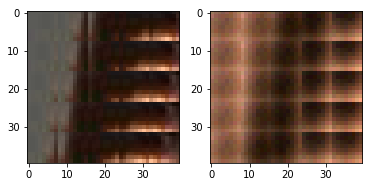

EPO: 4, recon_loss: 0.0182, total_loss: 0.0249, train_psnr:21.6002, validation_psnr:24.6782
EPO: 4, recon_loss: 0.0156, total_loss: 0.0264, train_psnr:21.5864, validation_psnr:25.3429
EPO: 4, recon_loss: 0.0129, total_loss: 0.0292, train_psnr:21.5393, validation_psnr:25.3260
EPO: 4, recon_loss: 0.0311, total_loss: 0.0421, train_psnr:21.4447, validation_psnr:25.8247
EPO: 4, recon_loss: 0.0160, total_loss: 0.0335, train_psnr:21.3850, validation_psnr:25.9577
EPO: 4, recon_loss: 0.0319, total_loss: 0.0457, train_psnr:21.3386, validation_psnr:26.4065
EPO: 4, recon_loss: 0.0109, total_loss: 0.0171, train_psnr:21.3903, validation_psnr:26.8383
EPO: 4, recon_loss: 0.0069, total_loss: 0.0112, train_psnr:21.3567, validation_psnr:27.2462
EPO: 4, recon_loss: 0.0153, total_loss: 0.0174, train_psnr:21.2426, validation_psnr:27.3317
EPO: 4, recon_loss: 0.0052, total_loss: 0.0069, train_psnr:21.0779, validation_psnr:27.1428
#########reconstruction test psnr: 25.7079 


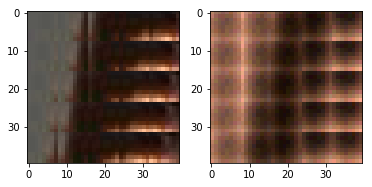

EPO: 4, recon_loss: 0.0096, total_loss: 0.0124, train_psnr:21.0213, validation_psnr:26.9915
EPO: 4, recon_loss: 0.0352, total_loss: 0.0607, train_psnr:21.0723, validation_psnr:26.3142
EPO: 4, recon_loss: 0.0175, total_loss: 0.0278, train_psnr:21.2816, validation_psnr:25.5446
EPO: 4, recon_loss: 0.0308, total_loss: 0.0381, train_psnr:21.2378, validation_psnr:24.9043
EPO: 4, recon_loss: 0.0173, total_loss: 0.0212, train_psnr:21.1764, validation_psnr:24.5110
EPO: 4, recon_loss: 0.0162, total_loss: 0.0189, train_psnr:21.1093, validation_psnr:24.0484
EPO: 4, recon_loss: 0.0325, total_loss: 0.0615, train_psnr:21.2424, validation_psnr:23.1093
EPO: 4, recon_loss: 0.0339, total_loss: 0.0500, train_psnr:21.4416, validation_psnr:23.6614
EPO: 4, recon_loss: 0.0373, total_loss: 0.0555, train_psnr:21.5038, validation_psnr:25.2800
EPO: 4, recon_loss: 0.0531, total_loss: 0.0688, train_psnr:21.6157, validation_psnr:24.9847
#########reconstruction test psnr: 24.1938 


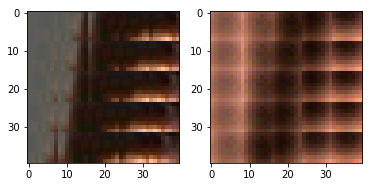

EPO: 4, recon_loss: 0.0192, total_loss: 0.0325, train_psnr:21.6651, validation_psnr:24.6532
EPO: 4, recon_loss: 0.0268, total_loss: 0.0377, train_psnr:21.7034, validation_psnr:24.2033
EPO: 4, recon_loss: 0.0170, total_loss: 0.0241, train_psnr:21.7869, validation_psnr:24.1803
EPO: 4, recon_loss: 0.0194, total_loss: 0.0256, train_psnr:21.7889, validation_psnr:24.4221
EPO: 4, recon_loss: 0.0161, total_loss: 0.0236, train_psnr:21.7763, validation_psnr:24.6907
EPO: 4, recon_loss: 0.0192, total_loss: 0.0275, train_psnr:21.7512, validation_psnr:24.5192
EPO: 4, recon_loss: 0.0086, total_loss: 0.0380, train_psnr:21.6714, validation_psnr:26.6060
EPO: 4, recon_loss: 0.0088, total_loss: 0.0229, train_psnr:21.8050, validation_psnr:25.8470
EPO: 4, recon_loss: 0.0368, total_loss: 0.0460, train_psnr:21.8080, validation_psnr:25.5222
EPO: 4, recon_loss: 0.0261, total_loss: 0.0365, train_psnr:21.7924, validation_psnr:25.6463
#########reconstruction test psnr: 24.7208 


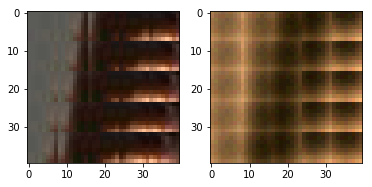

EPO: 4, recon_loss: 0.0182, total_loss: 0.0270, train_psnr:21.7889, validation_psnr:25.8132
EPO: 4, recon_loss: 0.0169, total_loss: 0.0264, train_psnr:21.7782, validation_psnr:25.9675
EPO: 4, recon_loss: 0.0093, total_loss: 0.0148, train_psnr:21.8059, validation_psnr:25.6705
EPO: 4, recon_loss: 0.0123, total_loss: 0.0174, train_psnr:21.7469, validation_psnr:25.5731
EPO: 4, recon_loss: 0.0171, total_loss: 0.0249, train_psnr:21.7558, validation_psnr:25.5151
EPO: 4, recon_loss: 0.0108, total_loss: 0.0153, train_psnr:21.6816, validation_psnr:25.4299
EPO: 4, recon_loss: 0.0174, total_loss: 0.0216, train_psnr:21.6295, validation_psnr:25.5039
EPO: 4, recon_loss: 0.0157, total_loss: 0.0231, train_psnr:21.7243, validation_psnr:25.3246
EPO: 4, recon_loss: 0.0247, total_loss: 0.0324, train_psnr:21.7486, validation_psnr:25.1747
EPO: 4, recon_loss: 0.0239, total_loss: 0.0349, train_psnr:21.7394, validation_psnr:25.3740
#########reconstruction test psnr: 24.5821 


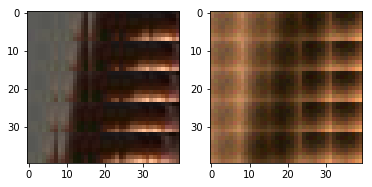

EPO: 4, recon_loss: 0.0167, total_loss: 0.0260, train_psnr:21.6787, validation_psnr:25.0414
EPO: 4, recon_loss: 0.0119, total_loss: 0.0197, train_psnr:21.6815, validation_psnr:24.8445
EPO: 4, recon_loss: 0.0178, total_loss: 0.0386, train_psnr:21.7071, validation_psnr:26.1164
EPO: 4, recon_loss: 0.0281, total_loss: 0.0450, train_psnr:21.7131, validation_psnr:25.8345
EPO: 4, recon_loss: 0.0560, total_loss: 0.0695, train_psnr:21.7048, validation_psnr:25.8746
EPO: 4, recon_loss: 0.0209, total_loss: 0.0325, train_psnr:21.7283, validation_psnr:25.5144
EPO: 4, recon_loss: 0.0644, total_loss: 0.0756, train_psnr:21.5721, validation_psnr:25.8442
EPO: 4, recon_loss: 0.0094, total_loss: 0.0171, train_psnr:21.6155, validation_psnr:25.9155
EPO: 4, recon_loss: 0.0135, total_loss: 0.0207, train_psnr:21.4876, validation_psnr:24.6070
EPO: 4, recon_loss: 0.0471, total_loss: 0.0534, train_psnr:21.3775, validation_psnr:24.8113
#########reconstruction test psnr: 24.0343 


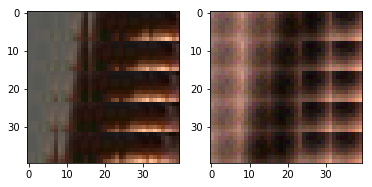

EPO: 4, recon_loss: 0.0145, total_loss: 0.0226, train_psnr:21.3038, validation_psnr:24.3788
EPO: 4, recon_loss: 0.0160, total_loss: 0.0251, train_psnr:21.2931, validation_psnr:25.3039
EPO: 4, recon_loss: 0.0225, total_loss: 0.0338, train_psnr:21.4790, validation_psnr:25.8531
EPO: 4, recon_loss: 0.0196, total_loss: 0.0351, train_psnr:21.4925, validation_psnr:26.0751
EPO: 4, recon_loss: 0.0371, total_loss: 0.0468, train_psnr:21.4748, validation_psnr:26.3903
EPO: 4, recon_loss: 0.0125, total_loss: 0.0232, train_psnr:21.4694, validation_psnr:26.5572
EPO: 4, recon_loss: 0.0216, total_loss: 0.0302, train_psnr:21.3736, validation_psnr:26.2780
EPO: 4, recon_loss: 0.0192, total_loss: 0.0269, train_psnr:21.4084, validation_psnr:26.3084
EPO: 4, recon_loss: 0.0233, total_loss: 0.0295, train_psnr:21.5083, validation_psnr:26.2011
EPO: 4, recon_loss: 0.0351, total_loss: 0.0487, train_psnr:21.5624, validation_psnr:26.4161
#########reconstruction test psnr: 25.2419 


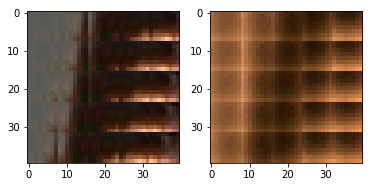

EPO: 4, recon_loss: 0.0163, total_loss: 0.0239, train_psnr:21.5683, validation_psnr:26.0710
EPO: 4, recon_loss: 0.0182, total_loss: 0.0280, train_psnr:21.5187, validation_psnr:25.8153
EPO: 4, recon_loss: 0.0275, total_loss: 0.0410, train_psnr:21.4953, validation_psnr:25.8614
EPO: 4, recon_loss: 0.0132, total_loss: 0.0290, train_psnr:21.5798, validation_psnr:25.6605
EPO: 4, recon_loss: 0.0352, total_loss: 0.0431, train_psnr:21.5635, validation_psnr:25.5646
EPO: 4, recon_loss: 0.0225, total_loss: 0.0362, train_psnr:21.5223, validation_psnr:26.0124
EPO: 4, recon_loss: 0.0301, total_loss: 0.0402, train_psnr:21.3945, validation_psnr:26.0799
EPO: 4, recon_loss: 0.0305, total_loss: 0.0568, train_psnr:21.4078, validation_psnr:26.3166
EPO: 4, recon_loss: 0.0052, total_loss: 0.0141, train_psnr:21.5459, validation_psnr:25.5976
EPO: 4, recon_loss: 0.0186, total_loss: 0.0263, train_psnr:21.6052, validation_psnr:25.5770
#########reconstruction test psnr: 24.7044 


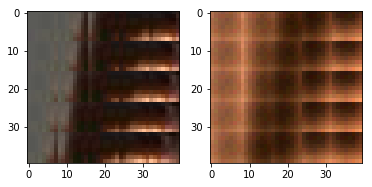

EPO: 4, recon_loss: 0.0115, total_loss: 0.0204, train_psnr:21.6283, validation_psnr:26.5560
EPO: 4, recon_loss: 0.0123, total_loss: 0.0225, train_psnr:21.6333, validation_psnr:26.7817
EPO: 4, recon_loss: 0.0196, total_loss: 0.0376, train_psnr:21.6808, validation_psnr:25.7166
EPO: 4, recon_loss: 0.0109, total_loss: 0.0233, train_psnr:21.7282, validation_psnr:25.7703
EPO: 4, recon_loss: 0.0338, total_loss: 0.0466, train_psnr:21.7244, validation_psnr:26.1472
EPO: 4, recon_loss: 0.0190, total_loss: 0.0319, train_psnr:21.7086, validation_psnr:25.7743
EPO: 4, recon_loss: 0.0344, total_loss: 0.0451, train_psnr:21.6437, validation_psnr:26.0947
EPO: 4, recon_loss: 0.0401, total_loss: 0.0579, train_psnr:21.6640, validation_psnr:25.7486
EPO: 4, recon_loss: 0.0134, total_loss: 0.0274, train_psnr:21.6135, validation_psnr:26.1395
EPO: 4, recon_loss: 0.0339, total_loss: 0.0461, train_psnr:21.5359, validation_psnr:26.2888
#########reconstruction test psnr: 25.1702 


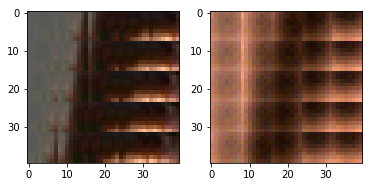

EPO: 4, recon_loss: 0.0160, total_loss: 0.0271, train_psnr:21.4936, validation_psnr:26.2812
EPO: 4, recon_loss: 0.0266, total_loss: 0.0367, train_psnr:21.4414, validation_psnr:26.2301
EPO: 4, recon_loss: 0.0093, total_loss: 0.0130, train_psnr:21.3984, validation_psnr:25.9412
EPO: 4, recon_loss: 0.0077, total_loss: 0.0119, train_psnr:21.4968, validation_psnr:26.2136
EPO: 4, recon_loss: 0.0110, total_loss: 0.0164, train_psnr:21.4800, validation_psnr:26.3433
EPO: 4, recon_loss: 0.0140, total_loss: 0.0211, train_psnr:21.4213, validation_psnr:26.3674
EPO: 4, recon_loss: 0.0235, total_loss: 0.0313, train_psnr:21.4731, validation_psnr:25.8833
EPO: 4, recon_loss: 0.0320, total_loss: 0.0629, train_psnr:21.4357, validation_psnr:26.6881
EPO: 4, recon_loss: 0.0364, total_loss: 0.0601, train_psnr:21.4397, validation_psnr:27.0677
EPO: 4, recon_loss: 0.0324, total_loss: 0.0573, train_psnr:21.3783, validation_psnr:26.8465
#########reconstruction test psnr: 25.6010 


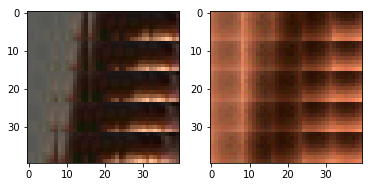

EPO: 4, recon_loss: 0.0386, total_loss: 0.0683, train_psnr:21.3838, validation_psnr:27.0349
EPO: 4, recon_loss: 0.0352, total_loss: 0.0679, train_psnr:21.3257, validation_psnr:26.9731
EPO: 4, recon_loss: 0.0291, total_loss: 0.0434, train_psnr:21.4168, validation_psnr:26.2065
EPO: 4, recon_loss: 0.0271, total_loss: 0.0377, train_psnr:21.6482, validation_psnr:24.3810
EPO: 4, recon_loss: 0.0488, total_loss: 0.0697, train_psnr:21.6745, validation_psnr:25.1782
EPO: 4, recon_loss: 0.0286, total_loss: 0.0516, train_psnr:21.7511, validation_psnr:26.9723
EPO: 4, recon_loss: 0.0262, total_loss: 0.0425, train_psnr:21.7630, validation_psnr:26.8484
EPO: 4, recon_loss: 0.0253, total_loss: 0.0404, train_psnr:21.7369, validation_psnr:26.7047
EPO: 4, recon_loss: 0.0237, total_loss: 0.0456, train_psnr:21.6869, validation_psnr:26.8411
EPO: 4, recon_loss: 0.0279, total_loss: 0.0462, train_psnr:21.6585, validation_psnr:26.9353
#########reconstruction test psnr: 25.7842 


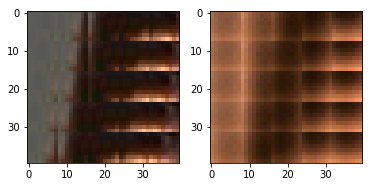

EPO: 4, recon_loss: 0.0265, total_loss: 0.0457, train_psnr:21.6351, validation_psnr:27.0237
EPO: 4, recon_loss: 0.0199, total_loss: 0.0336, train_psnr:21.5513, validation_psnr:26.6997
EPO: 4, recon_loss: 0.0259, total_loss: 0.0385, train_psnr:21.4141, validation_psnr:26.5658
EPO: 4, recon_loss: 0.0155, total_loss: 0.0289, train_psnr:21.4265, validation_psnr:26.5836
EPO: 4, recon_loss: 0.0229, total_loss: 0.0397, train_psnr:21.3828, validation_psnr:26.7975
EPO: 4, recon_loss: 0.0284, total_loss: 0.0409, train_psnr:21.3883, validation_psnr:26.5978
EPO: 4, recon_loss: 0.0108, total_loss: 0.0243, train_psnr:21.3275, validation_psnr:26.4331
EPO: 4, recon_loss: 0.0244, total_loss: 0.0374, train_psnr:21.2438, validation_psnr:26.3665
EPO: 4, recon_loss: 0.0085, total_loss: 0.0235, train_psnr:21.4670, validation_psnr:26.2760
EPO: 4, recon_loss: 0.0181, total_loss: 0.0365, train_psnr:21.5044, validation_psnr:25.8466
#########reconstruction test psnr: 24.9728 


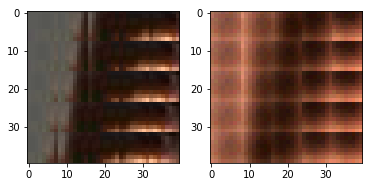

EPO: 4, recon_loss: 0.0449, total_loss: 0.0542, train_psnr:21.5789, validation_psnr:26.0996
EPO: 4, recon_loss: 0.0198, total_loss: 0.0387, train_psnr:21.6001, validation_psnr:26.2321
EPO: 4, recon_loss: 0.0301, total_loss: 0.0413, train_psnr:21.5373, validation_psnr:26.3343
EPO: 4, recon_loss: 0.0107, total_loss: 0.0264, train_psnr:21.5475, validation_psnr:26.1304
EPO: 4, recon_loss: 0.0193, total_loss: 0.0290, train_psnr:21.5679, validation_psnr:25.9485
EPO: 4, recon_loss: 0.0317, total_loss: 0.0413, train_psnr:21.5807, validation_psnr:26.6272
EPO: 4, recon_loss: 0.0173, total_loss: 0.0239, train_psnr:21.5914, validation_psnr:26.0887
EPO: 4, recon_loss: 0.0223, total_loss: 0.0393, train_psnr:21.6130, validation_psnr:25.9103
EPO: 4, recon_loss: 0.0104, total_loss: 0.0237, train_psnr:21.6701, validation_psnr:26.3853
EPO: 4, recon_loss: 0.0080, total_loss: 0.0216, train_psnr:21.7027, validation_psnr:26.3029
#########reconstruction test psnr: 25.3090 


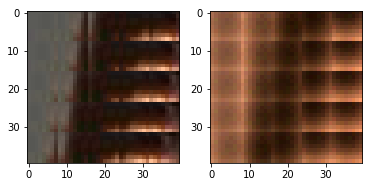

EPO: 4, recon_loss: 0.0244, total_loss: 0.0326, train_psnr:21.7021, validation_psnr:26.5622
EPO: 4, recon_loss: 0.0105, total_loss: 0.0200, train_psnr:21.7432, validation_psnr:26.1646
EPO: 4, recon_loss: 0.0140, total_loss: 0.0238, train_psnr:21.7423, validation_psnr:26.3678
EPO: 4, recon_loss: 0.0480, total_loss: 0.0689, train_psnr:21.7567, validation_psnr:25.1239
EPO: 4, recon_loss: 0.0349, total_loss: 0.0572, train_psnr:21.6083, validation_psnr:24.4535
EPO: 4, recon_loss: 0.0274, total_loss: 0.0360, train_psnr:21.4768, validation_psnr:25.0008
EPO: 4, recon_loss: 0.0381, total_loss: 0.0524, train_psnr:21.3967, validation_psnr:25.0504
EPO: 4, recon_loss: 0.0178, total_loss: 0.0279, train_psnr:21.3743, validation_psnr:25.7339
EPO: 4, recon_loss: 0.0149, total_loss: 0.0487, train_psnr:21.3599, validation_psnr:26.5354
EPO: 4, recon_loss: 0.0078, total_loss: 0.0307, train_psnr:21.3975, validation_psnr:25.8874
#########reconstruction test psnr: 24.8640 


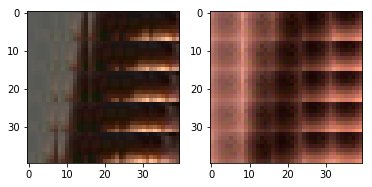

EPO: 4, recon_loss: 0.0329, total_loss: 0.0463, train_psnr:21.4409, validation_psnr:26.2441
EPO: 4, recon_loss: 0.0190, total_loss: 0.0316, train_psnr:21.4098, validation_psnr:26.5863
EPO: 4, recon_loss: 0.0305, total_loss: 0.0402, train_psnr:21.4192, validation_psnr:26.3266
EPO: 4, recon_loss: 0.0114, total_loss: 0.0163, train_psnr:21.4836, validation_psnr:26.6667
EPO: 4, recon_loss: 0.0056, total_loss: 0.0088, train_psnr:21.6179, validation_psnr:27.1140
EPO: 4, recon_loss: 0.0208, total_loss: 0.0252, train_psnr:21.6582, validation_psnr:26.7310
EPO: 4, recon_loss: 0.0087, total_loss: 0.0131, train_psnr:21.6876, validation_psnr:26.9000
EPO: 4, recon_loss: 0.0103, total_loss: 0.0146, train_psnr:21.7096, validation_psnr:26.8259
EPO: 4, recon_loss: 0.0215, total_loss: 0.0296, train_psnr:21.6447, validation_psnr:25.4517
EPO: 4, recon_loss: 0.0178, total_loss: 0.0267, train_psnr:21.6010, validation_psnr:25.5205
#########reconstruction test psnr: 24.5934 


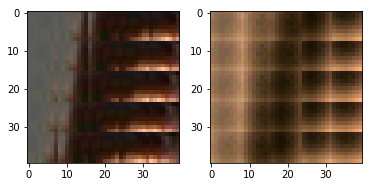

EPO: 4, recon_loss: 0.0270, total_loss: 0.0375, train_psnr:21.6335, validation_psnr:25.6817
EPO: 4, recon_loss: 0.0110, total_loss: 0.0193, train_psnr:21.5786, validation_psnr:25.4648
EPO: 4, recon_loss: 0.0150, total_loss: 0.0182, train_psnr:21.6211, validation_psnr:25.1838
EPO: 4, recon_loss: 0.0421, total_loss: 0.0638, train_psnr:21.7252, validation_psnr:26.2916
EPO: 4, recon_loss: 0.0294, total_loss: 0.0401, train_psnr:21.8019, validation_psnr:25.5977
EPO: 4, recon_loss: 0.0321, total_loss: 0.0413, train_psnr:21.6947, validation_psnr:25.5964
EPO: 4, recon_loss: 0.0246, total_loss: 0.0315, train_psnr:21.6069, validation_psnr:25.6489
EPO: 4, recon_loss: 0.0300, total_loss: 0.0380, train_psnr:21.4677, validation_psnr:25.2097
EPO: 4, recon_loss: 0.0415, total_loss: 0.0609, train_psnr:21.4755, validation_psnr:25.7894
EPO: 4, recon_loss: 0.0715, total_loss: 0.0969, train_psnr:21.6595, validation_psnr:25.4166
#########reconstruction test psnr: 24.5596 


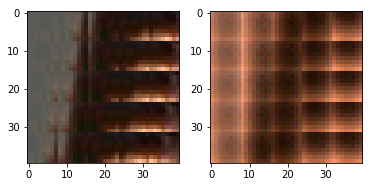

EPO: 4, recon_loss: 0.0238, total_loss: 0.0328, train_psnr:21.6809, validation_psnr:25.6994
EPO: 4, recon_loss: 0.0198, total_loss: 0.0280, train_psnr:21.6498, validation_psnr:25.4841
EPO: 4, recon_loss: 0.0224, total_loss: 0.0338, train_psnr:21.6249, validation_psnr:25.5304
EPO: 4, recon_loss: 0.0146, total_loss: 0.0274, train_psnr:21.7269, validation_psnr:24.9825
EPO: 4, recon_loss: 0.0083, total_loss: 0.0211, train_psnr:21.7515, validation_psnr:25.0481
EPO: 4, recon_loss: 0.0212, total_loss: 0.0287, train_psnr:21.7407, validation_psnr:25.1158
EPO: 4, recon_loss: 0.0198, total_loss: 0.0306, train_psnr:21.6790, validation_psnr:24.6823
EPO: 4, recon_loss: 0.0234, total_loss: 0.0301, train_psnr:21.6563, validation_psnr:24.7427
EPO: 4, recon_loss: 0.0082, total_loss: 0.0438, train_psnr:21.5463, validation_psnr:27.3175
EPO: 4, recon_loss: 0.0054, total_loss: 0.0189, train_psnr:21.6308, validation_psnr:26.3731
#########reconstruction test psnr: 25.2620 


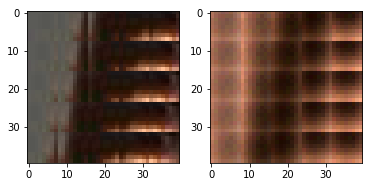

EPO: 4, recon_loss: 0.0140, total_loss: 0.0232, train_psnr:21.5722, validation_psnr:25.7680
EPO: 4, recon_loss: 0.0109, total_loss: 0.0214, train_psnr:21.5718, validation_psnr:26.4933
EPO: 4, recon_loss: 0.0042, total_loss: 0.0080, train_psnr:21.5478, validation_psnr:26.2407
EPO: 4, recon_loss: 0.0195, total_loss: 0.0289, train_psnr:21.5415, validation_psnr:26.8509
EPO: 4, recon_loss: 0.0293, total_loss: 0.0405, train_psnr:21.6889, validation_psnr:26.2594
EPO: 4, recon_loss: 0.0251, total_loss: 0.0363, train_psnr:21.5527, validation_psnr:25.9410
EPO: 4, recon_loss: 0.0329, total_loss: 0.0463, train_psnr:21.4037, validation_psnr:26.3823
EPO: 4, recon_loss: 0.0280, total_loss: 0.0405, train_psnr:21.3273, validation_psnr:25.5691
EPO: 4, recon_loss: 0.0245, total_loss: 0.0315, train_psnr:21.4069, validation_psnr:25.6350
EPO: 5, recon_loss: 0.0081, total_loss: 0.0132, train_psnr:21.6313, validation_psnr:25.8203
#########reconstruction test psnr: 24.9208 


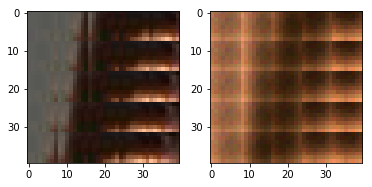

EPO: 5, recon_loss: 0.0100, total_loss: 0.0145, train_psnr:21.7416, validation_psnr:25.9350
EPO: 5, recon_loss: 0.0238, total_loss: 0.0320, train_psnr:21.6789, validation_psnr:26.2456
EPO: 5, recon_loss: 0.0122, total_loss: 0.0171, train_psnr:21.6647, validation_psnr:26.2791
EPO: 5, recon_loss: 0.0267, total_loss: 0.0302, train_psnr:21.6013, validation_psnr:26.2465
EPO: 5, recon_loss: 0.0076, total_loss: 0.0215, train_psnr:21.5010, validation_psnr:26.5432
EPO: 5, recon_loss: 0.0133, total_loss: 0.0241, train_psnr:21.4662, validation_psnr:26.5649
EPO: 5, recon_loss: 0.0189, total_loss: 0.0269, train_psnr:21.3831, validation_psnr:26.4421
EPO: 5, recon_loss: 0.0235, total_loss: 0.0305, train_psnr:21.2979, validation_psnr:26.2430
EPO: 5, recon_loss: 0.0235, total_loss: 0.0364, train_psnr:21.1895, validation_psnr:26.4929
EPO: 5, recon_loss: 0.0113, total_loss: 0.0250, train_psnr:21.4702, validation_psnr:26.0960
#########reconstruction test psnr: 25.1420 


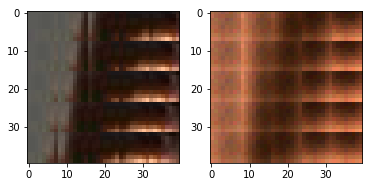

EPO: 5, recon_loss: 0.0117, total_loss: 0.0199, train_psnr:21.6551, validation_psnr:26.2610
EPO: 5, recon_loss: 0.0136, total_loss: 0.0236, train_psnr:21.6229, validation_psnr:26.5805
EPO: 5, recon_loss: 0.0126, total_loss: 0.0169, train_psnr:21.7079, validation_psnr:26.4227
EPO: 5, recon_loss: 0.0295, total_loss: 0.0381, train_psnr:21.6905, validation_psnr:26.3209
EPO: 5, recon_loss: 0.0148, total_loss: 0.0239, train_psnr:21.5386, validation_psnr:26.6869
EPO: 5, recon_loss: 0.0133, total_loss: 0.0214, train_psnr:21.3443, validation_psnr:26.6466
EPO: 5, recon_loss: 0.0190, total_loss: 0.0291, train_psnr:21.2786, validation_psnr:26.6860
EPO: 5, recon_loss: 0.0154, total_loss: 0.0246, train_psnr:21.1614, validation_psnr:26.5363
EPO: 5, recon_loss: 0.0174, total_loss: 0.0262, train_psnr:21.1154, validation_psnr:26.6384
EPO: 5, recon_loss: 0.0128, total_loss: 0.0185, train_psnr:21.2623, validation_psnr:27.0806
#########reconstruction test psnr: 25.8238 


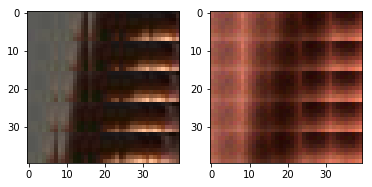

EPO: 5, recon_loss: 0.0096, total_loss: 0.0170, train_psnr:21.4318, validation_psnr:26.9936
EPO: 5, recon_loss: 0.0335, total_loss: 0.0389, train_psnr:21.4871, validation_psnr:26.8102
EPO: 5, recon_loss: 0.0098, total_loss: 0.0156, train_psnr:21.5421, validation_psnr:26.8160
EPO: 5, recon_loss: 0.0158, total_loss: 0.0192, train_psnr:21.5658, validation_psnr:26.8357
EPO: 5, recon_loss: 0.0348, total_loss: 0.0508, train_psnr:21.6377, validation_psnr:25.9568
EPO: 5, recon_loss: 0.0289, total_loss: 0.0459, train_psnr:21.6772, validation_psnr:26.1851
EPO: 5, recon_loss: 0.0362, total_loss: 0.0509, train_psnr:21.7177, validation_psnr:25.9344
EPO: 5, recon_loss: 0.0418, total_loss: 0.0529, train_psnr:21.7555, validation_psnr:25.9174
EPO: 5, recon_loss: 0.0271, total_loss: 0.0353, train_psnr:21.7084, validation_psnr:26.0801
EPO: 5, recon_loss: 0.0330, total_loss: 0.0530, train_psnr:21.7818, validation_psnr:26.0616
#########reconstruction test psnr: 25.1208 


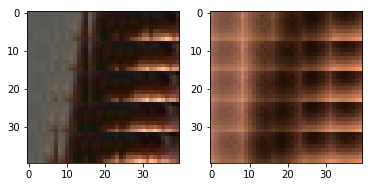

EPO: 5, recon_loss: 0.0132, total_loss: 0.0220, train_psnr:21.9164, validation_psnr:25.6185
EPO: 5, recon_loss: 0.0305, total_loss: 0.0370, train_psnr:21.9493, validation_psnr:25.5049
EPO: 5, recon_loss: 0.0112, total_loss: 0.0139, train_psnr:21.9642, validation_psnr:25.3447
EPO: 5, recon_loss: 0.0178, total_loss: 0.0251, train_psnr:21.9010, validation_psnr:24.9395
EPO: 5, recon_loss: 0.0059, total_loss: 0.0099, train_psnr:21.8658, validation_psnr:25.4418
EPO: 5, recon_loss: 0.0055, total_loss: 0.0112, train_psnr:21.8644, validation_psnr:26.2558
EPO: 5, recon_loss: 0.0152, total_loss: 0.0247, train_psnr:21.8293, validation_psnr:26.2381
EPO: 5, recon_loss: 0.0111, total_loss: 0.0210, train_psnr:21.8309, validation_psnr:26.6230
EPO: 5, recon_loss: 0.0135, total_loss: 0.0279, train_psnr:21.7918, validation_psnr:26.5530
EPO: 5, recon_loss: 0.0114, total_loss: 0.0308, train_psnr:21.8065, validation_psnr:26.4430
#########reconstruction test psnr: 25.3306 


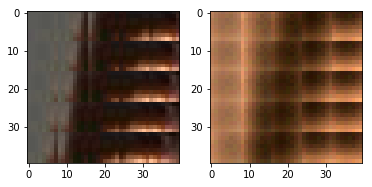

EPO: 5, recon_loss: 0.0087, total_loss: 0.0237, train_psnr:21.8965, validation_psnr:26.6618
EPO: 5, recon_loss: 0.0223, total_loss: 0.0333, train_psnr:21.9275, validation_psnr:26.6171
EPO: 5, recon_loss: 0.0083, total_loss: 0.0173, train_psnr:21.9399, validation_psnr:26.3776
EPO: 5, recon_loss: 0.0152, total_loss: 0.0262, train_psnr:21.9711, validation_psnr:26.4266
EPO: 5, recon_loss: 0.0199, total_loss: 0.0427, train_psnr:21.9551, validation_psnr:27.0517
EPO: 5, recon_loss: 0.0097, total_loss: 0.0213, train_psnr:21.9928, validation_psnr:27.3426
EPO: 5, recon_loss: 0.0398, total_loss: 0.0478, train_psnr:22.0161, validation_psnr:26.9892
EPO: 5, recon_loss: 0.0159, total_loss: 0.0231, train_psnr:21.9899, validation_psnr:26.9149
EPO: 5, recon_loss: 0.0166, total_loss: 0.0211, train_psnr:21.9744, validation_psnr:26.8949
EPO: 5, recon_loss: 0.0311, total_loss: 0.0414, train_psnr:21.9676, validation_psnr:26.5774
#########reconstruction test psnr: 25.5037 


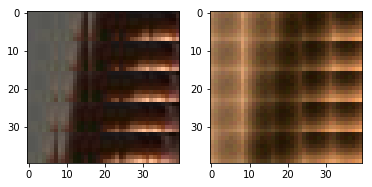

EPO: 5, recon_loss: 0.0154, total_loss: 0.0224, train_psnr:22.0422, validation_psnr:26.1098
EPO: 5, recon_loss: 0.0272, total_loss: 0.0374, train_psnr:22.0078, validation_psnr:26.4576
EPO: 5, recon_loss: 0.0203, total_loss: 0.0288, train_psnr:22.0013, validation_psnr:26.2266
EPO: 5, recon_loss: 0.0298, total_loss: 0.0370, train_psnr:21.9068, validation_psnr:26.4706
EPO: 5, recon_loss: 0.0576, total_loss: 0.0728, train_psnr:21.6404, validation_psnr:27.3108
EPO: 5, recon_loss: 0.0336, total_loss: 0.0515, train_psnr:21.2940, validation_psnr:26.6289
EPO: 5, recon_loss: 0.0397, total_loss: 0.0569, train_psnr:21.1351, validation_psnr:26.7057
EPO: 5, recon_loss: 0.0341, total_loss: 0.0502, train_psnr:21.1085, validation_psnr:26.5609
EPO: 5, recon_loss: 0.0234, total_loss: 0.0383, train_psnr:20.8496, validation_psnr:26.5691
EPO: 5, recon_loss: 0.0255, total_loss: 0.0422, train_psnr:20.8026, validation_psnr:25.3463
#########reconstruction test psnr: 24.5849 


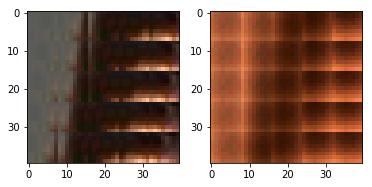

EPO: 5, recon_loss: 0.0172, total_loss: 0.0268, train_psnr:21.4267, validation_psnr:25.4432
EPO: 5, recon_loss: 0.0326, total_loss: 0.0445, train_psnr:21.4540, validation_psnr:25.1164
EPO: 5, recon_loss: 0.0291, total_loss: 0.0376, train_psnr:21.6095, validation_psnr:25.2274
EPO: 5, recon_loss: 0.0298, total_loss: 0.0459, train_psnr:21.5605, validation_psnr:25.7947
EPO: 5, recon_loss: 0.0379, total_loss: 0.0515, train_psnr:21.4653, validation_psnr:26.9067
EPO: 5, recon_loss: 0.0106, total_loss: 0.0259, train_psnr:21.6986, validation_psnr:26.4781
EPO: 5, recon_loss: 0.0318, total_loss: 0.0446, train_psnr:21.7703, validation_psnr:26.2216
EPO: 5, recon_loss: 0.0290, total_loss: 0.0455, train_psnr:21.8005, validation_psnr:25.9813
EPO: 5, recon_loss: 0.0120, total_loss: 0.0276, train_psnr:21.8553, validation_psnr:26.1737
EPO: 5, recon_loss: 0.0349, total_loss: 0.0487, train_psnr:21.8063, validation_psnr:26.3359
#########reconstruction test psnr: 25.3417 


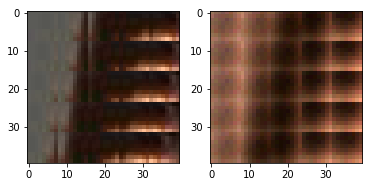

EPO: 5, recon_loss: 0.0192, total_loss: 0.0484, train_psnr:21.8741, validation_psnr:26.3780
EPO: 5, recon_loss: 0.0275, total_loss: 0.0513, train_psnr:21.8284, validation_psnr:26.6263
EPO: 5, recon_loss: 0.0544, total_loss: 0.0844, train_psnr:21.8409, validation_psnr:26.6860
EPO: 5, recon_loss: 0.0203, total_loss: 0.0463, train_psnr:21.8086, validation_psnr:26.4194
EPO: 5, recon_loss: 0.0301, total_loss: 0.0538, train_psnr:21.7332, validation_psnr:26.5532
EPO: 5, recon_loss: 0.0260, total_loss: 0.0481, train_psnr:21.3723, validation_psnr:26.8514
EPO: 5, recon_loss: 0.0309, total_loss: 0.0592, train_psnr:21.3563, validation_psnr:26.6447
EPO: 5, recon_loss: 0.0505, total_loss: 0.0757, train_psnr:21.3731, validation_psnr:26.4462
EPO: 5, recon_loss: 0.0494, total_loss: 0.0768, train_psnr:21.3566, validation_psnr:26.4811
EPO: 5, recon_loss: 0.0348, total_loss: 0.0599, train_psnr:21.2521, validation_psnr:26.3625
#########reconstruction test psnr: 25.4021 


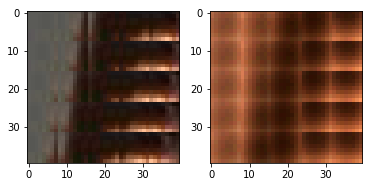

EPO: 5, recon_loss: 0.0185, total_loss: 0.0442, train_psnr:21.6567, validation_psnr:26.2670
EPO: 5, recon_loss: 0.0496, total_loss: 0.0750, train_psnr:21.8364, validation_psnr:25.5272
EPO: 5, recon_loss: 0.0646, total_loss: 0.0792, train_psnr:21.9919, validation_psnr:25.3424
EPO: 5, recon_loss: 0.0359, total_loss: 0.0433, train_psnr:21.9425, validation_psnr:25.1172
EPO: 5, recon_loss: 0.0179, total_loss: 0.0241, train_psnr:21.8906, validation_psnr:24.9967
EPO: 5, recon_loss: 0.0111, total_loss: 0.0217, train_psnr:21.9049, validation_psnr:25.7148
EPO: 5, recon_loss: 0.0130, total_loss: 0.0272, train_psnr:21.8760, validation_psnr:25.9558
EPO: 5, recon_loss: 0.0315, total_loss: 0.0416, train_psnr:21.7817, validation_psnr:26.4291
EPO: 5, recon_loss: 0.0142, total_loss: 0.0310, train_psnr:21.7718, validation_psnr:26.5179
EPO: 5, recon_loss: 0.0302, total_loss: 0.0412, train_psnr:21.7503, validation_psnr:26.8840
#########reconstruction test psnr: 25.7612 


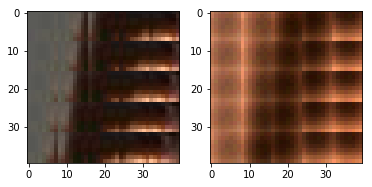

EPO: 5, recon_loss: 0.0065, total_loss: 0.0116, train_psnr:21.7770, validation_psnr:27.2494
EPO: 5, recon_loss: 0.0040, total_loss: 0.0078, train_psnr:21.7471, validation_psnr:27.4505
EPO: 5, recon_loss: 0.0121, total_loss: 0.0156, train_psnr:21.6566, validation_psnr:27.4797
EPO: 5, recon_loss: 0.0046, total_loss: 0.0070, train_psnr:21.5546, validation_psnr:27.3921
EPO: 5, recon_loss: 0.0104, total_loss: 0.0146, train_psnr:21.4991, validation_psnr:27.0290
EPO: 5, recon_loss: 0.0200, total_loss: 0.0377, train_psnr:21.5992, validation_psnr:26.3397
EPO: 5, recon_loss: 0.0138, total_loss: 0.0210, train_psnr:21.6510, validation_psnr:25.6688
EPO: 5, recon_loss: 0.0315, total_loss: 0.0377, train_psnr:21.5767, validation_psnr:25.3327
EPO: 5, recon_loss: 0.0138, total_loss: 0.0175, train_psnr:21.4748, validation_psnr:24.8470
EPO: 5, recon_loss: 0.0145, total_loss: 0.0185, train_psnr:21.3999, validation_psnr:24.7219
#########reconstruction test psnr: 24.0270 


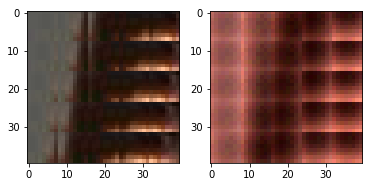

EPO: 5, recon_loss: 0.0245, total_loss: 0.0460, train_psnr:21.5751, validation_psnr:24.4140
EPO: 5, recon_loss: 0.0335, total_loss: 0.0497, train_psnr:21.7212, validation_psnr:24.8318
EPO: 5, recon_loss: 0.0348, total_loss: 0.0511, train_psnr:21.7773, validation_psnr:25.6503
EPO: 5, recon_loss: 0.0434, total_loss: 0.0593, train_psnr:21.8857, validation_psnr:25.3855
EPO: 5, recon_loss: 0.0162, total_loss: 0.0245, train_psnr:21.9169, validation_psnr:25.1381
EPO: 5, recon_loss: 0.0254, total_loss: 0.0346, train_psnr:22.0096, validation_psnr:25.0251
EPO: 5, recon_loss: 0.0140, total_loss: 0.0197, train_psnr:22.0639, validation_psnr:25.0536
EPO: 5, recon_loss: 0.0211, total_loss: 0.0292, train_psnr:22.0857, validation_psnr:25.0691
EPO: 5, recon_loss: 0.0129, total_loss: 0.0199, train_psnr:22.0925, validation_psnr:25.2617
EPO: 5, recon_loss: 0.0133, total_loss: 0.0197, train_psnr:22.0975, validation_psnr:25.2589
#########reconstruction test psnr: 24.4610 


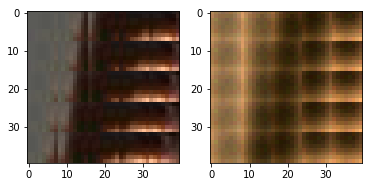

EPO: 5, recon_loss: 0.0178, total_loss: 0.0442, train_psnr:22.0694, validation_psnr:26.8408
EPO: 5, recon_loss: 0.0063, total_loss: 0.0174, train_psnr:22.1200, validation_psnr:26.1229
EPO: 5, recon_loss: 0.0315, total_loss: 0.0425, train_psnr:22.0983, validation_psnr:26.1253
EPO: 5, recon_loss: 0.0164, total_loss: 0.0244, train_psnr:22.0758, validation_psnr:26.0914
EPO: 5, recon_loss: 0.0193, total_loss: 0.0270, train_psnr:22.0791, validation_psnr:26.0813
EPO: 5, recon_loss: 0.0080, total_loss: 0.0131, train_psnr:22.0542, validation_psnr:26.4469
EPO: 5, recon_loss: 0.0070, total_loss: 0.0126, train_psnr:22.1005, validation_psnr:26.0300
EPO: 5, recon_loss: 0.0136, total_loss: 0.0190, train_psnr:22.0848, validation_psnr:25.9896
EPO: 5, recon_loss: 0.0119, total_loss: 0.0184, train_psnr:22.1039, validation_psnr:25.9913
EPO: 5, recon_loss: 0.0094, total_loss: 0.0142, train_psnr:22.0554, validation_psnr:25.7688
#########reconstruction test psnr: 24.9079 


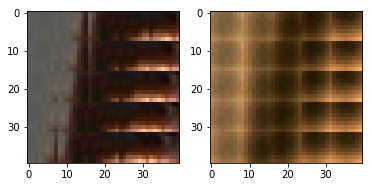

EPO: 5, recon_loss: 0.0257, total_loss: 0.0351, train_psnr:22.0730, validation_psnr:25.9649
EPO: 5, recon_loss: 0.0131, total_loss: 0.0206, train_psnr:22.0799, validation_psnr:25.8005
EPO: 5, recon_loss: 0.0237, total_loss: 0.0327, train_psnr:22.0840, validation_psnr:25.8999
EPO: 5, recon_loss: 0.0173, total_loss: 0.0272, train_psnr:22.0390, validation_psnr:25.8698
EPO: 5, recon_loss: 0.0122, total_loss: 0.0219, train_psnr:22.0134, validation_psnr:25.8756
EPO: 5, recon_loss: 0.0187, total_loss: 0.0434, train_psnr:22.0018, validation_psnr:26.4224
EPO: 5, recon_loss: 0.0175, total_loss: 0.0352, train_psnr:22.0042, validation_psnr:26.2631
EPO: 5, recon_loss: 0.0417, total_loss: 0.0547, train_psnr:21.9950, validation_psnr:25.9747
EPO: 5, recon_loss: 0.0318, total_loss: 0.0453, train_psnr:21.9848, validation_psnr:26.3095
EPO: 5, recon_loss: 0.0196, total_loss: 0.0302, train_psnr:21.9711, validation_psnr:25.8766
#########reconstruction test psnr: 24.9921 


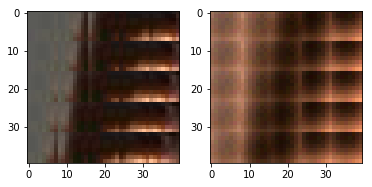

EPO: 5, recon_loss: 0.0509, total_loss: 0.0642, train_psnr:21.8533, validation_psnr:26.4928
EPO: 5, recon_loss: 0.0065, total_loss: 0.0135, train_psnr:21.8501, validation_psnr:25.9455
EPO: 5, recon_loss: 0.0220, total_loss: 0.0318, train_psnr:21.7831, validation_psnr:25.0714
EPO: 5, recon_loss: 0.0310, total_loss: 0.0410, train_psnr:21.7044, validation_psnr:25.0706
EPO: 5, recon_loss: 0.0175, total_loss: 0.0261, train_psnr:21.6827, validation_psnr:24.9358
EPO: 5, recon_loss: 0.0124, total_loss: 0.0230, train_psnr:21.6567, validation_psnr:25.8324
EPO: 5, recon_loss: 0.0212, total_loss: 0.0334, train_psnr:21.7560, validation_psnr:26.2580
EPO: 5, recon_loss: 0.0218, total_loss: 0.0362, train_psnr:21.7557, validation_psnr:26.6079
EPO: 5, recon_loss: 0.0301, total_loss: 0.0428, train_psnr:21.7501, validation_psnr:26.9573
EPO: 5, recon_loss: 0.0093, total_loss: 0.0178, train_psnr:21.7484, validation_psnr:26.9253
#########reconstruction test psnr: 25.7826 


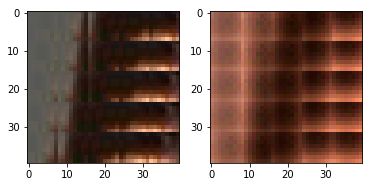

EPO: 5, recon_loss: 0.0262, total_loss: 0.0338, train_psnr:21.6822, validation_psnr:26.5410
EPO: 5, recon_loss: 0.0135, total_loss: 0.0199, train_psnr:21.8097, validation_psnr:26.8647
EPO: 5, recon_loss: 0.0266, total_loss: 0.0333, train_psnr:21.9246, validation_psnr:27.0300
EPO: 5, recon_loss: 0.0284, total_loss: 0.0401, train_psnr:21.9735, validation_psnr:26.8168
EPO: 5, recon_loss: 0.0151, total_loss: 0.0236, train_psnr:21.9945, validation_psnr:26.7589
EPO: 5, recon_loss: 0.0155, total_loss: 0.0242, train_psnr:21.9783, validation_psnr:26.6738
EPO: 5, recon_loss: 0.0228, total_loss: 0.0356, train_psnr:21.9920, validation_psnr:26.5519
EPO: 5, recon_loss: 0.0132, total_loss: 0.0256, train_psnr:22.0246, validation_psnr:26.1570
EPO: 5, recon_loss: 0.0394, total_loss: 0.0453, train_psnr:21.9481, validation_psnr:26.5540
EPO: 5, recon_loss: 0.0202, total_loss: 0.0335, train_psnr:21.8853, validation_psnr:26.3907
#########reconstruction test psnr: 25.3978 


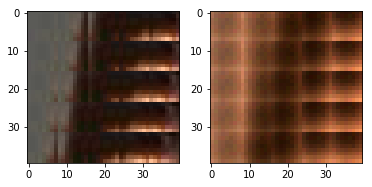

EPO: 5, recon_loss: 0.0270, total_loss: 0.0364, train_psnr:21.7916, validation_psnr:26.6511
EPO: 5, recon_loss: 0.0217, total_loss: 0.0386, train_psnr:21.8513, validation_psnr:26.6885
EPO: 5, recon_loss: 0.0051, total_loss: 0.0127, train_psnr:21.9245, validation_psnr:26.2684
EPO: 5, recon_loss: 0.0205, total_loss: 0.0274, train_psnr:21.9679, validation_psnr:26.6163
EPO: 5, recon_loss: 0.0142, total_loss: 0.0229, train_psnr:21.9804, validation_psnr:26.9884
EPO: 5, recon_loss: 0.0160, total_loss: 0.0253, train_psnr:21.9719, validation_psnr:27.1533
EPO: 5, recon_loss: 0.0192, total_loss: 0.0351, train_psnr:22.0087, validation_psnr:26.4904
EPO: 5, recon_loss: 0.0189, total_loss: 0.0293, train_psnr:22.0232, validation_psnr:26.1000
EPO: 5, recon_loss: 0.0423, total_loss: 0.0536, train_psnr:21.9915, validation_psnr:26.0607
EPO: 5, recon_loss: 0.0162, total_loss: 0.0284, train_psnr:21.9699, validation_psnr:26.0188
#########reconstruction test psnr: 25.0808 


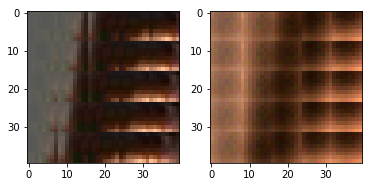

EPO: 5, recon_loss: 0.0359, total_loss: 0.0472, train_psnr:21.9065, validation_psnr:26.4396
EPO: 5, recon_loss: 0.0234, total_loss: 0.0393, train_psnr:21.9296, validation_psnr:26.5566
EPO: 5, recon_loss: 0.0094, total_loss: 0.0197, train_psnr:21.8563, validation_psnr:26.4428
EPO: 5, recon_loss: 0.0364, total_loss: 0.0494, train_psnr:21.7968, validation_psnr:26.3804
EPO: 5, recon_loss: 0.0133, total_loss: 0.0237, train_psnr:21.7518, validation_psnr:26.3644
EPO: 5, recon_loss: 0.0281, total_loss: 0.0374, train_psnr:21.6959, validation_psnr:26.5704
EPO: 5, recon_loss: 0.0077, total_loss: 0.0103, train_psnr:21.6907, validation_psnr:26.2599
EPO: 5, recon_loss: 0.0072, total_loss: 0.0113, train_psnr:21.7898, validation_psnr:26.7314
EPO: 5, recon_loss: 0.0153, total_loss: 0.0220, train_psnr:21.7897, validation_psnr:26.5956
EPO: 5, recon_loss: 0.0134, total_loss: 0.0211, train_psnr:21.7413, validation_psnr:26.5389
#########reconstruction test psnr: 25.4404 


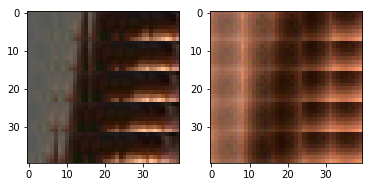

EPO: 5, recon_loss: 0.0176, total_loss: 0.0234, train_psnr:21.7622, validation_psnr:26.4120
EPO: 5, recon_loss: 0.0308, total_loss: 0.0583, train_psnr:21.7472, validation_psnr:27.0860
EPO: 5, recon_loss: 0.0270, total_loss: 0.0506, train_psnr:21.7370, validation_psnr:27.6281
EPO: 5, recon_loss: 0.0324, total_loss: 0.0633, train_psnr:21.7153, validation_psnr:27.4698
EPO: 5, recon_loss: 0.0295, total_loss: 0.0549, train_psnr:21.7338, validation_psnr:27.5543
EPO: 5, recon_loss: 0.0322, total_loss: 0.0631, train_psnr:21.6896, validation_psnr:27.4211
EPO: 5, recon_loss: 0.0185, total_loss: 0.0320, train_psnr:21.8484, validation_psnr:26.3194
EPO: 5, recon_loss: 0.0194, total_loss: 0.0297, train_psnr:21.8782, validation_psnr:25.0301
EPO: 5, recon_loss: 0.0324, total_loss: 0.0572, train_psnr:21.9169, validation_psnr:25.8203
EPO: 5, recon_loss: 0.0241, total_loss: 0.0429, train_psnr:21.9845, validation_psnr:27.3282
#########reconstruction test psnr: 26.1113 


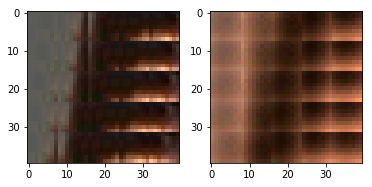

EPO: 5, recon_loss: 0.0179, total_loss: 0.0313, train_psnr:22.0073, validation_psnr:27.2626
EPO: 5, recon_loss: 0.0133, total_loss: 0.0405, train_psnr:22.0001, validation_psnr:26.8597
EPO: 5, recon_loss: 0.0181, total_loss: 0.0379, train_psnr:21.9727, validation_psnr:27.3161
EPO: 5, recon_loss: 0.0312, total_loss: 0.0492, train_psnr:21.9760, validation_psnr:27.2073
EPO: 5, recon_loss: 0.0160, total_loss: 0.0300, train_psnr:21.9526, validation_psnr:27.4640
EPO: 5, recon_loss: 0.0144, total_loss: 0.0276, train_psnr:21.9185, validation_psnr:27.2325
EPO: 5, recon_loss: 0.0246, total_loss: 0.0363, train_psnr:21.8537, validation_psnr:27.1881
EPO: 5, recon_loss: 0.0110, total_loss: 0.0247, train_psnr:21.8244, validation_psnr:27.0889
EPO: 5, recon_loss: 0.0339, total_loss: 0.0466, train_psnr:21.7975, validation_psnr:27.1815
EPO: 5, recon_loss: 0.0154, total_loss: 0.0273, train_psnr:21.7566, validation_psnr:27.0597
#########reconstruction test psnr: 25.9753 


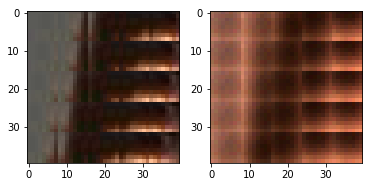

EPO: 5, recon_loss: 0.0103, total_loss: 0.0231, train_psnr:21.7008, validation_psnr:27.0071
EPO: 5, recon_loss: 0.0175, total_loss: 0.0262, train_psnr:21.6782, validation_psnr:26.4198
EPO: 5, recon_loss: 0.0081, total_loss: 0.0210, train_psnr:21.7526, validation_psnr:26.7608
EPO: 5, recon_loss: 0.0334, total_loss: 0.0506, train_psnr:21.8163, validation_psnr:26.5796
EPO: 5, recon_loss: 0.0310, total_loss: 0.0460, train_psnr:21.8257, validation_psnr:26.3177
EPO: 5, recon_loss: 0.0209, total_loss: 0.0376, train_psnr:21.8411, validation_psnr:26.8522
EPO: 5, recon_loss: 0.0311, total_loss: 0.0437, train_psnr:21.7845, validation_psnr:27.1323
EPO: 5, recon_loss: 0.0083, total_loss: 0.0196, train_psnr:21.8212, validation_psnr:26.5168
EPO: 5, recon_loss: 0.0376, total_loss: 0.0509, train_psnr:21.8431, validation_psnr:26.4280
EPO: 5, recon_loss: 0.0274, total_loss: 0.0349, train_psnr:21.8431, validation_psnr:26.6352
#########reconstruction test psnr: 25.5783 


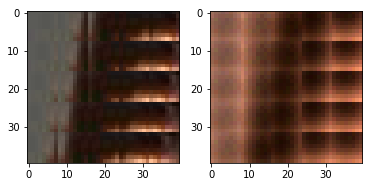

EPO: 5, recon_loss: 0.0245, total_loss: 0.0344, train_psnr:21.8441, validation_psnr:26.3138
EPO: 5, recon_loss: 0.0198, total_loss: 0.0320, train_psnr:21.8390, validation_psnr:26.4710
EPO: 5, recon_loss: 0.0085, total_loss: 0.0208, train_psnr:21.9330, validation_psnr:26.7890
EPO: 5, recon_loss: 0.0217, total_loss: 0.0355, train_psnr:21.9914, validation_psnr:26.8451
EPO: 5, recon_loss: 0.0141, total_loss: 0.0245, train_psnr:21.9841, validation_psnr:26.7589
EPO: 5, recon_loss: 0.0125, total_loss: 0.0205, train_psnr:22.0311, validation_psnr:26.6349
EPO: 5, recon_loss: 0.0120, total_loss: 0.0195, train_psnr:22.0276, validation_psnr:26.6786
EPO: 5, recon_loss: 0.0422, total_loss: 0.0661, train_psnr:21.9659, validation_psnr:25.6346
EPO: 5, recon_loss: 0.0305, total_loss: 0.0468, train_psnr:21.8593, validation_psnr:25.2519
EPO: 5, recon_loss: 0.0278, total_loss: 0.0376, train_psnr:21.7138, validation_psnr:25.3812
#########reconstruction test psnr: 24.5320 


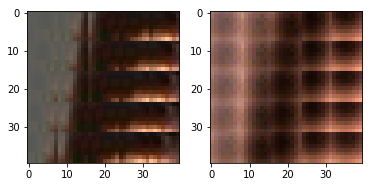

EPO: 5, recon_loss: 0.0343, total_loss: 0.0477, train_psnr:21.6706, validation_psnr:25.6931
EPO: 5, recon_loss: 0.0303, total_loss: 0.0355, train_psnr:21.6095, validation_psnr:26.0425
EPO: 5, recon_loss: 0.0129, total_loss: 0.0416, train_psnr:21.6277, validation_psnr:26.4856
EPO: 5, recon_loss: 0.0085, total_loss: 0.0272, train_psnr:21.6568, validation_psnr:26.0146
EPO: 5, recon_loss: 0.0350, total_loss: 0.0469, train_psnr:21.6994, validation_psnr:26.4626
EPO: 5, recon_loss: 0.0181, total_loss: 0.0293, train_psnr:21.7119, validation_psnr:26.8507
EPO: 5, recon_loss: 0.0326, total_loss: 0.0420, train_psnr:21.7285, validation_psnr:26.4302
EPO: 5, recon_loss: 0.0075, total_loss: 0.0114, train_psnr:21.8156, validation_psnr:26.9299
EPO: 5, recon_loss: 0.0047, total_loss: 0.0078, train_psnr:21.9144, validation_psnr:27.2856
EPO: 5, recon_loss: 0.0230, total_loss: 0.0268, train_psnr:21.9378, validation_psnr:26.8996
#########reconstruction test psnr: 25.7387 


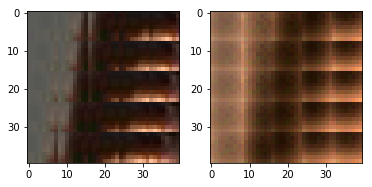

EPO: 5, recon_loss: 0.0062, total_loss: 0.0107, train_psnr:21.9772, validation_psnr:27.2798
EPO: 5, recon_loss: 0.0110, total_loss: 0.0166, train_psnr:22.0049, validation_psnr:26.8630
EPO: 5, recon_loss: 0.0221, total_loss: 0.0318, train_psnr:21.9416, validation_psnr:25.8049
EPO: 5, recon_loss: 0.0222, total_loss: 0.0312, train_psnr:21.9305, validation_psnr:26.0182
EPO: 5, recon_loss: 0.0237, total_loss: 0.0317, train_psnr:21.9355, validation_psnr:25.8385
EPO: 5, recon_loss: 0.0120, total_loss: 0.0192, train_psnr:21.9301, validation_psnr:25.4767
EPO: 5, recon_loss: 0.0182, total_loss: 0.0232, train_psnr:21.9557, validation_psnr:25.4493
EPO: 5, recon_loss: 0.0283, total_loss: 0.0412, train_psnr:22.0253, validation_psnr:26.6410
EPO: 5, recon_loss: 0.0260, total_loss: 0.0377, train_psnr:22.0172, validation_psnr:26.0454
EPO: 5, recon_loss: 0.0322, total_loss: 0.0378, train_psnr:21.9329, validation_psnr:26.0644
#########reconstruction test psnr: 25.1197 


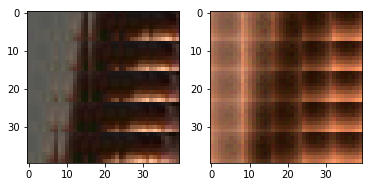

EPO: 5, recon_loss: 0.0235, total_loss: 0.0311, train_psnr:21.8494, validation_psnr:26.1682
EPO: 5, recon_loss: 0.0232, total_loss: 0.0301, train_psnr:21.7537, validation_psnr:25.9681
EPO: 5, recon_loss: 0.0291, total_loss: 0.0518, train_psnr:21.7624, validation_psnr:26.2808
EPO: 5, recon_loss: 0.0605, total_loss: 0.0793, train_psnr:21.8794, validation_psnr:26.0240
EPO: 5, recon_loss: 0.0260, total_loss: 0.0351, train_psnr:21.9564, validation_psnr:25.9308
EPO: 5, recon_loss: 0.0222, total_loss: 0.0314, train_psnr:21.9940, validation_psnr:25.9690
EPO: 5, recon_loss: 0.0176, total_loss: 0.0278, train_psnr:21.9928, validation_psnr:26.2808
EPO: 5, recon_loss: 0.0143, total_loss: 0.0251, train_psnr:22.0521, validation_psnr:25.3365
EPO: 5, recon_loss: 0.0074, total_loss: 0.0178, train_psnr:22.0180, validation_psnr:25.4589
EPO: 5, recon_loss: 0.0219, total_loss: 0.0272, train_psnr:21.9768, validation_psnr:25.4310
#########reconstruction test psnr: 24.5716 


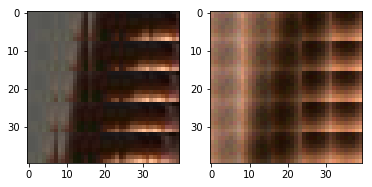

EPO: 5, recon_loss: 0.0135, total_loss: 0.0245, train_psnr:21.9346, validation_psnr:25.1034
EPO: 5, recon_loss: 0.0172, total_loss: 0.0226, train_psnr:21.8834, validation_psnr:25.2778
EPO: 5, recon_loss: 0.0112, total_loss: 0.0399, train_psnr:21.8235, validation_psnr:27.2604
EPO: 5, recon_loss: 0.0048, total_loss: 0.0171, train_psnr:21.8835, validation_psnr:26.6510
EPO: 5, recon_loss: 0.0167, total_loss: 0.0276, train_psnr:21.8610, validation_psnr:26.7351
EPO: 5, recon_loss: 0.0060, total_loss: 0.0115, train_psnr:21.8489, validation_psnr:26.4004
EPO: 5, recon_loss: 0.0043, total_loss: 0.0078, train_psnr:21.8302, validation_psnr:26.5887
EPO: 5, recon_loss: 0.0235, total_loss: 0.0373, train_psnr:21.9073, validation_psnr:27.2153
EPO: 5, recon_loss: 0.0225, total_loss: 0.0339, train_psnr:21.9648, validation_psnr:26.6371
EPO: 5, recon_loss: 0.0228, total_loss: 0.0359, train_psnr:21.9328, validation_psnr:26.5308
#########reconstruction test psnr: 25.4631 


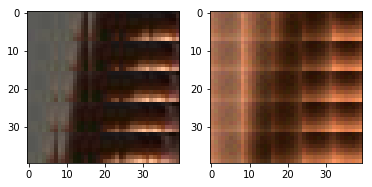

EPO: 5, recon_loss: 0.0234, total_loss: 0.0356, train_psnr:21.9098, validation_psnr:26.7874
EPO: 5, recon_loss: 0.0242, total_loss: 0.0344, train_psnr:21.8542, validation_psnr:26.1030
EPO: 6, recon_loss: 0.0127, total_loss: 0.0220, train_psnr:21.9543, validation_psnr:26.3687
EPO: 6, recon_loss: 0.0073, total_loss: 0.0116, train_psnr:22.0506, validation_psnr:26.3219
EPO: 6, recon_loss: 0.0161, total_loss: 0.0206, train_psnr:22.0967, validation_psnr:26.3313
EPO: 6, recon_loss: 0.0188, total_loss: 0.0245, train_psnr:22.0428, validation_psnr:26.5661
EPO: 6, recon_loss: 0.0099, total_loss: 0.0144, train_psnr:22.0203, validation_psnr:26.5857
EPO: 6, recon_loss: 0.0118, total_loss: 0.0363, train_psnr:21.9645, validation_psnr:27.0110
EPO: 6, recon_loss: 0.0056, total_loss: 0.0171, train_psnr:21.9197, validation_psnr:27.1745
EPO: 6, recon_loss: 0.0140, total_loss: 0.0239, train_psnr:21.8853, validation_psnr:27.3312
#########reconstruction test psnr: 26.1297 


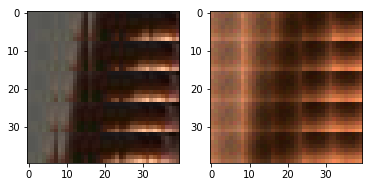

EPO: 6, recon_loss: 0.0190, total_loss: 0.0261, train_psnr:21.8351, validation_psnr:26.8020
EPO: 6, recon_loss: 0.0161, total_loss: 0.0248, train_psnr:21.7774, validation_psnr:27.0196
EPO: 6, recon_loss: 0.0165, total_loss: 0.0319, train_psnr:21.7666, validation_psnr:26.5427
EPO: 6, recon_loss: 0.0093, total_loss: 0.0207, train_psnr:21.9043, validation_psnr:26.7578
EPO: 6, recon_loss: 0.0143, total_loss: 0.0269, train_psnr:21.9591, validation_psnr:26.4589
EPO: 6, recon_loss: 0.0107, total_loss: 0.0178, train_psnr:21.9492, validation_psnr:26.8110
EPO: 6, recon_loss: 0.0159, total_loss: 0.0209, train_psnr:21.9907, validation_psnr:26.5529
EPO: 6, recon_loss: 0.0340, total_loss: 0.0427, train_psnr:21.9706, validation_psnr:26.8318
EPO: 6, recon_loss: 0.0130, total_loss: 0.0207, train_psnr:21.8035, validation_psnr:27.1100
EPO: 6, recon_loss: 0.0159, total_loss: 0.0268, train_psnr:21.6460, validation_psnr:27.0498
#########reconstruction test psnr: 25.8774 


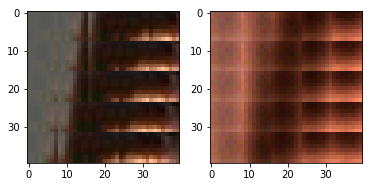

EPO: 6, recon_loss: 0.0188, total_loss: 0.0280, train_psnr:21.5760, validation_psnr:27.3355
EPO: 6, recon_loss: 0.0136, total_loss: 0.0210, train_psnr:21.4526, validation_psnr:26.8502
EPO: 6, recon_loss: 0.0195, total_loss: 0.0268, train_psnr:21.4129, validation_psnr:27.1559
EPO: 6, recon_loss: 0.0115, total_loss: 0.0173, train_psnr:21.5610, validation_psnr:27.4671
EPO: 6, recon_loss: 0.0149, total_loss: 0.0212, train_psnr:21.7227, validation_psnr:27.3538
EPO: 6, recon_loss: 0.0292, total_loss: 0.0350, train_psnr:21.7547, validation_psnr:27.1280
EPO: 6, recon_loss: 0.0089, total_loss: 0.0149, train_psnr:21.8215, validation_psnr:27.0824
EPO: 6, recon_loss: 0.0178, total_loss: 0.0209, train_psnr:21.8491, validation_psnr:27.0645
EPO: 6, recon_loss: 0.0370, total_loss: 0.0559, train_psnr:21.8695, validation_psnr:26.1702
EPO: 6, recon_loss: 0.0186, total_loss: 0.0325, train_psnr:21.9071, validation_psnr:26.7644
#########reconstruction test psnr: 25.6620 


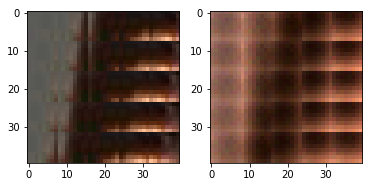

EPO: 6, recon_loss: 0.0318, total_loss: 0.0444, train_psnr:21.9566, validation_psnr:26.3739
EPO: 6, recon_loss: 0.0286, total_loss: 0.0384, train_psnr:21.9663, validation_psnr:26.5143
EPO: 6, recon_loss: 0.0397, total_loss: 0.0487, train_psnr:21.9373, validation_psnr:26.3235
EPO: 6, recon_loss: 0.0315, total_loss: 0.0467, train_psnr:22.0557, validation_psnr:26.3210
EPO: 6, recon_loss: 0.0170, total_loss: 0.0249, train_psnr:22.1695, validation_psnr:25.8337
EPO: 6, recon_loss: 0.0261, total_loss: 0.0329, train_psnr:22.1917, validation_psnr:25.6922
EPO: 6, recon_loss: 0.0147, total_loss: 0.0176, train_psnr:22.2192, validation_psnr:25.5446
EPO: 6, recon_loss: 0.0156, total_loss: 0.0222, train_psnr:22.1592, validation_psnr:25.3242
EPO: 6, recon_loss: 0.0049, total_loss: 0.0082, train_psnr:22.1602, validation_psnr:25.8070
EPO: 6, recon_loss: 0.0055, total_loss: 0.0112, train_psnr:22.1391, validation_psnr:26.6691
#########reconstruction test psnr: 25.5778 


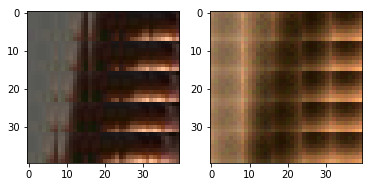

EPO: 6, recon_loss: 0.0181, total_loss: 0.0276, train_psnr:22.0967, validation_psnr:26.7814
EPO: 6, recon_loss: 0.0095, total_loss: 0.0186, train_psnr:22.0995, validation_psnr:27.0148
EPO: 6, recon_loss: 0.0127, total_loss: 0.0272, train_psnr:22.0632, validation_psnr:26.9904
EPO: 6, recon_loss: 0.0108, total_loss: 0.0263, train_psnr:22.0879, validation_psnr:27.0484
EPO: 6, recon_loss: 0.0092, total_loss: 0.0244, train_psnr:22.1720, validation_psnr:27.0622
EPO: 6, recon_loss: 0.0222, total_loss: 0.0328, train_psnr:22.1956, validation_psnr:26.8333
EPO: 6, recon_loss: 0.0062, total_loss: 0.0151, train_psnr:22.2047, validation_psnr:26.6397
EPO: 6, recon_loss: 0.0188, total_loss: 0.0282, train_psnr:22.2252, validation_psnr:27.0303
EPO: 6, recon_loss: 0.0378, total_loss: 0.0616, train_psnr:22.1987, validation_psnr:27.6624
EPO: 6, recon_loss: 0.0087, total_loss: 0.0197, train_psnr:22.2700, validation_psnr:27.5408
#########reconstruction test psnr: 26.2930 


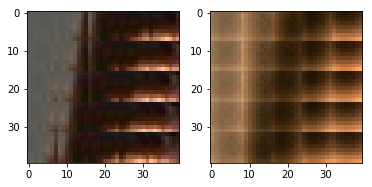

EPO: 6, recon_loss: 0.0421, total_loss: 0.0483, train_psnr:22.2657, validation_psnr:27.2342
EPO: 6, recon_loss: 0.0106, total_loss: 0.0176, train_psnr:22.2661, validation_psnr:27.1270
EPO: 6, recon_loss: 0.0163, total_loss: 0.0198, train_psnr:22.2426, validation_psnr:27.1428
EPO: 6, recon_loss: 0.0234, total_loss: 0.0341, train_psnr:22.2382, validation_psnr:26.7512
EPO: 6, recon_loss: 0.0132, total_loss: 0.0204, train_psnr:22.2909, validation_psnr:26.5965
EPO: 6, recon_loss: 0.0216, total_loss: 0.0313, train_psnr:22.2517, validation_psnr:26.7008
EPO: 6, recon_loss: 0.0151, total_loss: 0.0207, train_psnr:22.2622, validation_psnr:26.6427
EPO: 6, recon_loss: 0.0245, total_loss: 0.0312, train_psnr:22.1702, validation_psnr:27.1681
EPO: 6, recon_loss: 0.0467, total_loss: 0.0635, train_psnr:21.8859, validation_psnr:27.6646
EPO: 6, recon_loss: 0.0238, total_loss: 0.0402, train_psnr:21.7645, validation_psnr:27.4594
#########reconstruction test psnr: 26.2085 


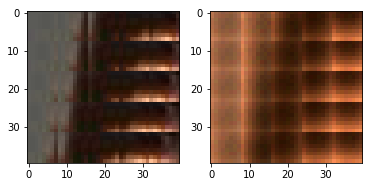

EPO: 6, recon_loss: 0.0484, total_loss: 0.0633, train_psnr:21.6761, validation_psnr:27.4260
EPO: 6, recon_loss: 0.0273, total_loss: 0.0423, train_psnr:21.6581, validation_psnr:27.4787
EPO: 6, recon_loss: 0.0242, total_loss: 0.0396, train_psnr:21.4378, validation_psnr:27.4014
EPO: 6, recon_loss: 0.0148, total_loss: 0.0314, train_psnr:21.6821, validation_psnr:26.2705
EPO: 6, recon_loss: 0.0134, total_loss: 0.0226, train_psnr:21.9468, validation_psnr:25.9747
EPO: 6, recon_loss: 0.0255, total_loss: 0.0391, train_psnr:21.9266, validation_psnr:26.2336
EPO: 6, recon_loss: 0.0180, total_loss: 0.0266, train_psnr:22.0432, validation_psnr:25.8041
EPO: 6, recon_loss: 0.0255, total_loss: 0.0407, train_psnr:21.9386, validation_psnr:27.2349
EPO: 6, recon_loss: 0.0206, total_loss: 0.0433, train_psnr:21.9534, validation_psnr:26.7812
EPO: 6, recon_loss: 0.0085, total_loss: 0.0230, train_psnr:22.0322, validation_psnr:26.3705
#########reconstruction test psnr: 25.4015 


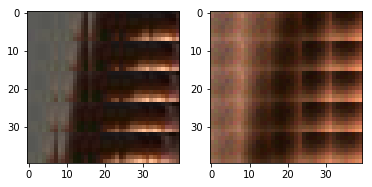

EPO: 6, recon_loss: 0.0404, total_loss: 0.0483, train_psnr:22.0244, validation_psnr:26.2609
EPO: 6, recon_loss: 0.0150, total_loss: 0.0274, train_psnr:22.0712, validation_psnr:26.3960
EPO: 6, recon_loss: 0.0147, total_loss: 0.0284, train_psnr:22.0872, validation_psnr:26.7557
EPO: 6, recon_loss: 0.0256, total_loss: 0.0504, train_psnr:22.0578, validation_psnr:26.4860
EPO: 6, recon_loss: 0.0171, total_loss: 0.0438, train_psnr:22.1048, validation_psnr:26.7924
EPO: 6, recon_loss: 0.0404, total_loss: 0.0670, train_psnr:22.0892, validation_psnr:26.9770
EPO: 6, recon_loss: 0.0409, total_loss: 0.0653, train_psnr:22.1050, validation_psnr:26.8002
EPO: 6, recon_loss: 0.0178, total_loss: 0.0420, train_psnr:22.0669, validation_psnr:26.7462
EPO: 6, recon_loss: 0.0524, total_loss: 0.0779, train_psnr:22.0120, validation_psnr:27.2837
EPO: 6, recon_loss: 0.0207, total_loss: 0.0441, train_psnr:21.7789, validation_psnr:27.2188
#########reconstruction test psnr: 26.1572 


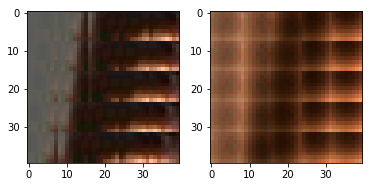

EPO: 6, recon_loss: 0.0375, total_loss: 0.0604, train_psnr:21.7966, validation_psnr:27.3773
EPO: 6, recon_loss: 0.0412, total_loss: 0.0649, train_psnr:21.7927, validation_psnr:27.2231
EPO: 6, recon_loss: 0.0332, total_loss: 0.0586, train_psnr:21.7682, validation_psnr:27.1303
EPO: 6, recon_loss: 0.0292, total_loss: 0.0517, train_psnr:21.7105, validation_psnr:26.7223
EPO: 6, recon_loss: 0.0143, total_loss: 0.0384, train_psnr:21.9676, validation_psnr:26.7079
EPO: 6, recon_loss: 0.0722, total_loss: 0.0864, train_psnr:22.1398, validation_psnr:25.5493
EPO: 6, recon_loss: 0.0497, total_loss: 0.0598, train_psnr:22.2061, validation_psnr:25.4014
EPO: 6, recon_loss: 0.0179, total_loss: 0.0246, train_psnr:22.1444, validation_psnr:25.2031
EPO: 6, recon_loss: 0.0156, total_loss: 0.0221, train_psnr:22.1088, validation_psnr:25.2092
EPO: 6, recon_loss: 0.0072, total_loss: 0.0180, train_psnr:22.1714, validation_psnr:25.9930
#########reconstruction test psnr: 25.1021 


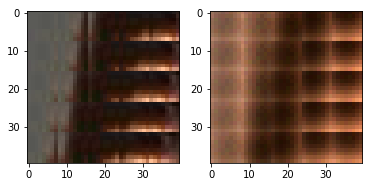

EPO: 6, recon_loss: 0.0168, total_loss: 0.0307, train_psnr:22.1632, validation_psnr:26.4954
EPO: 6, recon_loss: 0.0233, total_loss: 0.0353, train_psnr:22.0853, validation_psnr:26.6622
EPO: 6, recon_loss: 0.0158, total_loss: 0.0310, train_psnr:22.0850, validation_psnr:27.0933
EPO: 6, recon_loss: 0.0313, total_loss: 0.0452, train_psnr:22.0699, validation_psnr:27.2637
EPO: 6, recon_loss: 0.0033, total_loss: 0.0079, train_psnr:22.0621, validation_psnr:27.5480
EPO: 6, recon_loss: 0.0058, total_loss: 0.0103, train_psnr:22.0067, validation_psnr:27.7132
EPO: 6, recon_loss: 0.0103, total_loss: 0.0134, train_psnr:21.9728, validation_psnr:27.5923
EPO: 6, recon_loss: 0.0046, total_loss: 0.0073, train_psnr:21.9399, validation_psnr:27.5249
EPO: 6, recon_loss: 0.0128, total_loss: 0.0175, train_psnr:21.8886, validation_psnr:27.0464
EPO: 6, recon_loss: 0.0136, total_loss: 0.0246, train_psnr:21.9480, validation_psnr:26.3606
#########reconstruction test psnr: 25.3823 


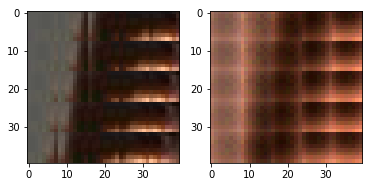

EPO: 6, recon_loss: 0.0176, total_loss: 0.0248, train_psnr:21.9048, validation_psnr:25.8677
EPO: 6, recon_loss: 0.0353, total_loss: 0.0406, train_psnr:21.8122, validation_psnr:25.4369
EPO: 6, recon_loss: 0.0123, total_loss: 0.0158, train_psnr:21.7089, validation_psnr:25.2044
EPO: 6, recon_loss: 0.0157, total_loss: 0.0195, train_psnr:21.6117, validation_psnr:24.9940
EPO: 6, recon_loss: 0.0244, total_loss: 0.0440, train_psnr:21.8264, validation_psnr:25.3715
EPO: 6, recon_loss: 0.0435, total_loss: 0.0628, train_psnr:21.9181, validation_psnr:25.2390
EPO: 6, recon_loss: 0.0398, total_loss: 0.0573, train_psnr:22.0041, validation_psnr:26.0582
EPO: 6, recon_loss: 0.0277, total_loss: 0.0394, train_psnr:22.1334, validation_psnr:26.1853
EPO: 6, recon_loss: 0.0226, total_loss: 0.0310, train_psnr:22.1437, validation_psnr:25.9184
EPO: 6, recon_loss: 0.0195, total_loss: 0.0281, train_psnr:22.2559, validation_psnr:25.6785
#########reconstruction test psnr: 24.7909 


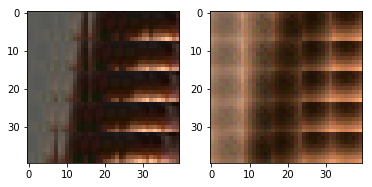

EPO: 6, recon_loss: 0.0143, total_loss: 0.0196, train_psnr:22.3121, validation_psnr:25.7467
EPO: 6, recon_loss: 0.0207, total_loss: 0.0286, train_psnr:22.3317, validation_psnr:25.8685
EPO: 6, recon_loss: 0.0097, total_loss: 0.0150, train_psnr:22.3561, validation_psnr:25.8184
EPO: 6, recon_loss: 0.0145, total_loss: 0.0213, train_psnr:22.3797, validation_psnr:26.0139
EPO: 6, recon_loss: 0.0149, total_loss: 0.0403, train_psnr:22.3575, validation_psnr:26.8922
EPO: 6, recon_loss: 0.0051, total_loss: 0.0153, train_psnr:22.3687, validation_psnr:26.3679
EPO: 6, recon_loss: 0.0440, total_loss: 0.0515, train_psnr:22.3604, validation_psnr:26.2739
EPO: 6, recon_loss: 0.0182, total_loss: 0.0260, train_psnr:22.3182, validation_psnr:26.3235
EPO: 6, recon_loss: 0.0238, total_loss: 0.0323, train_psnr:22.3190, validation_psnr:26.3950
EPO: 6, recon_loss: 0.0073, total_loss: 0.0118, train_psnr:22.3093, validation_psnr:26.5551
#########reconstruction test psnr: 25.5082 


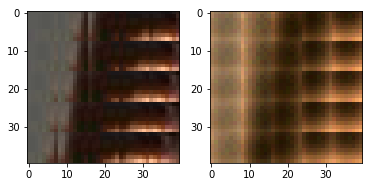

EPO: 6, recon_loss: 0.0068, total_loss: 0.0118, train_psnr:22.3585, validation_psnr:26.2941
EPO: 6, recon_loss: 0.0155, total_loss: 0.0216, train_psnr:22.3542, validation_psnr:26.0470
EPO: 6, recon_loss: 0.0067, total_loss: 0.0125, train_psnr:22.3792, validation_psnr:26.1555
EPO: 6, recon_loss: 0.0078, total_loss: 0.0121, train_psnr:22.3535, validation_psnr:26.1794
EPO: 6, recon_loss: 0.0208, total_loss: 0.0299, train_psnr:22.3476, validation_psnr:26.3300
EPO: 6, recon_loss: 0.0111, total_loss: 0.0189, train_psnr:22.3386, validation_psnr:26.2203
EPO: 6, recon_loss: 0.0287, total_loss: 0.0368, train_psnr:22.3291, validation_psnr:26.2607
EPO: 6, recon_loss: 0.0129, total_loss: 0.0231, train_psnr:22.2763, validation_psnr:26.3409
EPO: 6, recon_loss: 0.0095, total_loss: 0.0178, train_psnr:22.2580, validation_psnr:26.1582
EPO: 6, recon_loss: 0.0173, total_loss: 0.0401, train_psnr:22.2392, validation_psnr:26.7357
#########reconstruction test psnr: 25.6956 


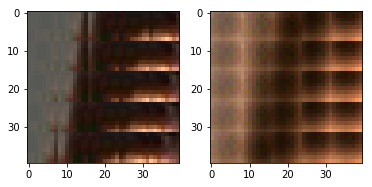

EPO: 6, recon_loss: 0.0147, total_loss: 0.0301, train_psnr:22.2316, validation_psnr:26.7015
EPO: 6, recon_loss: 0.0497, total_loss: 0.0602, train_psnr:22.2176, validation_psnr:26.4059
EPO: 6, recon_loss: 0.0192, total_loss: 0.0296, train_psnr:22.2146, validation_psnr:26.3251
EPO: 6, recon_loss: 0.0257, total_loss: 0.0368, train_psnr:22.1778, validation_psnr:26.2996
EPO: 6, recon_loss: 0.0216, total_loss: 0.0334, train_psnr:22.1141, validation_psnr:27.0096
EPO: 6, recon_loss: 0.0034, total_loss: 0.0100, train_psnr:22.0538, validation_psnr:25.8743
EPO: 6, recon_loss: 0.0246, total_loss: 0.0343, train_psnr:22.0387, validation_psnr:25.5616
EPO: 6, recon_loss: 0.0197, total_loss: 0.0261, train_psnr:21.9513, validation_psnr:25.5178
EPO: 6, recon_loss: 0.0185, total_loss: 0.0290, train_psnr:21.9610, validation_psnr:25.4391
EPO: 6, recon_loss: 0.0190, total_loss: 0.0320, train_psnr:21.9250, validation_psnr:26.8871
#########reconstruction test psnr: 25.7719 


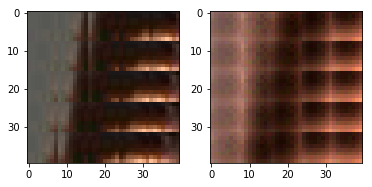

EPO: 6, recon_loss: 0.0216, total_loss: 0.0337, train_psnr:21.9888, validation_psnr:26.6024
EPO: 6, recon_loss: 0.0203, total_loss: 0.0339, train_psnr:21.9959, validation_psnr:27.2049
EPO: 6, recon_loss: 0.0232, total_loss: 0.0346, train_psnr:21.9845, validation_psnr:27.3483
EPO: 6, recon_loss: 0.0088, total_loss: 0.0166, train_psnr:21.9804, validation_psnr:27.1809
EPO: 6, recon_loss: 0.0298, total_loss: 0.0403, train_psnr:21.9334, validation_psnr:27.2137
EPO: 6, recon_loss: 0.0118, total_loss: 0.0178, train_psnr:22.1305, validation_psnr:27.1234
EPO: 6, recon_loss: 0.0257, total_loss: 0.0342, train_psnr:22.2420, validation_psnr:27.1641
EPO: 6, recon_loss: 0.0258, total_loss: 0.0364, train_psnr:22.2808, validation_psnr:27.1703
EPO: 6, recon_loss: 0.0138, total_loss: 0.0213, train_psnr:22.3216, validation_psnr:27.0469
EPO: 6, recon_loss: 0.0135, total_loss: 0.0219, train_psnr:22.3316, validation_psnr:26.9340
#########reconstruction test psnr: 25.8383 


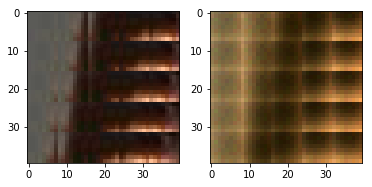

EPO: 6, recon_loss: 0.0167, total_loss: 0.0273, train_psnr:22.3486, validation_psnr:26.7201
EPO: 6, recon_loss: 0.0169, total_loss: 0.0278, train_psnr:22.3298, validation_psnr:26.5278
EPO: 6, recon_loss: 0.0285, total_loss: 0.0362, train_psnr:22.2309, validation_psnr:26.8648
EPO: 6, recon_loss: 0.0197, total_loss: 0.0331, train_psnr:22.1655, validation_psnr:26.8633
EPO: 6, recon_loss: 0.0308, total_loss: 0.0381, train_psnr:22.0955, validation_psnr:27.0234
EPO: 6, recon_loss: 0.0152, total_loss: 0.0260, train_psnr:22.1707, validation_psnr:26.8795
EPO: 6, recon_loss: 0.0083, total_loss: 0.0145, train_psnr:22.2104, validation_psnr:26.7034
EPO: 6, recon_loss: 0.0151, total_loss: 0.0219, train_psnr:22.2410, validation_psnr:26.9932
EPO: 6, recon_loss: 0.0130, total_loss: 0.0222, train_psnr:22.2474, validation_psnr:27.2811
EPO: 6, recon_loss: 0.0186, total_loss: 0.0305, train_psnr:22.2405, validation_psnr:27.2715
#########reconstruction test psnr: 26.0671 


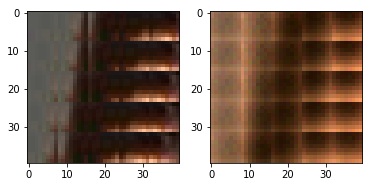

EPO: 6, recon_loss: 0.0158, total_loss: 0.0280, train_psnr:22.2766, validation_psnr:26.7516
EPO: 6, recon_loss: 0.0221, total_loss: 0.0322, train_psnr:22.2862, validation_psnr:26.7777
EPO: 6, recon_loss: 0.0429, total_loss: 0.0551, train_psnr:22.2230, validation_psnr:26.4617
EPO: 6, recon_loss: 0.0155, total_loss: 0.0286, train_psnr:22.2051, validation_psnr:26.5237
EPO: 6, recon_loss: 0.0456, total_loss: 0.0579, train_psnr:22.1408, validation_psnr:26.7695
EPO: 6, recon_loss: 0.0121, total_loss: 0.0237, train_psnr:22.1400, validation_psnr:26.7398
EPO: 6, recon_loss: 0.0093, total_loss: 0.0194, train_psnr:22.0708, validation_psnr:26.7862
EPO: 6, recon_loss: 0.0462, total_loss: 0.0581, train_psnr:22.0102, validation_psnr:26.5491
EPO: 6, recon_loss: 0.0154, total_loss: 0.0261, train_psnr:21.9793, validation_psnr:26.7728
EPO: 6, recon_loss: 0.0356, total_loss: 0.0443, train_psnr:21.9272, validation_psnr:26.5567
#########reconstruction test psnr: 25.4832 


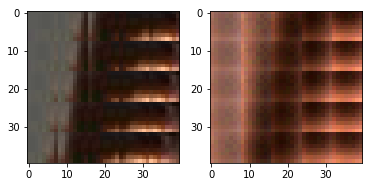

EPO: 6, recon_loss: 0.0077, total_loss: 0.0100, train_psnr:21.9685, validation_psnr:26.7752
EPO: 6, recon_loss: 0.0060, total_loss: 0.0101, train_psnr:22.0507, validation_psnr:27.2408
EPO: 6, recon_loss: 0.0218, total_loss: 0.0270, train_psnr:22.0417, validation_psnr:27.1500
EPO: 6, recon_loss: 0.0095, total_loss: 0.0176, train_psnr:22.0231, validation_psnr:26.8523
EPO: 6, recon_loss: 0.0305, total_loss: 0.0357, train_psnr:22.0130, validation_psnr:26.9374
EPO: 6, recon_loss: 0.0297, total_loss: 0.0559, train_psnr:22.0029, validation_psnr:27.6226
EPO: 6, recon_loss: 0.0224, total_loss: 0.0459, train_psnr:22.0214, validation_psnr:27.7866
EPO: 6, recon_loss: 0.0388, total_loss: 0.0686, train_psnr:21.9890, validation_psnr:27.6603
EPO: 6, recon_loss: 0.0259, total_loss: 0.0477, train_psnr:22.0269, validation_psnr:27.8867
EPO: 6, recon_loss: 0.0379, total_loss: 0.0661, train_psnr:21.9885, validation_psnr:27.7063
#########reconstruction test psnr: 26.3859 


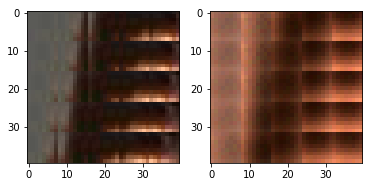

EPO: 6, recon_loss: 0.0140, total_loss: 0.0279, train_psnr:22.1159, validation_psnr:26.6071
EPO: 6, recon_loss: 0.0254, total_loss: 0.0340, train_psnr:22.1145, validation_psnr:25.8754
EPO: 6, recon_loss: 0.0308, total_loss: 0.0527, train_psnr:22.1868, validation_psnr:27.1821
EPO: 6, recon_loss: 0.0203, total_loss: 0.0354, train_psnr:22.2144, validation_psnr:27.6129
EPO: 6, recon_loss: 0.0163, total_loss: 0.0297, train_psnr:22.2337, validation_psnr:27.6175
EPO: 6, recon_loss: 0.0148, total_loss: 0.0391, train_psnr:22.2285, validation_psnr:27.4640
EPO: 6, recon_loss: 0.0163, total_loss: 0.0356, train_psnr:22.2281, validation_psnr:27.7040
EPO: 6, recon_loss: 0.0405, total_loss: 0.0554, train_psnr:22.2194, validation_psnr:27.7400
EPO: 6, recon_loss: 0.0110, total_loss: 0.0242, train_psnr:22.2264, validation_psnr:27.6982
EPO: 6, recon_loss: 0.0110, total_loss: 0.0233, train_psnr:22.2147, validation_psnr:27.6095
#########reconstruction test psnr: 26.3962 


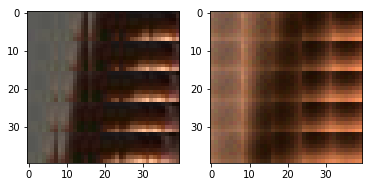

EPO: 6, recon_loss: 0.0216, total_loss: 0.0361, train_psnr:22.1728, validation_psnr:27.1283
EPO: 6, recon_loss: 0.0082, total_loss: 0.0218, train_psnr:22.1116, validation_psnr:27.4878
EPO: 6, recon_loss: 0.0359, total_loss: 0.0466, train_psnr:22.0839, validation_psnr:27.4293
EPO: 6, recon_loss: 0.0094, total_loss: 0.0219, train_psnr:22.0313, validation_psnr:27.3108
EPO: 6, recon_loss: 0.0108, total_loss: 0.0225, train_psnr:21.9731, validation_psnr:27.3196
EPO: 6, recon_loss: 0.0134, total_loss: 0.0221, train_psnr:21.9892, validation_psnr:26.7196
EPO: 6, recon_loss: 0.0073, total_loss: 0.0210, train_psnr:21.9979, validation_psnr:27.0392
EPO: 6, recon_loss: 0.0345, total_loss: 0.0483, train_psnr:22.0523, validation_psnr:26.8384
EPO: 6, recon_loss: 0.0249, total_loss: 0.0404, train_psnr:22.0512, validation_psnr:27.0854
EPO: 6, recon_loss: 0.0179, total_loss: 0.0299, train_psnr:22.0636, validation_psnr:27.2593
#########reconstruction test psnr: 26.0945 


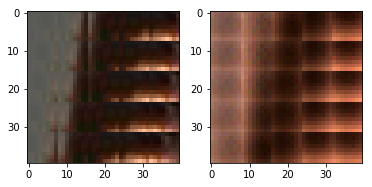

EPO: 6, recon_loss: 0.0210, total_loss: 0.0491, train_psnr:22.0151, validation_psnr:26.6237
EPO: 6, recon_loss: 0.0073, total_loss: 0.0186, train_psnr:22.0557, validation_psnr:26.8012
EPO: 6, recon_loss: 0.0444, total_loss: 0.0601, train_psnr:22.0848, validation_psnr:27.0961
EPO: 6, recon_loss: 0.0213, total_loss: 0.0261, train_psnr:22.0771, validation_psnr:26.8730
EPO: 6, recon_loss: 0.0212, total_loss: 0.0301, train_psnr:22.0554, validation_psnr:26.8296
EPO: 6, recon_loss: 0.0176, total_loss: 0.0339, train_psnr:22.0316, validation_psnr:27.4020
EPO: 6, recon_loss: 0.0073, total_loss: 0.0193, train_psnr:22.1906, validation_psnr:27.1449
EPO: 6, recon_loss: 0.0255, total_loss: 0.0366, train_psnr:22.2373, validation_psnr:27.2547
EPO: 6, recon_loss: 0.0115, total_loss: 0.0202, train_psnr:22.2365, validation_psnr:27.1642
EPO: 6, recon_loss: 0.0161, total_loss: 0.0228, train_psnr:22.2804, validation_psnr:27.0515
#########reconstruction test psnr: 25.9258 


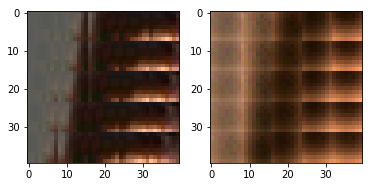

EPO: 6, recon_loss: 0.0298, total_loss: 0.0466, train_psnr:22.2780, validation_psnr:26.7836
EPO: 6, recon_loss: 0.0395, total_loss: 0.0617, train_psnr:22.1573, validation_psnr:25.8129
EPO: 6, recon_loss: 0.0313, total_loss: 0.0433, train_psnr:22.0577, validation_psnr:25.7017
EPO: 6, recon_loss: 0.0298, total_loss: 0.0427, train_psnr:21.9348, validation_psnr:25.9225
EPO: 6, recon_loss: 0.0430, total_loss: 0.0524, train_psnr:21.8740, validation_psnr:26.1424
EPO: 6, recon_loss: 0.0163, total_loss: 0.0225, train_psnr:21.8113, validation_psnr:26.2785
EPO: 6, recon_loss: 0.0092, total_loss: 0.0328, train_psnr:21.8498, validation_psnr:26.5896
EPO: 6, recon_loss: 0.0174, total_loss: 0.0331, train_psnr:21.8816, validation_psnr:26.4548
EPO: 6, recon_loss: 0.0267, total_loss: 0.0406, train_psnr:21.9254, validation_psnr:26.7670
EPO: 6, recon_loss: 0.0235, total_loss: 0.0339, train_psnr:21.9701, validation_psnr:27.1235
#########reconstruction test psnr: 25.9118 


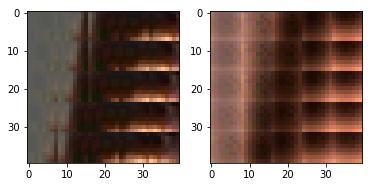

EPO: 6, recon_loss: 0.0390, total_loss: 0.0490, train_psnr:21.9670, validation_psnr:26.2437
EPO: 6, recon_loss: 0.0050, total_loss: 0.0079, train_psnr:22.0893, validation_psnr:27.1471
EPO: 6, recon_loss: 0.0123, total_loss: 0.0165, train_psnr:22.1696, validation_psnr:27.5405
EPO: 6, recon_loss: 0.0121, total_loss: 0.0163, train_psnr:22.1799, validation_psnr:27.3978
EPO: 6, recon_loss: 0.0054, total_loss: 0.0094, train_psnr:22.2441, validation_psnr:27.4202
EPO: 6, recon_loss: 0.0170, total_loss: 0.0212, train_psnr:22.2453, validation_psnr:27.2110
EPO: 6, recon_loss: 0.0240, total_loss: 0.0349, train_psnr:22.2074, validation_psnr:26.4098
EPO: 6, recon_loss: 0.0236, total_loss: 0.0314, train_psnr:22.2107, validation_psnr:26.3381
EPO: 6, recon_loss: 0.0198, total_loss: 0.0294, train_psnr:22.1821, validation_psnr:26.0409
EPO: 6, recon_loss: 0.0150, total_loss: 0.0212, train_psnr:22.2250, validation_psnr:26.0807
#########reconstruction test psnr: 25.1044 


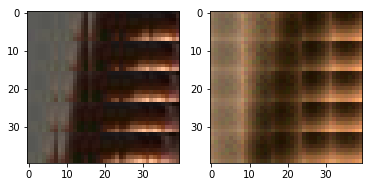

EPO: 6, recon_loss: 0.0246, total_loss: 0.0285, train_psnr:22.2320, validation_psnr:25.9188
EPO: 6, recon_loss: 0.0220, total_loss: 0.0338, train_psnr:22.2868, validation_psnr:26.7380
EPO: 6, recon_loss: 0.0222, total_loss: 0.0338, train_psnr:22.2206, validation_psnr:26.5287
EPO: 6, recon_loss: 0.0316, total_loss: 0.0375, train_psnr:22.1353, validation_psnr:26.6136
EPO: 6, recon_loss: 0.0194, total_loss: 0.0278, train_psnr:22.0566, validation_psnr:26.5188
EPO: 6, recon_loss: 0.0240, total_loss: 0.0316, train_psnr:21.9618, validation_psnr:26.3722
EPO: 6, recon_loss: 0.0310, total_loss: 0.0556, train_psnr:22.0127, validation_psnr:26.3768
EPO: 6, recon_loss: 0.0348, total_loss: 0.0474, train_psnr:22.1255, validation_psnr:26.2779
EPO: 6, recon_loss: 0.0251, total_loss: 0.0341, train_psnr:22.1801, validation_psnr:26.7534
EPO: 6, recon_loss: 0.0155, total_loss: 0.0236, train_psnr:22.2650, validation_psnr:26.1624
#########reconstruction test psnr: 25.2356 


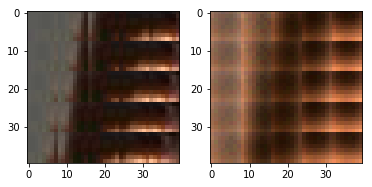

EPO: 6, recon_loss: 0.0169, total_loss: 0.0263, train_psnr:22.2245, validation_psnr:26.8284
EPO: 6, recon_loss: 0.0074, total_loss: 0.0168, train_psnr:22.2811, validation_psnr:25.7207
EPO: 6, recon_loss: 0.0105, total_loss: 0.0203, train_psnr:22.2403, validation_psnr:25.7754
EPO: 6, recon_loss: 0.0218, total_loss: 0.0259, train_psnr:22.1873, validation_psnr:25.5134
EPO: 6, recon_loss: 0.0170, total_loss: 0.0283, train_psnr:22.1620, validation_psnr:25.5475
EPO: 6, recon_loss: 0.0244, total_loss: 0.0301, train_psnr:22.0831, validation_psnr:25.7547
EPO: 6, recon_loss: 0.0095, total_loss: 0.0340, train_psnr:22.0243, validation_psnr:27.6431
EPO: 6, recon_loss: 0.0043, total_loss: 0.0158, train_psnr:22.1039, validation_psnr:26.8331
EPO: 6, recon_loss: 0.0153, total_loss: 0.0259, train_psnr:22.0883, validation_psnr:26.5376
EPO: 6, recon_loss: 0.0041, total_loss: 0.0084, train_psnr:22.0883, validation_psnr:26.6684
#########reconstruction test psnr: 25.5542 


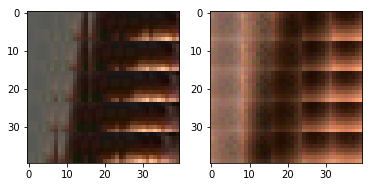

EPO: 6, recon_loss: 0.0043, total_loss: 0.0078, train_psnr:22.0762, validation_psnr:26.8503
EPO: 6, recon_loss: 0.0242, total_loss: 0.0354, train_psnr:22.1608, validation_psnr:27.5464
EPO: 6, recon_loss: 0.0184, total_loss: 0.0310, train_psnr:22.2174, validation_psnr:26.9432
EPO: 6, recon_loss: 0.0218, total_loss: 0.0340, train_psnr:22.2205, validation_psnr:27.0660
EPO: 6, recon_loss: 0.0202, total_loss: 0.0318, train_psnr:22.2358, validation_psnr:26.9558
EPO: 6, recon_loss: 0.0240, total_loss: 0.0309, train_psnr:22.2163, validation_psnr:26.3979
EPO: 7, recon_loss: 0.0097, total_loss: 0.0168, train_psnr:22.2792, validation_psnr:26.6789
EPO: 7, recon_loss: 0.0072, total_loss: 0.0109, train_psnr:22.3293, validation_psnr:26.6274
EPO: 7, recon_loss: 0.0195, total_loss: 0.0239, train_psnr:22.3424, validation_psnr:26.4435
EPO: 7, recon_loss: 0.0087, total_loss: 0.0136, train_psnr:22.3103, validation_psnr:26.8333
#########reconstruction test psnr: 25.7697 


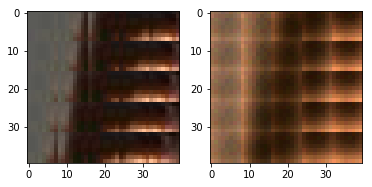

EPO: 7, recon_loss: 0.0078, total_loss: 0.0122, train_psnr:22.2859, validation_psnr:26.8422
EPO: 7, recon_loss: 0.0077, total_loss: 0.0263, train_psnr:22.2245, validation_psnr:27.6328
EPO: 7, recon_loss: 0.0053, total_loss: 0.0162, train_psnr:22.2171, validation_psnr:27.5526
EPO: 7, recon_loss: 0.0113, total_loss: 0.0213, train_psnr:22.2070, validation_psnr:27.3151
EPO: 7, recon_loss: 0.0108, total_loss: 0.0158, train_psnr:22.1644, validation_psnr:27.2255
EPO: 7, recon_loss: 0.0160, total_loss: 0.0251, train_psnr:22.1124, validation_psnr:27.1647
EPO: 7, recon_loss: 0.0083, total_loss: 0.0257, train_psnr:22.1426, validation_psnr:27.1130
EPO: 7, recon_loss: 0.0082, total_loss: 0.0174, train_psnr:22.1998, validation_psnr:27.1018
EPO: 7, recon_loss: 0.0164, total_loss: 0.0262, train_psnr:22.1892, validation_psnr:26.4620
EPO: 7, recon_loss: 0.0095, total_loss: 0.0147, train_psnr:22.2168, validation_psnr:27.2233
#########reconstruction test psnr: 26.0223 


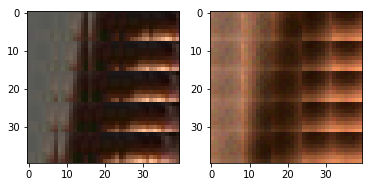

EPO: 7, recon_loss: 0.0149, total_loss: 0.0215, train_psnr:22.2405, validation_psnr:27.0000
EPO: 7, recon_loss: 0.0143, total_loss: 0.0231, train_psnr:22.1880, validation_psnr:27.5497
EPO: 7, recon_loss: 0.0130, total_loss: 0.0226, train_psnr:22.0240, validation_psnr:27.5091
EPO: 7, recon_loss: 0.0141, total_loss: 0.0223, train_psnr:21.8796, validation_psnr:27.3726
EPO: 7, recon_loss: 0.0146, total_loss: 0.0229, train_psnr:21.8024, validation_psnr:27.6217
EPO: 7, recon_loss: 0.0121, total_loss: 0.0177, train_psnr:21.6818, validation_psnr:27.2588
EPO: 7, recon_loss: 0.0154, total_loss: 0.0215, train_psnr:21.6338, validation_psnr:27.7248
EPO: 7, recon_loss: 0.0094, total_loss: 0.0157, train_psnr:21.8336, validation_psnr:27.7101
EPO: 7, recon_loss: 0.0164, total_loss: 0.0237, train_psnr:21.9774, validation_psnr:27.5385
EPO: 7, recon_loss: 0.0225, total_loss: 0.0298, train_psnr:22.0008, validation_psnr:27.3885
#########reconstruction test psnr: 26.1449 


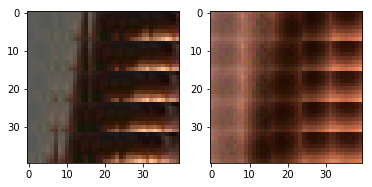

EPO: 7, recon_loss: 0.0087, total_loss: 0.0131, train_psnr:22.0525, validation_psnr:27.4388
EPO: 7, recon_loss: 0.0188, total_loss: 0.0267, train_psnr:22.0735, validation_psnr:27.4358
EPO: 7, recon_loss: 0.0172, total_loss: 0.0306, train_psnr:22.0947, validation_psnr:26.6239
EPO: 7, recon_loss: 0.0217, total_loss: 0.0336, train_psnr:22.1237, validation_psnr:26.8956
EPO: 7, recon_loss: 0.0308, total_loss: 0.0419, train_psnr:22.1706, validation_psnr:27.0178
EPO: 7, recon_loss: 0.0345, total_loss: 0.0465, train_psnr:22.1798, validation_psnr:26.7578
EPO: 7, recon_loss: 0.0285, total_loss: 0.0362, train_psnr:22.1673, validation_psnr:26.7609
EPO: 7, recon_loss: 0.0238, total_loss: 0.0336, train_psnr:22.3229, validation_psnr:26.8745
EPO: 7, recon_loss: 0.0219, total_loss: 0.0313, train_psnr:22.4076, validation_psnr:26.1323
EPO: 7, recon_loss: 0.0198, total_loss: 0.0257, train_psnr:22.4271, validation_psnr:26.0837
#########reconstruction test psnr: 25.1586 


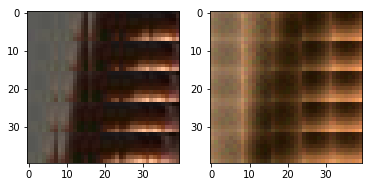

EPO: 7, recon_loss: 0.0154, total_loss: 0.0184, train_psnr:22.4487, validation_psnr:25.8570
EPO: 7, recon_loss: 0.0279, total_loss: 0.0337, train_psnr:22.4061, validation_psnr:25.1115
EPO: 7, recon_loss: 0.0043, total_loss: 0.0076, train_psnr:22.4118, validation_psnr:26.2064
EPO: 7, recon_loss: 0.0083, total_loss: 0.0166, train_psnr:22.3794, validation_psnr:27.0611
EPO: 7, recon_loss: 0.0151, total_loss: 0.0224, train_psnr:22.3513, validation_psnr:27.1689
EPO: 7, recon_loss: 0.0095, total_loss: 0.0187, train_psnr:22.3321, validation_psnr:27.4630
EPO: 7, recon_loss: 0.0155, total_loss: 0.0289, train_psnr:22.3043, validation_psnr:27.5660
EPO: 7, recon_loss: 0.0083, total_loss: 0.0230, train_psnr:22.3428, validation_psnr:27.3497
EPO: 7, recon_loss: 0.0078, total_loss: 0.0214, train_psnr:22.4102, validation_psnr:27.2780
EPO: 7, recon_loss: 0.0258, total_loss: 0.0337, train_psnr:22.4084, validation_psnr:26.9882
#########reconstruction test psnr: 25.8560 


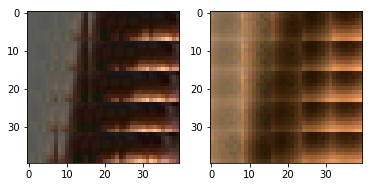

EPO: 7, recon_loss: 0.0061, total_loss: 0.0146, train_psnr:22.4425, validation_psnr:27.0463
EPO: 7, recon_loss: 0.0241, total_loss: 0.0326, train_psnr:22.4391, validation_psnr:27.3193
EPO: 7, recon_loss: 0.0288, total_loss: 0.0552, train_psnr:22.4498, validation_psnr:27.7455
EPO: 7, recon_loss: 0.0104, total_loss: 0.0214, train_psnr:22.5083, validation_psnr:27.6473
EPO: 7, recon_loss: 0.0358, total_loss: 0.0411, train_psnr:22.4875, validation_psnr:27.5015
EPO: 7, recon_loss: 0.0086, total_loss: 0.0142, train_psnr:22.4973, validation_psnr:27.4074
EPO: 7, recon_loss: 0.0185, total_loss: 0.0221, train_psnr:22.4628, validation_psnr:27.4622
EPO: 7, recon_loss: 0.0207, total_loss: 0.0319, train_psnr:22.4841, validation_psnr:27.0184
EPO: 7, recon_loss: 0.0094, total_loss: 0.0164, train_psnr:22.5217, validation_psnr:27.0848
EPO: 7, recon_loss: 0.0233, total_loss: 0.0325, train_psnr:22.4726, validation_psnr:27.3723
#########reconstruction test psnr: 26.1769 


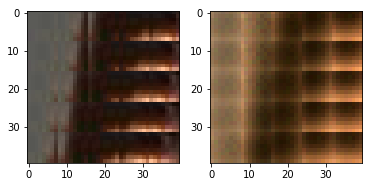

EPO: 7, recon_loss: 0.0140, total_loss: 0.0192, train_psnr:22.4913, validation_psnr:27.0416
EPO: 7, recon_loss: 0.0285, total_loss: 0.0372, train_psnr:22.4173, validation_psnr:27.4174
EPO: 7, recon_loss: 0.0260, total_loss: 0.0419, train_psnr:22.2020, validation_psnr:27.8079
EPO: 7, recon_loss: 0.0274, total_loss: 0.0427, train_psnr:22.1107, validation_psnr:27.9480
EPO: 7, recon_loss: 0.0536, total_loss: 0.0674, train_psnr:22.0625, validation_psnr:27.7699
EPO: 7, recon_loss: 0.0293, total_loss: 0.0446, train_psnr:22.0362, validation_psnr:27.9607
EPO: 7, recon_loss: 0.0209, total_loss: 0.0355, train_psnr:21.8945, validation_psnr:27.8119
EPO: 7, recon_loss: 0.0117, total_loss: 0.0262, train_psnr:22.1549, validation_psnr:26.7152
EPO: 7, recon_loss: 0.0124, total_loss: 0.0227, train_psnr:22.2604, validation_psnr:26.3420
EPO: 7, recon_loss: 0.0285, total_loss: 0.0369, train_psnr:22.2451, validation_psnr:26.0875
#########reconstruction test psnr: 25.1595 


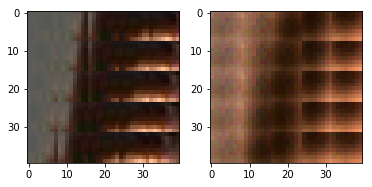

EPO: 7, recon_loss: 0.0142, total_loss: 0.0234, train_psnr:22.3234, validation_psnr:26.4101
EPO: 7, recon_loss: 0.0204, total_loss: 0.0337, train_psnr:22.2359, validation_psnr:27.6616
EPO: 7, recon_loss: 0.0150, total_loss: 0.0314, train_psnr:22.2674, validation_psnr:27.2784
EPO: 7, recon_loss: 0.0074, total_loss: 0.0209, train_psnr:22.2872, validation_psnr:26.3855
EPO: 7, recon_loss: 0.0357, total_loss: 0.0427, train_psnr:22.2796, validation_psnr:26.3637
EPO: 7, recon_loss: 0.0113, total_loss: 0.0245, train_psnr:22.3087, validation_psnr:26.7043
EPO: 7, recon_loss: 0.0162, total_loss: 0.0261, train_psnr:22.2884, validation_psnr:27.0819
EPO: 7, recon_loss: 0.0233, total_loss: 0.0466, train_psnr:22.2934, validation_psnr:26.7933
EPO: 7, recon_loss: 0.0174, total_loss: 0.0469, train_psnr:22.3208, validation_psnr:27.3035
EPO: 7, recon_loss: 0.0485, total_loss: 0.0693, train_psnr:22.3367, validation_psnr:27.3538
#########reconstruction test psnr: 26.1786 


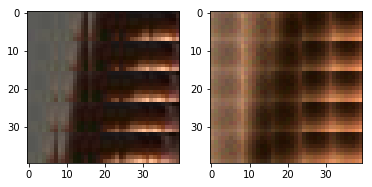

EPO: 7, recon_loss: 0.0239, total_loss: 0.0470, train_psnr:22.3597, validation_psnr:27.2315
EPO: 7, recon_loss: 0.0183, total_loss: 0.0403, train_psnr:22.3154, validation_psnr:27.1252
EPO: 7, recon_loss: 0.0335, total_loss: 0.0523, train_psnr:22.2018, validation_psnr:27.7673
EPO: 7, recon_loss: 0.0192, total_loss: 0.0424, train_psnr:22.1327, validation_psnr:27.5486
EPO: 7, recon_loss: 0.0552, total_loss: 0.0773, train_psnr:22.1362, validation_psnr:27.7434
EPO: 7, recon_loss: 0.0298, total_loss: 0.0535, train_psnr:22.1504, validation_psnr:27.4717
EPO: 7, recon_loss: 0.0305, total_loss: 0.0554, train_psnr:22.1078, validation_psnr:27.5066
EPO: 7, recon_loss: 0.0154, total_loss: 0.0392, train_psnr:22.1849, validation_psnr:26.7704
EPO: 7, recon_loss: 0.0178, total_loss: 0.0420, train_psnr:22.2301, validation_psnr:26.6204
EPO: 7, recon_loss: 0.0541, total_loss: 0.0688, train_psnr:22.3983, validation_psnr:25.3940
#########reconstruction test psnr: 24.6302 


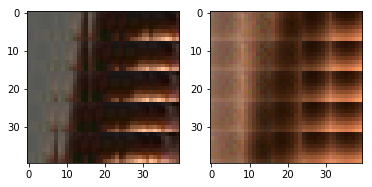

EPO: 7, recon_loss: 0.0505, total_loss: 0.0570, train_psnr:22.4164, validation_psnr:25.5840
EPO: 7, recon_loss: 0.0110, total_loss: 0.0173, train_psnr:22.3402, validation_psnr:25.4852
EPO: 7, recon_loss: 0.0191, total_loss: 0.0250, train_psnr:22.2738, validation_psnr:26.4423
EPO: 7, recon_loss: 0.0073, total_loss: 0.0196, train_psnr:22.4132, validation_psnr:26.2971
EPO: 7, recon_loss: 0.0195, total_loss: 0.0309, train_psnr:22.4007, validation_psnr:26.9903
EPO: 7, recon_loss: 0.0176, total_loss: 0.0298, train_psnr:22.3518, validation_psnr:26.9704
EPO: 7, recon_loss: 0.0183, total_loss: 0.0344, train_psnr:22.3315, validation_psnr:27.6606
EPO: 7, recon_loss: 0.0349, total_loss: 0.0491, train_psnr:22.3525, validation_psnr:27.2822
EPO: 7, recon_loss: 0.0030, total_loss: 0.0071, train_psnr:22.2988, validation_psnr:27.8333
EPO: 7, recon_loss: 0.0046, total_loss: 0.0098, train_psnr:22.2165, validation_psnr:28.0004
#########reconstruction test psnr: 26.6289 


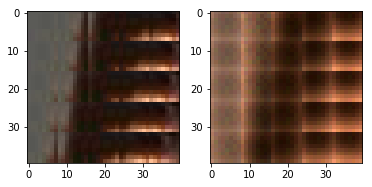

EPO: 7, recon_loss: 0.0060, total_loss: 0.0089, train_psnr:22.2518, validation_psnr:27.5356
EPO: 7, recon_loss: 0.0051, total_loss: 0.0077, train_psnr:22.2258, validation_psnr:27.6040
EPO: 7, recon_loss: 0.0149, total_loss: 0.0188, train_psnr:22.1671, validation_psnr:27.1546
EPO: 7, recon_loss: 0.0118, total_loss: 0.0205, train_psnr:22.1974, validation_psnr:26.6685
EPO: 7, recon_loss: 0.0204, total_loss: 0.0280, train_psnr:22.1076, validation_psnr:26.2394
EPO: 7, recon_loss: 0.0266, total_loss: 0.0332, train_psnr:22.0211, validation_psnr:25.9641
EPO: 7, recon_loss: 0.0112, total_loss: 0.0146, train_psnr:21.9097, validation_psnr:25.6717
EPO: 7, recon_loss: 0.0213, total_loss: 0.0255, train_psnr:21.8184, validation_psnr:25.6833
EPO: 7, recon_loss: 0.0240, total_loss: 0.0426, train_psnr:22.0477, validation_psnr:25.9078
EPO: 7, recon_loss: 0.0387, total_loss: 0.0556, train_psnr:22.1579, validation_psnr:26.2222
#########reconstruction test psnr: 25.2143 


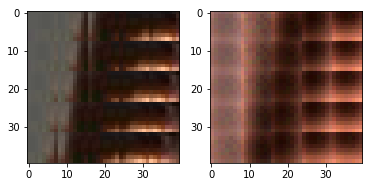

EPO: 7, recon_loss: 0.0353, total_loss: 0.0517, train_psnr:22.2281, validation_psnr:26.6938
EPO: 7, recon_loss: 0.0222, total_loss: 0.0329, train_psnr:22.3268, validation_psnr:26.3221
EPO: 7, recon_loss: 0.0238, total_loss: 0.0326, train_psnr:22.3646, validation_psnr:26.4745
EPO: 7, recon_loss: 0.0191, total_loss: 0.0272, train_psnr:22.4763, validation_psnr:26.2394
EPO: 7, recon_loss: 0.0151, total_loss: 0.0198, train_psnr:22.5417, validation_psnr:26.1393
EPO: 7, recon_loss: 0.0199, total_loss: 0.0277, train_psnr:22.5447, validation_psnr:26.4529
EPO: 7, recon_loss: 0.0139, total_loss: 0.0197, train_psnr:22.5871, validation_psnr:26.4189
EPO: 7, recon_loss: 0.0196, total_loss: 0.0262, train_psnr:22.6123, validation_psnr:26.3379
EPO: 7, recon_loss: 0.0162, total_loss: 0.0367, train_psnr:22.5855, validation_psnr:27.1223
EPO: 7, recon_loss: 0.0078, total_loss: 0.0153, train_psnr:22.5904, validation_psnr:26.6392
#########reconstruction test psnr: 25.5941 


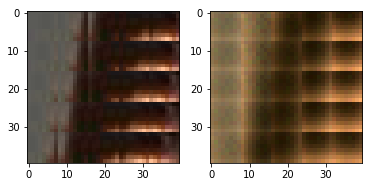

EPO: 7, recon_loss: 0.0305, total_loss: 0.0380, train_psnr:22.5759, validation_psnr:26.6431
EPO: 7, recon_loss: 0.0183, total_loss: 0.0259, train_psnr:22.5413, validation_psnr:26.6043
EPO: 7, recon_loss: 0.0254, total_loss: 0.0374, train_psnr:22.5304, validation_psnr:26.7616
EPO: 7, recon_loss: 0.0069, total_loss: 0.0114, train_psnr:22.5489, validation_psnr:26.7108
EPO: 7, recon_loss: 0.0068, total_loss: 0.0117, train_psnr:22.5897, validation_psnr:26.7494
EPO: 7, recon_loss: 0.0152, total_loss: 0.0209, train_psnr:22.5875, validation_psnr:26.4561
EPO: 7, recon_loss: 0.0048, total_loss: 0.0100, train_psnr:22.6101, validation_psnr:26.4285
EPO: 7, recon_loss: 0.0074, total_loss: 0.0114, train_psnr:22.5940, validation_psnr:26.5996
EPO: 7, recon_loss: 0.0153, total_loss: 0.0236, train_psnr:22.5755, validation_psnr:26.6869
EPO: 7, recon_loss: 0.0102, total_loss: 0.0174, train_psnr:22.5661, validation_psnr:26.7606
#########reconstruction test psnr: 25.7348 


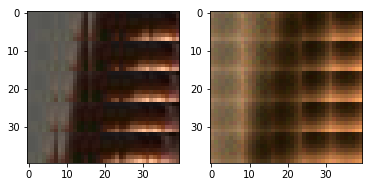

EPO: 7, recon_loss: 0.0324, total_loss: 0.0410, train_psnr:22.5454, validation_psnr:26.6168
EPO: 7, recon_loss: 0.0161, total_loss: 0.0262, train_psnr:22.5073, validation_psnr:26.8462
EPO: 7, recon_loss: 0.0093, total_loss: 0.0162, train_psnr:22.4747, validation_psnr:26.4533
EPO: 7, recon_loss: 0.0132, total_loss: 0.0292, train_psnr:22.4445, validation_psnr:26.9457
EPO: 7, recon_loss: 0.0116, total_loss: 0.0254, train_psnr:22.4468, validation_psnr:26.7495
EPO: 7, recon_loss: 0.0528, total_loss: 0.0638, train_psnr:22.4181, validation_psnr:26.0095
EPO: 7, recon_loss: 0.0146, total_loss: 0.0246, train_psnr:22.4190, validation_psnr:26.5199
EPO: 7, recon_loss: 0.0341, total_loss: 0.0429, train_psnr:22.3635, validation_psnr:26.7450
EPO: 7, recon_loss: 0.0087, total_loss: 0.0195, train_psnr:22.2711, validation_psnr:27.6522
EPO: 7, recon_loss: 0.0026, total_loss: 0.0091, train_psnr:22.2516, validation_psnr:26.0409
#########reconstruction test psnr: 25.1290 


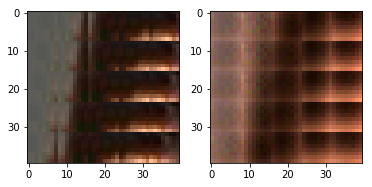

EPO: 7, recon_loss: 0.0314, total_loss: 0.0399, train_psnr:22.2364, validation_psnr:26.0146
EPO: 7, recon_loss: 0.0155, total_loss: 0.0213, train_psnr:22.1703, validation_psnr:25.6580
EPO: 7, recon_loss: 0.0166, total_loss: 0.0245, train_psnr:22.1702, validation_psnr:25.7103
EPO: 7, recon_loss: 0.0190, total_loss: 0.0294, train_psnr:22.1612, validation_psnr:27.0670
EPO: 7, recon_loss: 0.0191, total_loss: 0.0329, train_psnr:22.1981, validation_psnr:27.2796
EPO: 7, recon_loss: 0.0251, total_loss: 0.0337, train_psnr:22.2115, validation_psnr:27.5855
EPO: 7, recon_loss: 0.0136, total_loss: 0.0224, train_psnr:22.2052, validation_psnr:27.6149
EPO: 7, recon_loss: 0.0094, total_loss: 0.0160, train_psnr:22.1802, validation_psnr:27.5672
EPO: 7, recon_loss: 0.0187, total_loss: 0.0281, train_psnr:22.2110, validation_psnr:27.3583
EPO: 7, recon_loss: 0.0102, total_loss: 0.0162, train_psnr:22.3966, validation_psnr:27.5276
#########reconstruction test psnr: 26.3237 


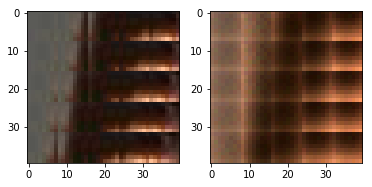

EPO: 7, recon_loss: 0.0289, total_loss: 0.0399, train_psnr:22.5032, validation_psnr:27.1911
EPO: 7, recon_loss: 0.0119, total_loss: 0.0189, train_psnr:22.5510, validation_psnr:27.2857
EPO: 7, recon_loss: 0.0108, total_loss: 0.0183, train_psnr:22.5856, validation_psnr:27.1353
EPO: 7, recon_loss: 0.0199, total_loss: 0.0320, train_psnr:22.5553, validation_psnr:27.3839
EPO: 7, recon_loss: 0.0149, total_loss: 0.0258, train_psnr:22.5948, validation_psnr:26.9510
EPO: 7, recon_loss: 0.0172, total_loss: 0.0275, train_psnr:22.5539, validation_psnr:26.9649
EPO: 7, recon_loss: 0.0225, total_loss: 0.0307, train_psnr:22.4362, validation_psnr:27.2104
EPO: 7, recon_loss: 0.0215, total_loss: 0.0336, train_psnr:22.3988, validation_psnr:27.2883
EPO: 7, recon_loss: 0.0153, total_loss: 0.0430, train_psnr:22.3326, validation_psnr:27.7373
EPO: 7, recon_loss: 0.0107, total_loss: 0.0187, train_psnr:22.4084, validation_psnr:27.2701
#########reconstruction test psnr: 26.1287 


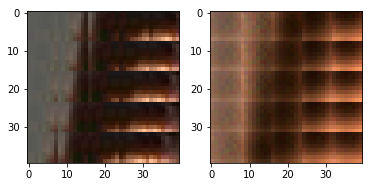

EPO: 7, recon_loss: 0.0119, total_loss: 0.0193, train_psnr:22.4491, validation_psnr:27.1146
EPO: 7, recon_loss: 0.0097, total_loss: 0.0163, train_psnr:22.4612, validation_psnr:27.3810
EPO: 7, recon_loss: 0.0137, total_loss: 0.0244, train_psnr:22.4739, validation_psnr:27.5894
EPO: 7, recon_loss: 0.0170, total_loss: 0.0282, train_psnr:22.4681, validation_psnr:27.3446
EPO: 7, recon_loss: 0.0093, total_loss: 0.0195, train_psnr:22.5128, validation_psnr:26.9885
EPO: 7, recon_loss: 0.0257, total_loss: 0.0352, train_psnr:22.4900, validation_psnr:26.9545
EPO: 7, recon_loss: 0.0389, total_loss: 0.0498, train_psnr:22.4326, validation_psnr:26.8976
EPO: 7, recon_loss: 0.0225, total_loss: 0.0365, train_psnr:22.4086, validation_psnr:26.7606
EPO: 7, recon_loss: 0.0415, total_loss: 0.0519, train_psnr:22.3486, validation_psnr:27.1053
EPO: 7, recon_loss: 0.0095, total_loss: 0.0207, train_psnr:22.3136, validation_psnr:27.3576
#########reconstruction test psnr: 26.1484 


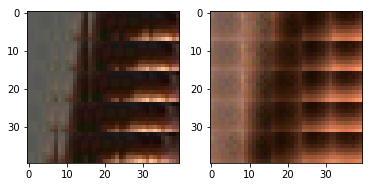

EPO: 7, recon_loss: 0.0146, total_loss: 0.0252, train_psnr:22.2731, validation_psnr:27.0970
EPO: 7, recon_loss: 0.0268, total_loss: 0.0395, train_psnr:22.2173, validation_psnr:27.0556
EPO: 7, recon_loss: 0.0187, total_loss: 0.0286, train_psnr:22.1779, validation_psnr:27.1065
EPO: 7, recon_loss: 0.0318, total_loss: 0.0413, train_psnr:22.1037, validation_psnr:27.1803
EPO: 7, recon_loss: 0.0066, total_loss: 0.0092, train_psnr:22.2118, validation_psnr:27.2976
EPO: 7, recon_loss: 0.0054, total_loss: 0.0095, train_psnr:22.2770, validation_psnr:27.6496
EPO: 7, recon_loss: 0.0231, total_loss: 0.0313, train_psnr:22.2519, validation_psnr:27.4087
EPO: 7, recon_loss: 0.0102, total_loss: 0.0179, train_psnr:22.2554, validation_psnr:27.2338
EPO: 7, recon_loss: 0.0253, total_loss: 0.0304, train_psnr:22.2285, validation_psnr:27.2297
EPO: 7, recon_loss: 0.0349, total_loss: 0.0565, train_psnr:22.2414, validation_psnr:27.8869
#########reconstruction test psnr: 26.5778 


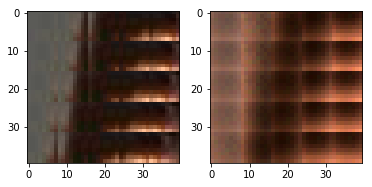

EPO: 7, recon_loss: 0.0173, total_loss: 0.0413, train_psnr:22.2647, validation_psnr:28.0050
EPO: 7, recon_loss: 0.0411, total_loss: 0.0665, train_psnr:22.2442, validation_psnr:27.7326
EPO: 7, recon_loss: 0.0257, total_loss: 0.0500, train_psnr:22.2681, validation_psnr:28.2065
EPO: 7, recon_loss: 0.0319, total_loss: 0.0621, train_psnr:22.2306, validation_psnr:28.0467
EPO: 7, recon_loss: 0.0124, total_loss: 0.0298, train_psnr:22.3129, validation_psnr:26.8096
EPO: 7, recon_loss: 0.0255, total_loss: 0.0321, train_psnr:22.3548, validation_psnr:26.6107
EPO: 7, recon_loss: 0.0262, total_loss: 0.0466, train_psnr:22.3984, validation_psnr:27.7390
EPO: 7, recon_loss: 0.0182, total_loss: 0.0312, train_psnr:22.4234, validation_psnr:27.9262
EPO: 7, recon_loss: 0.0227, total_loss: 0.0338, train_psnr:22.4445, validation_psnr:27.8529
EPO: 7, recon_loss: 0.0159, total_loss: 0.0395, train_psnr:22.4314, validation_psnr:27.9803
#########reconstruction test psnr: 26.6870 


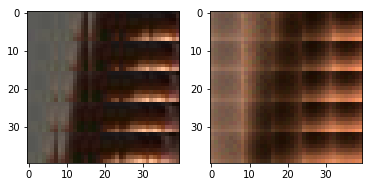

EPO: 7, recon_loss: 0.0169, total_loss: 0.0319, train_psnr:22.4482, validation_psnr:27.9272
EPO: 7, recon_loss: 0.0408, total_loss: 0.0539, train_psnr:22.4371, validation_psnr:28.0772
EPO: 7, recon_loss: 0.0108, total_loss: 0.0236, train_psnr:22.4474, validation_psnr:27.9759
EPO: 7, recon_loss: 0.0113, total_loss: 0.0252, train_psnr:22.4377, validation_psnr:27.8568
EPO: 7, recon_loss: 0.0219, total_loss: 0.0349, train_psnr:22.3959, validation_psnr:27.6387
EPO: 7, recon_loss: 0.0068, total_loss: 0.0215, train_psnr:22.3419, validation_psnr:27.7940
EPO: 7, recon_loss: 0.0421, total_loss: 0.0516, train_psnr:22.3055, validation_psnr:27.5434
EPO: 7, recon_loss: 0.0085, total_loss: 0.0202, train_psnr:22.2430, validation_psnr:27.6278
EPO: 7, recon_loss: 0.0163, total_loss: 0.0285, train_psnr:22.1860, validation_psnr:27.6277
EPO: 7, recon_loss: 0.0131, total_loss: 0.0212, train_psnr:22.1963, validation_psnr:26.9256
#########reconstruction test psnr: 25.8651 


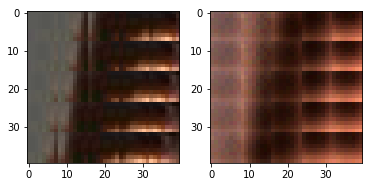

EPO: 7, recon_loss: 0.0088, total_loss: 0.0243, train_psnr:22.2255, validation_psnr:27.3262
EPO: 7, recon_loss: 0.0403, total_loss: 0.0491, train_psnr:22.2683, validation_psnr:27.1541
EPO: 7, recon_loss: 0.0152, total_loss: 0.0291, train_psnr:22.2762, validation_psnr:27.3608
EPO: 7, recon_loss: 0.0170, total_loss: 0.0256, train_psnr:22.2556, validation_psnr:27.6476
EPO: 7, recon_loss: 0.0207, total_loss: 0.0422, train_psnr:22.2358, validation_psnr:27.4708
EPO: 7, recon_loss: 0.0075, total_loss: 0.0182, train_psnr:22.2647, validation_psnr:27.0283
EPO: 7, recon_loss: 0.0469, total_loss: 0.0592, train_psnr:22.2846, validation_psnr:26.9254
EPO: 7, recon_loss: 0.0117, total_loss: 0.0157, train_psnr:22.2816, validation_psnr:26.9577
EPO: 7, recon_loss: 0.0215, total_loss: 0.0316, train_psnr:22.2450, validation_psnr:27.2176
EPO: 7, recon_loss: 0.0127, total_loss: 0.0294, train_psnr:22.2429, validation_psnr:27.7964
#########reconstruction test psnr: 26.5227 


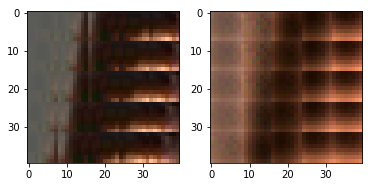

EPO: 7, recon_loss: 0.0065, total_loss: 0.0181, train_psnr:22.4173, validation_psnr:27.5419
EPO: 7, recon_loss: 0.0310, total_loss: 0.0383, train_psnr:22.4320, validation_psnr:27.6725
EPO: 7, recon_loss: 0.0075, total_loss: 0.0150, train_psnr:22.4624, validation_psnr:27.4665
EPO: 7, recon_loss: 0.0186, total_loss: 0.0252, train_psnr:22.4843, validation_psnr:27.3476
EPO: 7, recon_loss: 0.0406, total_loss: 0.0643, train_psnr:22.4523, validation_psnr:26.9668
EPO: 7, recon_loss: 0.0337, total_loss: 0.0544, train_psnr:22.3410, validation_psnr:26.2032
EPO: 7, recon_loss: 0.0274, total_loss: 0.0359, train_psnr:22.2400, validation_psnr:26.2289
EPO: 7, recon_loss: 0.0278, total_loss: 0.0411, train_psnr:22.1166, validation_psnr:26.2848
EPO: 7, recon_loss: 0.0233, total_loss: 0.0310, train_psnr:22.0706, validation_psnr:26.6488
EPO: 7, recon_loss: 0.0135, total_loss: 0.0410, train_psnr:22.0060, validation_psnr:27.0216
#########reconstruction test psnr: 25.8443 


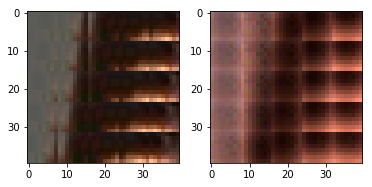

EPO: 7, recon_loss: 0.0069, total_loss: 0.0280, train_psnr:22.0466, validation_psnr:26.8072
EPO: 7, recon_loss: 0.0150, total_loss: 0.0282, train_psnr:22.0836, validation_psnr:26.7315
EPO: 7, recon_loss: 0.0208, total_loss: 0.0323, train_psnr:22.1288, validation_psnr:27.1972
EPO: 7, recon_loss: 0.0280, total_loss: 0.0400, train_psnr:22.1879, validation_psnr:27.3234
EPO: 7, recon_loss: 0.0133, total_loss: 0.0223, train_psnr:22.1522, validation_psnr:27.5309
EPO: 7, recon_loss: 0.0039, total_loss: 0.0067, train_psnr:22.3324, validation_psnr:27.3832
EPO: 7, recon_loss: 0.0152, total_loss: 0.0196, train_psnr:22.3858, validation_psnr:27.7272
EPO: 7, recon_loss: 0.0084, total_loss: 0.0119, train_psnr:22.4116, validation_psnr:27.4910
EPO: 7, recon_loss: 0.0060, total_loss: 0.0095, train_psnr:22.4616, validation_psnr:27.5994
EPO: 7, recon_loss: 0.0150, total_loss: 0.0200, train_psnr:22.4686, validation_psnr:26.9126
#########reconstruction test psnr: 25.7957 


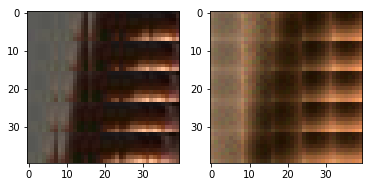

EPO: 7, recon_loss: 0.0159, total_loss: 0.0252, train_psnr:22.4314, validation_psnr:26.6627
EPO: 7, recon_loss: 0.0247, total_loss: 0.0333, train_psnr:22.4422, validation_psnr:26.7344
EPO: 7, recon_loss: 0.0183, total_loss: 0.0266, train_psnr:22.4062, validation_psnr:26.3775
EPO: 7, recon_loss: 0.0169, total_loss: 0.0209, train_psnr:22.4621, validation_psnr:26.4632
EPO: 7, recon_loss: 0.0287, total_loss: 0.0316, train_psnr:22.4515, validation_psnr:26.4873
EPO: 7, recon_loss: 0.0190, total_loss: 0.0301, train_psnr:22.4923, validation_psnr:27.1142
EPO: 7, recon_loss: 0.0291, total_loss: 0.0398, train_psnr:22.4147, validation_psnr:26.8867
EPO: 7, recon_loss: 0.0240, total_loss: 0.0300, train_psnr:22.3169, validation_psnr:27.1142
EPO: 7, recon_loss: 0.0192, total_loss: 0.0280, train_psnr:22.2445, validation_psnr:26.8992
EPO: 7, recon_loss: 0.0256, total_loss: 0.0332, train_psnr:22.1586, validation_psnr:26.8464
#########reconstruction test psnr: 25.7657 


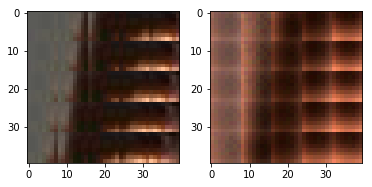

EPO: 7, recon_loss: 0.0276, total_loss: 0.0505, train_psnr:22.2245, validation_psnr:26.9400
EPO: 7, recon_loss: 0.0280, total_loss: 0.0360, train_psnr:22.3660, validation_psnr:26.4847
EPO: 7, recon_loss: 0.0217, total_loss: 0.0303, train_psnr:22.4154, validation_psnr:26.9600
EPO: 7, recon_loss: 0.0136, total_loss: 0.0218, train_psnr:22.4917, validation_psnr:26.4553
EPO: 7, recon_loss: 0.0168, total_loss: 0.0268, train_psnr:22.4612, validation_psnr:26.7765
EPO: 7, recon_loss: 0.0059, total_loss: 0.0148, train_psnr:22.4773, validation_psnr:25.9463
EPO: 7, recon_loss: 0.0110, total_loss: 0.0199, train_psnr:22.4431, validation_psnr:26.0727
EPO: 7, recon_loss: 0.0220, total_loss: 0.0271, train_psnr:22.3748, validation_psnr:25.9814
EPO: 7, recon_loss: 0.0212, total_loss: 0.0321, train_psnr:22.3593, validation_psnr:25.8548
EPO: 7, recon_loss: 0.0415, total_loss: 0.0484, train_psnr:22.2909, validation_psnr:26.0402
#########reconstruction test psnr: 25.0873 


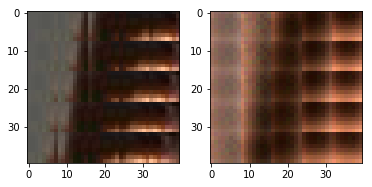

EPO: 7, recon_loss: 0.0085, total_loss: 0.0273, train_psnr:22.2827, validation_psnr:27.4536
EPO: 7, recon_loss: 0.0081, total_loss: 0.0163, train_psnr:22.2877, validation_psnr:26.7676
EPO: 7, recon_loss: 0.0133, total_loss: 0.0219, train_psnr:22.2911, validation_psnr:26.7312
EPO: 7, recon_loss: 0.0035, total_loss: 0.0071, train_psnr:22.2973, validation_psnr:26.8715
EPO: 7, recon_loss: 0.0068, total_loss: 0.0112, train_psnr:22.2847, validation_psnr:26.9373
EPO: 7, recon_loss: 0.0194, total_loss: 0.0305, train_psnr:22.4161, validation_psnr:27.4561
EPO: 7, recon_loss: 0.0162, total_loss: 0.0285, train_psnr:22.4401, validation_psnr:27.1617
EPO: 7, recon_loss: 0.0330, total_loss: 0.0417, train_psnr:22.4367, validation_psnr:26.8985
EPO: 7, recon_loss: 0.0192, total_loss: 0.0305, train_psnr:22.4745, validation_psnr:27.0726
EPO: 7, recon_loss: 0.0189, total_loss: 0.0244, train_psnr:22.4645, validation_psnr:26.9856
#########reconstruction test psnr: 25.8749 


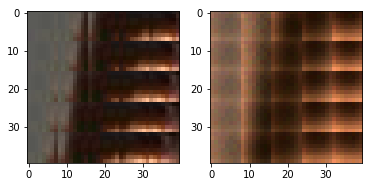

EPO: 8, recon_loss: 0.0077, total_loss: 0.0126, train_psnr:22.5088, validation_psnr:26.7092
EPO: 8, recon_loss: 0.0069, total_loss: 0.0102, train_psnr:22.5533, validation_psnr:26.9616
EPO: 8, recon_loss: 0.0209, total_loss: 0.0249, train_psnr:22.5524, validation_psnr:27.0994
EPO: 8, recon_loss: 0.0076, total_loss: 0.0130, train_psnr:22.5289, validation_psnr:27.0187
EPO: 8, recon_loss: 0.0148, total_loss: 0.0199, train_psnr:22.4944, validation_psnr:27.1535
EPO: 8, recon_loss: 0.0068, total_loss: 0.0236, train_psnr:22.4451, validation_psnr:27.9118
EPO: 8, recon_loss: 0.0064, total_loss: 0.0188, train_psnr:22.4375, validation_psnr:27.7564
EPO: 8, recon_loss: 0.0149, total_loss: 0.0232, train_psnr:22.4156, validation_psnr:27.5444
EPO: 8, recon_loss: 0.0123, total_loss: 0.0174, train_psnr:22.3997, validation_psnr:27.6566
EPO: 8, recon_loss: 0.0185, total_loss: 0.0282, train_psnr:22.3319, validation_psnr:27.4888
#########reconstruction test psnr: 26.2841 


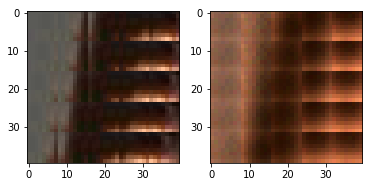

EPO: 8, recon_loss: 0.0070, total_loss: 0.0229, train_psnr:22.3875, validation_psnr:27.6883
EPO: 8, recon_loss: 0.0055, total_loss: 0.0115, train_psnr:22.4154, validation_psnr:27.1691
EPO: 8, recon_loss: 0.0127, total_loss: 0.0225, train_psnr:22.4199, validation_psnr:27.1892
EPO: 8, recon_loss: 0.0086, total_loss: 0.0114, train_psnr:22.4333, validation_psnr:27.5100
EPO: 8, recon_loss: 0.0176, total_loss: 0.0244, train_psnr:22.4312, validation_psnr:26.8076
EPO: 8, recon_loss: 0.0122, total_loss: 0.0228, train_psnr:22.3752, validation_psnr:27.7480
EPO: 8, recon_loss: 0.0122, total_loss: 0.0195, train_psnr:22.2014, validation_psnr:27.5897
EPO: 8, recon_loss: 0.0163, total_loss: 0.0238, train_psnr:22.0744, validation_psnr:27.6942
EPO: 8, recon_loss: 0.0126, total_loss: 0.0205, train_psnr:21.9751, validation_psnr:27.6972
EPO: 8, recon_loss: 0.0096, total_loss: 0.0156, train_psnr:21.8671, validation_psnr:27.6138
#########reconstruction test psnr: 26.3498 


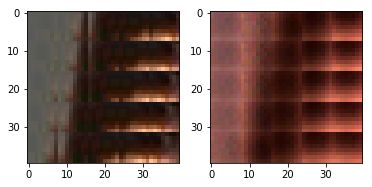

EPO: 8, recon_loss: 0.0141, total_loss: 0.0192, train_psnr:21.8649, validation_psnr:27.9735
EPO: 8, recon_loss: 0.0077, total_loss: 0.0145, train_psnr:22.0698, validation_psnr:27.9065
EPO: 8, recon_loss: 0.0208, total_loss: 0.0274, train_psnr:22.1850, validation_psnr:27.7197
EPO: 8, recon_loss: 0.0140, total_loss: 0.0188, train_psnr:22.2181, validation_psnr:27.6937
EPO: 8, recon_loss: 0.0131, total_loss: 0.0169, train_psnr:22.2783, validation_psnr:27.6344
EPO: 8, recon_loss: 0.0396, total_loss: 0.0602, train_psnr:22.2977, validation_psnr:27.2827
EPO: 8, recon_loss: 0.0142, total_loss: 0.0264, train_psnr:22.2948, validation_psnr:26.9811
EPO: 8, recon_loss: 0.0290, total_loss: 0.0405, train_psnr:22.3317, validation_psnr:26.9527
EPO: 8, recon_loss: 0.0343, total_loss: 0.0474, train_psnr:22.3680, validation_psnr:27.1207
EPO: 8, recon_loss: 0.0205, total_loss: 0.0292, train_psnr:22.3695, validation_psnr:27.1499
#########reconstruction test psnr: 25.9827 


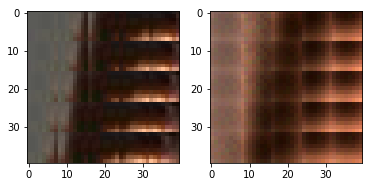

EPO: 8, recon_loss: 0.0162, total_loss: 0.0295, train_psnr:22.3787, validation_psnr:26.7704
EPO: 8, recon_loss: 0.0150, total_loss: 0.0235, train_psnr:22.5474, validation_psnr:26.9622
EPO: 8, recon_loss: 0.0230, total_loss: 0.0319, train_psnr:22.6081, validation_psnr:26.4528
EPO: 8, recon_loss: 0.0122, total_loss: 0.0158, train_psnr:22.6409, validation_psnr:26.3555
EPO: 8, recon_loss: 0.0151, total_loss: 0.0190, train_psnr:22.6484, validation_psnr:26.0783
EPO: 8, recon_loss: 0.0073, total_loss: 0.0123, train_psnr:22.6277, validation_psnr:25.9915
EPO: 8, recon_loss: 0.0062, total_loss: 0.0109, train_psnr:22.6216, validation_psnr:26.7458
EPO: 8, recon_loss: 0.0070, total_loss: 0.0139, train_psnr:22.5874, validation_psnr:27.2762
EPO: 8, recon_loss: 0.0131, total_loss: 0.0192, train_psnr:22.5712, validation_psnr:27.2765
EPO: 8, recon_loss: 0.0118, total_loss: 0.0219, train_psnr:22.5380, validation_psnr:27.5327
#########reconstruction test psnr: 26.2630 


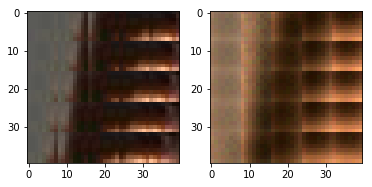

EPO: 8, recon_loss: 0.0167, total_loss: 0.0320, train_psnr:22.5107, validation_psnr:27.6702
EPO: 8, recon_loss: 0.0078, total_loss: 0.0212, train_psnr:22.5667, validation_psnr:27.5661
EPO: 8, recon_loss: 0.0122, total_loss: 0.0231, train_psnr:22.6028, validation_psnr:27.7224
EPO: 8, recon_loss: 0.0147, total_loss: 0.0223, train_psnr:22.6168, validation_psnr:27.3422
EPO: 8, recon_loss: 0.0062, total_loss: 0.0138, train_psnr:22.6553, validation_psnr:27.4259
EPO: 8, recon_loss: 0.0259, total_loss: 0.0376, train_psnr:22.6302, validation_psnr:27.4764
EPO: 8, recon_loss: 0.0378, total_loss: 0.0576, train_psnr:22.6625, validation_psnr:28.2305
EPO: 8, recon_loss: 0.0185, total_loss: 0.0286, train_psnr:22.7167, validation_psnr:27.7287
EPO: 8, recon_loss: 0.0250, total_loss: 0.0308, train_psnr:22.6807, validation_psnr:27.7238
EPO: 8, recon_loss: 0.0102, total_loss: 0.0151, train_psnr:22.6922, validation_psnr:27.6786
#########reconstruction test psnr: 26.4408 


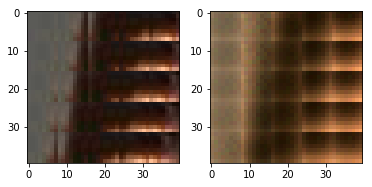

EPO: 8, recon_loss: 0.0212, total_loss: 0.0256, train_psnr:22.6409, validation_psnr:27.7860
EPO: 8, recon_loss: 0.0170, total_loss: 0.0252, train_psnr:22.7101, validation_psnr:27.2575
EPO: 8, recon_loss: 0.0181, total_loss: 0.0260, train_psnr:22.7180, validation_psnr:27.4697
EPO: 8, recon_loss: 0.0222, total_loss: 0.0325, train_psnr:22.6853, validation_psnr:27.4607
EPO: 8, recon_loss: 0.0191, total_loss: 0.0260, train_psnr:22.6740, validation_psnr:27.5142
EPO: 8, recon_loss: 0.0337, total_loss: 0.0399, train_psnr:22.6231, validation_psnr:27.4299
EPO: 8, recon_loss: 0.0220, total_loss: 0.0374, train_psnr:22.4715, validation_psnr:28.0391
EPO: 8, recon_loss: 0.0308, total_loss: 0.0447, train_psnr:22.3656, validation_psnr:28.2526
EPO: 8, recon_loss: 0.0477, total_loss: 0.0626, train_psnr:22.3780, validation_psnr:28.0324
EPO: 8, recon_loss: 0.0245, total_loss: 0.0392, train_psnr:22.2971, validation_psnr:28.2420
#########reconstruction test psnr: 26.8881 


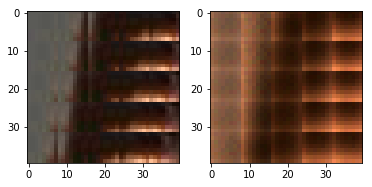

EPO: 8, recon_loss: 0.0242, total_loss: 0.0379, train_psnr:22.1953, validation_psnr:28.0744
EPO: 8, recon_loss: 0.0135, total_loss: 0.0229, train_psnr:22.4725, validation_psnr:27.0691
EPO: 8, recon_loss: 0.0127, total_loss: 0.0232, train_psnr:22.4876, validation_psnr:26.6830
EPO: 8, recon_loss: 0.0215, total_loss: 0.0298, train_psnr:22.4624, validation_psnr:26.7264
EPO: 8, recon_loss: 0.0193, total_loss: 0.0301, train_psnr:22.5326, validation_psnr:27.1477
EPO: 8, recon_loss: 0.0272, total_loss: 0.0384, train_psnr:22.4774, validation_psnr:27.8194
EPO: 8, recon_loss: 0.0092, total_loss: 0.0237, train_psnr:22.4798, validation_psnr:27.3300
EPO: 8, recon_loss: 0.0118, total_loss: 0.0234, train_psnr:22.4872, validation_psnr:26.6076
EPO: 8, recon_loss: 0.0371, total_loss: 0.0460, train_psnr:22.4414, validation_psnr:26.9061
EPO: 8, recon_loss: 0.0082, total_loss: 0.0215, train_psnr:22.5035, validation_psnr:26.9366
#########reconstruction test psnr: 25.8743 


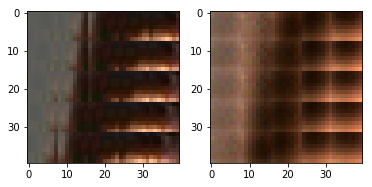

EPO: 8, recon_loss: 0.0163, total_loss: 0.0252, train_psnr:22.4697, validation_psnr:27.3024
EPO: 8, recon_loss: 0.0192, total_loss: 0.0464, train_psnr:22.4951, validation_psnr:27.2165
EPO: 8, recon_loss: 0.0156, total_loss: 0.0393, train_psnr:22.5093, validation_psnr:27.6738
EPO: 8, recon_loss: 0.0687, total_loss: 0.0885, train_psnr:22.4948, validation_psnr:27.8803
EPO: 8, recon_loss: 0.0142, total_loss: 0.0367, train_psnr:22.5667, validation_psnr:27.5281
EPO: 8, recon_loss: 0.0175, total_loss: 0.0426, train_psnr:22.5304, validation_psnr:27.4318
EPO: 8, recon_loss: 0.0292, total_loss: 0.0483, train_psnr:22.4013, validation_psnr:28.2239
EPO: 8, recon_loss: 0.0192, total_loss: 0.0446, train_psnr:22.3960, validation_psnr:27.9470
EPO: 8, recon_loss: 0.0648, total_loss: 0.0815, train_psnr:22.3609, validation_psnr:27.7573
EPO: 8, recon_loss: 0.0248, total_loss: 0.0498, train_psnr:22.3992, validation_psnr:27.8105
#########reconstruction test psnr: 26.6167 


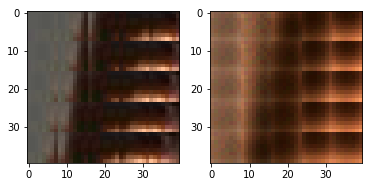

EPO: 8, recon_loss: 0.0290, total_loss: 0.0517, train_psnr:22.3522, validation_psnr:27.7265
EPO: 8, recon_loss: 0.0171, total_loss: 0.0412, train_psnr:22.4079, validation_psnr:27.1092
EPO: 8, recon_loss: 0.0142, total_loss: 0.0343, train_psnr:22.4509, validation_psnr:26.5190
EPO: 8, recon_loss: 0.0611, total_loss: 0.0749, train_psnr:22.5839, validation_psnr:26.5226
EPO: 8, recon_loss: 0.0505, total_loss: 0.0565, train_psnr:22.5840, validation_psnr:25.5118
EPO: 8, recon_loss: 0.0119, total_loss: 0.0203, train_psnr:22.5123, validation_psnr:25.7506
EPO: 8, recon_loss: 0.0113, total_loss: 0.0197, train_psnr:22.4639, validation_psnr:26.7658
EPO: 8, recon_loss: 0.0070, total_loss: 0.0193, train_psnr:22.6092, validation_psnr:26.6846
EPO: 8, recon_loss: 0.0289, total_loss: 0.0369, train_psnr:22.5919, validation_psnr:27.2952
EPO: 8, recon_loss: 0.0123, total_loss: 0.0263, train_psnr:22.5596, validation_psnr:27.4962
#########reconstruction test psnr: 26.3160 


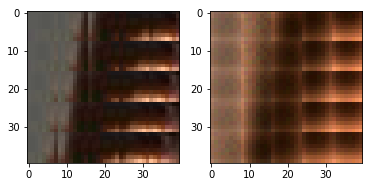

EPO: 8, recon_loss: 0.0185, total_loss: 0.0315, train_psnr:22.5400, validation_psnr:27.9633
EPO: 8, recon_loss: 0.0082, total_loss: 0.0171, train_psnr:22.5185, validation_psnr:27.8686
EPO: 8, recon_loss: 0.0026, total_loss: 0.0063, train_psnr:22.4625, validation_psnr:28.1303
EPO: 8, recon_loss: 0.0067, total_loss: 0.0110, train_psnr:22.4010, validation_psnr:28.2257
EPO: 8, recon_loss: 0.0036, total_loss: 0.0056, train_psnr:22.4391, validation_psnr:27.8633
EPO: 8, recon_loss: 0.0057, total_loss: 0.0085, train_psnr:22.4239, validation_psnr:27.7166
EPO: 8, recon_loss: 0.0227, total_loss: 0.0454, train_psnr:22.4043, validation_psnr:27.1543
EPO: 8, recon_loss: 0.0117, total_loss: 0.0203, train_psnr:22.3843, validation_psnr:26.8174
EPO: 8, recon_loss: 0.0245, total_loss: 0.0322, train_psnr:22.2695, validation_psnr:26.2733
EPO: 8, recon_loss: 0.0187, total_loss: 0.0232, train_psnr:22.1755, validation_psnr:26.4707
#########reconstruction test psnr: 25.4704 


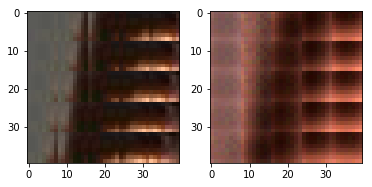

EPO: 8, recon_loss: 0.0130, total_loss: 0.0160, train_psnr:22.0604, validation_psnr:26.0182
EPO: 8, recon_loss: 0.0232, total_loss: 0.0424, train_psnr:21.9385, validation_psnr:24.9895
EPO: 8, recon_loss: 0.0253, total_loss: 0.0398, train_psnr:22.2463, validation_psnr:26.3151
EPO: 8, recon_loss: 0.0356, total_loss: 0.0510, train_psnr:22.3355, validation_psnr:26.6335
EPO: 8, recon_loss: 0.0320, total_loss: 0.0487, train_psnr:22.4143, validation_psnr:26.9663
EPO: 8, recon_loss: 0.0152, total_loss: 0.0252, train_psnr:22.5036, validation_psnr:26.6641
EPO: 8, recon_loss: 0.0245, total_loss: 0.0323, train_psnr:22.5354, validation_psnr:26.5030
EPO: 8, recon_loss: 0.0147, total_loss: 0.0202, train_psnr:22.6682, validation_psnr:26.5418
EPO: 8, recon_loss: 0.0160, total_loss: 0.0207, train_psnr:22.7292, validation_psnr:26.6254
EPO: 8, recon_loss: 0.0145, total_loss: 0.0217, train_psnr:22.7396, validation_psnr:26.6001
#########reconstruction test psnr: 25.5410 


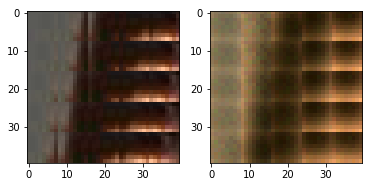

EPO: 8, recon_loss: 0.0131, total_loss: 0.0184, train_psnr:22.7829, validation_psnr:26.7491
EPO: 8, recon_loss: 0.0178, total_loss: 0.0260, train_psnr:22.7913, validation_psnr:26.7873
EPO: 8, recon_loss: 0.0146, total_loss: 0.0282, train_psnr:22.7720, validation_psnr:27.3226
EPO: 8, recon_loss: 0.0133, total_loss: 0.0225, train_psnr:22.7795, validation_psnr:26.5803
EPO: 8, recon_loss: 0.0294, total_loss: 0.0367, train_psnr:22.7235, validation_psnr:27.0698
EPO: 8, recon_loss: 0.0244, total_loss: 0.0325, train_psnr:22.7237, validation_psnr:26.8262
EPO: 8, recon_loss: 0.0166, total_loss: 0.0264, train_psnr:22.7118, validation_psnr:27.1676
EPO: 8, recon_loss: 0.0057, total_loss: 0.0103, train_psnr:22.7497, validation_psnr:26.9551
EPO: 8, recon_loss: 0.0081, total_loss: 0.0128, train_psnr:22.7754, validation_psnr:26.9925
EPO: 8, recon_loss: 0.0143, total_loss: 0.0211, train_psnr:22.7718, validation_psnr:26.6032
#########reconstruction test psnr: 25.5757 


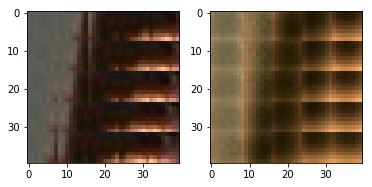

EPO: 8, recon_loss: 0.0057, total_loss: 0.0099, train_psnr:22.7973, validation_psnr:26.7347
EPO: 8, recon_loss: 0.0125, total_loss: 0.0160, train_psnr:22.7846, validation_psnr:26.6622
EPO: 8, recon_loss: 0.0127, total_loss: 0.0199, train_psnr:22.7688, validation_psnr:27.1257
EPO: 8, recon_loss: 0.0152, total_loss: 0.0224, train_psnr:22.7522, validation_psnr:27.0844
EPO: 8, recon_loss: 0.0241, total_loss: 0.0327, train_psnr:22.7363, validation_psnr:26.9481
EPO: 8, recon_loss: 0.0136, total_loss: 0.0229, train_psnr:22.6949, validation_psnr:26.9352
EPO: 8, recon_loss: 0.0086, total_loss: 0.0145, train_psnr:22.6499, validation_psnr:26.6586
EPO: 8, recon_loss: 0.0095, total_loss: 0.0227, train_psnr:22.6158, validation_psnr:27.1414
EPO: 8, recon_loss: 0.0092, total_loss: 0.0231, train_psnr:22.6214, validation_psnr:26.8297
EPO: 8, recon_loss: 0.0504, total_loss: 0.0602, train_psnr:22.5936, validation_psnr:26.8296
#########reconstruction test psnr: 25.7804 


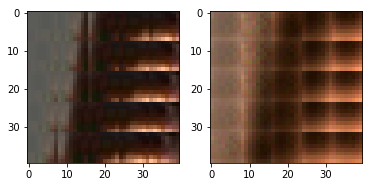

EPO: 8, recon_loss: 0.0130, total_loss: 0.0225, train_psnr:22.5934, validation_psnr:26.7334
EPO: 8, recon_loss: 0.0597, total_loss: 0.0688, train_psnr:22.4834, validation_psnr:26.8055
EPO: 8, recon_loss: 0.0066, total_loss: 0.0147, train_psnr:22.4870, validation_psnr:27.3688
EPO: 8, recon_loss: 0.0028, total_loss: 0.0096, train_psnr:22.4158, validation_psnr:26.1658
EPO: 8, recon_loss: 0.0345, total_loss: 0.0426, train_psnr:22.3975, validation_psnr:25.7388
EPO: 8, recon_loss: 0.0124, total_loss: 0.0180, train_psnr:22.3608, validation_psnr:26.1471
EPO: 8, recon_loss: 0.0136, total_loss: 0.0210, train_psnr:22.3409, validation_psnr:26.2232
EPO: 8, recon_loss: 0.0159, total_loss: 0.0266, train_psnr:22.3438, validation_psnr:27.2838
EPO: 8, recon_loss: 0.0164, total_loss: 0.0284, train_psnr:22.3786, validation_psnr:27.5808
EPO: 8, recon_loss: 0.0312, total_loss: 0.0398, train_psnr:22.3890, validation_psnr:27.6903
#########reconstruction test psnr: 26.4169 


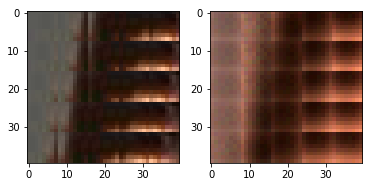

EPO: 8, recon_loss: 0.0087, total_loss: 0.0167, train_psnr:22.3795, validation_psnr:27.8237
EPO: 8, recon_loss: 0.0123, total_loss: 0.0186, train_psnr:22.3453, validation_psnr:27.8268
EPO: 8, recon_loss: 0.0138, total_loss: 0.0210, train_psnr:22.4295, validation_psnr:27.6529
EPO: 8, recon_loss: 0.0100, total_loss: 0.0147, train_psnr:22.6123, validation_psnr:27.7721
EPO: 8, recon_loss: 0.0258, total_loss: 0.0366, train_psnr:22.6868, validation_psnr:27.5392
EPO: 8, recon_loss: 0.0091, total_loss: 0.0151, train_psnr:22.7342, validation_psnr:27.6952
EPO: 8, recon_loss: 0.0111, total_loss: 0.0186, train_psnr:22.7695, validation_psnr:27.4574
EPO: 8, recon_loss: 0.0237, total_loss: 0.0365, train_psnr:22.7588, validation_psnr:27.5064
EPO: 8, recon_loss: 0.0124, total_loss: 0.0242, train_psnr:22.7797, validation_psnr:27.2521
EPO: 8, recon_loss: 0.0233, total_loss: 0.0311, train_psnr:22.7179, validation_psnr:27.3095
#########reconstruction test psnr: 26.1355 


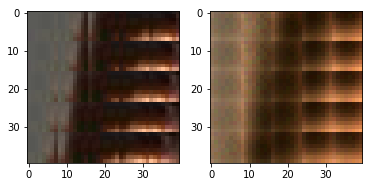

EPO: 8, recon_loss: 0.0178, total_loss: 0.0276, train_psnr:22.6159, validation_psnr:27.4260
EPO: 8, recon_loss: 0.0194, total_loss: 0.0297, train_psnr:22.5705, validation_psnr:27.6978
EPO: 8, recon_loss: 0.0189, total_loss: 0.0425, train_psnr:22.5038, validation_psnr:28.2153
EPO: 8, recon_loss: 0.0059, total_loss: 0.0124, train_psnr:22.6001, validation_psnr:27.4677
EPO: 8, recon_loss: 0.0156, total_loss: 0.0218, train_psnr:22.6341, validation_psnr:27.5105
EPO: 8, recon_loss: 0.0098, total_loss: 0.0174, train_psnr:22.6421, validation_psnr:27.6825
EPO: 8, recon_loss: 0.0108, total_loss: 0.0188, train_psnr:22.6536, validation_psnr:27.8188
EPO: 8, recon_loss: 0.0182, total_loss: 0.0300, train_psnr:22.6490, validation_psnr:27.3470
EPO: 8, recon_loss: 0.0088, total_loss: 0.0178, train_psnr:22.6950, validation_psnr:27.3250
EPO: 8, recon_loss: 0.0238, total_loss: 0.0328, train_psnr:22.6304, validation_psnr:27.4727
#########reconstruction test psnr: 26.2673 


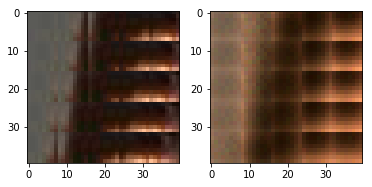

EPO: 8, recon_loss: 0.0262, total_loss: 0.0365, train_psnr:22.5893, validation_psnr:27.3479
EPO: 8, recon_loss: 0.0321, total_loss: 0.0434, train_psnr:22.5661, validation_psnr:27.3559
EPO: 8, recon_loss: 0.0188, total_loss: 0.0398, train_psnr:22.5334, validation_psnr:27.3412
EPO: 8, recon_loss: 0.0117, total_loss: 0.0227, train_psnr:22.4813, validation_psnr:27.3976
EPO: 8, recon_loss: 0.0158, total_loss: 0.0266, train_psnr:22.4413, validation_psnr:27.2200
EPO: 8, recon_loss: 0.0241, total_loss: 0.0335, train_psnr:22.3947, validation_psnr:27.4254
EPO: 8, recon_loss: 0.0237, total_loss: 0.0330, train_psnr:22.3365, validation_psnr:27.3998
EPO: 8, recon_loss: 0.0125, total_loss: 0.0169, train_psnr:22.2803, validation_psnr:27.2678
EPO: 8, recon_loss: 0.0063, total_loss: 0.0096, train_psnr:22.4125, validation_psnr:27.6205
EPO: 8, recon_loss: 0.0075, total_loss: 0.0108, train_psnr:22.4606, validation_psnr:27.9054
#########reconstruction test psnr: 26.5517 


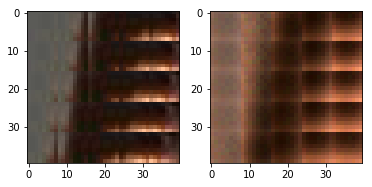

EPO: 8, recon_loss: 0.0158, total_loss: 0.0234, train_psnr:22.3938, validation_psnr:27.7210
EPO: 8, recon_loss: 0.0128, total_loss: 0.0203, train_psnr:22.4220, validation_psnr:27.5793
EPO: 8, recon_loss: 0.0203, total_loss: 0.0269, train_psnr:22.3891, validation_psnr:27.5438
EPO: 8, recon_loss: 0.0278, total_loss: 0.0505, train_psnr:22.4179, validation_psnr:28.2724
EPO: 8, recon_loss: 0.0146, total_loss: 0.0351, train_psnr:22.4404, validation_psnr:28.2414
EPO: 8, recon_loss: 0.0347, total_loss: 0.0590, train_psnr:22.4422, validation_psnr:28.1492
EPO: 8, recon_loss: 0.0269, total_loss: 0.0538, train_psnr:22.4444, validation_psnr:28.2938
EPO: 8, recon_loss: 0.0285, total_loss: 0.0573, train_psnr:22.3957, validation_psnr:28.3800
EPO: 8, recon_loss: 0.0102, total_loss: 0.0237, train_psnr:22.4711, validation_psnr:26.6826
EPO: 8, recon_loss: 0.0334, total_loss: 0.0434, train_psnr:22.5472, validation_psnr:27.0497
#########reconstruction test psnr: 25.9264 


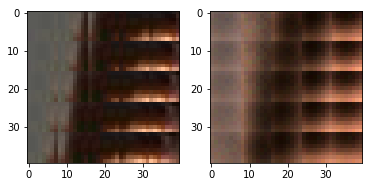

EPO: 8, recon_loss: 0.0192, total_loss: 0.0388, train_psnr:22.5560, validation_psnr:28.2766
EPO: 8, recon_loss: 0.0177, total_loss: 0.0302, train_psnr:22.5843, validation_psnr:28.1882
EPO: 8, recon_loss: 0.0226, total_loss: 0.0358, train_psnr:22.6019, validation_psnr:28.1403
EPO: 8, recon_loss: 0.0177, total_loss: 0.0370, train_psnr:22.5947, validation_psnr:28.1479
EPO: 8, recon_loss: 0.0210, total_loss: 0.0349, train_psnr:22.6298, validation_psnr:28.0345
EPO: 8, recon_loss: 0.0292, total_loss: 0.0442, train_psnr:22.6235, validation_psnr:28.2584
EPO: 8, recon_loss: 0.0107, total_loss: 0.0245, train_psnr:22.6178, validation_psnr:28.1698
EPO: 8, recon_loss: 0.0156, total_loss: 0.0280, train_psnr:22.5967, validation_psnr:28.0815
EPO: 8, recon_loss: 0.0145, total_loss: 0.0244, train_psnr:22.5714, validation_psnr:27.9569
EPO: 8, recon_loss: 0.0102, total_loss: 0.0232, train_psnr:22.5241, validation_psnr:27.9967
#########reconstruction test psnr: 26.7300 


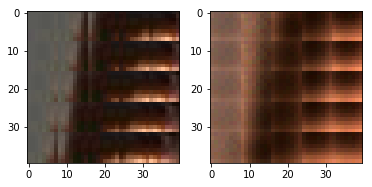

EPO: 8, recon_loss: 0.0317, total_loss: 0.0407, train_psnr:22.4440, validation_psnr:27.6866
EPO: 8, recon_loss: 0.0088, total_loss: 0.0200, train_psnr:22.4069, validation_psnr:27.7489
EPO: 8, recon_loss: 0.0166, total_loss: 0.0280, train_psnr:22.3128, validation_psnr:27.8745
EPO: 8, recon_loss: 0.0094, total_loss: 0.0189, train_psnr:22.3471, validation_psnr:27.4539
EPO: 8, recon_loss: 0.0116, total_loss: 0.0270, train_psnr:22.4031, validation_psnr:27.5973
EPO: 8, recon_loss: 0.0399, total_loss: 0.0465, train_psnr:22.4262, validation_psnr:27.5811
EPO: 8, recon_loss: 0.0149, total_loss: 0.0288, train_psnr:22.4589, validation_psnr:27.6240
EPO: 8, recon_loss: 0.0217, total_loss: 0.0297, train_psnr:22.4049, validation_psnr:27.8640
EPO: 8, recon_loss: 0.0119, total_loss: 0.0250, train_psnr:22.4155, validation_psnr:27.6428
EPO: 8, recon_loss: 0.0097, total_loss: 0.0197, train_psnr:22.4347, validation_psnr:27.2298
#########reconstruction test psnr: 26.0856 


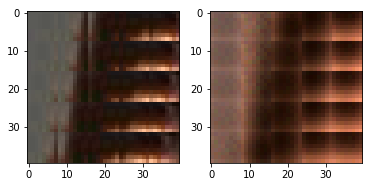

EPO: 8, recon_loss: 0.0323, total_loss: 0.0428, train_psnr:22.4599, validation_psnr:27.4636
EPO: 8, recon_loss: 0.0103, total_loss: 0.0149, train_psnr:22.4429, validation_psnr:27.1167
EPO: 8, recon_loss: 0.0208, total_loss: 0.0303, train_psnr:22.4092, validation_psnr:27.3618
EPO: 8, recon_loss: 0.0124, total_loss: 0.0256, train_psnr:22.4714, validation_psnr:27.8312
EPO: 8, recon_loss: 0.0056, total_loss: 0.0158, train_psnr:22.5974, validation_psnr:27.8247
EPO: 8, recon_loss: 0.0221, total_loss: 0.0283, train_psnr:22.6200, validation_psnr:27.6992
EPO: 8, recon_loss: 0.0077, total_loss: 0.0156, train_psnr:22.6513, validation_psnr:27.6687
EPO: 8, recon_loss: 0.0135, total_loss: 0.0200, train_psnr:22.6577, validation_psnr:27.4973
EPO: 8, recon_loss: 0.0363, total_loss: 0.0590, train_psnr:22.6026, validation_psnr:26.9695
EPO: 8, recon_loss: 0.0314, total_loss: 0.0494, train_psnr:22.4926, validation_psnr:26.5582
#########reconstruction test psnr: 25.5269 


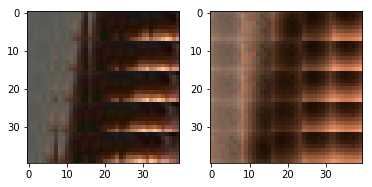

EPO: 8, recon_loss: 0.0232, total_loss: 0.0307, train_psnr:22.3991, validation_psnr:26.6489
EPO: 8, recon_loss: 0.0259, total_loss: 0.0378, train_psnr:22.2675, validation_psnr:26.6739
EPO: 8, recon_loss: 0.0185, total_loss: 0.0246, train_psnr:22.2250, validation_psnr:26.9551
EPO: 8, recon_loss: 0.0121, total_loss: 0.0385, train_psnr:22.1577, validation_psnr:27.4115
EPO: 8, recon_loss: 0.0061, total_loss: 0.0251, train_psnr:22.2067, validation_psnr:26.8958
EPO: 8, recon_loss: 0.0270, total_loss: 0.0374, train_psnr:22.2557, validation_psnr:26.9916
EPO: 8, recon_loss: 0.0193, total_loss: 0.0319, train_psnr:22.2991, validation_psnr:27.5186
EPO: 8, recon_loss: 0.0247, total_loss: 0.0341, train_psnr:22.3504, validation_psnr:27.4828
EPO: 8, recon_loss: 0.0138, total_loss: 0.0213, train_psnr:22.3742, validation_psnr:27.6220
EPO: 8, recon_loss: 0.0033, total_loss: 0.0056, train_psnr:22.5241, validation_psnr:27.7070
#########reconstruction test psnr: 26.4461 


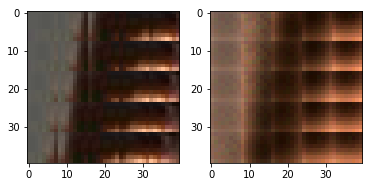

EPO: 8, recon_loss: 0.0190, total_loss: 0.0226, train_psnr:22.5560, validation_psnr:27.8756
EPO: 8, recon_loss: 0.0058, total_loss: 0.0089, train_psnr:22.5984, validation_psnr:27.6589
EPO: 8, recon_loss: 0.0061, total_loss: 0.0094, train_psnr:22.6496, validation_psnr:27.7039
EPO: 8, recon_loss: 0.0149, total_loss: 0.0202, train_psnr:22.6344, validation_psnr:26.8143
EPO: 8, recon_loss: 0.0148, total_loss: 0.0229, train_psnr:22.6099, validation_psnr:26.9313
EPO: 8, recon_loss: 0.0288, total_loss: 0.0372, train_psnr:22.6327, validation_psnr:26.6575
EPO: 8, recon_loss: 0.0144, total_loss: 0.0214, train_psnr:22.5910, validation_psnr:26.5872
EPO: 8, recon_loss: 0.0153, total_loss: 0.0191, train_psnr:22.6397, validation_psnr:26.8213
EPO: 8, recon_loss: 0.0241, total_loss: 0.0437, train_psnr:22.6334, validation_psnr:27.2892
EPO: 8, recon_loss: 0.0265, total_loss: 0.0386, train_psnr:22.6484, validation_psnr:27.3510
#########reconstruction test psnr: 26.1830 


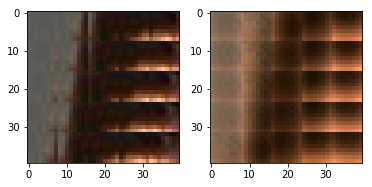

EPO: 8, recon_loss: 0.0207, total_loss: 0.0296, train_psnr:22.5655, validation_psnr:27.2515
EPO: 8, recon_loss: 0.0225, total_loss: 0.0282, train_psnr:22.4728, validation_psnr:27.2284
EPO: 8, recon_loss: 0.0185, total_loss: 0.0260, train_psnr:22.3884, validation_psnr:27.2011
EPO: 8, recon_loss: 0.0342, total_loss: 0.0489, train_psnr:22.2907, validation_psnr:27.4844
EPO: 8, recon_loss: 0.0487, total_loss: 0.0693, train_psnr:22.4377, validation_psnr:26.9225
EPO: 8, recon_loss: 0.0215, total_loss: 0.0294, train_psnr:22.5175, validation_psnr:27.4031
EPO: 8, recon_loss: 0.0179, total_loss: 0.0259, train_psnr:22.6061, validation_psnr:27.1198
EPO: 8, recon_loss: 0.0136, total_loss: 0.0216, train_psnr:22.6531, validation_psnr:26.9529
EPO: 8, recon_loss: 0.0337, total_loss: 0.0450, train_psnr:22.5175, validation_psnr:27.5337
EPO: 8, recon_loss: 0.0046, total_loss: 0.0136, train_psnr:22.6293, validation_psnr:26.2645
#########reconstruction test psnr: 25.2680 


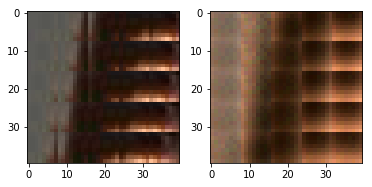

EPO: 8, recon_loss: 0.0132, total_loss: 0.0224, train_psnr:22.5956, validation_psnr:26.5090
EPO: 8, recon_loss: 0.0193, total_loss: 0.0264, train_psnr:22.5204, validation_psnr:26.2798
EPO: 8, recon_loss: 0.0266, total_loss: 0.0357, train_psnr:22.5053, validation_psnr:26.3252
EPO: 8, recon_loss: 0.0490, total_loss: 0.0560, train_psnr:22.4267, validation_psnr:25.9368
EPO: 8, recon_loss: 0.0049, total_loss: 0.0175, train_psnr:22.4624, validation_psnr:27.5911
EPO: 8, recon_loss: 0.0098, total_loss: 0.0173, train_psnr:22.4659, validation_psnr:27.3037
EPO: 8, recon_loss: 0.0136, total_loss: 0.0220, train_psnr:22.4543, validation_psnr:27.0516
EPO: 8, recon_loss: 0.0043, total_loss: 0.0087, train_psnr:22.4675, validation_psnr:27.1965
EPO: 8, recon_loss: 0.0080, total_loss: 0.0118, train_psnr:22.4440, validation_psnr:27.1800
EPO: 8, recon_loss: 0.0148, total_loss: 0.0271, train_psnr:22.5757, validation_psnr:27.6220
#########reconstruction test psnr: 26.3776 


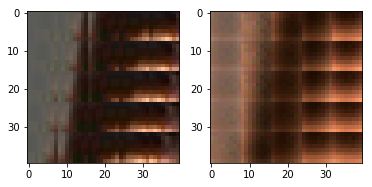

EPO: 8, recon_loss: 0.0147, total_loss: 0.0259, train_psnr:22.6025, validation_psnr:27.2288
EPO: 8, recon_loss: 0.0260, total_loss: 0.0360, train_psnr:22.6112, validation_psnr:27.6055
EPO: 8, recon_loss: 0.0168, total_loss: 0.0275, train_psnr:22.6392, validation_psnr:27.1854
EPO: 8, recon_loss: 0.0261, total_loss: 0.0313, train_psnr:22.6298, validation_psnr:27.0305
EPO: 9, recon_loss: 0.0084, total_loss: 0.0126, train_psnr:22.6922, validation_psnr:27.0387
EPO: 9, recon_loss: 0.0064, total_loss: 0.0100, train_psnr:22.7281, validation_psnr:27.1490
EPO: 9, recon_loss: 0.0282, total_loss: 0.0334, train_psnr:22.6851, validation_psnr:26.8402
EPO: 9, recon_loss: 0.0088, total_loss: 0.0138, train_psnr:22.6953, validation_psnr:27.1117
EPO: 9, recon_loss: 0.0185, total_loss: 0.0228, train_psnr:22.6646, validation_psnr:27.0774
EPO: 9, recon_loss: 0.0065, total_loss: 0.0217, train_psnr:22.6290, validation_psnr:28.0854
#########reconstruction test psnr: 26.7769 


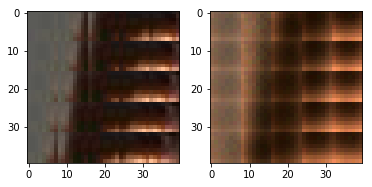

EPO: 9, recon_loss: 0.0100, total_loss: 0.0192, train_psnr:22.6082, validation_psnr:27.6829
EPO: 9, recon_loss: 0.0150, total_loss: 0.0219, train_psnr:22.5770, validation_psnr:27.9039
EPO: 9, recon_loss: 0.0128, total_loss: 0.0178, train_psnr:22.5746, validation_psnr:27.8404
EPO: 9, recon_loss: 0.0193, total_loss: 0.0306, train_psnr:22.5179, validation_psnr:27.7027
EPO: 9, recon_loss: 0.0062, total_loss: 0.0204, train_psnr:22.5753, validation_psnr:27.8715
EPO: 9, recon_loss: 0.0055, total_loss: 0.0106, train_psnr:22.5991, validation_psnr:27.5883
EPO: 9, recon_loss: 0.0115, total_loss: 0.0206, train_psnr:22.5800, validation_psnr:27.3693
EPO: 9, recon_loss: 0.0096, total_loss: 0.0117, train_psnr:22.6095, validation_psnr:27.8875
EPO: 9, recon_loss: 0.0229, total_loss: 0.0308, train_psnr:22.6006, validation_psnr:27.2481
EPO: 9, recon_loss: 0.0119, total_loss: 0.0200, train_psnr:22.5037, validation_psnr:27.9468
#########reconstruction test psnr: 26.6273 


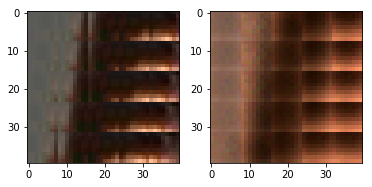

EPO: 9, recon_loss: 0.0116, total_loss: 0.0186, train_psnr:22.3142, validation_psnr:28.0097
EPO: 9, recon_loss: 0.0144, total_loss: 0.0207, train_psnr:22.2132, validation_psnr:27.8867
EPO: 9, recon_loss: 0.0110, total_loss: 0.0199, train_psnr:22.1033, validation_psnr:27.8920
EPO: 9, recon_loss: 0.0125, total_loss: 0.0186, train_psnr:22.0096, validation_psnr:27.9692
EPO: 9, recon_loss: 0.0101, total_loss: 0.0147, train_psnr:22.0665, validation_psnr:28.1420
EPO: 9, recon_loss: 0.0072, total_loss: 0.0140, train_psnr:22.2610, validation_psnr:28.1081
EPO: 9, recon_loss: 0.0220, total_loss: 0.0263, train_psnr:22.3427, validation_psnr:27.9331
EPO: 9, recon_loss: 0.0082, total_loss: 0.0128, train_psnr:22.3987, validation_psnr:27.8780
EPO: 9, recon_loss: 0.0126, total_loss: 0.0157, train_psnr:22.4356, validation_psnr:27.9529
EPO: 9, recon_loss: 0.0278, total_loss: 0.0425, train_psnr:22.4554, validation_psnr:27.3551
#########reconstruction test psnr: 26.1396 


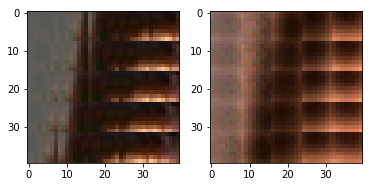

EPO: 9, recon_loss: 0.0120, total_loss: 0.0230, train_psnr:22.4427, validation_psnr:27.0498
EPO: 9, recon_loss: 0.0257, total_loss: 0.0404, train_psnr:22.5098, validation_psnr:27.6459
EPO: 9, recon_loss: 0.0290, total_loss: 0.0387, train_psnr:22.5286, validation_psnr:27.3162
EPO: 9, recon_loss: 0.0232, total_loss: 0.0310, train_psnr:22.5244, validation_psnr:27.1865
EPO: 9, recon_loss: 0.0256, total_loss: 0.0419, train_psnr:22.5405, validation_psnr:27.5522
EPO: 9, recon_loss: 0.0120, total_loss: 0.0208, train_psnr:22.7231, validation_psnr:26.8461
EPO: 9, recon_loss: 0.0254, total_loss: 0.0319, train_psnr:22.7617, validation_psnr:26.7798
EPO: 9, recon_loss: 0.0083, total_loss: 0.0110, train_psnr:22.8082, validation_psnr:26.7881
EPO: 9, recon_loss: 0.0091, total_loss: 0.0134, train_psnr:22.8081, validation_psnr:26.3358
EPO: 9, recon_loss: 0.0054, total_loss: 0.0099, train_psnr:22.7998, validation_psnr:26.1164
#########reconstruction test psnr: 25.1751 


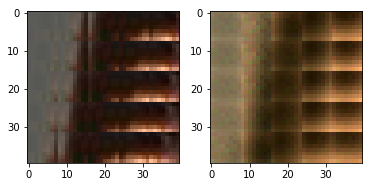

EPO: 9, recon_loss: 0.0046, total_loss: 0.0089, train_psnr:22.7866, validation_psnr:27.0322
EPO: 9, recon_loss: 0.0086, total_loss: 0.0169, train_psnr:22.7443, validation_psnr:27.5310
EPO: 9, recon_loss: 0.0077, total_loss: 0.0134, train_psnr:22.7293, validation_psnr:27.3231
EPO: 9, recon_loss: 0.0123, total_loss: 0.0244, train_psnr:22.6971, validation_psnr:27.6974
EPO: 9, recon_loss: 0.0096, total_loss: 0.0246, train_psnr:22.6817, validation_psnr:27.5046
EPO: 9, recon_loss: 0.0065, total_loss: 0.0187, train_psnr:22.7415, validation_psnr:27.7697
EPO: 9, recon_loss: 0.0128, total_loss: 0.0219, train_psnr:22.7726, validation_psnr:27.7650
EPO: 9, recon_loss: 0.0100, total_loss: 0.0159, train_psnr:22.7805, validation_psnr:27.5505
EPO: 9, recon_loss: 0.0087, total_loss: 0.0178, train_psnr:22.8135, validation_psnr:27.8075
EPO: 9, recon_loss: 0.0107, total_loss: 0.0309, train_psnr:22.7491, validation_psnr:28.4223
#########reconstruction test psnr: 26.9672 


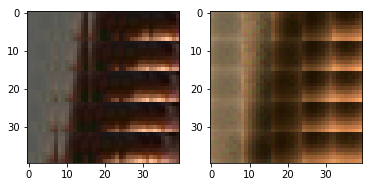

EPO: 9, recon_loss: 0.0142, total_loss: 0.0256, train_psnr:22.8349, validation_psnr:28.3585
EPO: 9, recon_loss: 0.0275, total_loss: 0.0369, train_psnr:22.8673, validation_psnr:27.8843
EPO: 9, recon_loss: 0.0164, total_loss: 0.0222, train_psnr:22.8473, validation_psnr:27.7800
EPO: 9, recon_loss: 0.0125, total_loss: 0.0173, train_psnr:22.8455, validation_psnr:27.8403
EPO: 9, recon_loss: 0.0263, total_loss: 0.0332, train_psnr:22.7991, validation_psnr:27.8251
EPO: 9, recon_loss: 0.0129, total_loss: 0.0193, train_psnr:22.8788, validation_psnr:27.6431
EPO: 9, recon_loss: 0.0203, total_loss: 0.0303, train_psnr:22.8492, validation_psnr:27.9551
EPO: 9, recon_loss: 0.0190, total_loss: 0.0283, train_psnr:22.8416, validation_psnr:27.8120
EPO: 9, recon_loss: 0.0192, total_loss: 0.0269, train_psnr:22.8063, validation_psnr:27.7946
EPO: 9, recon_loss: 0.0342, total_loss: 0.0390, train_psnr:22.7527, validation_psnr:27.8736
#########reconstruction test psnr: 26.5760 


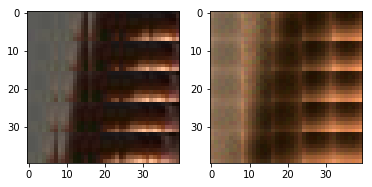

EPO: 9, recon_loss: 0.0210, total_loss: 0.0360, train_psnr:22.6556, validation_psnr:28.2333
EPO: 9, recon_loss: 0.0327, total_loss: 0.0469, train_psnr:22.5757, validation_psnr:28.3575
EPO: 9, recon_loss: 0.0421, total_loss: 0.0558, train_psnr:22.5937, validation_psnr:28.1693
EPO: 9, recon_loss: 0.0231, total_loss: 0.0372, train_psnr:22.5020, validation_psnr:28.3979
EPO: 9, recon_loss: 0.0238, total_loss: 0.0364, train_psnr:22.4074, validation_psnr:28.2538
EPO: 9, recon_loss: 0.0103, total_loss: 0.0190, train_psnr:22.6536, validation_psnr:27.1578
EPO: 9, recon_loss: 0.0147, total_loss: 0.0236, train_psnr:22.6763, validation_psnr:27.1222
EPO: 9, recon_loss: 0.0179, total_loss: 0.0274, train_psnr:22.6398, validation_psnr:27.2050
EPO: 9, recon_loss: 0.0239, total_loss: 0.0367, train_psnr:22.6878, validation_psnr:27.6648
EPO: 9, recon_loss: 0.0239, total_loss: 0.0335, train_psnr:22.6269, validation_psnr:28.0406
#########reconstruction test psnr: 26.7400 


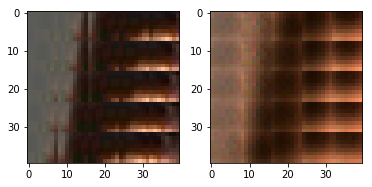

EPO: 9, recon_loss: 0.0084, total_loss: 0.0225, train_psnr:22.6343, validation_psnr:27.2705
EPO: 9, recon_loss: 0.0227, total_loss: 0.0341, train_psnr:22.6139, validation_psnr:27.2428
EPO: 9, recon_loss: 0.0347, total_loss: 0.0443, train_psnr:22.5755, validation_psnr:26.9168
EPO: 9, recon_loss: 0.0078, total_loss: 0.0209, train_psnr:22.6522, validation_psnr:27.2293
EPO: 9, recon_loss: 0.0189, total_loss: 0.0269, train_psnr:22.5953, validation_psnr:27.5891
EPO: 9, recon_loss: 0.0145, total_loss: 0.0373, train_psnr:22.6582, validation_psnr:27.5569
EPO: 9, recon_loss: 0.0157, total_loss: 0.0373, train_psnr:22.6566, validation_psnr:27.8951
EPO: 9, recon_loss: 0.0567, total_loss: 0.0762, train_psnr:22.6752, validation_psnr:27.5133
EPO: 9, recon_loss: 0.0143, total_loss: 0.0390, train_psnr:22.7278, validation_psnr:27.7618
EPO: 9, recon_loss: 0.0189, total_loss: 0.0393, train_psnr:22.7066, validation_psnr:27.7976
#########reconstruction test psnr: 26.5583 


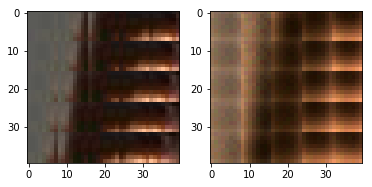

EPO: 9, recon_loss: 0.0233, total_loss: 0.0420, train_psnr:22.5962, validation_psnr:28.2448
EPO: 9, recon_loss: 0.0160, total_loss: 0.0399, train_psnr:22.5827, validation_psnr:28.1494
EPO: 9, recon_loss: 0.0765, total_loss: 0.0909, train_psnr:22.5143, validation_psnr:27.8579
EPO: 9, recon_loss: 0.0273, total_loss: 0.0504, train_psnr:22.5769, validation_psnr:27.9368
EPO: 9, recon_loss: 0.0262, total_loss: 0.0482, train_psnr:22.5115, validation_psnr:27.7436
EPO: 9, recon_loss: 0.0097, total_loss: 0.0309, train_psnr:22.5917, validation_psnr:27.1707
EPO: 9, recon_loss: 0.0311, total_loss: 0.0542, train_psnr:22.6052, validation_psnr:26.8345
EPO: 9, recon_loss: 0.0735, total_loss: 0.0833, train_psnr:22.6577, validation_psnr:27.1884
EPO: 9, recon_loss: 0.0409, total_loss: 0.0494, train_psnr:22.7127, validation_psnr:26.2300
EPO: 9, recon_loss: 0.0120, total_loss: 0.0176, train_psnr:22.6613, validation_psnr:26.1840
#########reconstruction test psnr: 25.3156 


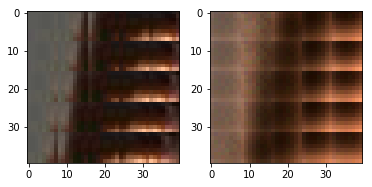

EPO: 9, recon_loss: 0.0085, total_loss: 0.0172, train_psnr:22.6735, validation_psnr:26.8639
EPO: 9, recon_loss: 0.0087, total_loss: 0.0206, train_psnr:22.7683, validation_psnr:27.0946
EPO: 9, recon_loss: 0.0269, total_loss: 0.0350, train_psnr:22.7308, validation_psnr:27.4872
EPO: 9, recon_loss: 0.0111, total_loss: 0.0246, train_psnr:22.7236, validation_psnr:27.8611
EPO: 9, recon_loss: 0.0262, total_loss: 0.0366, train_psnr:22.6976, validation_psnr:28.1369
EPO: 9, recon_loss: 0.0054, total_loss: 0.0105, train_psnr:22.6324, validation_psnr:28.2262
EPO: 9, recon_loss: 0.0023, total_loss: 0.0064, train_psnr:22.5827, validation_psnr:28.3418
EPO: 9, recon_loss: 0.0079, total_loss: 0.0114, train_psnr:22.6569, validation_psnr:28.1420
EPO: 9, recon_loss: 0.0037, total_loss: 0.0054, train_psnr:22.6067, validation_psnr:28.0042
EPO: 9, recon_loss: 0.0056, total_loss: 0.0090, train_psnr:22.5768, validation_psnr:27.7769
#########reconstruction test psnr: 26.5077 


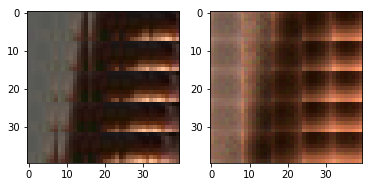

EPO: 9, recon_loss: 0.0230, total_loss: 0.0413, train_psnr:22.5763, validation_psnr:27.6017
EPO: 9, recon_loss: 0.0102, total_loss: 0.0182, train_psnr:22.5234, validation_psnr:27.0365
EPO: 9, recon_loss: 0.0251, total_loss: 0.0312, train_psnr:22.4045, validation_psnr:26.5645
EPO: 9, recon_loss: 0.0121, total_loss: 0.0157, train_psnr:22.2866, validation_psnr:26.3495
EPO: 9, recon_loss: 0.0116, total_loss: 0.0142, train_psnr:22.1802, validation_psnr:26.3325
EPO: 9, recon_loss: 0.0239, total_loss: 0.0446, train_psnr:22.2308, validation_psnr:26.4217
EPO: 9, recon_loss: 0.0250, total_loss: 0.0373, train_psnr:22.4123, validation_psnr:26.7309
EPO: 9, recon_loss: 0.0296, total_loss: 0.0431, train_psnr:22.4913, validation_psnr:26.9674
EPO: 9, recon_loss: 0.0392, total_loss: 0.0521, train_psnr:22.5952, validation_psnr:27.3422
EPO: 9, recon_loss: 0.0147, total_loss: 0.0244, train_psnr:22.6525, validation_psnr:26.9851
#########reconstruction test psnr: 25.8476 


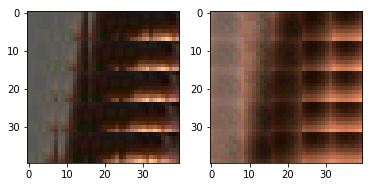

EPO: 9, recon_loss: 0.0217, total_loss: 0.0293, train_psnr:22.7260, validation_psnr:26.8521
EPO: 9, recon_loss: 0.0132, total_loss: 0.0184, train_psnr:22.8291, validation_psnr:26.8673
EPO: 9, recon_loss: 0.0147, total_loss: 0.0197, train_psnr:22.8779, validation_psnr:26.9498
EPO: 9, recon_loss: 0.0123, total_loss: 0.0176, train_psnr:22.8922, validation_psnr:26.9461
EPO: 9, recon_loss: 0.0136, total_loss: 0.0202, train_psnr:22.9364, validation_psnr:26.9820
EPO: 9, recon_loss: 0.0061, total_loss: 0.0260, train_psnr:22.9203, validation_psnr:27.6436
EPO: 9, recon_loss: 0.0064, total_loss: 0.0163, train_psnr:22.9260, validation_psnr:27.4537
EPO: 9, recon_loss: 0.0292, total_loss: 0.0372, train_psnr:22.9108, validation_psnr:26.8011
EPO: 9, recon_loss: 0.0218, total_loss: 0.0296, train_psnr:22.8831, validation_psnr:27.0787
EPO: 9, recon_loss: 0.0148, total_loss: 0.0216, train_psnr:22.8726, validation_psnr:27.1173
#########reconstruction test psnr: 25.9945 


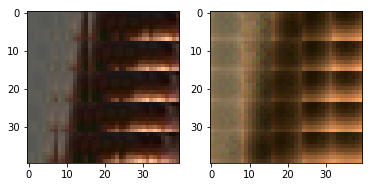

EPO: 9, recon_loss: 0.0121, total_loss: 0.0194, train_psnr:22.8515, validation_psnr:27.5417
EPO: 9, recon_loss: 0.0049, total_loss: 0.0097, train_psnr:22.9155, validation_psnr:27.1245
EPO: 9, recon_loss: 0.0090, total_loss: 0.0131, train_psnr:22.9355, validation_psnr:27.0536
EPO: 9, recon_loss: 0.0124, total_loss: 0.0185, train_psnr:22.9291, validation_psnr:26.9570
EPO: 9, recon_loss: 0.0074, total_loss: 0.0111, train_psnr:22.9438, validation_psnr:26.9754
EPO: 9, recon_loss: 0.0145, total_loss: 0.0178, train_psnr:22.9319, validation_psnr:26.8321
EPO: 9, recon_loss: 0.0094, total_loss: 0.0156, train_psnr:22.9210, validation_psnr:27.3809
EPO: 9, recon_loss: 0.0174, total_loss: 0.0238, train_psnr:22.8935, validation_psnr:27.4316
EPO: 9, recon_loss: 0.0186, total_loss: 0.0273, train_psnr:22.8746, validation_psnr:27.5195
EPO: 9, recon_loss: 0.0130, total_loss: 0.0205, train_psnr:22.8266, validation_psnr:27.1004
#########reconstruction test psnr: 26.0238 


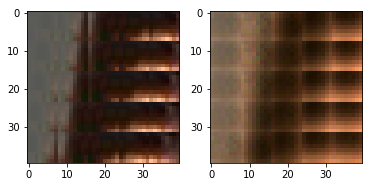

EPO: 9, recon_loss: 0.0084, total_loss: 0.0145, train_psnr:22.7760, validation_psnr:26.7394
EPO: 9, recon_loss: 0.0115, total_loss: 0.0269, train_psnr:22.7433, validation_psnr:27.4391
EPO: 9, recon_loss: 0.0223, total_loss: 0.0348, train_psnr:22.7549, validation_psnr:27.2598
EPO: 9, recon_loss: 0.0454, total_loss: 0.0563, train_psnr:22.7059, validation_psnr:27.0682
EPO: 9, recon_loss: 0.0149, total_loss: 0.0240, train_psnr:22.7310, validation_psnr:26.9241
EPO: 9, recon_loss: 0.0554, total_loss: 0.0645, train_psnr:22.5831, validation_psnr:27.0001
EPO: 9, recon_loss: 0.0032, total_loss: 0.0100, train_psnr:22.6048, validation_psnr:27.1227
EPO: 9, recon_loss: 0.0088, total_loss: 0.0151, train_psnr:22.5478, validation_psnr:26.4654
EPO: 9, recon_loss: 0.0371, total_loss: 0.0437, train_psnr:22.5133, validation_psnr:26.1544
EPO: 9, recon_loss: 0.0099, total_loss: 0.0165, train_psnr:22.5117, validation_psnr:26.3430
#########reconstruction test psnr: 25.3801 


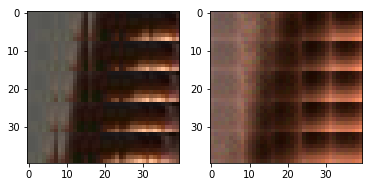

EPO: 9, recon_loss: 0.0127, total_loss: 0.0193, train_psnr:22.4782, validation_psnr:26.6902
EPO: 9, recon_loss: 0.0141, total_loss: 0.0232, train_psnr:22.5036, validation_psnr:27.4964
EPO: 9, recon_loss: 0.0137, total_loss: 0.0259, train_psnr:22.5248, validation_psnr:27.9217
EPO: 9, recon_loss: 0.0309, total_loss: 0.0386, train_psnr:22.5086, validation_psnr:28.0128
EPO: 9, recon_loss: 0.0082, total_loss: 0.0165, train_psnr:22.5208, validation_psnr:28.0048
EPO: 9, recon_loss: 0.0169, total_loss: 0.0238, train_psnr:22.4814, validation_psnr:27.9022
EPO: 9, recon_loss: 0.0128, total_loss: 0.0188, train_psnr:22.6160, validation_psnr:27.9232
EPO: 9, recon_loss: 0.0179, total_loss: 0.0228, train_psnr:22.7712, validation_psnr:28.1048
EPO: 9, recon_loss: 0.0265, total_loss: 0.0373, train_psnr:22.8278, validation_psnr:28.0319
EPO: 9, recon_loss: 0.0094, total_loss: 0.0158, train_psnr:22.9038, validation_psnr:27.8495
#########reconstruction test psnr: 26.6053 


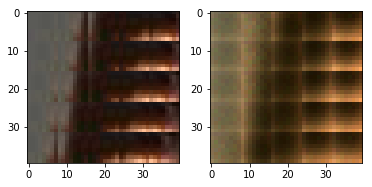

EPO: 9, recon_loss: 0.0118, total_loss: 0.0196, train_psnr:22.9234, validation_psnr:27.6531
EPO: 9, recon_loss: 0.0211, total_loss: 0.0318, train_psnr:22.9070, validation_psnr:27.8001
EPO: 9, recon_loss: 0.0108, total_loss: 0.0220, train_psnr:22.9196, validation_psnr:27.5070
EPO: 9, recon_loss: 0.0307, total_loss: 0.0368, train_psnr:22.8416, validation_psnr:27.3185
EPO: 9, recon_loss: 0.0164, total_loss: 0.0270, train_psnr:22.7565, validation_psnr:27.6884
EPO: 9, recon_loss: 0.0246, total_loss: 0.0326, train_psnr:22.7081, validation_psnr:27.8947
EPO: 9, recon_loss: 0.0212, total_loss: 0.0412, train_psnr:22.6911, validation_psnr:28.1078
EPO: 9, recon_loss: 0.0037, total_loss: 0.0099, train_psnr:22.7579, validation_psnr:27.6597
EPO: 9, recon_loss: 0.0161, total_loss: 0.0216, train_psnr:22.7887, validation_psnr:27.3211
EPO: 9, recon_loss: 0.0084, total_loss: 0.0153, train_psnr:22.8044, validation_psnr:27.8980
#########reconstruction test psnr: 26.6025 


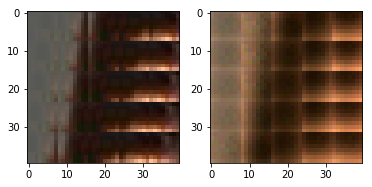

EPO: 9, recon_loss: 0.0094, total_loss: 0.0169, train_psnr:22.7985, validation_psnr:28.0653
EPO: 9, recon_loss: 0.0140, total_loss: 0.0268, train_psnr:22.7998, validation_psnr:27.6491
EPO: 9, recon_loss: 0.0081, total_loss: 0.0170, train_psnr:22.8370, validation_psnr:27.4687
EPO: 9, recon_loss: 0.0297, total_loss: 0.0392, train_psnr:22.7618, validation_psnr:27.7548
EPO: 9, recon_loss: 0.0151, total_loss: 0.0246, train_psnr:22.7392, validation_psnr:27.3488
EPO: 9, recon_loss: 0.0302, total_loss: 0.0382, train_psnr:22.6990, validation_psnr:27.4497
EPO: 9, recon_loss: 0.0170, total_loss: 0.0345, train_psnr:22.6618, validation_psnr:27.6213
EPO: 9, recon_loss: 0.0079, total_loss: 0.0186, train_psnr:22.6183, validation_psnr:27.6836
EPO: 9, recon_loss: 0.0265, total_loss: 0.0361, train_psnr:22.5642, validation_psnr:27.3667
EPO: 9, recon_loss: 0.0106, total_loss: 0.0193, train_psnr:22.5181, validation_psnr:27.7149
#########reconstruction test psnr: 26.4413 


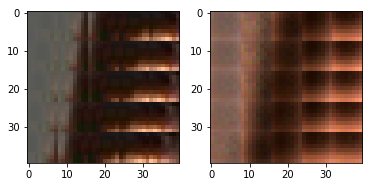

EPO: 9, recon_loss: 0.0197, total_loss: 0.0278, train_psnr:22.4651, validation_psnr:27.6894
EPO: 9, recon_loss: 0.0080, total_loss: 0.0104, train_psnr:22.4493, validation_psnr:27.5923
EPO: 9, recon_loss: 0.0050, total_loss: 0.0080, train_psnr:22.5801, validation_psnr:27.8023
EPO: 9, recon_loss: 0.0084, total_loss: 0.0123, train_psnr:22.6192, validation_psnr:27.9964
EPO: 9, recon_loss: 0.0107, total_loss: 0.0160, train_psnr:22.5214, validation_psnr:27.9426
EPO: 9, recon_loss: 0.0182, total_loss: 0.0244, train_psnr:22.5613, validation_psnr:27.8227
EPO: 9, recon_loss: 0.0255, total_loss: 0.0487, train_psnr:22.5428, validation_psnr:27.9353
EPO: 9, recon_loss: 0.0249, total_loss: 0.0442, train_psnr:22.5804, validation_psnr:28.4290
EPO: 9, recon_loss: 0.0223, total_loss: 0.0424, train_psnr:22.6013, validation_psnr:28.2249
EPO: 9, recon_loss: 0.0269, total_loss: 0.0508, train_psnr:22.5841, validation_psnr:28.5842
#########reconstruction test psnr: 27.1762 


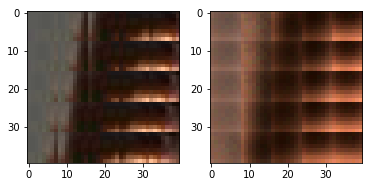

EPO: 9, recon_loss: 0.0246, total_loss: 0.0506, train_psnr:22.5733, validation_psnr:28.4490
EPO: 9, recon_loss: 0.0110, total_loss: 0.0237, train_psnr:22.5646, validation_psnr:27.8498
EPO: 9, recon_loss: 0.0150, total_loss: 0.0249, train_psnr:22.6258, validation_psnr:26.9855
EPO: 9, recon_loss: 0.0396, total_loss: 0.0552, train_psnr:22.7019, validation_psnr:27.5170
EPO: 9, recon_loss: 0.0173, total_loss: 0.0350, train_psnr:22.7065, validation_psnr:28.2584
EPO: 9, recon_loss: 0.0183, total_loss: 0.0310, train_psnr:22.7431, validation_psnr:28.2597
EPO: 9, recon_loss: 0.0192, total_loss: 0.0310, train_psnr:22.7507, validation_psnr:28.0975
EPO: 9, recon_loss: 0.0164, total_loss: 0.0334, train_psnr:22.7489, validation_psnr:28.2843
EPO: 9, recon_loss: 0.0224, total_loss: 0.0363, train_psnr:22.7746, validation_psnr:28.3465
EPO: 9, recon_loss: 0.0208, total_loss: 0.0355, train_psnr:22.7587, validation_psnr:28.5534
#########reconstruction test psnr: 27.1546 


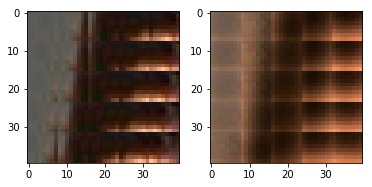

EPO: 9, recon_loss: 0.0132, total_loss: 0.0242, train_psnr:22.7723, validation_psnr:28.2847
EPO: 9, recon_loss: 0.0190, total_loss: 0.0290, train_psnr:22.7522, validation_psnr:28.2187
EPO: 9, recon_loss: 0.0116, total_loss: 0.0218, train_psnr:22.7024, validation_psnr:28.1989
EPO: 9, recon_loss: 0.0189, total_loss: 0.0313, train_psnr:22.6421, validation_psnr:28.3189
EPO: 9, recon_loss: 0.0235, total_loss: 0.0329, train_psnr:22.5706, validation_psnr:28.2819
EPO: 9, recon_loss: 0.0081, total_loss: 0.0182, train_psnr:22.5290, validation_psnr:27.9983
EPO: 9, recon_loss: 0.0185, total_loss: 0.0289, train_psnr:22.4583, validation_psnr:27.9925
EPO: 9, recon_loss: 0.0065, total_loss: 0.0169, train_psnr:22.4822, validation_psnr:27.8227
EPO: 9, recon_loss: 0.0138, total_loss: 0.0274, train_psnr:22.5554, validation_psnr:27.8244
EPO: 9, recon_loss: 0.0350, total_loss: 0.0430, train_psnr:22.5516, validation_psnr:27.5420
#########reconstruction test psnr: 26.3681 


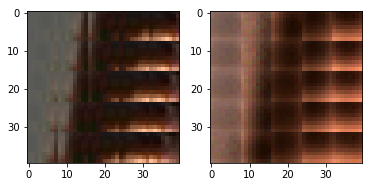

EPO: 9, recon_loss: 0.0144, total_loss: 0.0285, train_psnr:22.5929, validation_psnr:27.9008
EPO: 9, recon_loss: 0.0257, total_loss: 0.0343, train_psnr:22.5563, validation_psnr:27.8025
EPO: 9, recon_loss: 0.0067, total_loss: 0.0184, train_psnr:22.5626, validation_psnr:27.5904
EPO: 9, recon_loss: 0.0143, total_loss: 0.0222, train_psnr:22.5857, validation_psnr:27.3027
EPO: 9, recon_loss: 0.0247, total_loss: 0.0325, train_psnr:22.5979, validation_psnr:27.8203
EPO: 9, recon_loss: 0.0129, total_loss: 0.0182, train_psnr:22.5882, validation_psnr:27.3427
EPO: 9, recon_loss: 0.0168, total_loss: 0.0294, train_psnr:22.5482, validation_psnr:27.6294
EPO: 9, recon_loss: 0.0073, total_loss: 0.0172, train_psnr:22.6600, validation_psnr:28.0210
EPO: 9, recon_loss: 0.0057, total_loss: 0.0158, train_psnr:22.7500, validation_psnr:28.0472
EPO: 9, recon_loss: 0.0194, total_loss: 0.0261, train_psnr:22.7462, validation_psnr:28.0828
#########reconstruction test psnr: 26.7731 


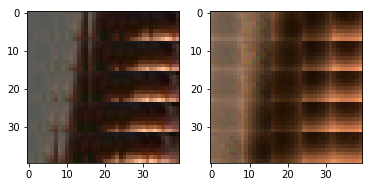

EPO: 9, recon_loss: 0.0077, total_loss: 0.0148, train_psnr:22.8044, validation_psnr:27.8825
EPO: 9, recon_loss: 0.0118, total_loss: 0.0189, train_psnr:22.7906, validation_psnr:27.8956
EPO: 9, recon_loss: 0.0317, total_loss: 0.0501, train_psnr:22.7231, validation_psnr:27.1589
EPO: 9, recon_loss: 0.0257, total_loss: 0.0430, train_psnr:22.6326, validation_psnr:27.1269
EPO: 9, recon_loss: 0.0219, total_loss: 0.0291, train_psnr:22.5071, validation_psnr:26.7723
EPO: 9, recon_loss: 0.0294, total_loss: 0.0408, train_psnr:22.4020, validation_psnr:26.8769
EPO: 9, recon_loss: 0.0150, total_loss: 0.0221, train_psnr:22.3463, validation_psnr:27.2968
EPO: 9, recon_loss: 0.0116, total_loss: 0.0361, train_psnr:22.3068, validation_psnr:27.4976
EPO: 9, recon_loss: 0.0067, total_loss: 0.0227, train_psnr:22.3196, validation_psnr:26.5176
EPO: 9, recon_loss: 0.0280, total_loss: 0.0383, train_psnr:22.4234, validation_psnr:27.2852
#########reconstruction test psnr: 26.1026 


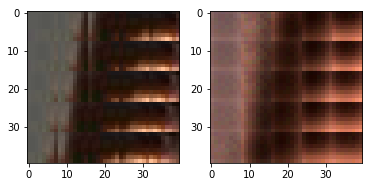

EPO: 9, recon_loss: 0.0127, total_loss: 0.0230, train_psnr:22.4539, validation_psnr:27.8143
EPO: 9, recon_loss: 0.0242, total_loss: 0.0326, train_psnr:22.4934, validation_psnr:27.4513
EPO: 9, recon_loss: 0.0075, total_loss: 0.0114, train_psnr:22.5561, validation_psnr:27.7499
EPO: 9, recon_loss: 0.0030, total_loss: 0.0055, train_psnr:22.6865, validation_psnr:28.0166
EPO: 9, recon_loss: 0.0174, total_loss: 0.0211, train_psnr:22.7263, validation_psnr:27.8379
EPO: 9, recon_loss: 0.0055, total_loss: 0.0089, train_psnr:22.7669, validation_psnr:27.9602
EPO: 9, recon_loss: 0.0082, total_loss: 0.0113, train_psnr:22.8038, validation_psnr:27.8755
EPO: 9, recon_loss: 0.0173, total_loss: 0.0240, train_psnr:22.7824, validation_psnr:27.0411
EPO: 9, recon_loss: 0.0127, total_loss: 0.0202, train_psnr:22.7698, validation_psnr:27.2355
EPO: 9, recon_loss: 0.0230, total_loss: 0.0311, train_psnr:22.7948, validation_psnr:27.1450
#########reconstruction test psnr: 25.9911 


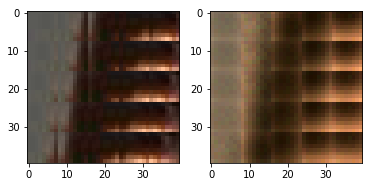

EPO: 9, recon_loss: 0.0087, total_loss: 0.0150, train_psnr:22.7646, validation_psnr:27.0165
EPO: 9, recon_loss: 0.0122, total_loss: 0.0151, train_psnr:22.7941, validation_psnr:27.0327
EPO: 9, recon_loss: 0.0287, total_loss: 0.0463, train_psnr:22.8102, validation_psnr:27.6612
EPO: 9, recon_loss: 0.0181, total_loss: 0.0278, train_psnr:22.7803, validation_psnr:27.5798
EPO: 9, recon_loss: 0.0247, total_loss: 0.0324, train_psnr:22.6892, validation_psnr:27.5381
EPO: 9, recon_loss: 0.0160, total_loss: 0.0223, train_psnr:22.5971, validation_psnr:27.5449
EPO: 9, recon_loss: 0.0220, total_loss: 0.0291, train_psnr:22.5155, validation_psnr:27.4356
EPO: 9, recon_loss: 0.0283, total_loss: 0.0440, train_psnr:22.4612, validation_psnr:27.6814
EPO: 9, recon_loss: 0.0561, total_loss: 0.0773, train_psnr:22.6116, validation_psnr:26.9898
EPO: 9, recon_loss: 0.0182, total_loss: 0.0253, train_psnr:22.6651, validation_psnr:27.6645
#########reconstruction test psnr: 26.4054 


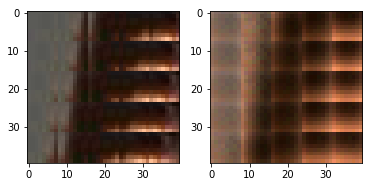

EPO: 9, recon_loss: 0.0145, total_loss: 0.0226, train_psnr:22.1185, validation_psnr:28.5832
EPO: 9, recon_loss: 0.0232, total_loss: 0.0344, train_psnr:21.1482, validation_psnr:28.1528
EPO: 9, recon_loss: 0.0113, total_loss: 0.0206, train_psnr:22.1922, validation_psnr:28.1522
EPO: 9, recon_loss: 0.0045, total_loss: 0.0142, train_psnr:22.7459, validation_psnr:26.3625
EPO: 9, recon_loss: 0.0168, total_loss: 0.0228, train_psnr:22.7276, validation_psnr:26.6494
EPO: 9, recon_loss: 0.0135, total_loss: 0.0223, train_psnr:22.6534, validation_psnr:26.7173
EPO: 9, recon_loss: 0.0181, total_loss: 0.0237, train_psnr:22.6286, validation_psnr:26.6716
EPO: 9, recon_loss: 0.0065, total_loss: 0.0317, train_psnr:22.5085, validation_psnr:28.2504
EPO: 9, recon_loss: 0.0037, total_loss: 0.0136, train_psnr:22.6222, validation_psnr:27.6085
EPO: 9, recon_loss: 0.0118, total_loss: 0.0187, train_psnr:22.6011, validation_psnr:27.3399
#########reconstruction test psnr: 26.1380 


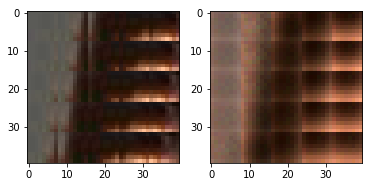

EPO: 9, recon_loss: 0.0090, total_loss: 0.0167, train_psnr:22.6121, validation_psnr:27.5633
EPO: 9, recon_loss: 0.0033, total_loss: 0.0061, train_psnr:22.6232, validation_psnr:27.4971
EPO: 9, recon_loss: 0.0125, total_loss: 0.0202, train_psnr:22.5376, validation_psnr:28.1793
EPO: 9, recon_loss: 0.0139, total_loss: 0.0259, train_psnr:22.7171, validation_psnr:27.8916
EPO: 9, recon_loss: 0.0184, total_loss: 0.0274, train_psnr:22.7411, validation_psnr:27.7389
EPO: 9, recon_loss: 0.0250, total_loss: 0.0359, train_psnr:22.6936, validation_psnr:28.3109
EPO: 9, recon_loss: 0.0210, total_loss: 0.0311, train_psnr:22.7634, validation_psnr:27.7009
EPO: 9, recon_loss: 0.0221, total_loss: 0.0269, train_psnr:22.7729, validation_psnr:27.6391
EPO: 10, recon_loss: 0.0066, total_loss: 0.0100, train_psnr:22.8415, validation_psnr:27.5107
EPO: 10, recon_loss: 0.0081, total_loss: 0.0116, train_psnr:22.8875, validation_psnr:27.4695
#########reconstruction test psnr: 26.2923 


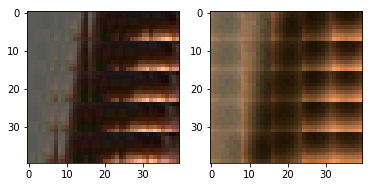

EPO: 10, recon_loss: 0.0194, total_loss: 0.0256, train_psnr:22.8432, validation_psnr:27.6683
EPO: 10, recon_loss: 0.0090, total_loss: 0.0134, train_psnr:22.8395, validation_psnr:27.5434
EPO: 10, recon_loss: 0.0220, total_loss: 0.0256, train_psnr:22.8001, validation_psnr:27.3937
EPO: 10, recon_loss: 0.0047, total_loss: 0.0157, train_psnr:22.7638, validation_psnr:28.4475
EPO: 10, recon_loss: 0.0110, total_loss: 0.0191, train_psnr:22.7424, validation_psnr:28.3259
EPO: 10, recon_loss: 0.0160, total_loss: 0.0223, train_psnr:22.7281, validation_psnr:28.2857
EPO: 10, recon_loss: 0.0190, total_loss: 0.0252, train_psnr:22.7226, validation_psnr:28.0030
EPO: 10, recon_loss: 0.0192, total_loss: 0.0294, train_psnr:22.6568, validation_psnr:28.1418
EPO: 10, recon_loss: 0.0075, total_loss: 0.0175, train_psnr:22.7362, validation_psnr:27.9513
EPO: 10, recon_loss: 0.0079, total_loss: 0.0142, train_psnr:22.7547, validation_psnr:27.8144
#########reconstruction test psnr: 26.5398 


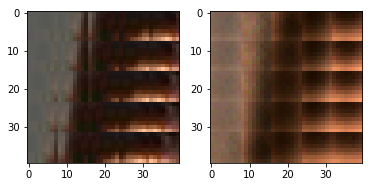

EPO: 10, recon_loss: 0.0102, total_loss: 0.0177, train_psnr:22.7450, validation_psnr:27.9348
EPO: 10, recon_loss: 0.0097, total_loss: 0.0132, train_psnr:22.7758, validation_psnr:28.0172
EPO: 10, recon_loss: 0.0235, total_loss: 0.0305, train_psnr:22.7369, validation_psnr:27.3297
EPO: 10, recon_loss: 0.0116, total_loss: 0.0189, train_psnr:22.6070, validation_psnr:28.3155
EPO: 10, recon_loss: 0.0106, total_loss: 0.0170, train_psnr:22.4309, validation_psnr:28.1586
EPO: 10, recon_loss: 0.0147, total_loss: 0.0228, train_psnr:22.3399, validation_psnr:28.1748
EPO: 10, recon_loss: 0.0118, total_loss: 0.0191, train_psnr:22.2121, validation_psnr:28.0078
EPO: 10, recon_loss: 0.0146, total_loss: 0.0214, train_psnr:22.1363, validation_psnr:28.0662
EPO: 10, recon_loss: 0.0088, total_loss: 0.0136, train_psnr:22.2733, validation_psnr:28.2372
EPO: 10, recon_loss: 0.0075, total_loss: 0.0131, train_psnr:22.4354, validation_psnr:28.2301
#########reconstruction test psnr: 26.8352 


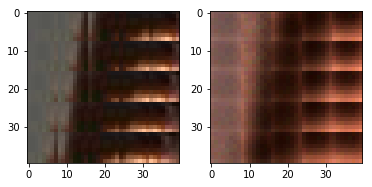

EPO: 10, recon_loss: 0.0287, total_loss: 0.0333, train_psnr:22.4937, validation_psnr:28.0722
EPO: 10, recon_loss: 0.0069, total_loss: 0.0117, train_psnr:22.5589, validation_psnr:28.0874
EPO: 10, recon_loss: 0.0138, total_loss: 0.0166, train_psnr:22.5957, validation_psnr:28.1419
EPO: 10, recon_loss: 0.0245, total_loss: 0.0374, train_psnr:22.6085, validation_psnr:27.6710
EPO: 10, recon_loss: 0.0195, total_loss: 0.0330, train_psnr:22.6004, validation_psnr:27.5155
EPO: 10, recon_loss: 0.0284, total_loss: 0.0401, train_psnr:22.6650, validation_psnr:27.5591
EPO: 10, recon_loss: 0.0345, total_loss: 0.0435, train_psnr:22.6839, validation_psnr:27.4105
EPO: 10, recon_loss: 0.0210, total_loss: 0.0280, train_psnr:22.6711, validation_psnr:27.4420
EPO: 10, recon_loss: 0.0216, total_loss: 0.0377, train_psnr:22.7364, validation_psnr:27.5714
EPO: 10, recon_loss: 0.0093, total_loss: 0.0164, train_psnr:22.8896, validation_psnr:27.1807
#########reconstruction test psnr: 26.0734 


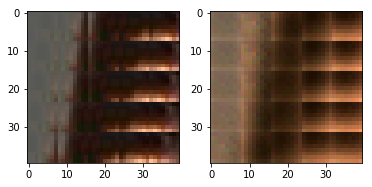

EPO: 10, recon_loss: 0.0242, total_loss: 0.0302, train_psnr:22.9293, validation_psnr:26.9917
EPO: 10, recon_loss: 0.0100, total_loss: 0.0121, train_psnr:22.9756, validation_psnr:27.0482
EPO: 10, recon_loss: 0.0126, total_loss: 0.0189, train_psnr:22.9544, validation_psnr:26.2744
EPO: 10, recon_loss: 0.0041, total_loss: 0.0074, train_psnr:22.9620, validation_psnr:26.6508
EPO: 10, recon_loss: 0.0040, total_loss: 0.0084, train_psnr:22.9391, validation_psnr:27.3307
EPO: 10, recon_loss: 0.0122, total_loss: 0.0197, train_psnr:22.8908, validation_psnr:27.4682
EPO: 10, recon_loss: 0.0077, total_loss: 0.0158, train_psnr:22.8845, validation_psnr:27.7685
EPO: 10, recon_loss: 0.0101, total_loss: 0.0213, train_psnr:22.8411, validation_psnr:27.6785
EPO: 10, recon_loss: 0.0075, total_loss: 0.0218, train_psnr:22.8512, validation_psnr:27.9582
EPO: 10, recon_loss: 0.0061, total_loss: 0.0173, train_psnr:22.9024, validation_psnr:27.9829
#########reconstruction test psnr: 26.6758 


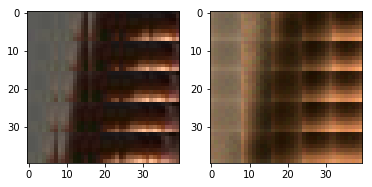

EPO: 10, recon_loss: 0.0187, total_loss: 0.0273, train_psnr:22.9256, validation_psnr:27.8593
EPO: 10, recon_loss: 0.0052, total_loss: 0.0122, train_psnr:22.9335, validation_psnr:27.8645
EPO: 10, recon_loss: 0.0121, total_loss: 0.0203, train_psnr:22.9729, validation_psnr:27.9299
EPO: 10, recon_loss: 0.0150, total_loss: 0.0338, train_psnr:22.8774, validation_psnr:28.7235
EPO: 10, recon_loss: 0.0068, total_loss: 0.0156, train_psnr:23.0019, validation_psnr:28.3964
EPO: 10, recon_loss: 0.0346, total_loss: 0.0413, train_psnr:22.9927, validation_psnr:28.1402
EPO: 10, recon_loss: 0.0121, total_loss: 0.0178, train_psnr:22.9847, validation_psnr:28.1294
EPO: 10, recon_loss: 0.0118, total_loss: 0.0160, train_psnr:22.9797, validation_psnr:28.1387
EPO: 10, recon_loss: 0.0255, total_loss: 0.0339, train_psnr:22.9624, validation_psnr:27.8281
EPO: 10, recon_loss: 0.0112, total_loss: 0.0171, train_psnr:23.0304, validation_psnr:27.8450
#########reconstruction test psnr: 26.6072 


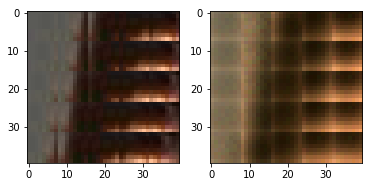

EPO: 10, recon_loss: 0.0213, total_loss: 0.0299, train_psnr:22.9677, validation_psnr:28.0470
EPO: 10, recon_loss: 0.0163, total_loss: 0.0227, train_psnr:22.9933, validation_psnr:28.0219
EPO: 10, recon_loss: 0.0228, total_loss: 0.0295, train_psnr:22.9299, validation_psnr:27.9120
EPO: 10, recon_loss: 0.0316, total_loss: 0.0488, train_psnr:22.8812, validation_psnr:28.2079
EPO: 10, recon_loss: 0.0249, total_loss: 0.0400, train_psnr:22.7931, validation_psnr:28.4051
EPO: 10, recon_loss: 0.0311, total_loss: 0.0456, train_psnr:22.7350, validation_psnr:28.4655
EPO: 10, recon_loss: 0.0263, total_loss: 0.0403, train_psnr:22.7452, validation_psnr:28.5308
EPO: 10, recon_loss: 0.0164, total_loss: 0.0296, train_psnr:22.6338, validation_psnr:28.5702
EPO: 10, recon_loss: 0.0193, total_loss: 0.0317, train_psnr:22.6127, validation_psnr:27.6566
EPO: 10, recon_loss: 0.0101, total_loss: 0.0186, train_psnr:22.8078, validation_psnr:27.3060
#########reconstruction test psnr: 26.1927 


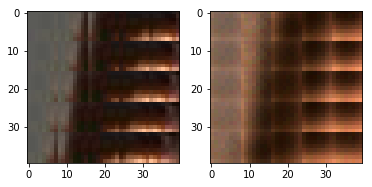

EPO: 10, recon_loss: 0.0226, total_loss: 0.0329, train_psnr:22.8135, validation_psnr:27.7108
EPO: 10, recon_loss: 0.0211, total_loss: 0.0286, train_psnr:22.8221, validation_psnr:27.4952
EPO: 10, recon_loss: 0.0216, total_loss: 0.0351, train_psnr:22.8281, validation_psnr:27.6605
EPO: 10, recon_loss: 0.0309, total_loss: 0.0419, train_psnr:22.7602, validation_psnr:27.7021
EPO: 10, recon_loss: 0.0060, total_loss: 0.0170, train_psnr:22.7849, validation_psnr:27.3572
EPO: 10, recon_loss: 0.0257, total_loss: 0.0353, train_psnr:22.7723, validation_psnr:27.1805
EPO: 10, recon_loss: 0.0239, total_loss: 0.0351, train_psnr:22.7338, validation_psnr:27.1068
EPO: 10, recon_loss: 0.0093, total_loss: 0.0206, train_psnr:22.7862, validation_psnr:27.6175
EPO: 10, recon_loss: 0.0283, total_loss: 0.0389, train_psnr:22.7519, validation_psnr:27.5441
EPO: 10, recon_loss: 0.0134, total_loss: 0.0356, train_psnr:22.8100, validation_psnr:27.9410
#########reconstruction test psnr: 26.6866 


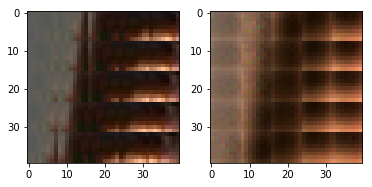

EPO: 10, recon_loss: 0.0206, total_loss: 0.0393, train_psnr:22.8124, validation_psnr:28.2181
EPO: 10, recon_loss: 0.0421, total_loss: 0.0662, train_psnr:22.8500, validation_psnr:27.9768
EPO: 10, recon_loss: 0.0127, total_loss: 0.0336, train_psnr:22.8700, validation_psnr:27.9037
EPO: 10, recon_loss: 0.0233, total_loss: 0.0416, train_psnr:22.8559, validation_psnr:27.9985
EPO: 10, recon_loss: 0.0190, total_loss: 0.0370, train_psnr:22.7404, validation_psnr:28.3928
EPO: 10, recon_loss: 0.0238, total_loss: 0.0456, train_psnr:22.7378, validation_psnr:28.2732
EPO: 10, recon_loss: 0.0421, total_loss: 0.0618, train_psnr:22.7308, validation_psnr:28.0554
EPO: 10, recon_loss: 0.0387, total_loss: 0.0611, train_psnr:22.7135, validation_psnr:28.0341
EPO: 10, recon_loss: 0.0278, total_loss: 0.0479, train_psnr:22.6617, validation_psnr:27.9928
EPO: 10, recon_loss: 0.0088, total_loss: 0.0288, train_psnr:22.7700, validation_psnr:27.2778
#########reconstruction test psnr: 26.1956 


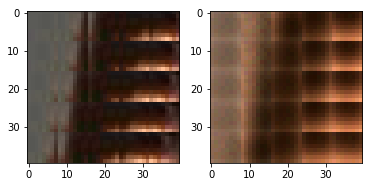

EPO: 10, recon_loss: 0.0381, total_loss: 0.0572, train_psnr:22.8062, validation_psnr:26.8244
EPO: 10, recon_loss: 0.0531, total_loss: 0.0655, train_psnr:22.8274, validation_psnr:27.3554
EPO: 10, recon_loss: 0.0309, total_loss: 0.0369, train_psnr:22.8395, validation_psnr:26.6049
EPO: 10, recon_loss: 0.0133, total_loss: 0.0186, train_psnr:22.8020, validation_psnr:26.1283
EPO: 10, recon_loss: 0.0082, total_loss: 0.0163, train_psnr:22.8638, validation_psnr:27.1497
EPO: 10, recon_loss: 0.0101, total_loss: 0.0209, train_psnr:22.9159, validation_psnr:27.6862
EPO: 10, recon_loss: 0.0261, total_loss: 0.0345, train_psnr:22.8317, validation_psnr:28.0467
EPO: 10, recon_loss: 0.0104, total_loss: 0.0237, train_psnr:22.8691, validation_psnr:28.2540
EPO: 10, recon_loss: 0.0262, total_loss: 0.0348, train_psnr:22.8418, validation_psnr:28.2577
EPO: 10, recon_loss: 0.0029, total_loss: 0.0074, train_psnr:22.7707, validation_psnr:28.4405
#########reconstruction test psnr: 27.0379 


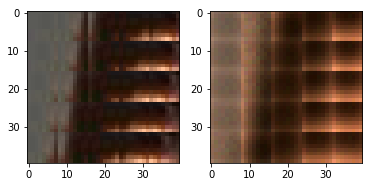

EPO: 10, recon_loss: 0.0020, total_loss: 0.0052, train_psnr:22.7571, validation_psnr:28.4527
EPO: 10, recon_loss: 0.0083, total_loss: 0.0120, train_psnr:22.8251, validation_psnr:28.2329
EPO: 10, recon_loss: 0.0036, total_loss: 0.0056, train_psnr:22.7613, validation_psnr:28.1902
EPO: 10, recon_loss: 0.0079, total_loss: 0.0116, train_psnr:22.7261, validation_psnr:27.9170
EPO: 10, recon_loss: 0.0135, total_loss: 0.0272, train_psnr:22.7339, validation_psnr:27.7532
EPO: 10, recon_loss: 0.0096, total_loss: 0.0154, train_psnr:22.6425, validation_psnr:27.2210
EPO: 10, recon_loss: 0.0255, total_loss: 0.0312, train_psnr:22.5338, validation_psnr:26.9186
EPO: 10, recon_loss: 0.0105, total_loss: 0.0138, train_psnr:22.4008, validation_psnr:26.7530
EPO: 10, recon_loss: 0.0105, total_loss: 0.0143, train_psnr:22.3020, validation_psnr:26.8912
EPO: 10, recon_loss: 0.0190, total_loss: 0.0351, train_psnr:22.4029, validation_psnr:27.0866
#########reconstruction test psnr: 25.9457 


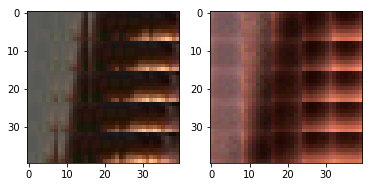

EPO: 10, recon_loss: 0.0261, total_loss: 0.0389, train_psnr:22.5766, validation_psnr:27.0045
EPO: 10, recon_loss: 0.0280, total_loss: 0.0408, train_psnr:22.6378, validation_psnr:27.0304
EPO: 10, recon_loss: 0.0326, total_loss: 0.0461, train_psnr:22.7718, validation_psnr:27.4067
EPO: 10, recon_loss: 0.0130, total_loss: 0.0196, train_psnr:22.7968, validation_psnr:27.2075
EPO: 10, recon_loss: 0.0215, total_loss: 0.0286, train_psnr:22.9019, validation_psnr:27.0199
EPO: 10, recon_loss: 0.0114, total_loss: 0.0157, train_psnr:22.9878, validation_psnr:27.1292
EPO: 10, recon_loss: 0.0172, total_loss: 0.0236, train_psnr:23.0319, validation_psnr:27.1010
EPO: 10, recon_loss: 0.0091, total_loss: 0.0145, train_psnr:23.0478, validation_psnr:27.2791
EPO: 10, recon_loss: 0.0100, total_loss: 0.0149, train_psnr:23.0835, validation_psnr:27.3267
EPO: 10, recon_loss: 0.0122, total_loss: 0.0329, train_psnr:23.0227, validation_psnr:28.2192
#########reconstruction test psnr: 26.8547 


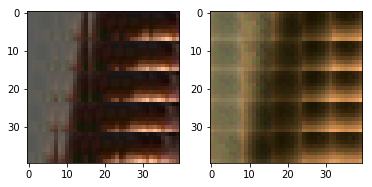

EPO: 10, recon_loss: 0.0045, total_loss: 0.0128, train_psnr:23.0792, validation_psnr:27.4834
EPO: 10, recon_loss: 0.0264, total_loss: 0.0354, train_psnr:23.0426, validation_psnr:27.3583
EPO: 10, recon_loss: 0.0134, total_loss: 0.0198, train_psnr:23.0310, validation_psnr:27.2983
EPO: 10, recon_loss: 0.0158, total_loss: 0.0221, train_psnr:23.0214, validation_psnr:27.4191
EPO: 10, recon_loss: 0.0061, total_loss: 0.0098, train_psnr:23.0112, validation_psnr:27.5926
EPO: 10, recon_loss: 0.0045, total_loss: 0.0091, train_psnr:23.0764, validation_psnr:27.3484
EPO: 10, recon_loss: 0.0100, total_loss: 0.0145, train_psnr:23.0833, validation_psnr:27.3089
EPO: 10, recon_loss: 0.0092, total_loss: 0.0143, train_psnr:23.0871, validation_psnr:27.2435
EPO: 10, recon_loss: 0.0072, total_loss: 0.0110, train_psnr:23.0918, validation_psnr:27.0853
EPO: 10, recon_loss: 0.0187, total_loss: 0.0269, train_psnr:23.0627, validation_psnr:27.5136
#########reconstruction test psnr: 26.3347 


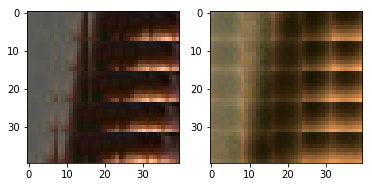

EPO: 10, recon_loss: 0.0084, total_loss: 0.0148, train_psnr:23.0712, validation_psnr:27.6356
EPO: 10, recon_loss: 0.0195, total_loss: 0.0267, train_psnr:23.0434, validation_psnr:27.5326
EPO: 10, recon_loss: 0.0130, total_loss: 0.0212, train_psnr:23.0029, validation_psnr:27.7250
EPO: 10, recon_loss: 0.0091, total_loss: 0.0170, train_psnr:22.9637, validation_psnr:27.3631
EPO: 10, recon_loss: 0.0118, total_loss: 0.0309, train_psnr:22.8816, validation_psnr:28.0947
EPO: 10, recon_loss: 0.0127, total_loss: 0.0263, train_psnr:22.9096, validation_psnr:27.3981
EPO: 10, recon_loss: 0.0370, total_loss: 0.0471, train_psnr:22.8987, validation_psnr:27.3303
EPO: 10, recon_loss: 0.0258, total_loss: 0.0364, train_psnr:22.8630, validation_psnr:27.5178
EPO: 10, recon_loss: 0.0150, total_loss: 0.0236, train_psnr:22.8612, validation_psnr:27.2970
EPO: 10, recon_loss: 0.0428, total_loss: 0.0540, train_psnr:22.7501, validation_psnr:27.7002
#########reconstruction test psnr: 26.4897 


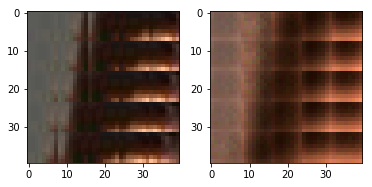

EPO: 10, recon_loss: 0.0032, total_loss: 0.0091, train_psnr:22.7246, validation_psnr:27.1950
EPO: 10, recon_loss: 0.0166, total_loss: 0.0246, train_psnr:22.6983, validation_psnr:26.5615
EPO: 10, recon_loss: 0.0254, total_loss: 0.0334, train_psnr:22.6497, validation_psnr:26.4643
EPO: 10, recon_loss: 0.0125, total_loss: 0.0196, train_psnr:22.6471, validation_psnr:26.6556
EPO: 10, recon_loss: 0.0098, total_loss: 0.0180, train_psnr:22.6160, validation_psnr:27.0465
EPO: 10, recon_loss: 0.0161, total_loss: 0.0259, train_psnr:22.6537, validation_psnr:27.9311
EPO: 10, recon_loss: 0.0172, total_loss: 0.0287, train_psnr:22.6683, validation_psnr:28.3121
EPO: 10, recon_loss: 0.0236, total_loss: 0.0339, train_psnr:22.6544, validation_psnr:28.2283
EPO: 10, recon_loss: 0.0062, total_loss: 0.0130, train_psnr:22.6625, validation_psnr:28.2262
EPO: 10, recon_loss: 0.0226, total_loss: 0.0286, train_psnr:22.6170, validation_psnr:28.1072
#########reconstruction test psnr: 26.7840 


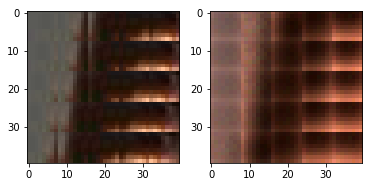

EPO: 10, recon_loss: 0.0104, total_loss: 0.0152, train_psnr:22.8022, validation_psnr:28.1644
EPO: 10, recon_loss: 0.0228, total_loss: 0.0281, train_psnr:22.8942, validation_psnr:28.4601
EPO: 10, recon_loss: 0.0226, total_loss: 0.0318, train_psnr:23.0248, validation_psnr:28.0674
EPO: 10, recon_loss: 0.0111, total_loss: 0.0177, train_psnr:23.0568, validation_psnr:28.0654
EPO: 10, recon_loss: 0.0119, total_loss: 0.0185, train_psnr:23.0669, validation_psnr:27.8883
EPO: 10, recon_loss: 0.0189, total_loss: 0.0289, train_psnr:23.0813, validation_psnr:27.9205
EPO: 10, recon_loss: 0.0111, total_loss: 0.0205, train_psnr:23.0610, validation_psnr:27.7322
EPO: 10, recon_loss: 0.0333, total_loss: 0.0386, train_psnr:22.9399, validation_psnr:27.9194
EPO: 10, recon_loss: 0.0148, total_loss: 0.0257, train_psnr:22.9031, validation_psnr:27.8535
EPO: 10, recon_loss: 0.0218, total_loss: 0.0298, train_psnr:22.8433, validation_psnr:28.1116
#########reconstruction test psnr: 26.7964 


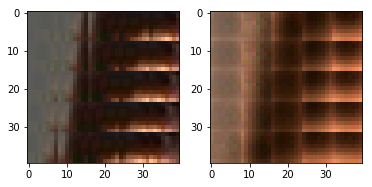

EPO: 10, recon_loss: 0.0178, total_loss: 0.0306, train_psnr:22.8613, validation_psnr:28.3416
EPO: 10, recon_loss: 0.0038, total_loss: 0.0095, train_psnr:22.9171, validation_psnr:27.9267
EPO: 10, recon_loss: 0.0169, total_loss: 0.0225, train_psnr:22.9487, validation_psnr:27.9045
EPO: 10, recon_loss: 0.0109, total_loss: 0.0180, train_psnr:22.9647, validation_psnr:28.0926
EPO: 10, recon_loss: 0.0123, total_loss: 0.0200, train_psnr:22.9534, validation_psnr:28.2580
EPO: 10, recon_loss: 0.0149, total_loss: 0.0269, train_psnr:22.9638, validation_psnr:27.9543
EPO: 10, recon_loss: 0.0147, total_loss: 0.0231, train_psnr:22.9817, validation_psnr:27.6576
EPO: 10, recon_loss: 0.0350, total_loss: 0.0444, train_psnr:22.9140, validation_psnr:27.4473
EPO: 10, recon_loss: 0.0129, total_loss: 0.0224, train_psnr:22.8894, validation_psnr:27.5936
EPO: 10, recon_loss: 0.0303, total_loss: 0.0394, train_psnr:22.8399, validation_psnr:27.5256
#########reconstruction test psnr: 26.3560 


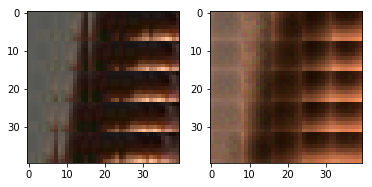

EPO: 10, recon_loss: 0.0157, total_loss: 0.0292, train_psnr:22.8068, validation_psnr:27.8462
EPO: 10, recon_loss: 0.0063, total_loss: 0.0144, train_psnr:22.7571, validation_psnr:27.8302
EPO: 10, recon_loss: 0.0291, total_loss: 0.0396, train_psnr:22.7037, validation_psnr:27.6801
EPO: 10, recon_loss: 0.0093, total_loss: 0.0177, train_psnr:22.6531, validation_psnr:27.8428
EPO: 10, recon_loss: 0.0212, total_loss: 0.0295, train_psnr:22.5893, validation_psnr:27.9638
EPO: 10, recon_loss: 0.0068, total_loss: 0.0087, train_psnr:22.6236, validation_psnr:27.8217
EPO: 10, recon_loss: 0.0052, total_loss: 0.0083, train_psnr:22.7447, validation_psnr:28.0381
EPO: 10, recon_loss: 0.0131, total_loss: 0.0182, train_psnr:22.7641, validation_psnr:28.0684
EPO: 10, recon_loss: 0.0100, total_loss: 0.0162, train_psnr:22.7054, validation_psnr:27.9436
EPO: 10, recon_loss: 0.0146, total_loss: 0.0192, train_psnr:22.6846, validation_psnr:28.1335
#########reconstruction test psnr: 26.7458 


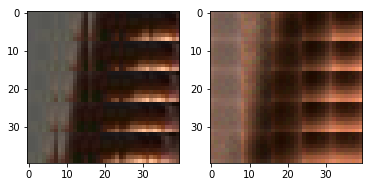

EPO: 10, recon_loss: 0.0263, total_loss: 0.0475, train_psnr:22.6993, validation_psnr:28.2482
EPO: 10, recon_loss: 0.0195, total_loss: 0.0388, train_psnr:22.7306, validation_psnr:28.6549
EPO: 10, recon_loss: 0.0242, total_loss: 0.0492, train_psnr:22.7166, validation_psnr:28.4808
EPO: 10, recon_loss: 0.0207, total_loss: 0.0418, train_psnr:22.7454, validation_psnr:28.7256
EPO: 10, recon_loss: 0.0246, total_loss: 0.0496, train_psnr:22.7068, validation_psnr:28.5823
EPO: 10, recon_loss: 0.0084, total_loss: 0.0203, train_psnr:22.7680, validation_psnr:28.0872
EPO: 10, recon_loss: 0.0130, total_loss: 0.0217, train_psnr:22.7697, validation_psnr:27.0224
EPO: 10, recon_loss: 0.0246, total_loss: 0.0445, train_psnr:22.8431, validation_psnr:27.9000
EPO: 10, recon_loss: 0.0158, total_loss: 0.0309, train_psnr:22.8510, validation_psnr:28.4433
EPO: 10, recon_loss: 0.0128, total_loss: 0.0235, train_psnr:22.8878, validation_psnr:28.4232
#########reconstruction test psnr: 27.0105 


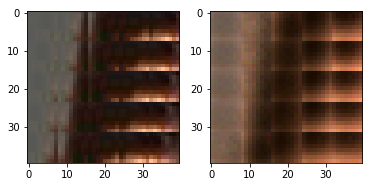

EPO: 10, recon_loss: 0.0097, total_loss: 0.0309, train_psnr:22.8957, validation_psnr:28.2472
EPO: 10, recon_loss: 0.0131, total_loss: 0.0287, train_psnr:22.9153, validation_psnr:28.4623
EPO: 10, recon_loss: 0.0257, total_loss: 0.0401, train_psnr:22.9285, validation_psnr:28.3934
EPO: 10, recon_loss: 0.0113, total_loss: 0.0225, train_psnr:22.9194, validation_psnr:28.6534
EPO: 10, recon_loss: 0.0100, total_loss: 0.0206, train_psnr:22.9226, validation_psnr:28.4844
EPO: 10, recon_loss: 0.0193, total_loss: 0.0290, train_psnr:22.8925, validation_psnr:28.2946
EPO: 10, recon_loss: 0.0085, total_loss: 0.0190, train_psnr:22.8364, validation_psnr:28.3556
EPO: 10, recon_loss: 0.0290, total_loss: 0.0391, train_psnr:22.7833, validation_psnr:28.4342
EPO: 10, recon_loss: 0.0123, total_loss: 0.0216, train_psnr:22.7093, validation_psnr:28.3967
EPO: 10, recon_loss: 0.0080, total_loss: 0.0179, train_psnr:22.6639, validation_psnr:28.2793
#########reconstruction test psnr: 26.9804 


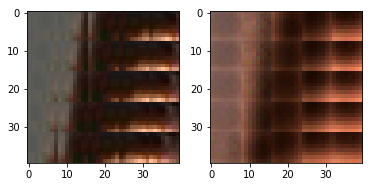

EPO: 10, recon_loss: 0.0115, total_loss: 0.0186, train_psnr:22.6177, validation_psnr:27.7171
EPO: 10, recon_loss: 0.0066, total_loss: 0.0160, train_psnr:22.6387, validation_psnr:27.9868
EPO: 10, recon_loss: 0.0266, total_loss: 0.0401, train_psnr:22.7090, validation_psnr:28.0765
EPO: 10, recon_loss: 0.0238, total_loss: 0.0355, train_psnr:22.6999, validation_psnr:27.7950
EPO: 10, recon_loss: 0.0153, total_loss: 0.0286, train_psnr:22.7322, validation_psnr:28.2394
EPO: 10, recon_loss: 0.0262, total_loss: 0.0363, train_psnr:22.6806, validation_psnr:28.3081
EPO: 10, recon_loss: 0.0055, total_loss: 0.0143, train_psnr:22.7147, validation_psnr:27.8883
EPO: 10, recon_loss: 0.0285, total_loss: 0.0395, train_psnr:22.7421, validation_psnr:27.5299
EPO: 10, recon_loss: 0.0219, total_loss: 0.0282, train_psnr:22.7479, validation_psnr:27.8235
EPO: 10, recon_loss: 0.0193, total_loss: 0.0274, train_psnr:22.7314, validation_psnr:27.5677
#########reconstruction test psnr: 26.3640 


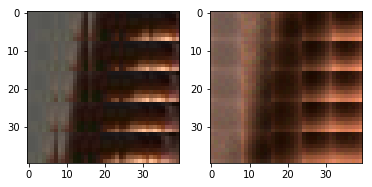

EPO: 10, recon_loss: 0.0160, total_loss: 0.0256, train_psnr:22.7114, validation_psnr:27.7721
EPO: 10, recon_loss: 0.0060, total_loss: 0.0156, train_psnr:22.8423, validation_psnr:28.2253
EPO: 10, recon_loss: 0.0167, total_loss: 0.0278, train_psnr:22.9248, validation_psnr:28.0802
EPO: 10, recon_loss: 0.0107, total_loss: 0.0188, train_psnr:22.9056, validation_psnr:28.2149
EPO: 10, recon_loss: 0.0095, total_loss: 0.0160, train_psnr:22.9594, validation_psnr:27.9763
EPO: 10, recon_loss: 0.0101, total_loss: 0.0159, train_psnr:22.9549, validation_psnr:28.0723
EPO: 10, recon_loss: 0.0313, total_loss: 0.0510, train_psnr:22.8388, validation_psnr:27.6981
EPO: 10, recon_loss: 0.0243, total_loss: 0.0371, train_psnr:22.7681, validation_psnr:27.1391
EPO: 10, recon_loss: 0.0222, total_loss: 0.0304, train_psnr:22.6094, validation_psnr:27.1873
EPO: 10, recon_loss: 0.0274, total_loss: 0.0382, train_psnr:22.5358, validation_psnr:27.2926
#########reconstruction test psnr: 26.1135 


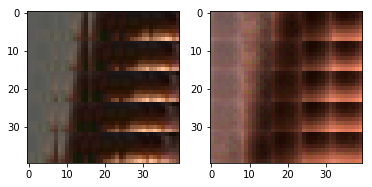

EPO: 10, recon_loss: 0.0254, total_loss: 0.0302, train_psnr:22.4385, validation_psnr:27.7149
EPO: 10, recon_loss: 0.0096, total_loss: 0.0319, train_psnr:22.4643, validation_psnr:27.6045
EPO: 10, recon_loss: 0.0070, total_loss: 0.0210, train_psnr:22.4665, validation_psnr:26.8161
EPO: 10, recon_loss: 0.0273, total_loss: 0.0379, train_psnr:22.5763, validation_psnr:27.7230
EPO: 10, recon_loss: 0.0126, total_loss: 0.0222, train_psnr:22.6161, validation_psnr:28.0763
EPO: 10, recon_loss: 0.0261, total_loss: 0.0345, train_psnr:22.6552, validation_psnr:27.5799
EPO: 10, recon_loss: 0.0053, total_loss: 0.0084, train_psnr:22.7421, validation_psnr:27.9670
EPO: 10, recon_loss: 0.0035, total_loss: 0.0058, train_psnr:22.8594, validation_psnr:28.2251
EPO: 10, recon_loss: 0.0180, total_loss: 0.0219, train_psnr:22.8965, validation_psnr:27.9539
EPO: 10, recon_loss: 0.0046, total_loss: 0.0080, train_psnr:22.9367, validation_psnr:28.2063
#########reconstruction test psnr: 26.8570 


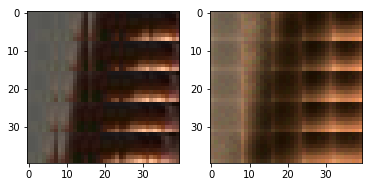

EPO: 10, recon_loss: 0.0092, total_loss: 0.0134, train_psnr:22.9675, validation_psnr:27.9589
EPO: 10, recon_loss: 0.0181, total_loss: 0.0261, train_psnr:22.9408, validation_psnr:27.2740
EPO: 10, recon_loss: 0.0154, total_loss: 0.0237, train_psnr:22.9373, validation_psnr:27.4636
EPO: 10, recon_loss: 0.0190, total_loss: 0.0260, train_psnr:22.9161, validation_psnr:27.4582
EPO: 10, recon_loss: 0.0093, total_loss: 0.0152, train_psnr:22.9504, validation_psnr:27.3178
EPO: 10, recon_loss: 0.0136, total_loss: 0.0182, train_psnr:22.9656, validation_psnr:27.1100
EPO: 10, recon_loss: 0.0208, total_loss: 0.0316, train_psnr:22.9849, validation_psnr:27.8760
EPO: 10, recon_loss: 0.0177, total_loss: 0.0278, train_psnr:22.9132, validation_psnr:27.8283
EPO: 10, recon_loss: 0.0265, total_loss: 0.0315, train_psnr:22.8129, validation_psnr:27.6768
EPO: 10, recon_loss: 0.0176, total_loss: 0.0243, train_psnr:22.7359, validation_psnr:27.7285
#########reconstruction test psnr: 26.4897 


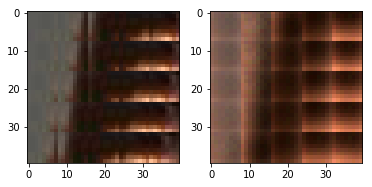

EPO: 10, recon_loss: 0.0179, total_loss: 0.0238, train_psnr:22.6404, validation_psnr:27.7836
EPO: 10, recon_loss: 0.0217, total_loss: 0.0398, train_psnr:22.6467, validation_psnr:27.8617
EPO: 10, recon_loss: 0.0508, total_loss: 0.0662, train_psnr:22.7506, validation_psnr:27.5097
EPO: 10, recon_loss: 0.0210, total_loss: 0.0290, train_psnr:22.7787, validation_psnr:27.9974
EPO: 10, recon_loss: 0.0343, total_loss: 0.0443, train_psnr:20.2529, validation_psnr:27.7043
EPO: 10, recon_loss: 0.0230, total_loss: 0.0333, train_psnr:20.7153, validation_psnr:27.8901
EPO: 10, recon_loss: 0.0121, total_loss: 0.0199, train_psnr:22.8403, validation_psnr:27.0694
EPO: 10, recon_loss: 0.0046, total_loss: 0.0131, train_psnr:22.8883, validation_psnr:26.6132
EPO: 10, recon_loss: 0.0180, total_loss: 0.0226, train_psnr:22.8669, validation_psnr:26.8521
EPO: 10, recon_loss: 0.0093, total_loss: 0.0184, train_psnr:22.8104, validation_psnr:26.9030
#########reconstruction test psnr: 25.8214 


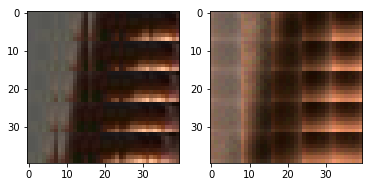

EPO: 10, recon_loss: 0.0133, total_loss: 0.0180, train_psnr:22.7653, validation_psnr:27.0843
EPO: 10, recon_loss: 0.0089, total_loss: 0.0306, train_psnr:22.7135, validation_psnr:28.2465
EPO: 10, recon_loss: 0.0033, total_loss: 0.0128, train_psnr:22.7733, validation_psnr:27.8499
EPO: 10, recon_loss: 0.0132, total_loss: 0.0219, train_psnr:22.7735, validation_psnr:27.7729
EPO: 10, recon_loss: 0.0048, total_loss: 0.0092, train_psnr:22.7715, validation_psnr:27.6557
EPO: 10, recon_loss: 0.0034, total_loss: 0.0062, train_psnr:22.7790, validation_psnr:27.6747
EPO: 10, recon_loss: 0.0146, total_loss: 0.0268, train_psnr:22.7562, validation_psnr:28.3476
EPO: 10, recon_loss: 0.0140, total_loss: 0.0244, train_psnr:22.8679, validation_psnr:28.1099
EPO: 10, recon_loss: 0.0169, total_loss: 0.0274, train_psnr:22.8635, validation_psnr:28.0484
EPO: 10, recon_loss: 0.0183, total_loss: 0.0281, train_psnr:22.8843, validation_psnr:28.3700
#########reconstruction test psnr: 26.9904 


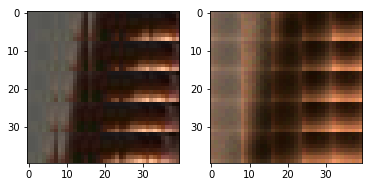

EPO: 10, recon_loss: 0.0188, total_loss: 0.0271, train_psnr:22.8896, validation_psnr:28.0404
EPO: 11, recon_loss: 0.0102, total_loss: 0.0172, train_psnr:22.9524, validation_psnr:27.8355
EPO: 11, recon_loss: 0.0061, total_loss: 0.0093, train_psnr:23.0089, validation_psnr:27.6683
EPO: 11, recon_loss: 0.0143, total_loss: 0.0180, train_psnr:23.0462, validation_psnr:27.7213
EPO: 11, recon_loss: 0.0155, total_loss: 0.0202, train_psnr:23.0149, validation_psnr:27.7949
EPO: 11, recon_loss: 0.0078, total_loss: 0.0116, train_psnr:22.9958, validation_psnr:27.7561
EPO: 11, recon_loss: 0.0085, total_loss: 0.0278, train_psnr:22.9220, validation_psnr:28.5066
EPO: 11, recon_loss: 0.0039, total_loss: 0.0129, train_psnr:22.9210, validation_psnr:28.5995
EPO: 11, recon_loss: 0.0117, total_loss: 0.0196, train_psnr:22.9147, validation_psnr:28.5472
EPO: 11, recon_loss: 0.0157, total_loss: 0.0218, train_psnr:22.9005, validation_psnr:28.2778
#########reconstruction test psnr: 26.9857 


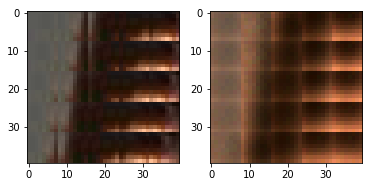

EPO: 11, recon_loss: 0.0133, total_loss: 0.0203, train_psnr:22.8751, validation_psnr:28.2763
EPO: 11, recon_loss: 0.0133, total_loss: 0.0251, train_psnr:22.8602, validation_psnr:27.9018
EPO: 11, recon_loss: 0.0071, total_loss: 0.0157, train_psnr:22.8919, validation_psnr:28.1463
EPO: 11, recon_loss: 0.0108, total_loss: 0.0206, train_psnr:22.9060, validation_psnr:27.8269
EPO: 11, recon_loss: 0.0081, total_loss: 0.0137, train_psnr:22.8966, validation_psnr:28.1021
EPO: 11, recon_loss: 0.0131, total_loss: 0.0173, train_psnr:22.9209, validation_psnr:27.8698
EPO: 11, recon_loss: 0.0278, total_loss: 0.0351, train_psnr:22.8369, validation_psnr:27.3214
EPO: 11, recon_loss: 0.0107, total_loss: 0.0170, train_psnr:22.7261, validation_psnr:28.5000
EPO: 11, recon_loss: 0.0128, total_loss: 0.0216, train_psnr:22.5524, validation_psnr:28.3078
EPO: 11, recon_loss: 0.0146, total_loss: 0.0223, train_psnr:22.4569, validation_psnr:28.5512
#########reconstruction test psnr: 27.1321 


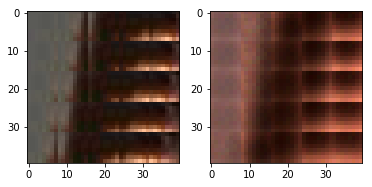

EPO: 11, recon_loss: 0.0109, total_loss: 0.0170, train_psnr:22.3269, validation_psnr:28.1068
EPO: 11, recon_loss: 0.0151, total_loss: 0.0217, train_psnr:22.2743, validation_psnr:28.2968
EPO: 11, recon_loss: 0.0090, total_loss: 0.0137, train_psnr:22.4472, validation_psnr:28.4315
EPO: 11, recon_loss: 0.0123, total_loss: 0.0174, train_psnr:22.6035, validation_psnr:28.4265
EPO: 11, recon_loss: 0.0243, total_loss: 0.0293, train_psnr:22.6465, validation_psnr:28.2974
EPO: 11, recon_loss: 0.0065, total_loss: 0.0116, train_psnr:22.7310, validation_psnr:28.2493
EPO: 11, recon_loss: 0.0153, total_loss: 0.0182, train_psnr:22.7630, validation_psnr:28.2645
EPO: 11, recon_loss: 0.0274, total_loss: 0.0431, train_psnr:22.7418, validation_psnr:27.6151
EPO: 11, recon_loss: 0.0138, total_loss: 0.0246, train_psnr:22.7661, validation_psnr:27.8739
EPO: 11, recon_loss: 0.0258, total_loss: 0.0361, train_psnr:22.8181, validation_psnr:27.5613
#########reconstruction test psnr: 26.3761 


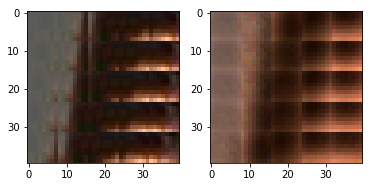

EPO: 11, recon_loss: 0.0226, total_loss: 0.0306, train_psnr:22.8291, validation_psnr:27.7774
EPO: 11, recon_loss: 0.0346, total_loss: 0.0419, train_psnr:22.8333, validation_psnr:27.6497
EPO: 11, recon_loss: 0.0243, total_loss: 0.0368, train_psnr:22.9503, validation_psnr:27.8652
EPO: 11, recon_loss: 0.0127, total_loss: 0.0196, train_psnr:23.0720, validation_psnr:27.4133
EPO: 11, recon_loss: 0.0208, total_loss: 0.0269, train_psnr:23.0990, validation_psnr:27.1902
EPO: 11, recon_loss: 0.0127, total_loss: 0.0153, train_psnr:23.1491, validation_psnr:27.1824
EPO: 11, recon_loss: 0.0124, total_loss: 0.0179, train_psnr:23.1337, validation_psnr:26.5739
EPO: 11, recon_loss: 0.0038, total_loss: 0.0066, train_psnr:23.1288, validation_psnr:26.9381
EPO: 11, recon_loss: 0.0041, total_loss: 0.0088, train_psnr:23.0980, validation_psnr:27.6349
EPO: 11, recon_loss: 0.0148, total_loss: 0.0226, train_psnr:23.0511, validation_psnr:27.8162
#########reconstruction test psnr: 26.5480 


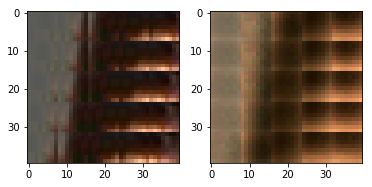

EPO: 11, recon_loss: 0.0069, total_loss: 0.0144, train_psnr:23.0497, validation_psnr:28.0696
EPO: 11, recon_loss: 0.0100, total_loss: 0.0215, train_psnr:23.0137, validation_psnr:28.0290
EPO: 11, recon_loss: 0.0077, total_loss: 0.0198, train_psnr:23.0245, validation_psnr:28.3003
EPO: 11, recon_loss: 0.0068, total_loss: 0.0186, train_psnr:23.0737, validation_psnr:28.1846
EPO: 11, recon_loss: 0.0178, total_loss: 0.0266, train_psnr:23.0971, validation_psnr:27.9146
EPO: 11, recon_loss: 0.0043, total_loss: 0.0112, train_psnr:23.1100, validation_psnr:28.0222
EPO: 11, recon_loss: 0.0152, total_loss: 0.0229, train_psnr:23.1241, validation_psnr:28.1882
EPO: 11, recon_loss: 0.0289, total_loss: 0.0492, train_psnr:23.0574, validation_psnr:28.9275
EPO: 11, recon_loss: 0.0062, total_loss: 0.0149, train_psnr:23.1779, validation_psnr:28.5219
EPO: 11, recon_loss: 0.0355, total_loss: 0.0416, train_psnr:23.1595, validation_psnr:28.2364
#########reconstruction test psnr: 26.9116 


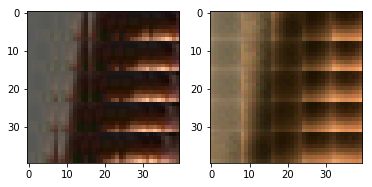

EPO: 11, recon_loss: 0.0084, total_loss: 0.0139, train_psnr:23.1702, validation_psnr:28.2352
EPO: 11, recon_loss: 0.0127, total_loss: 0.0160, train_psnr:23.1408, validation_psnr:28.2833
EPO: 11, recon_loss: 0.0190, total_loss: 0.0278, train_psnr:23.1447, validation_psnr:27.9929
EPO: 11, recon_loss: 0.0095, total_loss: 0.0156, train_psnr:23.1979, validation_psnr:28.1472
EPO: 11, recon_loss: 0.0177, total_loss: 0.0259, train_psnr:23.1520, validation_psnr:28.0639
EPO: 11, recon_loss: 0.0118, total_loss: 0.0165, train_psnr:23.1662, validation_psnr:28.0895
EPO: 11, recon_loss: 0.0204, total_loss: 0.0261, train_psnr:23.0525, validation_psnr:28.4462
EPO: 11, recon_loss: 0.0335, total_loss: 0.0493, train_psnr:23.0227, validation_psnr:28.3481
EPO: 11, recon_loss: 0.0178, total_loss: 0.0317, train_psnr:22.9476, validation_psnr:28.5720
EPO: 11, recon_loss: 0.0400, total_loss: 0.0531, train_psnr:22.8811, validation_psnr:28.5924
#########reconstruction test psnr: 27.1676 


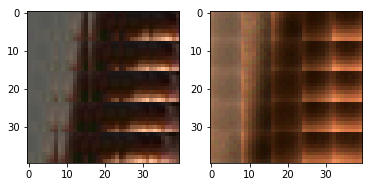

EPO: 11, recon_loss: 0.0209, total_loss: 0.0341, train_psnr:22.9030, validation_psnr:28.7103
EPO: 11, recon_loss: 0.0178, total_loss: 0.0315, train_psnr:22.7726, validation_psnr:28.6568
EPO: 11, recon_loss: 0.0103, total_loss: 0.0230, train_psnr:22.8763, validation_psnr:27.8361
EPO: 11, recon_loss: 0.0090, total_loss: 0.0172, train_psnr:22.9779, validation_psnr:27.5903
EPO: 11, recon_loss: 0.0182, total_loss: 0.0297, train_psnr:22.9722, validation_psnr:27.8990
EPO: 11, recon_loss: 0.0128, total_loss: 0.0204, train_psnr:22.9817, validation_psnr:27.6249
EPO: 11, recon_loss: 0.0194, total_loss: 0.0322, train_psnr:22.9753, validation_psnr:28.1935
EPO: 11, recon_loss: 0.0138, total_loss: 0.0311, train_psnr:22.9362, validation_psnr:27.8477
EPO: 11, recon_loss: 0.0056, total_loss: 0.0164, train_psnr:22.9461, validation_psnr:27.3566
EPO: 11, recon_loss: 0.0338, total_loss: 0.0405, train_psnr:22.9026, validation_psnr:27.4640
#########reconstruction test psnr: 26.3282 


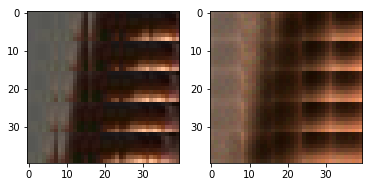

EPO: 11, recon_loss: 0.0121, total_loss: 0.0215, train_psnr:22.9217, validation_psnr:27.4782
EPO: 11, recon_loss: 0.0116, total_loss: 0.0221, train_psnr:22.9447, validation_psnr:27.8052
EPO: 11, recon_loss: 0.0197, total_loss: 0.0388, train_psnr:22.9254, validation_psnr:27.6128
EPO: 11, recon_loss: 0.0121, total_loss: 0.0334, train_psnr:22.9774, validation_psnr:28.0366
EPO: 11, recon_loss: 0.0327, total_loss: 0.0541, train_psnr:22.9956, validation_psnr:28.4104
EPO: 11, recon_loss: 0.0336, total_loss: 0.0533, train_psnr:23.0420, validation_psnr:28.1782
EPO: 11, recon_loss: 0.0126, total_loss: 0.0321, train_psnr:23.0342, validation_psnr:28.1749
EPO: 11, recon_loss: 0.0401, total_loss: 0.0619, train_psnr:23.0096, validation_psnr:28.5564
EPO: 11, recon_loss: 0.0162, total_loss: 0.0350, train_psnr:22.9061, validation_psnr:28.5472
EPO: 11, recon_loss: 0.0300, total_loss: 0.0492, train_psnr:22.8673, validation_psnr:28.4459
#########reconstruction test psnr: 27.1629 


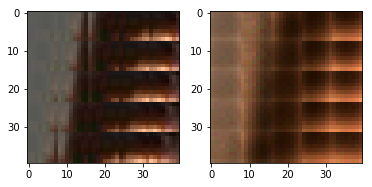

EPO: 11, recon_loss: 0.0341, total_loss: 0.0536, train_psnr:22.9299, validation_psnr:28.5282
EPO: 11, recon_loss: 0.0267, total_loss: 0.0474, train_psnr:22.8828, validation_psnr:28.2873
EPO: 11, recon_loss: 0.0258, total_loss: 0.0437, train_psnr:22.8394, validation_psnr:28.1761
EPO: 11, recon_loss: 0.0080, total_loss: 0.0269, train_psnr:22.9442, validation_psnr:27.5938
EPO: 11, recon_loss: 0.0570, total_loss: 0.0697, train_psnr:22.9945, validation_psnr:27.1773
EPO: 11, recon_loss: 0.0410, total_loss: 0.0499, train_psnr:23.0347, validation_psnr:27.1597
EPO: 11, recon_loss: 0.0145, total_loss: 0.0199, train_psnr:23.0114, validation_psnr:26.7379
EPO: 11, recon_loss: 0.0124, total_loss: 0.0177, train_psnr:22.9872, validation_psnr:26.7571
EPO: 11, recon_loss: 0.0054, total_loss: 0.0138, train_psnr:23.0682, validation_psnr:27.2949
EPO: 11, recon_loss: 0.0131, total_loss: 0.0243, train_psnr:23.0846, validation_psnr:28.0581
#########reconstruction test psnr: 26.7927 


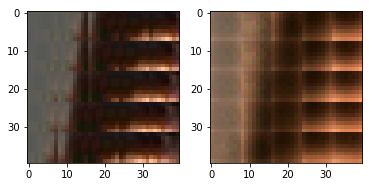

EPO: 11, recon_loss: 0.0187, total_loss: 0.0287, train_psnr:23.0222, validation_psnr:28.2162
EPO: 11, recon_loss: 0.0122, total_loss: 0.0246, train_psnr:23.0280, validation_psnr:28.5780
EPO: 11, recon_loss: 0.0249, total_loss: 0.0366, train_psnr:23.0229, validation_psnr:28.3842
EPO: 11, recon_loss: 0.0020, total_loss: 0.0057, train_psnr:22.9596, validation_psnr:28.6205
EPO: 11, recon_loss: 0.0039, total_loss: 0.0075, train_psnr:22.9361, validation_psnr:28.6163
EPO: 11, recon_loss: 0.0077, total_loss: 0.0106, train_psnr:22.9802, validation_psnr:28.4518
EPO: 11, recon_loss: 0.0037, total_loss: 0.0059, train_psnr:22.9418, validation_psnr:28.3368
EPO: 11, recon_loss: 0.0103, total_loss: 0.0143, train_psnr:22.8960, validation_psnr:28.0987
EPO: 11, recon_loss: 0.0097, total_loss: 0.0186, train_psnr:22.8863, validation_psnr:27.8212
EPO: 11, recon_loss: 0.0136, total_loss: 0.0197, train_psnr:22.7694, validation_psnr:27.2560
#########reconstruction test psnr: 26.1437 


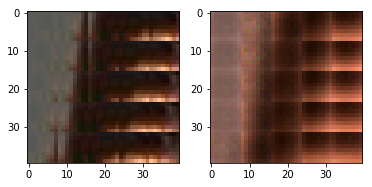

EPO: 11, recon_loss: 0.0283, total_loss: 0.0339, train_psnr:22.6699, validation_psnr:27.0832
EPO: 11, recon_loss: 0.0095, total_loss: 0.0128, train_psnr:22.5367, validation_psnr:27.0537
EPO: 11, recon_loss: 0.0131, total_loss: 0.0165, train_psnr:22.4375, validation_psnr:26.9192
EPO: 11, recon_loss: 0.0189, total_loss: 0.0345, train_psnr:22.6065, validation_psnr:27.3272
EPO: 11, recon_loss: 0.0348, total_loss: 0.0505, train_psnr:22.7420, validation_psnr:27.1167
EPO: 11, recon_loss: 0.0304, total_loss: 0.0452, train_psnr:22.8239, validation_psnr:27.3471
EPO: 11, recon_loss: 0.0212, total_loss: 0.0314, train_psnr:22.9430, validation_psnr:27.6271
EPO: 11, recon_loss: 0.0188, total_loss: 0.0259, train_psnr:22.9648, validation_psnr:27.4731
EPO: 11, recon_loss: 0.0165, total_loss: 0.0234, train_psnr:23.0923, validation_psnr:27.2041
EPO: 11, recon_loss: 0.0120, total_loss: 0.0163, train_psnr:23.1640, validation_psnr:27.4668
#########reconstruction test psnr: 26.2514 


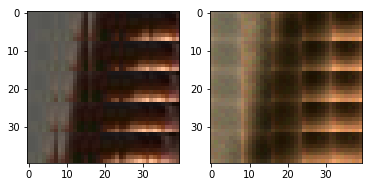

EPO: 11, recon_loss: 0.0164, total_loss: 0.0234, train_psnr:23.1780, validation_psnr:27.6043
EPO: 11, recon_loss: 0.0072, total_loss: 0.0115, train_psnr:23.2309, validation_psnr:27.5638
EPO: 11, recon_loss: 0.0107, total_loss: 0.0164, train_psnr:23.2539, validation_psnr:27.6133
EPO: 11, recon_loss: 0.0106, total_loss: 0.0307, train_psnr:23.2279, validation_psnr:28.1830
EPO: 11, recon_loss: 0.0037, total_loss: 0.0116, train_psnr:23.2530, validation_psnr:27.5807
EPO: 11, recon_loss: 0.0364, total_loss: 0.0437, train_psnr:23.2373, validation_psnr:27.4334
EPO: 11, recon_loss: 0.0144, total_loss: 0.0211, train_psnr:23.2027, validation_psnr:27.5190
EPO: 11, recon_loss: 0.0191, total_loss: 0.0262, train_psnr:23.2011, validation_psnr:27.7092
EPO: 11, recon_loss: 0.0058, total_loss: 0.0093, train_psnr:23.2073, validation_psnr:27.6639
EPO: 11, recon_loss: 0.0048, total_loss: 0.0089, train_psnr:23.2595, validation_psnr:27.5481
#########reconstruction test psnr: 26.3563 


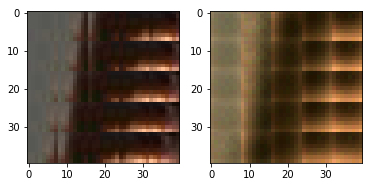

EPO: 11, recon_loss: 0.0120, total_loss: 0.0173, train_psnr:23.2641, validation_psnr:27.2214
EPO: 11, recon_loss: 0.0047, total_loss: 0.0094, train_psnr:23.2809, validation_psnr:27.2375
EPO: 11, recon_loss: 0.0062, total_loss: 0.0095, train_psnr:23.2662, validation_psnr:27.3283
EPO: 11, recon_loss: 0.0159, total_loss: 0.0238, train_psnr:23.2175, validation_psnr:27.9699
EPO: 11, recon_loss: 0.0079, total_loss: 0.0144, train_psnr:23.2379, validation_psnr:27.9052
EPO: 11, recon_loss: 0.0247, total_loss: 0.0316, train_psnr:23.2085, validation_psnr:27.7779
EPO: 11, recon_loss: 0.0099, total_loss: 0.0183, train_psnr:23.1556, validation_psnr:27.9535
EPO: 11, recon_loss: 0.0074, total_loss: 0.0143, train_psnr:23.1264, validation_psnr:27.5007
EPO: 11, recon_loss: 0.0121, total_loss: 0.0300, train_psnr:23.0724, validation_psnr:27.9970
EPO: 11, recon_loss: 0.0112, total_loss: 0.0235, train_psnr:23.0637, validation_psnr:27.8566
#########reconstruction test psnr: 26.6487 


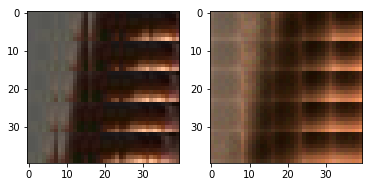

EPO: 11, recon_loss: 0.0437, total_loss: 0.0527, train_psnr:23.0448, validation_psnr:27.5917
EPO: 11, recon_loss: 0.0152, total_loss: 0.0239, train_psnr:23.0520, validation_psnr:27.6041
EPO: 11, recon_loss: 0.0207, total_loss: 0.0301, train_psnr:22.9985, validation_psnr:27.7856
EPO: 11, recon_loss: 0.0138, total_loss: 0.0242, train_psnr:22.9333, validation_psnr:27.9794
EPO: 11, recon_loss: 0.0020, total_loss: 0.0073, train_psnr:22.8743, validation_psnr:27.2768
EPO: 11, recon_loss: 0.0196, total_loss: 0.0275, train_psnr:22.8525, validation_psnr:27.2272
EPO: 11, recon_loss: 0.0159, total_loss: 0.0215, train_psnr:22.8247, validation_psnr:26.9092
EPO: 11, recon_loss: 0.0137, total_loss: 0.0224, train_psnr:22.8050, validation_psnr:26.9820
EPO: 11, recon_loss: 0.0130, total_loss: 0.0242, train_psnr:22.7298, validation_psnr:28.2640
EPO: 11, recon_loss: 0.0183, total_loss: 0.0280, train_psnr:22.8288, validation_psnr:28.1327
#########reconstruction test psnr: 26.8197 


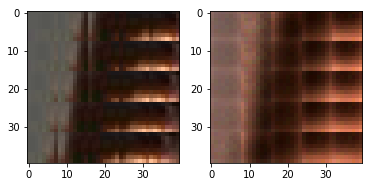

EPO: 11, recon_loss: 0.0165, total_loss: 0.0276, train_psnr:22.8260, validation_psnr:28.6308
EPO: 11, recon_loss: 0.0185, total_loss: 0.0278, train_psnr:22.8270, validation_psnr:28.5461
EPO: 11, recon_loss: 0.0061, total_loss: 0.0125, train_psnr:22.8211, validation_psnr:28.5043
EPO: 11, recon_loss: 0.0234, total_loss: 0.0325, train_psnr:22.7825, validation_psnr:28.4315
EPO: 11, recon_loss: 0.0098, total_loss: 0.0144, train_psnr:23.0168, validation_psnr:28.3871
EPO: 11, recon_loss: 0.0213, total_loss: 0.0286, train_psnr:23.0886, validation_psnr:28.5942
EPO: 11, recon_loss: 0.0223, total_loss: 0.0305, train_psnr:23.1851, validation_psnr:28.4411
EPO: 11, recon_loss: 0.0112, total_loss: 0.0171, train_psnr:23.2215, validation_psnr:28.3161
EPO: 11, recon_loss: 0.0110, total_loss: 0.0174, train_psnr:23.2736, validation_psnr:27.9699
EPO: 11, recon_loss: 0.0142, total_loss: 0.0226, train_psnr:23.2770, validation_psnr:28.0088
#########reconstruction test psnr: 26.7508 


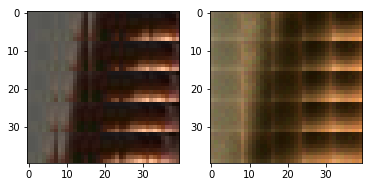

EPO: 11, recon_loss: 0.0138, total_loss: 0.0227, train_psnr:23.2268, validation_psnr:27.8605
EPO: 11, recon_loss: 0.0241, total_loss: 0.0307, train_psnr:23.1056, validation_psnr:28.2487
EPO: 11, recon_loss: 0.0154, total_loss: 0.0266, train_psnr:23.0661, validation_psnr:28.1607
EPO: 11, recon_loss: 0.0250, total_loss: 0.0317, train_psnr:23.0113, validation_psnr:28.1925
EPO: 11, recon_loss: 0.0127, total_loss: 0.0212, train_psnr:23.0597, validation_psnr:28.2591
EPO: 11, recon_loss: 0.0067, total_loss: 0.0116, train_psnr:23.1015, validation_psnr:28.1546
EPO: 11, recon_loss: 0.0123, total_loss: 0.0180, train_psnr:23.1328, validation_psnr:28.2614
EPO: 11, recon_loss: 0.0101, total_loss: 0.0177, train_psnr:23.1425, validation_psnr:28.3644
EPO: 11, recon_loss: 0.0152, total_loss: 0.0250, train_psnr:23.1419, validation_psnr:28.3298
EPO: 11, recon_loss: 0.0124, total_loss: 0.0223, train_psnr:23.1677, validation_psnr:28.0342
#########reconstruction test psnr: 26.7930 


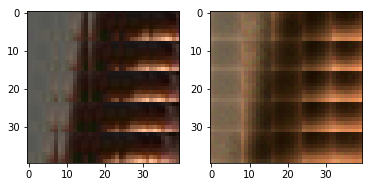

EPO: 11, recon_loss: 0.0179, total_loss: 0.0262, train_psnr:23.1537, validation_psnr:28.0357
EPO: 11, recon_loss: 0.0363, total_loss: 0.0464, train_psnr:23.0784, validation_psnr:27.5561
EPO: 11, recon_loss: 0.0120, total_loss: 0.0225, train_psnr:23.0502, validation_psnr:27.8977
EPO: 11, recon_loss: 0.0387, total_loss: 0.0495, train_psnr:22.9615, validation_psnr:27.4166
EPO: 11, recon_loss: 0.0088, total_loss: 0.0182, train_psnr:22.9643, validation_psnr:28.0018
EPO: 11, recon_loss: 0.0066, total_loss: 0.0147, train_psnr:22.9102, validation_psnr:28.0253
EPO: 11, recon_loss: 0.0352, total_loss: 0.0461, train_psnr:22.8580, validation_psnr:27.9396
EPO: 11, recon_loss: 0.0110, total_loss: 0.0200, train_psnr:22.8025, validation_psnr:28.1378
EPO: 11, recon_loss: 0.0284, total_loss: 0.0363, train_psnr:22.7544, validation_psnr:27.9200
EPO: 11, recon_loss: 0.0067, total_loss: 0.0086, train_psnr:22.8260, validation_psnr:28.1157
#########reconstruction test psnr: 26.7763 


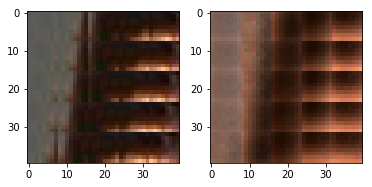

EPO: 11, recon_loss: 0.0045, total_loss: 0.0077, train_psnr:22.9298, validation_psnr:28.1868
EPO: 11, recon_loss: 0.0176, total_loss: 0.0225, train_psnr:22.9278, validation_psnr:28.2402
EPO: 11, recon_loss: 0.0073, total_loss: 0.0139, train_psnr:22.8951, validation_psnr:28.0719
EPO: 11, recon_loss: 0.0237, total_loss: 0.0290, train_psnr:22.8664, validation_psnr:28.2248
EPO: 11, recon_loss: 0.0248, total_loss: 0.0461, train_psnr:22.8584, validation_psnr:28.7018
EPO: 11, recon_loss: 0.0177, total_loss: 0.0368, train_psnr:22.8969, validation_psnr:28.8405
EPO: 11, recon_loss: 0.0323, total_loss: 0.0568, train_psnr:22.8442, validation_psnr:28.5829
EPO: 11, recon_loss: 0.0177, total_loss: 0.0367, train_psnr:22.9070, validation_psnr:28.9727
EPO: 11, recon_loss: 0.0313, total_loss: 0.0545, train_psnr:22.8684, validation_psnr:28.7027
EPO: 11, recon_loss: 0.0077, total_loss: 0.0196, train_psnr:22.9425, validation_psnr:28.1335
#########reconstruction test psnr: 26.8168 


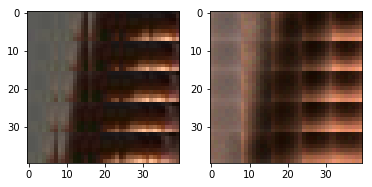

EPO: 11, recon_loss: 0.0196, total_loss: 0.0270, train_psnr:22.9548, validation_psnr:27.3532
EPO: 11, recon_loss: 0.0249, total_loss: 0.0428, train_psnr:23.0155, validation_psnr:28.4350
EPO: 11, recon_loss: 0.0145, total_loss: 0.0271, train_psnr:23.0362, validation_psnr:28.5283
EPO: 11, recon_loss: 0.0126, total_loss: 0.0233, train_psnr:23.0589, validation_psnr:28.5593
EPO: 11, recon_loss: 0.0107, total_loss: 0.0305, train_psnr:23.0536, validation_psnr:28.6785
EPO: 11, recon_loss: 0.0123, total_loss: 0.0279, train_psnr:23.0945, validation_psnr:28.7493
EPO: 11, recon_loss: 0.0342, total_loss: 0.0470, train_psnr:23.0750, validation_psnr:28.7219
EPO: 11, recon_loss: 0.0074, total_loss: 0.0182, train_psnr:23.1010, validation_psnr:28.7817
EPO: 11, recon_loss: 0.0078, total_loss: 0.0176, train_psnr:23.0986, validation_psnr:28.6933
EPO: 11, recon_loss: 0.0166, total_loss: 0.0285, train_psnr:23.0639, validation_psnr:28.0690
#########reconstruction test psnr: 26.8707 


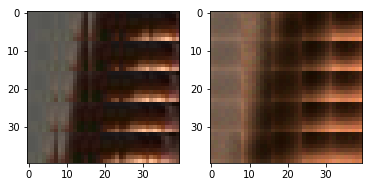

EPO: 11, recon_loss: 0.0061, total_loss: 0.0168, train_psnr:22.9991, validation_psnr:28.5381
EPO: 11, recon_loss: 0.0315, total_loss: 0.0405, train_psnr:22.9476, validation_psnr:28.4897
EPO: 11, recon_loss: 0.0072, total_loss: 0.0171, train_psnr:22.8817, validation_psnr:28.4793
EPO: 11, recon_loss: 0.0089, total_loss: 0.0181, train_psnr:22.8244, validation_psnr:28.4891
EPO: 11, recon_loss: 0.0109, total_loss: 0.0178, train_psnr:22.8164, validation_psnr:27.9190
EPO: 11, recon_loss: 0.0058, total_loss: 0.0164, train_psnr:22.8308, validation_psnr:28.1675
EPO: 11, recon_loss: 0.0290, total_loss: 0.0404, train_psnr:22.8837, validation_psnr:28.3147
EPO: 11, recon_loss: 0.0184, total_loss: 0.0313, train_psnr:22.8864, validation_psnr:28.2757
EPO: 11, recon_loss: 0.0141, total_loss: 0.0240, train_psnr:22.8952, validation_psnr:28.4444
EPO: 11, recon_loss: 0.0152, total_loss: 0.0378, train_psnr:22.8580, validation_psnr:27.7388
#########reconstruction test psnr: 26.6105 


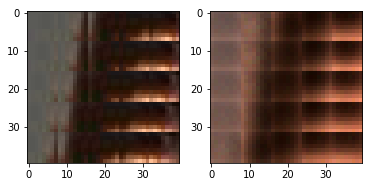

EPO: 11, recon_loss: 0.0051, total_loss: 0.0141, train_psnr:22.8956, validation_psnr:28.0767
EPO: 11, recon_loss: 0.0348, total_loss: 0.0483, train_psnr:22.9179, validation_psnr:28.3280
EPO: 11, recon_loss: 0.0161, total_loss: 0.0207, train_psnr:22.9166, validation_psnr:28.0169
EPO: 11, recon_loss: 0.0171, total_loss: 0.0245, train_psnr:22.9005, validation_psnr:27.9085
EPO: 11, recon_loss: 0.0133, total_loss: 0.0266, train_psnr:22.8508, validation_psnr:28.6535
EPO: 11, recon_loss: 0.0056, total_loss: 0.0150, train_psnr:23.0491, validation_psnr:28.3440
EPO: 11, recon_loss: 0.0208, total_loss: 0.0303, train_psnr:23.1082, validation_psnr:28.3745
EPO: 11, recon_loss: 0.0085, total_loss: 0.0156, train_psnr:23.1042, validation_psnr:28.3746
EPO: 11, recon_loss: 0.0131, total_loss: 0.0188, train_psnr:23.1432, validation_psnr:28.1792
EPO: 11, recon_loss: 0.0233, total_loss: 0.0374, train_psnr:23.1386, validation_psnr:27.9569
#########reconstruction test psnr: 26.7125 


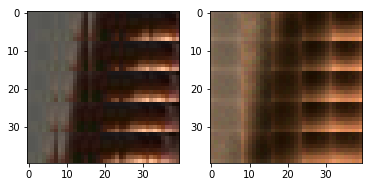

EPO: 11, recon_loss: 0.0312, total_loss: 0.0495, train_psnr:23.0201, validation_psnr:27.6357
EPO: 11, recon_loss: 0.0250, total_loss: 0.0353, train_psnr:22.9063, validation_psnr:27.1948
EPO: 11, recon_loss: 0.0237, total_loss: 0.0344, train_psnr:22.7706, validation_psnr:27.3668
EPO: 11, recon_loss: 0.0340, total_loss: 0.0427, train_psnr:22.6715, validation_psnr:27.3220
EPO: 11, recon_loss: 0.0137, total_loss: 0.0188, train_psnr:22.6043, validation_psnr:27.7370
EPO: 11, recon_loss: 0.0070, total_loss: 0.0258, train_psnr:22.6440, validation_psnr:27.6673
EPO: 11, recon_loss: 0.0138, total_loss: 0.0265, train_psnr:22.6672, validation_psnr:27.4906
EPO: 11, recon_loss: 0.0198, total_loss: 0.0317, train_psnr:22.7534, validation_psnr:28.0254
EPO: 11, recon_loss: 0.0173, total_loss: 0.0267, train_psnr:22.8069, validation_psnr:28.2964
EPO: 11, recon_loss: 0.0299, total_loss: 0.0397, train_psnr:22.8263, validation_psnr:27.5773
#########reconstruction test psnr: 26.3663 


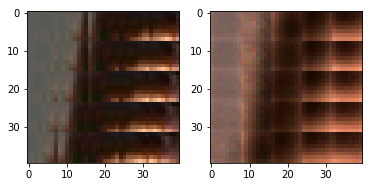

EPO: 11, recon_loss: 0.0040, total_loss: 0.0063, train_psnr:22.9555, validation_psnr:28.1900
EPO: 11, recon_loss: 0.0096, total_loss: 0.0131, train_psnr:23.0543, validation_psnr:28.4181
EPO: 11, recon_loss: 0.0099, total_loss: 0.0134, train_psnr:23.0877, validation_psnr:28.2666
EPO: 11, recon_loss: 0.0042, total_loss: 0.0073, train_psnr:23.1394, validation_psnr:28.3690
EPO: 11, recon_loss: 0.0132, total_loss: 0.0174, train_psnr:23.1536, validation_psnr:28.1606
EPO: 11, recon_loss: 0.0191, total_loss: 0.0284, train_psnr:23.1363, validation_psnr:27.7670
EPO: 11, recon_loss: 0.0177, total_loss: 0.0249, train_psnr:23.1325, validation_psnr:27.6464
EPO: 11, recon_loss: 0.0157, total_loss: 0.0238, train_psnr:23.0933, validation_psnr:27.6863
EPO: 11, recon_loss: 0.0116, total_loss: 0.0170, train_psnr:23.1586, validation_psnr:27.6436
EPO: 11, recon_loss: 0.0197, total_loss: 0.0238, train_psnr:23.1621, validation_psnr:27.3975
#########reconstruction test psnr: 26.2365 


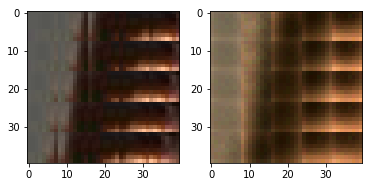

EPO: 11, recon_loss: 0.0164, total_loss: 0.0262, train_psnr:23.1676, validation_psnr:27.9575
EPO: 11, recon_loss: 0.0160, total_loss: 0.0259, train_psnr:23.0731, validation_psnr:28.1389
EPO: 11, recon_loss: 0.0268, total_loss: 0.0320, train_psnr:22.9783, validation_psnr:28.0770
EPO: 11, recon_loss: 0.0152, total_loss: 0.0222, train_psnr:22.8987, validation_psnr:27.9840
EPO: 11, recon_loss: 0.0196, total_loss: 0.0261, train_psnr:22.8047, validation_psnr:27.8680
EPO: 11, recon_loss: 0.0252, total_loss: 0.0450, train_psnr:22.8557, validation_psnr:27.8704
EPO: 11, recon_loss: 0.0302, total_loss: 0.0404, train_psnr:22.9650, validation_psnr:27.8753
EPO: 11, recon_loss: 0.0211, total_loss: 0.0292, train_psnr:22.7244, validation_psnr:28.6757
EPO: 11, recon_loss: 0.0358, total_loss: 0.0451, train_psnr:19.6379, validation_psnr:27.2959
EPO: 11, recon_loss: 0.0229, total_loss: 0.0329, train_psnr:20.6572, validation_psnr:27.7835
#########reconstruction test psnr: 26.4564 


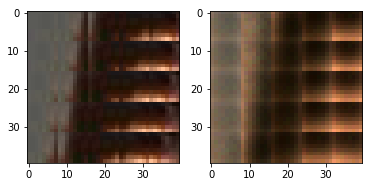

EPO: 11, recon_loss: 0.0060, total_loss: 0.0133, train_psnr:23.0644, validation_psnr:26.9558
EPO: 11, recon_loss: 0.0075, total_loss: 0.0158, train_psnr:23.0664, validation_psnr:26.8701
EPO: 11, recon_loss: 0.0183, total_loss: 0.0223, train_psnr:23.0328, validation_psnr:26.9041
EPO: 11, recon_loss: 0.0129, total_loss: 0.0224, train_psnr:22.9844, validation_psnr:27.1545
EPO: 11, recon_loss: 0.0204, total_loss: 0.0256, train_psnr:22.9284, validation_psnr:27.1584
EPO: 11, recon_loss: 0.0077, total_loss: 0.0267, train_psnr:22.8953, validation_psnr:28.4728
EPO: 11, recon_loss: 0.0032, total_loss: 0.0123, train_psnr:22.9460, validation_psnr:27.9571
EPO: 11, recon_loss: 0.0134, total_loss: 0.0218, train_psnr:22.9354, validation_psnr:27.6953
EPO: 11, recon_loss: 0.0031, total_loss: 0.0066, train_psnr:22.9561, validation_psnr:27.9301
EPO: 11, recon_loss: 0.0037, total_loss: 0.0065, train_psnr:22.9561, validation_psnr:27.9060
#########reconstruction test psnr: 26.6279 


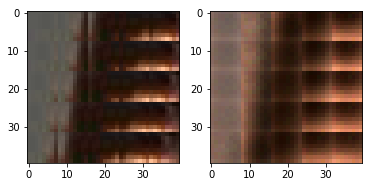

EPO: 11, recon_loss: 0.0183, total_loss: 0.0283, train_psnr:22.9559, validation_psnr:28.4886
EPO: 11, recon_loss: 0.0126, total_loss: 0.0235, train_psnr:23.0505, validation_psnr:28.2970
EPO: 11, recon_loss: 0.0169, total_loss: 0.0269, train_psnr:23.0295, validation_psnr:28.2526
EPO: 11, recon_loss: 0.0155, total_loss: 0.0253, train_psnr:23.0959, validation_psnr:28.3939
EPO: 11, recon_loss: 0.0190, total_loss: 0.0251, train_psnr:23.0913, validation_psnr:28.0677
EPO: 12, recon_loss: 0.0078, total_loss: 0.0134, train_psnr:23.1565, validation_psnr:27.9453
EPO: 12, recon_loss: 0.0060, total_loss: 0.0090, train_psnr:23.2109, validation_psnr:27.8194
EPO: 12, recon_loss: 0.0171, total_loss: 0.0209, train_psnr:23.2257, validation_psnr:27.7107
EPO: 12, recon_loss: 0.0070, total_loss: 0.0110, train_psnr:23.2060, validation_psnr:27.9430
EPO: 12, recon_loss: 0.0064, total_loss: 0.0101, train_psnr:23.1803, validation_psnr:27.9870
#########reconstruction test psnr: 26.7464 


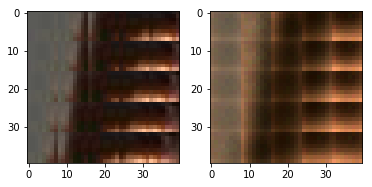

EPO: 12, recon_loss: 0.0058, total_loss: 0.0208, train_psnr:23.1014, validation_psnr:28.7498
EPO: 12, recon_loss: 0.0039, total_loss: 0.0127, train_psnr:23.0983, validation_psnr:28.7661
EPO: 12, recon_loss: 0.0089, total_loss: 0.0172, train_psnr:23.1093, validation_psnr:28.5342
EPO: 12, recon_loss: 0.0085, total_loss: 0.0128, train_psnr:23.0914, validation_psnr:28.4603
EPO: 12, recon_loss: 0.0142, total_loss: 0.0215, train_psnr:23.0215, validation_psnr:27.9589
EPO: 12, recon_loss: 0.0065, total_loss: 0.0200, train_psnr:23.0647, validation_psnr:28.0949
EPO: 12, recon_loss: 0.0062, total_loss: 0.0135, train_psnr:23.0733, validation_psnr:28.2655
EPO: 12, recon_loss: 0.0123, total_loss: 0.0207, train_psnr:23.0682, validation_psnr:27.8175
EPO: 12, recon_loss: 0.0079, total_loss: 0.0120, train_psnr:23.0722, validation_psnr:28.2253
EPO: 12, recon_loss: 0.0125, total_loss: 0.0180, train_psnr:23.1081, validation_psnr:28.0227
#########reconstruction test psnr: 26.7478 


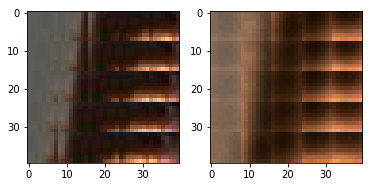

EPO: 12, recon_loss: 0.0121, total_loss: 0.0194, train_psnr:23.0593, validation_psnr:28.5479
EPO: 12, recon_loss: 0.0109, total_loss: 0.0188, train_psnr:22.8662, validation_psnr:28.6720
EPO: 12, recon_loss: 0.0112, total_loss: 0.0181, train_psnr:22.6967, validation_psnr:28.4558
EPO: 12, recon_loss: 0.0115, total_loss: 0.0185, train_psnr:22.6069, validation_psnr:28.6428
EPO: 12, recon_loss: 0.0098, total_loss: 0.0147, train_psnr:22.4771, validation_psnr:28.3560
EPO: 12, recon_loss: 0.0117, total_loss: 0.0167, train_psnr:22.4467, validation_psnr:28.6053
EPO: 12, recon_loss: 0.0072, total_loss: 0.0124, train_psnr:22.6641, validation_psnr:28.6469
EPO: 12, recon_loss: 0.0136, total_loss: 0.0197, train_psnr:22.8118, validation_psnr:28.5263
EPO: 12, recon_loss: 0.0188, total_loss: 0.0247, train_psnr:22.8454, validation_psnr:28.5241
EPO: 12, recon_loss: 0.0068, total_loss: 0.0106, train_psnr:22.9208, validation_psnr:28.4724
#########reconstruction test psnr: 27.0829 


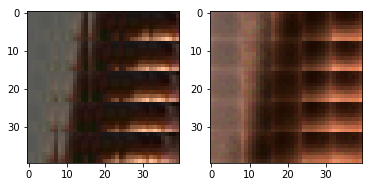

EPO: 12, recon_loss: 0.0160, total_loss: 0.0224, train_psnr:22.9448, validation_psnr:28.5099
EPO: 12, recon_loss: 0.0128, total_loss: 0.0236, train_psnr:22.9170, validation_psnr:27.6792
EPO: 12, recon_loss: 0.0162, total_loss: 0.0262, train_psnr:22.9596, validation_psnr:27.9765
EPO: 12, recon_loss: 0.0247, total_loss: 0.0344, train_psnr:22.9943, validation_psnr:28.0121
EPO: 12, recon_loss: 0.0257, total_loss: 0.0363, train_psnr:23.0163, validation_psnr:27.9010
EPO: 12, recon_loss: 0.0241, total_loss: 0.0307, train_psnr:23.0244, validation_psnr:27.9755
EPO: 12, recon_loss: 0.0194, total_loss: 0.0279, train_psnr:23.1791, validation_psnr:28.1452
EPO: 12, recon_loss: 0.0162, total_loss: 0.0247, train_psnr:23.2655, validation_psnr:27.4896
EPO: 12, recon_loss: 0.0168, total_loss: 0.0219, train_psnr:23.2996, validation_psnr:27.4605
EPO: 12, recon_loss: 0.0127, total_loss: 0.0156, train_psnr:23.3343, validation_psnr:27.1921
#########reconstruction test psnr: 26.0945 


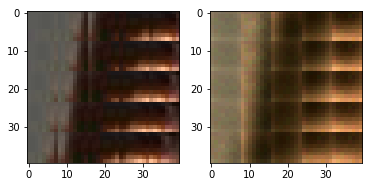

EPO: 12, recon_loss: 0.0212, total_loss: 0.0272, train_psnr:23.3100, validation_psnr:26.3609
EPO: 12, recon_loss: 0.0036, total_loss: 0.0062, train_psnr:23.3163, validation_psnr:27.2254
EPO: 12, recon_loss: 0.0063, total_loss: 0.0133, train_psnr:23.2809, validation_psnr:27.9857
EPO: 12, recon_loss: 0.0126, total_loss: 0.0188, train_psnr:23.2539, validation_psnr:27.9889
EPO: 12, recon_loss: 0.0075, total_loss: 0.0151, train_psnr:23.2286, validation_psnr:28.4110
EPO: 12, recon_loss: 0.0133, total_loss: 0.0241, train_psnr:23.1975, validation_psnr:28.3021
EPO: 12, recon_loss: 0.0061, total_loss: 0.0179, train_psnr:23.2242, validation_psnr:28.4181
EPO: 12, recon_loss: 0.0055, total_loss: 0.0165, train_psnr:23.2662, validation_psnr:28.3100
EPO: 12, recon_loss: 0.0197, total_loss: 0.0271, train_psnr:23.2719, validation_psnr:27.9952
EPO: 12, recon_loss: 0.0046, total_loss: 0.0114, train_psnr:23.3091, validation_psnr:28.2406
#########reconstruction test psnr: 26.9305 


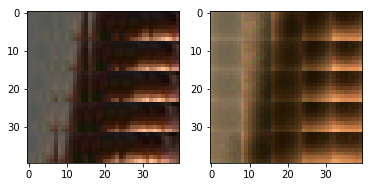

EPO: 12, recon_loss: 0.0195, total_loss: 0.0271, train_psnr:23.3039, validation_psnr:28.3088
EPO: 12, recon_loss: 0.0227, total_loss: 0.0445, train_psnr:23.3061, validation_psnr:28.9414
EPO: 12, recon_loss: 0.0078, total_loss: 0.0168, train_psnr:23.3648, validation_psnr:28.6202
EPO: 12, recon_loss: 0.0285, total_loss: 0.0343, train_psnr:23.3442, validation_psnr:28.4938
EPO: 12, recon_loss: 0.0066, total_loss: 0.0114, train_psnr:23.3542, validation_psnr:28.4586
EPO: 12, recon_loss: 0.0156, total_loss: 0.0190, train_psnr:23.3310, validation_psnr:28.4384
EPO: 12, recon_loss: 0.0166, total_loss: 0.0259, train_psnr:23.3534, validation_psnr:28.2602
EPO: 12, recon_loss: 0.0074, total_loss: 0.0130, train_psnr:23.3980, validation_psnr:28.3184
EPO: 12, recon_loss: 0.0178, total_loss: 0.0263, train_psnr:23.3408, validation_psnr:28.3985
EPO: 12, recon_loss: 0.0114, total_loss: 0.0158, train_psnr:23.3563, validation_psnr:28.2171
#########reconstruction test psnr: 26.9175 


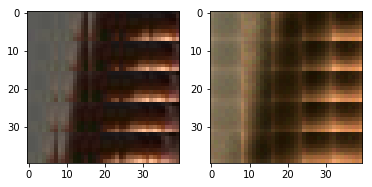

EPO: 12, recon_loss: 0.0236, total_loss: 0.0313, train_psnr:23.2646, validation_psnr:28.4369
EPO: 12, recon_loss: 0.0201, total_loss: 0.0337, train_psnr:23.1935, validation_psnr:28.3894
EPO: 12, recon_loss: 0.0218, total_loss: 0.0351, train_psnr:23.1225, validation_psnr:28.7967
EPO: 12, recon_loss: 0.0456, total_loss: 0.0583, train_psnr:23.0622, validation_psnr:28.6962
EPO: 12, recon_loss: 0.0234, total_loss: 0.0372, train_psnr:23.0793, validation_psnr:28.8583
EPO: 12, recon_loss: 0.0165, total_loss: 0.0292, train_psnr:22.9853, validation_psnr:28.7233
EPO: 12, recon_loss: 0.0087, total_loss: 0.0202, train_psnr:23.1141, validation_psnr:27.9919
EPO: 12, recon_loss: 0.0088, total_loss: 0.0179, train_psnr:23.1620, validation_psnr:27.7978
EPO: 12, recon_loss: 0.0222, total_loss: 0.0303, train_psnr:23.1368, validation_psnr:27.3498
EPO: 12, recon_loss: 0.0099, total_loss: 0.0181, train_psnr:23.1738, validation_psnr:27.9218
#########reconstruction test psnr: 26.7377 


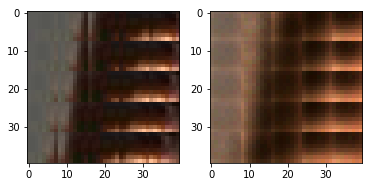

EPO: 12, recon_loss: 0.0163, total_loss: 0.0274, train_psnr:23.1411, validation_psnr:28.5457
EPO: 12, recon_loss: 0.0109, total_loss: 0.0238, train_psnr:23.1278, validation_psnr:28.2745
EPO: 12, recon_loss: 0.0053, total_loss: 0.0157, train_psnr:23.1300, validation_psnr:27.5615
EPO: 12, recon_loss: 0.0296, total_loss: 0.0358, train_psnr:23.1111, validation_psnr:27.5174
EPO: 12, recon_loss: 0.0088, total_loss: 0.0193, train_psnr:23.1278, validation_psnr:27.7125
EPO: 12, recon_loss: 0.0132, total_loss: 0.0214, train_psnr:23.1227, validation_psnr:28.0381
EPO: 12, recon_loss: 0.0188, total_loss: 0.0374, train_psnr:23.1238, validation_psnr:27.9868
EPO: 12, recon_loss: 0.0130, total_loss: 0.0370, train_psnr:23.1574, validation_psnr:28.3413
EPO: 12, recon_loss: 0.0400, total_loss: 0.0576, train_psnr:23.2053, validation_psnr:28.5714
EPO: 12, recon_loss: 0.0188, total_loss: 0.0380, train_psnr:23.2475, validation_psnr:28.5145
#########reconstruction test psnr: 27.1819 


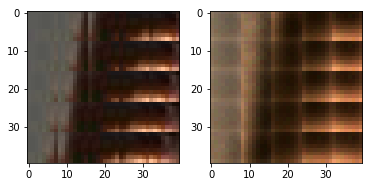

EPO: 12, recon_loss: 0.0139, total_loss: 0.0320, train_psnr:23.2248, validation_psnr:28.4186
EPO: 12, recon_loss: 0.0250, total_loss: 0.0420, train_psnr:23.1660, validation_psnr:28.8085
EPO: 12, recon_loss: 0.0153, total_loss: 0.0344, train_psnr:23.0907, validation_psnr:28.7695
EPO: 12, recon_loss: 0.0459, total_loss: 0.0651, train_psnr:23.0528, validation_psnr:28.5366
EPO: 12, recon_loss: 0.0248, total_loss: 0.0444, train_psnr:23.1250, validation_psnr:28.6088
EPO: 12, recon_loss: 0.0257, total_loss: 0.0462, train_psnr:23.0700, validation_psnr:28.4848
EPO: 12, recon_loss: 0.0096, total_loss: 0.0286, train_psnr:23.1399, validation_psnr:27.7982
EPO: 12, recon_loss: 0.0115, total_loss: 0.0308, train_psnr:23.1737, validation_psnr:27.5430
EPO: 12, recon_loss: 0.0440, total_loss: 0.0570, train_psnr:23.2516, validation_psnr:27.4877
EPO: 12, recon_loss: 0.0430, total_loss: 0.0494, train_psnr:23.2478, validation_psnr:27.3135
#########reconstruction test psnr: 26.2725 


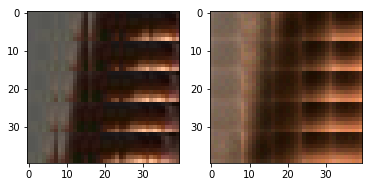

EPO: 12, recon_loss: 0.0088, total_loss: 0.0140, train_psnr:23.2046, validation_psnr:27.0972
EPO: 12, recon_loss: 0.0143, total_loss: 0.0198, train_psnr:23.1571, validation_psnr:27.6686
EPO: 12, recon_loss: 0.0058, total_loss: 0.0157, train_psnr:23.2810, validation_psnr:27.6167
EPO: 12, recon_loss: 0.0160, total_loss: 0.0257, train_psnr:23.2530, validation_psnr:28.4994
EPO: 12, recon_loss: 0.0140, total_loss: 0.0244, train_psnr:23.2372, validation_psnr:28.4367
EPO: 12, recon_loss: 0.0141, total_loss: 0.0275, train_psnr:23.2230, validation_psnr:28.7839
EPO: 12, recon_loss: 0.0285, total_loss: 0.0410, train_psnr:23.2332, validation_psnr:28.5049
EPO: 12, recon_loss: 0.0020, total_loss: 0.0054, train_psnr:23.1643, validation_psnr:28.8103
EPO: 12, recon_loss: 0.0033, total_loss: 0.0075, train_psnr:23.0772, validation_psnr:28.8572
EPO: 12, recon_loss: 0.0049, total_loss: 0.0074, train_psnr:23.1941, validation_psnr:28.3633
#########reconstruction test psnr: 27.0324 


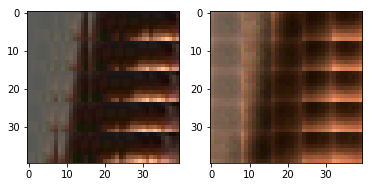

EPO: 12, recon_loss: 0.0042, total_loss: 0.0064, train_psnr:23.1344, validation_psnr:28.4732
EPO: 12, recon_loss: 0.0123, total_loss: 0.0159, train_psnr:23.0947, validation_psnr:28.1624
EPO: 12, recon_loss: 0.0091, total_loss: 0.0163, train_psnr:23.0506, validation_psnr:27.9547
EPO: 12, recon_loss: 0.0161, total_loss: 0.0229, train_psnr:22.9236, validation_psnr:27.6925
EPO: 12, recon_loss: 0.0224, total_loss: 0.0282, train_psnr:22.8208, validation_psnr:27.1976
EPO: 12, recon_loss: 0.0091, total_loss: 0.0123, train_psnr:22.6917, validation_psnr:27.4478
EPO: 12, recon_loss: 0.0191, total_loss: 0.0227, train_psnr:22.6022, validation_psnr:27.4082
EPO: 12, recon_loss: 0.0186, total_loss: 0.0341, train_psnr:22.8193, validation_psnr:27.5354
EPO: 12, recon_loss: 0.0306, total_loss: 0.0448, train_psnr:22.9513, validation_psnr:27.5638
EPO: 12, recon_loss: 0.0274, total_loss: 0.0416, train_psnr:23.0347, validation_psnr:27.8067
#########reconstruction test psnr: 26.6022 


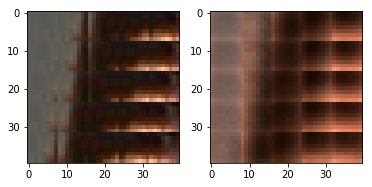

EPO: 12, recon_loss: 0.0177, total_loss: 0.0271, train_psnr:23.1217, validation_psnr:27.6246
EPO: 12, recon_loss: 0.0206, total_loss: 0.0280, train_psnr:23.1635, validation_psnr:27.7044
EPO: 12, recon_loss: 0.0166, total_loss: 0.0232, train_psnr:23.2953, validation_psnr:27.5322
EPO: 12, recon_loss: 0.0125, total_loss: 0.0167, train_psnr:23.3656, validation_psnr:27.6691
EPO: 12, recon_loss: 0.0157, total_loss: 0.0228, train_psnr:23.3439, validation_psnr:28.0391
EPO: 12, recon_loss: 0.0107, total_loss: 0.0158, train_psnr:23.4123, validation_psnr:27.9122
EPO: 12, recon_loss: 0.0150, total_loss: 0.0213, train_psnr:23.4587, validation_psnr:27.7287
EPO: 12, recon_loss: 0.0125, total_loss: 0.0289, train_psnr:23.4395, validation_psnr:28.0712
EPO: 12, recon_loss: 0.0061, total_loss: 0.0123, train_psnr:23.4409, validation_psnr:27.8216
EPO: 12, recon_loss: 0.0240, total_loss: 0.0312, train_psnr:23.4303, validation_psnr:27.8912
#########reconstruction test psnr: 26.6743 


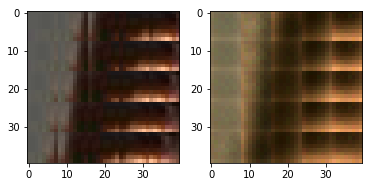

EPO: 12, recon_loss: 0.0152, total_loss: 0.0218, train_psnr:23.4038, validation_psnr:27.6881
EPO: 12, recon_loss: 0.0210, total_loss: 0.0311, train_psnr:23.3943, validation_psnr:27.9053
EPO: 12, recon_loss: 0.0056, total_loss: 0.0093, train_psnr:23.4214, validation_psnr:27.8083
EPO: 12, recon_loss: 0.0052, total_loss: 0.0093, train_psnr:23.4565, validation_psnr:27.8657
EPO: 12, recon_loss: 0.0116, total_loss: 0.0168, train_psnr:23.4545, validation_psnr:27.4911
EPO: 12, recon_loss: 0.0033, total_loss: 0.0077, train_psnr:23.4813, validation_psnr:27.4614
EPO: 12, recon_loss: 0.0058, total_loss: 0.0091, train_psnr:23.4568, validation_psnr:27.6694
EPO: 12, recon_loss: 0.0123, total_loss: 0.0193, train_psnr:23.4255, validation_psnr:28.2020
EPO: 12, recon_loss: 0.0077, total_loss: 0.0137, train_psnr:23.4188, validation_psnr:28.2386
EPO: 12, recon_loss: 0.0266, total_loss: 0.0344, train_psnr:23.4013, validation_psnr:27.9511
#########reconstruction test psnr: 26.7678 


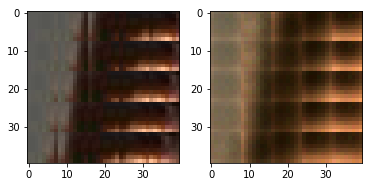

EPO: 12, recon_loss: 0.0124, total_loss: 0.0210, train_psnr:23.3575, validation_psnr:28.1307
EPO: 12, recon_loss: 0.0076, total_loss: 0.0134, train_psnr:23.3147, validation_psnr:27.6384
EPO: 12, recon_loss: 0.0101, total_loss: 0.0229, train_psnr:23.2778, validation_psnr:28.0360
EPO: 12, recon_loss: 0.0091, total_loss: 0.0203, train_psnr:23.2794, validation_psnr:27.8656
EPO: 12, recon_loss: 0.0443, total_loss: 0.0542, train_psnr:23.2484, validation_psnr:27.3753
EPO: 12, recon_loss: 0.0117, total_loss: 0.0200, train_psnr:23.2384, validation_psnr:27.7355
EPO: 12, recon_loss: 0.0300, total_loss: 0.0376, train_psnr:23.1596, validation_psnr:28.0971
EPO: 12, recon_loss: 0.0058, total_loss: 0.0149, train_psnr:23.0870, validation_psnr:28.5730
EPO: 12, recon_loss: 0.0017, total_loss: 0.0070, train_psnr:23.0489, validation_psnr:27.3781
EPO: 12, recon_loss: 0.0266, total_loss: 0.0341, train_psnr:23.0283, validation_psnr:27.5017
#########reconstruction test psnr: 26.3640 


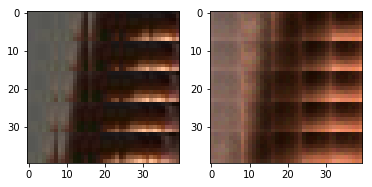

EPO: 12, recon_loss: 0.0129, total_loss: 0.0180, train_psnr:23.0119, validation_psnr:27.0819
EPO: 12, recon_loss: 0.0130, total_loss: 0.0197, train_psnr:22.9819, validation_psnr:27.0332
EPO: 12, recon_loss: 0.0145, total_loss: 0.0235, train_psnr:22.9609, validation_psnr:28.4120
EPO: 12, recon_loss: 0.0162, total_loss: 0.0275, train_psnr:23.0093, validation_psnr:28.6209
EPO: 12, recon_loss: 0.0227, total_loss: 0.0299, train_psnr:23.0181, validation_psnr:28.7405
EPO: 12, recon_loss: 0.0110, total_loss: 0.0184, train_psnr:23.0094, validation_psnr:28.8274
EPO: 12, recon_loss: 0.0070, total_loss: 0.0126, train_psnr:22.9899, validation_psnr:28.7799
EPO: 12, recon_loss: 0.0154, total_loss: 0.0233, train_psnr:23.0056, validation_psnr:28.6542
EPO: 12, recon_loss: 0.0086, total_loss: 0.0133, train_psnr:23.2401, validation_psnr:28.6520
EPO: 12, recon_loss: 0.0250, total_loss: 0.0342, train_psnr:23.3358, validation_psnr:28.6328
#########reconstruction test psnr: 27.2505 


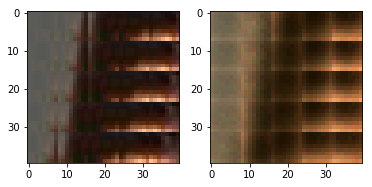

EPO: 12, recon_loss: 0.0100, total_loss: 0.0155, train_psnr:23.3822, validation_psnr:28.6200
EPO: 12, recon_loss: 0.0092, total_loss: 0.0150, train_psnr:23.4200, validation_psnr:28.4714
EPO: 12, recon_loss: 0.0164, total_loss: 0.0266, train_psnr:23.4575, validation_psnr:28.3224
EPO: 12, recon_loss: 0.0128, total_loss: 0.0216, train_psnr:23.4712, validation_psnr:28.1955
EPO: 12, recon_loss: 0.0141, total_loss: 0.0229, train_psnr:23.4078, validation_psnr:28.1747
EPO: 12, recon_loss: 0.0190, total_loss: 0.0261, train_psnr:23.2945, validation_psnr:28.4782
EPO: 12, recon_loss: 0.0173, total_loss: 0.0277, train_psnr:23.2579, validation_psnr:28.4414
EPO: 12, recon_loss: 0.0124, total_loss: 0.0350, train_psnr:23.1702, validation_psnr:28.9095
EPO: 12, recon_loss: 0.0093, total_loss: 0.0157, train_psnr:23.2640, validation_psnr:28.4365
EPO: 12, recon_loss: 0.0093, total_loss: 0.0156, train_psnr:23.2862, validation_psnr:28.4931
#########reconstruction test psnr: 27.1460 


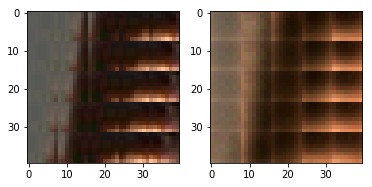

EPO: 12, recon_loss: 0.0078, total_loss: 0.0133, train_psnr:23.3331, validation_psnr:28.5170
EPO: 12, recon_loss: 0.0116, total_loss: 0.0205, train_psnr:23.3336, validation_psnr:28.6554
EPO: 12, recon_loss: 0.0125, total_loss: 0.0224, train_psnr:23.3383, validation_psnr:28.4352
EPO: 12, recon_loss: 0.0074, total_loss: 0.0157, train_psnr:23.3670, validation_psnr:28.2889
EPO: 12, recon_loss: 0.0224, total_loss: 0.0304, train_psnr:23.3153, validation_psnr:28.2608
EPO: 12, recon_loss: 0.0328, total_loss: 0.0423, train_psnr:23.2746, validation_psnr:27.9275
EPO: 12, recon_loss: 0.0172, total_loss: 0.0292, train_psnr:23.2246, validation_psnr:28.0568
EPO: 12, recon_loss: 0.0370, total_loss: 0.0459, train_psnr:23.1717, validation_psnr:28.0313
EPO: 12, recon_loss: 0.0075, total_loss: 0.0165, train_psnr:23.1224, validation_psnr:28.4622
EPO: 12, recon_loss: 0.0111, total_loss: 0.0200, train_psnr:23.0781, validation_psnr:28.2484
#########reconstruction test psnr: 26.9421 


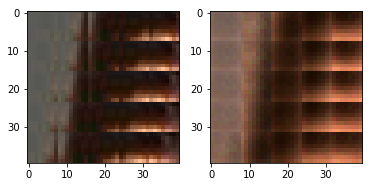

EPO: 12, recon_loss: 0.0208, total_loss: 0.0317, train_psnr:23.0358, validation_psnr:28.2973
EPO: 12, recon_loss: 0.0146, total_loss: 0.0231, train_psnr:22.9769, validation_psnr:28.3800
EPO: 12, recon_loss: 0.0260, total_loss: 0.0344, train_psnr:22.9073, validation_psnr:28.3688
EPO: 12, recon_loss: 0.0059, total_loss: 0.0080, train_psnr:23.0389, validation_psnr:28.4003
EPO: 12, recon_loss: 0.0044, total_loss: 0.0076, train_psnr:23.1275, validation_psnr:28.3972
EPO: 12, recon_loss: 0.0186, total_loss: 0.0259, train_psnr:23.1010, validation_psnr:28.1589
EPO: 12, recon_loss: 0.0083, total_loss: 0.0146, train_psnr:23.0844, validation_psnr:28.3070
EPO: 12, recon_loss: 0.0193, total_loss: 0.0247, train_psnr:23.0400, validation_psnr:28.4784
EPO: 12, recon_loss: 0.0279, total_loss: 0.0466, train_psnr:23.0506, validation_psnr:28.9667
EPO: 12, recon_loss: 0.0137, total_loss: 0.0335, train_psnr:23.0996, validation_psnr:29.0186
#########reconstruction test psnr: 27.5594 


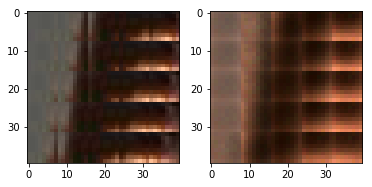

EPO: 12, recon_loss: 0.0349, total_loss: 0.0566, train_psnr:23.0694, validation_psnr:28.7870
EPO: 12, recon_loss: 0.0183, total_loss: 0.0393, train_psnr:23.0899, validation_psnr:29.0648
EPO: 12, recon_loss: 0.0271, total_loss: 0.0524, train_psnr:23.0518, validation_psnr:28.9543
EPO: 12, recon_loss: 0.0079, total_loss: 0.0224, train_psnr:23.1211, validation_psnr:28.1917
EPO: 12, recon_loss: 0.0191, total_loss: 0.0252, train_psnr:23.1665, validation_psnr:27.7793
EPO: 12, recon_loss: 0.0204, total_loss: 0.0375, train_psnr:23.2033, validation_psnr:28.7781
EPO: 12, recon_loss: 0.0139, total_loss: 0.0249, train_psnr:23.2287, validation_psnr:28.6476
EPO: 12, recon_loss: 0.0179, total_loss: 0.0275, train_psnr:23.2520, validation_psnr:28.7233
EPO: 12, recon_loss: 0.0114, total_loss: 0.0313, train_psnr:23.2191, validation_psnr:29.0107
EPO: 12, recon_loss: 0.0133, total_loss: 0.0258, train_psnr:23.2782, validation_psnr:28.9426
#########reconstruction test psnr: 27.5398 


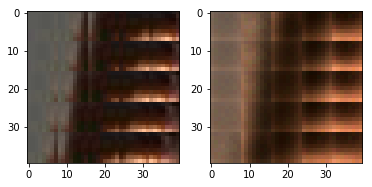

EPO: 12, recon_loss: 0.0352, total_loss: 0.0469, train_psnr:23.2577, validation_psnr:29.0469
EPO: 12, recon_loss: 0.0079, total_loss: 0.0185, train_psnr:23.2844, validation_psnr:28.9698
EPO: 12, recon_loss: 0.0079, total_loss: 0.0196, train_psnr:23.2695, validation_psnr:28.8163
EPO: 12, recon_loss: 0.0169, total_loss: 0.0281, train_psnr:23.2491, validation_psnr:28.3404
EPO: 12, recon_loss: 0.0052, total_loss: 0.0169, train_psnr:23.1765, validation_psnr:28.7752
EPO: 12, recon_loss: 0.0349, total_loss: 0.0440, train_psnr:23.1385, validation_psnr:28.6193
EPO: 12, recon_loss: 0.0067, total_loss: 0.0161, train_psnr:23.0566, validation_psnr:28.6655
EPO: 12, recon_loss: 0.0133, total_loss: 0.0235, train_psnr:22.9980, validation_psnr:28.6667
EPO: 12, recon_loss: 0.0110, total_loss: 0.0176, train_psnr:23.0018, validation_psnr:27.9868
EPO: 12, recon_loss: 0.0070, total_loss: 0.0194, train_psnr:23.0422, validation_psnr:28.3434
#########reconstruction test psnr: 27.0968 


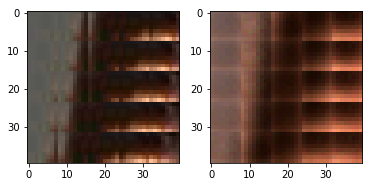

EPO: 12, recon_loss: 0.0353, total_loss: 0.0432, train_psnr:23.0788, validation_psnr:28.1692
EPO: 12, recon_loss: 0.0113, total_loss: 0.0230, train_psnr:23.0996, validation_psnr:28.4480
EPO: 12, recon_loss: 0.0132, total_loss: 0.0208, train_psnr:23.0728, validation_psnr:28.6250
EPO: 12, recon_loss: 0.0155, total_loss: 0.0329, train_psnr:23.0716, validation_psnr:28.4196
EPO: 12, recon_loss: 0.0056, total_loss: 0.0143, train_psnr:23.0873, validation_psnr:28.2715
EPO: 12, recon_loss: 0.0366, total_loss: 0.0483, train_psnr:23.0993, validation_psnr:28.4847
EPO: 12, recon_loss: 0.0088, total_loss: 0.0125, train_psnr:23.1134, validation_psnr:28.0214
EPO: 12, recon_loss: 0.0174, total_loss: 0.0261, train_psnr:23.0717, validation_psnr:28.2576
EPO: 12, recon_loss: 0.0094, total_loss: 0.0232, train_psnr:23.0574, validation_psnr:28.8937
EPO: 12, recon_loss: 0.0051, total_loss: 0.0144, train_psnr:23.2513, validation_psnr:28.5813
#########reconstruction test psnr: 27.2352 


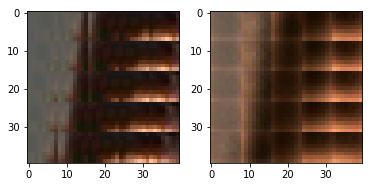

EPO: 12, recon_loss: 0.0256, total_loss: 0.0327, train_psnr:23.2665, validation_psnr:28.7387
EPO: 12, recon_loss: 0.0052, total_loss: 0.0115, train_psnr:23.3156, validation_psnr:28.4881
EPO: 12, recon_loss: 0.0151, total_loss: 0.0209, train_psnr:23.3256, validation_psnr:28.4479
EPO: 12, recon_loss: 0.0320, total_loss: 0.0523, train_psnr:23.3014, validation_psnr:28.1675
EPO: 12, recon_loss: 0.0265, total_loss: 0.0438, train_psnr:23.1975, validation_psnr:27.9196
EPO: 12, recon_loss: 0.0223, total_loss: 0.0298, train_psnr:23.0566, validation_psnr:27.4074
EPO: 12, recon_loss: 0.0212, total_loss: 0.0329, train_psnr:22.9326, validation_psnr:27.6426
EPO: 12, recon_loss: 0.0187, total_loss: 0.0255, train_psnr:22.8613, validation_psnr:27.7419
EPO: 12, recon_loss: 0.0106, total_loss: 0.0334, train_psnr:22.7762, validation_psnr:28.1949
EPO: 12, recon_loss: 0.0052, total_loss: 0.0224, train_psnr:22.8284, validation_psnr:27.8827
#########reconstruction test psnr: 26.6456 


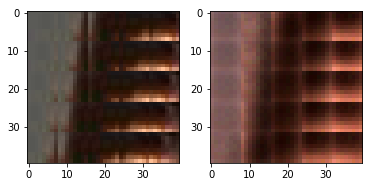

EPO: 12, recon_loss: 0.0121, total_loss: 0.0230, train_psnr:22.8667, validation_psnr:27.8168
EPO: 12, recon_loss: 0.0158, total_loss: 0.0258, train_psnr:22.9454, validation_psnr:28.3412
EPO: 12, recon_loss: 0.0208, total_loss: 0.0319, train_psnr:23.0028, validation_psnr:28.4353
EPO: 12, recon_loss: 0.0110, total_loss: 0.0186, train_psnr:23.0031, validation_psnr:28.4476
EPO: 12, recon_loss: 0.0033, total_loss: 0.0055, train_psnr:23.1852, validation_psnr:28.4200
EPO: 12, recon_loss: 0.0126, total_loss: 0.0166, train_psnr:23.2396, validation_psnr:28.6627
EPO: 12, recon_loss: 0.0068, total_loss: 0.0097, train_psnr:23.2814, validation_psnr:28.5579
EPO: 12, recon_loss: 0.0050, total_loss: 0.0079, train_psnr:23.3436, validation_psnr:28.4950
EPO: 12, recon_loss: 0.0131, total_loss: 0.0174, train_psnr:23.3556, validation_psnr:27.7791
EPO: 12, recon_loss: 0.0125, total_loss: 0.0206, train_psnr:23.3415, validation_psnr:27.9222
#########reconstruction test psnr: 26.7127 


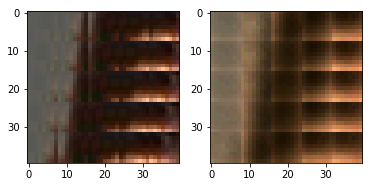

EPO: 12, recon_loss: 0.0194, total_loss: 0.0273, train_psnr:23.3381, validation_psnr:27.9029
EPO: 12, recon_loss: 0.0144, total_loss: 0.0216, train_psnr:23.3118, validation_psnr:27.8319
EPO: 12, recon_loss: 0.0130, total_loss: 0.0171, train_psnr:23.3648, validation_psnr:27.7921
EPO: 12, recon_loss: 0.0242, total_loss: 0.0276, train_psnr:23.3495, validation_psnr:27.8188
EPO: 12, recon_loss: 0.0149, total_loss: 0.0241, train_psnr:23.3472, validation_psnr:28.2411
EPO: 12, recon_loss: 0.0221, total_loss: 0.0317, train_psnr:23.2425, validation_psnr:28.3776
EPO: 12, recon_loss: 0.0206, total_loss: 0.0259, train_psnr:23.1560, validation_psnr:28.3044
EPO: 12, recon_loss: 0.0156, total_loss: 0.0230, train_psnr:23.0663, validation_psnr:28.2597
EPO: 12, recon_loss: 0.0221, total_loss: 0.0285, train_psnr:22.9795, validation_psnr:28.2172
EPO: 12, recon_loss: 0.0225, total_loss: 0.0417, train_psnr:23.0559, validation_psnr:28.2045
#########reconstruction test psnr: 26.9174 


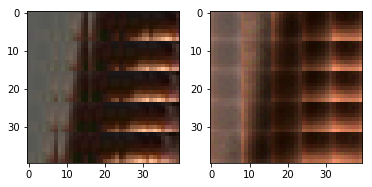

EPO: 12, recon_loss: 0.0237, total_loss: 0.0307, train_psnr:23.1773, validation_psnr:28.1615
EPO: 12, recon_loss: 0.0220, total_loss: 0.0305, train_psnr:22.3007, validation_psnr:28.8963
EPO: 12, recon_loss: 0.0247, total_loss: 0.0335, train_psnr:20.4806, validation_psnr:28.0921
EPO: 12, recon_loss: 0.0214, total_loss: 0.0322, train_psnr:21.1014, validation_psnr:28.1688
EPO: 12, recon_loss: 0.0045, total_loss: 0.0117, train_psnr:23.2600, validation_psnr:27.0645
EPO: 12, recon_loss: 0.0086, total_loss: 0.0162, train_psnr:23.2501, validation_psnr:27.1468
EPO: 12, recon_loss: 0.0187, total_loss: 0.0234, train_psnr:23.2088, validation_psnr:27.4318
EPO: 12, recon_loss: 0.0167, total_loss: 0.0262, train_psnr:23.1616, validation_psnr:27.2011
EPO: 12, recon_loss: 0.0356, total_loss: 0.0421, train_psnr:23.1111, validation_psnr:27.5153
EPO: 12, recon_loss: 0.0070, total_loss: 0.0221, train_psnr:23.1285, validation_psnr:28.3352
#########reconstruction test psnr: 27.0282 


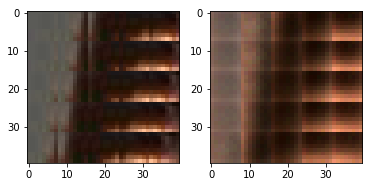

EPO: 12, recon_loss: 0.0063, total_loss: 0.0132, train_psnr:23.1076, validation_psnr:27.9005
EPO: 12, recon_loss: 0.0113, total_loss: 0.0186, train_psnr:23.1218, validation_psnr:27.9236
EPO: 12, recon_loss: 0.0027, total_loss: 0.0057, train_psnr:23.1454, validation_psnr:28.1152
EPO: 12, recon_loss: 0.0056, total_loss: 0.0094, train_psnr:23.1339, validation_psnr:27.9739
EPO: 12, recon_loss: 0.0150, total_loss: 0.0247, train_psnr:23.2180, validation_psnr:28.3938
EPO: 12, recon_loss: 0.0123, total_loss: 0.0227, train_psnr:23.2428, validation_psnr:28.4293
EPO: 12, recon_loss: 0.0245, total_loss: 0.0333, train_psnr:23.2473, validation_psnr:28.3267
EPO: 12, recon_loss: 0.0154, total_loss: 0.0249, train_psnr:23.2836, validation_psnr:28.5265
EPO: 12, recon_loss: 0.0156, total_loss: 0.0205, train_psnr:23.2728, validation_psnr:28.4137
EPO: 13, recon_loss: 0.0063, total_loss: 0.0102, train_psnr:23.3628, validation_psnr:28.0555
#########reconstruction test psnr: 26.8335 


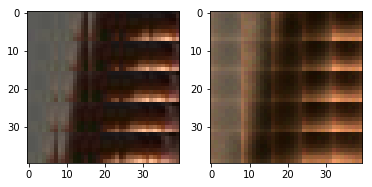

EPO: 13, recon_loss: 0.0056, total_loss: 0.0085, train_psnr:23.4071, validation_psnr:28.1284
EPO: 13, recon_loss: 0.0189, total_loss: 0.0224, train_psnr:23.3884, validation_psnr:28.3844
EPO: 13, recon_loss: 0.0059, total_loss: 0.0105, train_psnr:23.3921, validation_psnr:28.1915
EPO: 13, recon_loss: 0.0114, total_loss: 0.0164, train_psnr:23.3577, validation_psnr:28.2254
EPO: 13, recon_loss: 0.0054, total_loss: 0.0191, train_psnr:23.2869, validation_psnr:28.9071
EPO: 13, recon_loss: 0.0052, total_loss: 0.0152, train_psnr:23.2851, validation_psnr:28.8390
EPO: 13, recon_loss: 0.0120, total_loss: 0.0192, train_psnr:23.2766, validation_psnr:28.6976
EPO: 13, recon_loss: 0.0095, total_loss: 0.0141, train_psnr:23.2799, validation_psnr:28.7302
EPO: 13, recon_loss: 0.0162, total_loss: 0.0244, train_psnr:23.1720, validation_psnr:28.0325
EPO: 13, recon_loss: 0.0058, total_loss: 0.0183, train_psnr:23.2601, validation_psnr:28.4210
#########reconstruction test psnr: 27.1153 


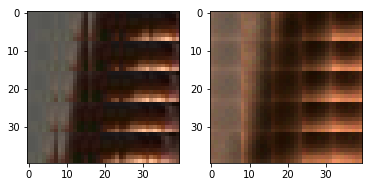

EPO: 13, recon_loss: 0.0039, total_loss: 0.0090, train_psnr:23.2504, validation_psnr:28.3477
EPO: 13, recon_loss: 0.0106, total_loss: 0.0188, train_psnr:23.2710, validation_psnr:28.3684
EPO: 13, recon_loss: 0.0072, total_loss: 0.0096, train_psnr:23.2619, validation_psnr:28.3889
EPO: 13, recon_loss: 0.0142, total_loss: 0.0203, train_psnr:23.2509, validation_psnr:27.8000
EPO: 13, recon_loss: 0.0105, total_loss: 0.0193, train_psnr:23.2093, validation_psnr:28.8193
EPO: 13, recon_loss: 0.0105, total_loss: 0.0167, train_psnr:23.0095, validation_psnr:28.7551
EPO: 13, recon_loss: 0.0123, total_loss: 0.0193, train_psnr:22.8573, validation_psnr:28.6845
EPO: 13, recon_loss: 0.0103, total_loss: 0.0171, train_psnr:22.7582, validation_psnr:28.6840
EPO: 13, recon_loss: 0.0083, total_loss: 0.0134, train_psnr:22.6321, validation_psnr:28.5649
EPO: 13, recon_loss: 0.0115, total_loss: 0.0158, train_psnr:22.6710, validation_psnr:28.8178
#########reconstruction test psnr: 27.4014 


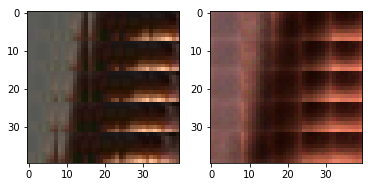

EPO: 13, recon_loss: 0.0060, total_loss: 0.0117, train_psnr:22.8780, validation_psnr:28.8412
EPO: 13, recon_loss: 0.0175, total_loss: 0.0234, train_psnr:23.0026, validation_psnr:28.6919
EPO: 13, recon_loss: 0.0116, total_loss: 0.0158, train_psnr:23.0528, validation_psnr:28.7418
EPO: 13, recon_loss: 0.0107, total_loss: 0.0142, train_psnr:23.1263, validation_psnr:28.6363
EPO: 13, recon_loss: 0.0321, total_loss: 0.0496, train_psnr:23.1430, validation_psnr:28.6551
EPO: 13, recon_loss: 0.0106, total_loss: 0.0207, train_psnr:23.1174, validation_psnr:28.0276
EPO: 13, recon_loss: 0.0205, total_loss: 0.0313, train_psnr:23.1643, validation_psnr:28.0909
EPO: 13, recon_loss: 0.0273, total_loss: 0.0388, train_psnr:23.1896, validation_psnr:28.0477
EPO: 13, recon_loss: 0.0156, total_loss: 0.0234, train_psnr:23.2026, validation_psnr:28.2291
EPO: 13, recon_loss: 0.0127, total_loss: 0.0239, train_psnr:23.2256, validation_psnr:27.9943
#########reconstruction test psnr: 26.7918 


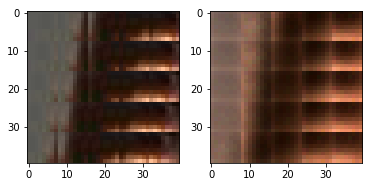

EPO: 13, recon_loss: 0.0122, total_loss: 0.0195, train_psnr:23.3940, validation_psnr:28.2712
EPO: 13, recon_loss: 0.0174, total_loss: 0.0256, train_psnr:23.4618, validation_psnr:27.6099
EPO: 13, recon_loss: 0.0102, total_loss: 0.0135, train_psnr:23.5073, validation_psnr:27.5909
EPO: 13, recon_loss: 0.0126, total_loss: 0.0163, train_psnr:23.5215, validation_psnr:27.2782
EPO: 13, recon_loss: 0.0055, total_loss: 0.0097, train_psnr:23.5232, validation_psnr:26.8610
EPO: 13, recon_loss: 0.0053, total_loss: 0.0092, train_psnr:23.5062, validation_psnr:27.6650
EPO: 13, recon_loss: 0.0055, total_loss: 0.0113, train_psnr:23.4651, validation_psnr:28.2034
EPO: 13, recon_loss: 0.0111, total_loss: 0.0164, train_psnr:23.4489, validation_psnr:28.1626
EPO: 13, recon_loss: 0.0094, total_loss: 0.0181, train_psnr:23.4105, validation_psnr:28.5874
EPO: 13, recon_loss: 0.0143, total_loss: 0.0270, train_psnr:23.3698, validation_psnr:28.5099
#########reconstruction test psnr: 27.1357 


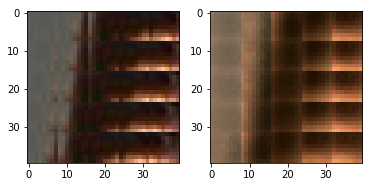

EPO: 13, recon_loss: 0.0059, total_loss: 0.0170, train_psnr:23.4212, validation_psnr:28.5414
EPO: 13, recon_loss: 0.0088, total_loss: 0.0182, train_psnr:23.4554, validation_psnr:28.5903
EPO: 13, recon_loss: 0.0116, total_loss: 0.0183, train_psnr:23.4766, validation_psnr:28.2956
EPO: 13, recon_loss: 0.0048, total_loss: 0.0111, train_psnr:23.5033, validation_psnr:28.5194
EPO: 13, recon_loss: 0.0206, total_loss: 0.0310, train_psnr:23.4844, validation_psnr:28.5378
EPO: 13, recon_loss: 0.0300, total_loss: 0.0470, train_psnr:23.4982, validation_psnr:29.1934
EPO: 13, recon_loss: 0.0140, total_loss: 0.0229, train_psnr:23.5585, validation_psnr:28.6611
EPO: 13, recon_loss: 0.0213, total_loss: 0.0266, train_psnr:23.5270, validation_psnr:28.7640
EPO: 13, recon_loss: 0.0081, total_loss: 0.0124, train_psnr:23.5455, validation_psnr:28.6305
EPO: 13, recon_loss: 0.0167, total_loss: 0.0212, train_psnr:23.5112, validation_psnr:28.7332
#########reconstruction test psnr: 27.3834 


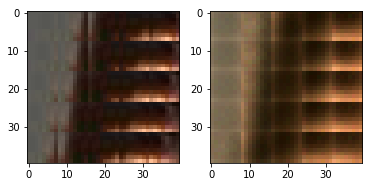

EPO: 13, recon_loss: 0.0136, total_loss: 0.0207, train_psnr:23.5713, validation_psnr:28.3409
EPO: 13, recon_loss: 0.0138, total_loss: 0.0209, train_psnr:23.5673, validation_psnr:28.6601
EPO: 13, recon_loss: 0.0168, total_loss: 0.0262, train_psnr:23.5435, validation_psnr:28.3709
EPO: 13, recon_loss: 0.0156, total_loss: 0.0217, train_psnr:23.5196, validation_psnr:28.5362
EPO: 13, recon_loss: 0.0281, total_loss: 0.0342, train_psnr:23.4673, validation_psnr:28.5635
EPO: 13, recon_loss: 0.0181, total_loss: 0.0310, train_psnr:23.3798, validation_psnr:28.7749
EPO: 13, recon_loss: 0.0252, total_loss: 0.0377, train_psnr:23.2957, validation_psnr:29.0461
EPO: 13, recon_loss: 0.0418, total_loss: 0.0551, train_psnr:23.3077, validation_psnr:28.9234
EPO: 13, recon_loss: 0.0198, total_loss: 0.0329, train_psnr:23.2423, validation_psnr:29.0228
EPO: 13, recon_loss: 0.0198, total_loss: 0.0320, train_psnr:23.1567, validation_psnr:28.8338
#########reconstruction test psnr: 27.4725 


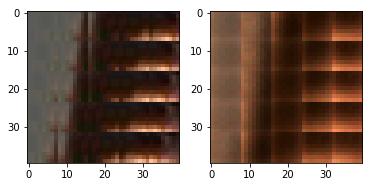

EPO: 13, recon_loss: 0.0107, total_loss: 0.0186, train_psnr:23.3414, validation_psnr:28.2382
EPO: 13, recon_loss: 0.0094, total_loss: 0.0187, train_psnr:23.3529, validation_psnr:28.0996
EPO: 13, recon_loss: 0.0163, total_loss: 0.0240, train_psnr:23.2694, validation_psnr:27.5242
EPO: 13, recon_loss: 0.0148, total_loss: 0.0242, train_psnr:23.3710, validation_psnr:28.3997
EPO: 13, recon_loss: 0.0229, total_loss: 0.0326, train_psnr:23.3327, validation_psnr:28.7584
EPO: 13, recon_loss: 0.0067, total_loss: 0.0183, train_psnr:23.3231, validation_psnr:28.3183
EPO: 13, recon_loss: 0.0093, total_loss: 0.0188, train_psnr:23.3099, validation_psnr:27.7967
EPO: 13, recon_loss: 0.0296, total_loss: 0.0380, train_psnr:23.2302, validation_psnr:28.1986
EPO: 13, recon_loss: 0.0063, total_loss: 0.0172, train_psnr:23.3243, validation_psnr:27.9058
EPO: 13, recon_loss: 0.0129, total_loss: 0.0206, train_psnr:23.3045, validation_psnr:28.2535
#########reconstruction test psnr: 27.0224 


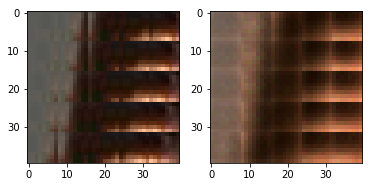

EPO: 13, recon_loss: 0.0155, total_loss: 0.0377, train_psnr:23.3322, validation_psnr:28.1437
EPO: 13, recon_loss: 0.0125, total_loss: 0.0321, train_psnr:23.3429, validation_psnr:28.6204
EPO: 13, recon_loss: 0.0580, total_loss: 0.0761, train_psnr:23.3587, validation_psnr:28.9463
EPO: 13, recon_loss: 0.0110, total_loss: 0.0298, train_psnr:23.4426, validation_psnr:28.6926
EPO: 13, recon_loss: 0.0138, total_loss: 0.0346, train_psnr:23.4176, validation_psnr:28.5692
EPO: 13, recon_loss: 0.0236, total_loss: 0.0402, train_psnr:23.3385, validation_psnr:29.2034
EPO: 13, recon_loss: 0.0146, total_loss: 0.0360, train_psnr:23.2798, validation_psnr:28.9462
EPO: 13, recon_loss: 0.0546, total_loss: 0.0704, train_psnr:23.2373, validation_psnr:28.6153
EPO: 13, recon_loss: 0.0206, total_loss: 0.0415, train_psnr:23.3029, validation_psnr:28.6973
EPO: 13, recon_loss: 0.0246, total_loss: 0.0439, train_psnr:23.2433, validation_psnr:28.6185
#########reconstruction test psnr: 27.3516 


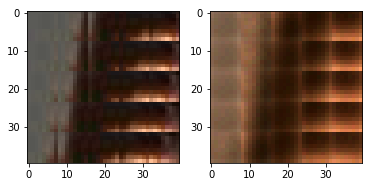

EPO: 13, recon_loss: 0.0116, total_loss: 0.0311, train_psnr:23.3654, validation_psnr:27.9767
EPO: 13, recon_loss: 0.0109, total_loss: 0.0272, train_psnr:23.3897, validation_psnr:27.6086
EPO: 13, recon_loss: 0.0518, total_loss: 0.0644, train_psnr:23.4434, validation_psnr:28.0311
EPO: 13, recon_loss: 0.0450, total_loss: 0.0509, train_psnr:23.4613, validation_psnr:27.1603
EPO: 13, recon_loss: 0.0093, total_loss: 0.0162, train_psnr:23.3913, validation_psnr:27.3599
EPO: 13, recon_loss: 0.0087, total_loss: 0.0159, train_psnr:23.3357, validation_psnr:27.9581
EPO: 13, recon_loss: 0.0057, total_loss: 0.0159, train_psnr:23.4815, validation_psnr:27.9771
EPO: 13, recon_loss: 0.0249, total_loss: 0.0323, train_psnr:23.4541, validation_psnr:28.6567
EPO: 13, recon_loss: 0.0097, total_loss: 0.0216, train_psnr:23.4376, validation_psnr:28.7260
EPO: 13, recon_loss: 0.0152, total_loss: 0.0263, train_psnr:23.4079, validation_psnr:28.9627
#########reconstruction test psnr: 27.5340 


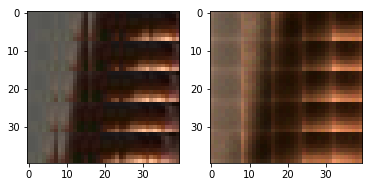

EPO: 13, recon_loss: 0.0061, total_loss: 0.0135, train_psnr:23.4015, validation_psnr:28.8703
EPO: 13, recon_loss: 0.0019, total_loss: 0.0050, train_psnr:23.3318, validation_psnr:29.0002
EPO: 13, recon_loss: 0.0046, total_loss: 0.0084, train_psnr:23.3021, validation_psnr:28.9984
EPO: 13, recon_loss: 0.0031, total_loss: 0.0048, train_psnr:23.3695, validation_psnr:28.6115
EPO: 13, recon_loss: 0.0045, total_loss: 0.0070, train_psnr:23.3088, validation_psnr:28.6276
EPO: 13, recon_loss: 0.0175, total_loss: 0.0365, train_psnr:23.2871, validation_psnr:28.5013
EPO: 13, recon_loss: 0.0093, total_loss: 0.0166, train_psnr:23.2154, validation_psnr:28.0661
EPO: 13, recon_loss: 0.0184, total_loss: 0.0258, train_psnr:23.0845, validation_psnr:27.6846
EPO: 13, recon_loss: 0.0156, total_loss: 0.0197, train_psnr:22.9851, validation_psnr:27.7736
EPO: 13, recon_loss: 0.0111, total_loss: 0.0139, train_psnr:22.8425, validation_psnr:27.6866
#########reconstruction test psnr: 26.5404 


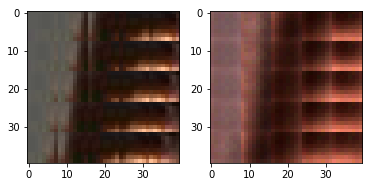

EPO: 13, recon_loss: 0.0202, total_loss: 0.0359, train_psnr:22.7444, validation_psnr:26.9074
EPO: 13, recon_loss: 0.0199, total_loss: 0.0326, train_psnr:23.0321, validation_psnr:27.7442
EPO: 13, recon_loss: 0.0288, total_loss: 0.0421, train_psnr:23.1549, validation_psnr:27.9863
EPO: 13, recon_loss: 0.0255, total_loss: 0.0398, train_psnr:23.2106, validation_psnr:27.7474
EPO: 13, recon_loss: 0.0122, total_loss: 0.0208, train_psnr:23.3113, validation_psnr:27.8521
EPO: 13, recon_loss: 0.0188, total_loss: 0.0265, train_psnr:23.3447, validation_psnr:27.7177
EPO: 13, recon_loss: 0.0130, total_loss: 0.0177, train_psnr:23.4994, validation_psnr:27.7148
EPO: 13, recon_loss: 0.0129, total_loss: 0.0174, train_psnr:23.5471, validation_psnr:27.9786
EPO: 13, recon_loss: 0.0116, total_loss: 0.0179, train_psnr:23.5723, validation_psnr:28.0477
EPO: 13, recon_loss: 0.0101, total_loss: 0.0150, train_psnr:23.5967, validation_psnr:28.1915
#########reconstruction test psnr: 26.8980 


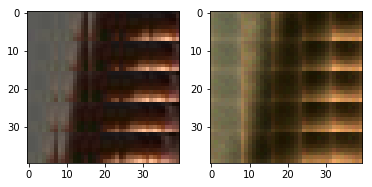

EPO: 13, recon_loss: 0.0148, total_loss: 0.0220, train_psnr:23.6381, validation_psnr:27.9891
EPO: 13, recon_loss: 0.0113, total_loss: 0.0227, train_psnr:23.6442, validation_psnr:28.3051
EPO: 13, recon_loss: 0.0099, total_loss: 0.0181, train_psnr:23.6338, validation_psnr:27.7442
EPO: 13, recon_loss: 0.0239, total_loss: 0.0308, train_psnr:23.5921, validation_psnr:28.2170
EPO: 13, recon_loss: 0.0211, total_loss: 0.0283, train_psnr:23.5955, validation_psnr:27.9515
EPO: 13, recon_loss: 0.0130, total_loss: 0.0217, train_psnr:23.5846, validation_psnr:28.2493
EPO: 13, recon_loss: 0.0046, total_loss: 0.0085, train_psnr:23.6279, validation_psnr:28.0164
EPO: 13, recon_loss: 0.0066, total_loss: 0.0105, train_psnr:23.6454, validation_psnr:28.0552
EPO: 13, recon_loss: 0.0109, total_loss: 0.0170, train_psnr:23.6475, validation_psnr:27.5704
EPO: 13, recon_loss: 0.0044, total_loss: 0.0079, train_psnr:23.6710, validation_psnr:27.7326
#########reconstruction test psnr: 26.5949 


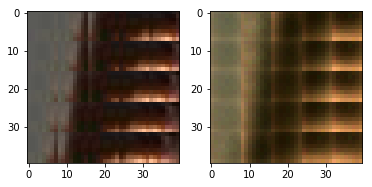

EPO: 13, recon_loss: 0.0094, total_loss: 0.0129, train_psnr:23.6582, validation_psnr:27.7948
EPO: 13, recon_loss: 0.0102, total_loss: 0.0163, train_psnr:23.6453, validation_psnr:28.3805
EPO: 13, recon_loss: 0.0117, total_loss: 0.0182, train_psnr:23.6264, validation_psnr:28.3043
EPO: 13, recon_loss: 0.0204, total_loss: 0.0281, train_psnr:23.6017, validation_psnr:28.2489
EPO: 13, recon_loss: 0.0112, total_loss: 0.0191, train_psnr:23.5536, validation_psnr:28.1062
EPO: 13, recon_loss: 0.0074, total_loss: 0.0124, train_psnr:23.4985, validation_psnr:27.8198
EPO: 13, recon_loss: 0.0072, total_loss: 0.0180, train_psnr:23.4701, validation_psnr:28.2258
EPO: 13, recon_loss: 0.0073, total_loss: 0.0187, train_psnr:23.4603, validation_psnr:28.0578
EPO: 13, recon_loss: 0.0396, total_loss: 0.0496, train_psnr:23.4238, validation_psnr:27.7999
EPO: 13, recon_loss: 0.0104, total_loss: 0.0185, train_psnr:23.4202, validation_psnr:27.9637
#########reconstruction test psnr: 26.8146 


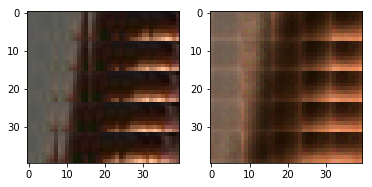

EPO: 13, recon_loss: 0.0483, total_loss: 0.0582, train_psnr:23.2943, validation_psnr:28.1511
EPO: 13, recon_loss: 0.0046, total_loss: 0.0115, train_psnr:23.2858, validation_psnr:28.5874
EPO: 13, recon_loss: 0.0020, total_loss: 0.0076, train_psnr:23.2243, validation_psnr:27.3694
EPO: 13, recon_loss: 0.0305, total_loss: 0.0375, train_psnr:23.2254, validation_psnr:27.2888
EPO: 13, recon_loss: 0.0100, total_loss: 0.0150, train_psnr:23.1976, validation_psnr:27.4789
EPO: 13, recon_loss: 0.0107, total_loss: 0.0171, train_psnr:23.1551, validation_psnr:27.5378
EPO: 13, recon_loss: 0.0121, total_loss: 0.0214, train_psnr:23.1617, validation_psnr:28.6118
EPO: 13, recon_loss: 0.0137, total_loss: 0.0238, train_psnr:23.1945, validation_psnr:28.8527
EPO: 13, recon_loss: 0.0276, total_loss: 0.0352, train_psnr:23.2008, validation_psnr:28.7526
EPO: 13, recon_loss: 0.0069, total_loss: 0.0137, train_psnr:23.1925, validation_psnr:28.9669
#########reconstruction test psnr: 27.5654 


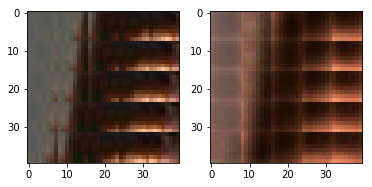

EPO: 13, recon_loss: 0.0098, total_loss: 0.0154, train_psnr:23.1571, validation_psnr:28.9354
EPO: 13, recon_loss: 0.0119, total_loss: 0.0179, train_psnr:23.2249, validation_psnr:28.8266
EPO: 13, recon_loss: 0.0089, total_loss: 0.0127, train_psnr:23.4668, validation_psnr:28.7803
EPO: 13, recon_loss: 0.0208, total_loss: 0.0307, train_psnr:23.5252, validation_psnr:28.7660
EPO: 13, recon_loss: 0.0079, total_loss: 0.0127, train_psnr:23.5468, validation_psnr:28.8147
EPO: 13, recon_loss: 0.0093, total_loss: 0.0154, train_psnr:23.5972, validation_psnr:28.6322
EPO: 13, recon_loss: 0.0196, total_loss: 0.0307, train_psnr:23.6347, validation_psnr:28.6345
EPO: 13, recon_loss: 0.0107, total_loss: 0.0205, train_psnr:23.6547, validation_psnr:28.3543
EPO: 13, recon_loss: 0.0196, total_loss: 0.0267, train_psnr:23.5762, validation_psnr:28.3627
EPO: 13, recon_loss: 0.0136, total_loss: 0.0224, train_psnr:23.4756, validation_psnr:28.6539
#########reconstruction test psnr: 27.3290 


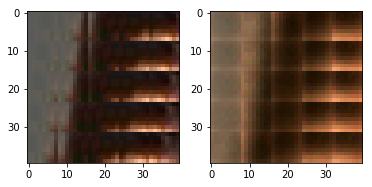

EPO: 13, recon_loss: 0.0163, total_loss: 0.0251, train_psnr:23.4304, validation_psnr:28.7515
EPO: 13, recon_loss: 0.0153, total_loss: 0.0353, train_psnr:23.3286, validation_psnr:29.2820
EPO: 13, recon_loss: 0.0048, total_loss: 0.0102, train_psnr:23.4622, validation_psnr:28.6132
EPO: 13, recon_loss: 0.0124, total_loss: 0.0182, train_psnr:23.4591, validation_psnr:28.8084
EPO: 13, recon_loss: 0.0080, total_loss: 0.0145, train_psnr:23.5177, validation_psnr:28.7856
EPO: 13, recon_loss: 0.0089, total_loss: 0.0157, train_psnr:23.5174, validation_psnr:28.8697
EPO: 13, recon_loss: 0.0134, total_loss: 0.0237, train_psnr:23.5235, validation_psnr:28.4880
EPO: 13, recon_loss: 0.0072, total_loss: 0.0146, train_psnr:23.5517, validation_psnr:28.5108
EPO: 13, recon_loss: 0.0211, total_loss: 0.0290, train_psnr:23.4553, validation_psnr:28.5969
EPO: 13, recon_loss: 0.0215, total_loss: 0.0306, train_psnr:23.4513, validation_psnr:28.4758
#########reconstruction test psnr: 27.2183 


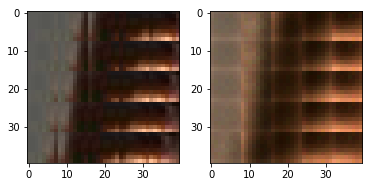

EPO: 13, recon_loss: 0.0235, total_loss: 0.0344, train_psnr:23.3912, validation_psnr:28.2346
EPO: 13, recon_loss: 0.0147, total_loss: 0.0320, train_psnr:23.3618, validation_psnr:28.1472
EPO: 13, recon_loss: 0.0094, total_loss: 0.0186, train_psnr:23.3017, validation_psnr:28.5139
EPO: 13, recon_loss: 0.0115, total_loss: 0.0211, train_psnr:23.2576, validation_psnr:28.3609
EPO: 13, recon_loss: 0.0193, total_loss: 0.0277, train_psnr:23.2148, validation_psnr:28.5406
EPO: 13, recon_loss: 0.0181, total_loss: 0.0265, train_psnr:23.1462, validation_psnr:28.6060
EPO: 13, recon_loss: 0.0105, total_loss: 0.0143, train_psnr:23.0872, validation_psnr:28.4977
EPO: 13, recon_loss: 0.0055, total_loss: 0.0082, train_psnr:23.2482, validation_psnr:28.5755
EPO: 13, recon_loss: 0.0057, total_loss: 0.0087, train_psnr:23.3188, validation_psnr:28.6728
EPO: 13, recon_loss: 0.0123, total_loss: 0.0189, train_psnr:23.2778, validation_psnr:28.4557
#########reconstruction test psnr: 27.1113 


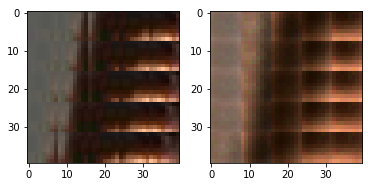

EPO: 13, recon_loss: 0.0107, total_loss: 0.0170, train_psnr:23.2663, validation_psnr:28.4911
EPO: 13, recon_loss: 0.0166, total_loss: 0.0227, train_psnr:23.2202, validation_psnr:28.6646
EPO: 13, recon_loss: 0.0215, total_loss: 0.0415, train_psnr:23.2038, validation_psnr:29.2901
EPO: 13, recon_loss: 0.0117, total_loss: 0.0289, train_psnr:23.2730, validation_psnr:29.2179
EPO: 13, recon_loss: 0.0278, total_loss: 0.0490, train_psnr:23.2662, validation_psnr:29.2174
EPO: 13, recon_loss: 0.0202, total_loss: 0.0437, train_psnr:23.2549, validation_psnr:29.1286
EPO: 13, recon_loss: 0.0233, total_loss: 0.0481, train_psnr:23.2045, validation_psnr:29.2023
EPO: 13, recon_loss: 0.0071, total_loss: 0.0184, train_psnr:23.2872, validation_psnr:27.9688
EPO: 13, recon_loss: 0.0268, total_loss: 0.0361, train_psnr:23.3166, validation_psnr:27.8685
EPO: 13, recon_loss: 0.0142, total_loss: 0.0310, train_psnr:23.3760, validation_psnr:29.1265
#########reconstruction test psnr: 27.7399 


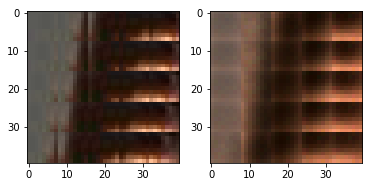

EPO: 13, recon_loss: 0.0142, total_loss: 0.0248, train_psnr:23.4051, validation_psnr:28.9050
EPO: 13, recon_loss: 0.0187, total_loss: 0.0300, train_psnr:23.4173, validation_psnr:29.0151
EPO: 13, recon_loss: 0.0128, total_loss: 0.0294, train_psnr:23.4231, validation_psnr:29.0168
EPO: 13, recon_loss: 0.0170, total_loss: 0.0292, train_psnr:23.4493, validation_psnr:29.1062
EPO: 13, recon_loss: 0.0248, total_loss: 0.0377, train_psnr:23.4719, validation_psnr:29.1840
EPO: 13, recon_loss: 0.0083, total_loss: 0.0199, train_psnr:23.4618, validation_psnr:29.1218
EPO: 13, recon_loss: 0.0127, total_loss: 0.0231, train_psnr:23.4419, validation_psnr:28.9487
EPO: 13, recon_loss: 0.0117, total_loss: 0.0203, train_psnr:23.4296, validation_psnr:28.7647
EPO: 13, recon_loss: 0.0078, total_loss: 0.0186, train_psnr:23.3531, validation_psnr:28.9450
EPO: 13, recon_loss: 0.0263, total_loss: 0.0346, train_psnr:23.2918, validation_psnr:28.6577
#########reconstruction test psnr: 27.4124 


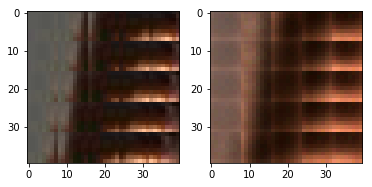

EPO: 13, recon_loss: 0.0073, total_loss: 0.0165, train_psnr:23.2258, validation_psnr:28.8103
EPO: 13, recon_loss: 0.0138, total_loss: 0.0235, train_psnr:23.1285, validation_psnr:28.8432
EPO: 13, recon_loss: 0.0080, total_loss: 0.0157, train_psnr:23.1776, validation_psnr:28.4397
EPO: 13, recon_loss: 0.0090, total_loss: 0.0219, train_psnr:23.2270, validation_psnr:28.6144
EPO: 13, recon_loss: 0.0330, total_loss: 0.0398, train_psnr:23.2634, validation_psnr:28.4687
EPO: 13, recon_loss: 0.0116, total_loss: 0.0234, train_psnr:23.2887, validation_psnr:28.6698
EPO: 13, recon_loss: 0.0173, total_loss: 0.0248, train_psnr:23.2409, validation_psnr:28.7875
EPO: 13, recon_loss: 0.0092, total_loss: 0.0204, train_psnr:23.2667, validation_psnr:28.6113
EPO: 13, recon_loss: 0.0074, total_loss: 0.0159, train_psnr:23.2784, validation_psnr:28.4443
EPO: 13, recon_loss: 0.0260, total_loss: 0.0358, train_psnr:23.2831, validation_psnr:28.7054
#########reconstruction test psnr: 27.3998 


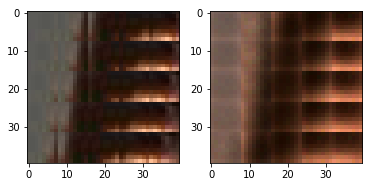

EPO: 13, recon_loss: 0.0079, total_loss: 0.0120, train_psnr:23.2924, validation_psnr:28.1896
EPO: 13, recon_loss: 0.0168, total_loss: 0.0252, train_psnr:23.2565, validation_psnr:28.4040
EPO: 13, recon_loss: 0.0096, total_loss: 0.0208, train_psnr:23.3249, validation_psnr:28.7930
EPO: 13, recon_loss: 0.0045, total_loss: 0.0129, train_psnr:23.4440, validation_psnr:28.7579
EPO: 13, recon_loss: 0.0182, total_loss: 0.0241, train_psnr:23.4686, validation_psnr:28.8361
EPO: 13, recon_loss: 0.0056, total_loss: 0.0124, train_psnr:23.5122, validation_psnr:28.6293
EPO: 13, recon_loss: 0.0114, total_loss: 0.0169, train_psnr:23.5244, validation_psnr:28.5807
EPO: 13, recon_loss: 0.0294, total_loss: 0.0486, train_psnr:23.4747, validation_psnr:28.2017
EPO: 13, recon_loss: 0.0255, total_loss: 0.0409, train_psnr:23.3596, validation_psnr:28.0424
EPO: 13, recon_loss: 0.0185, total_loss: 0.0255, train_psnr:23.2269, validation_psnr:27.6756
#########reconstruction test psnr: 26.5551 


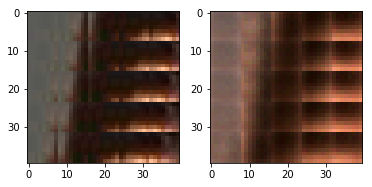

EPO: 13, recon_loss: 0.0197, total_loss: 0.0305, train_psnr:23.0892, validation_psnr:27.8651
EPO: 13, recon_loss: 0.0143, total_loss: 0.0202, train_psnr:23.0266, validation_psnr:27.8876
EPO: 13, recon_loss: 0.0097, total_loss: 0.0320, train_psnr:22.9440, validation_psnr:28.5701
EPO: 13, recon_loss: 0.0045, total_loss: 0.0205, train_psnr:23.0085, validation_psnr:28.1448
EPO: 13, recon_loss: 0.0209, total_loss: 0.0306, train_psnr:23.0676, validation_psnr:28.1338
EPO: 13, recon_loss: 0.0139, total_loss: 0.0253, train_psnr:23.1287, validation_psnr:28.5941
EPO: 13, recon_loss: 0.0184, total_loss: 0.0275, train_psnr:23.1888, validation_psnr:28.5542
EPO: 13, recon_loss: 0.0114, total_loss: 0.0178, train_psnr:23.2332, validation_psnr:28.6564
EPO: 13, recon_loss: 0.0028, total_loss: 0.0047, train_psnr:23.3958, validation_psnr:28.6814
EPO: 13, recon_loss: 0.0172, total_loss: 0.0205, train_psnr:23.4470, validation_psnr:28.7420
#########reconstruction test psnr: 27.3868 


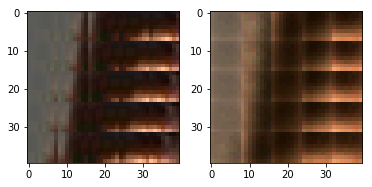

EPO: 13, recon_loss: 0.0048, total_loss: 0.0075, train_psnr:23.4817, validation_psnr:28.7383
EPO: 13, recon_loss: 0.0051, total_loss: 0.0079, train_psnr:23.5457, validation_psnr:28.6472
EPO: 13, recon_loss: 0.0117, total_loss: 0.0168, train_psnr:23.5423, validation_psnr:27.8631
EPO: 13, recon_loss: 0.0116, total_loss: 0.0189, train_psnr:23.5340, validation_psnr:28.0721
EPO: 13, recon_loss: 0.0212, total_loss: 0.0297, train_psnr:23.5399, validation_psnr:27.8976
EPO: 13, recon_loss: 0.0111, total_loss: 0.0175, train_psnr:23.5161, validation_psnr:27.9833
EPO: 13, recon_loss: 0.0126, total_loss: 0.0162, train_psnr:23.5600, validation_psnr:27.9978
EPO: 13, recon_loss: 0.0188, total_loss: 0.0358, train_psnr:23.5450, validation_psnr:28.2055
EPO: 13, recon_loss: 0.0216, total_loss: 0.0320, train_psnr:23.5225, validation_psnr:28.4861
EPO: 13, recon_loss: 0.0164, total_loss: 0.0243, train_psnr:23.4077, validation_psnr:28.6150
#########reconstruction test psnr: 27.2954 


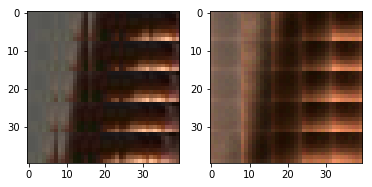

EPO: 13, recon_loss: 0.0191, total_loss: 0.0242, train_psnr:23.3211, validation_psnr:28.3769
EPO: 13, recon_loss: 0.0157, total_loss: 0.0222, train_psnr:23.2288, validation_psnr:28.4815
EPO: 13, recon_loss: 0.0287, total_loss: 0.0415, train_psnr:23.1118, validation_psnr:28.7653
EPO: 13, recon_loss: 0.0409, total_loss: 0.0588, train_psnr:23.2743, validation_psnr:28.2855
EPO: 13, recon_loss: 0.0176, total_loss: 0.0249, train_psnr:23.3064, validation_psnr:28.7444
EPO: 13, recon_loss: 0.0404, total_loss: 0.0500, train_psnr:19.8169, validation_psnr:26.9294
EPO: 13, recon_loss: 0.0169, total_loss: 0.0249, train_psnr:21.5498, validation_psnr:28.9160
EPO: 13, recon_loss: 0.0307, total_loss: 0.0418, train_psnr:22.1161, validation_psnr:29.0733
EPO: 13, recon_loss: 0.0035, total_loss: 0.0110, train_psnr:23.4299, validation_psnr:27.1100
EPO: 13, recon_loss: 0.0103, total_loss: 0.0184, train_psnr:23.4300, validation_psnr:27.3112
#########reconstruction test psnr: 26.2317 


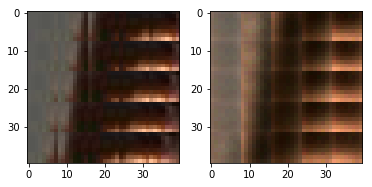

EPO: 13, recon_loss: 0.0161, total_loss: 0.0225, train_psnr:23.3699, validation_psnr:27.5834
EPO: 13, recon_loss: 0.0193, total_loss: 0.0281, train_psnr:23.3333, validation_psnr:27.4509
EPO: 13, recon_loss: 0.0390, total_loss: 0.0466, train_psnr:23.2740, validation_psnr:27.4134
EPO: 13, recon_loss: 0.0040, total_loss: 0.0143, train_psnr:23.3171, validation_psnr:28.4929
EPO: 13, recon_loss: 0.0081, total_loss: 0.0147, train_psnr:23.3105, validation_psnr:28.3937
EPO: 13, recon_loss: 0.0114, total_loss: 0.0189, train_psnr:23.3067, validation_psnr:28.3069
EPO: 13, recon_loss: 0.0037, total_loss: 0.0073, train_psnr:23.3227, validation_psnr:28.2578
EPO: 13, recon_loss: 0.0068, total_loss: 0.0102, train_psnr:23.3058, validation_psnr:28.2012
EPO: 13, recon_loss: 0.0114, total_loss: 0.0219, train_psnr:23.3961, validation_psnr:28.6028
EPO: 13, recon_loss: 0.0117, total_loss: 0.0212, train_psnr:23.4218, validation_psnr:28.5079
#########reconstruction test psnr: 27.2070 


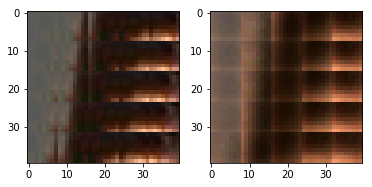

EPO: 13, recon_loss: 0.0209, total_loss: 0.0300, train_psnr:23.4038, validation_psnr:28.8982
EPO: 13, recon_loss: 0.0137, total_loss: 0.0229, train_psnr:23.4505, validation_psnr:28.6487
EPO: 13, recon_loss: 0.0225, total_loss: 0.0273, train_psnr:23.4780, validation_psnr:28.4850
EPO: 14, recon_loss: 0.0069, total_loss: 0.0104, train_psnr:23.5578, validation_psnr:28.2939
EPO: 14, recon_loss: 0.0053, total_loss: 0.0084, train_psnr:23.6027, validation_psnr:28.2768
EPO: 14, recon_loss: 0.0227, total_loss: 0.0282, train_psnr:23.5835, validation_psnr:28.2313
EPO: 14, recon_loss: 0.0069, total_loss: 0.0113, train_psnr:23.5791, validation_psnr:28.3179
EPO: 14, recon_loss: 0.0156, total_loss: 0.0197, train_psnr:23.5368, validation_psnr:28.1816
EPO: 14, recon_loss: 0.0054, total_loss: 0.0179, train_psnr:23.4912, validation_psnr:28.9959
EPO: 14, recon_loss: 0.0081, total_loss: 0.0159, train_psnr:23.4803, validation_psnr:28.8193
#########reconstruction test psnr: 27.4831 


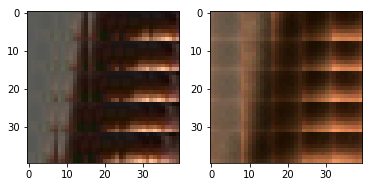

EPO: 14, recon_loss: 0.0124, total_loss: 0.0185, train_psnr:23.4604, validation_psnr:28.9727
EPO: 14, recon_loss: 0.0105, total_loss: 0.0150, train_psnr:23.4607, validation_psnr:28.8706
EPO: 14, recon_loss: 0.0171, total_loss: 0.0268, train_psnr:23.3975, validation_psnr:28.4353
EPO: 14, recon_loss: 0.0053, total_loss: 0.0167, train_psnr:23.4415, validation_psnr:28.6861
EPO: 14, recon_loss: 0.0039, total_loss: 0.0084, train_psnr:23.4336, validation_psnr:28.5463
EPO: 14, recon_loss: 0.0094, total_loss: 0.0172, train_psnr:23.4406, validation_psnr:28.5163
EPO: 14, recon_loss: 0.0076, total_loss: 0.0097, train_psnr:23.4606, validation_psnr:28.7213
EPO: 14, recon_loss: 0.0178, total_loss: 0.0254, train_psnr:23.4155, validation_psnr:28.0092
EPO: 14, recon_loss: 0.0103, total_loss: 0.0172, train_psnr:23.3483, validation_psnr:29.0440
EPO: 14, recon_loss: 0.0102, total_loss: 0.0162, train_psnr:23.1372, validation_psnr:29.0281
#########reconstruction test psnr: 27.6608 


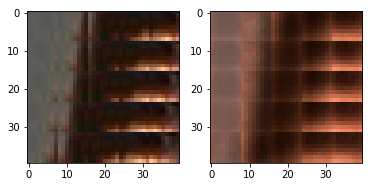

EPO: 14, recon_loss: 0.0117, total_loss: 0.0175, train_psnr:23.0163, validation_psnr:28.8981
EPO: 14, recon_loss: 0.0092, total_loss: 0.0168, train_psnr:22.8991, validation_psnr:28.8743
EPO: 14, recon_loss: 0.0100, total_loss: 0.0156, train_psnr:22.7839, validation_psnr:28.9089
EPO: 14, recon_loss: 0.0088, total_loss: 0.0128, train_psnr:22.8976, validation_psnr:28.9971
EPO: 14, recon_loss: 0.0060, total_loss: 0.0116, train_psnr:23.0891, validation_psnr:29.0266
EPO: 14, recon_loss: 0.0183, total_loss: 0.0227, train_psnr:23.1810, validation_psnr:28.8961
EPO: 14, recon_loss: 0.0069, total_loss: 0.0109, train_psnr:23.2631, validation_psnr:28.8475
EPO: 14, recon_loss: 0.0106, total_loss: 0.0137, train_psnr:23.3075, validation_psnr:28.9188
EPO: 14, recon_loss: 0.0230, total_loss: 0.0355, train_psnr:23.3307, validation_psnr:28.6471
EPO: 14, recon_loss: 0.0089, total_loss: 0.0182, train_psnr:23.2889, validation_psnr:28.1060
#########reconstruction test psnr: 26.9350 


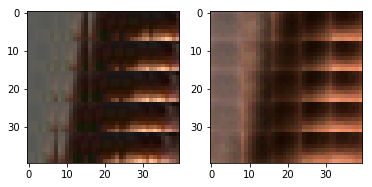

EPO: 14, recon_loss: 0.0200, total_loss: 0.0330, train_psnr:23.3565, validation_psnr:28.6332
EPO: 14, recon_loss: 0.0236, total_loss: 0.0324, train_psnr:23.3784, validation_psnr:28.3834
EPO: 14, recon_loss: 0.0184, total_loss: 0.0256, train_psnr:23.3879, validation_psnr:28.2750
EPO: 14, recon_loss: 0.0187, total_loss: 0.0334, train_psnr:23.4176, validation_psnr:28.7657
EPO: 14, recon_loss: 0.0092, total_loss: 0.0170, train_psnr:23.5985, validation_psnr:28.1365
EPO: 14, recon_loss: 0.0198, total_loss: 0.0262, train_psnr:23.6520, validation_psnr:27.6562
EPO: 14, recon_loss: 0.0074, total_loss: 0.0098, train_psnr:23.7080, validation_psnr:27.8541
EPO: 14, recon_loss: 0.0074, total_loss: 0.0112, train_psnr:23.7159, validation_psnr:27.5035
EPO: 14, recon_loss: 0.0045, total_loss: 0.0082, train_psnr:23.7002, validation_psnr:27.0866
EPO: 14, recon_loss: 0.0040, total_loss: 0.0075, train_psnr:23.6880, validation_psnr:27.9333
#########reconstruction test psnr: 26.7905 


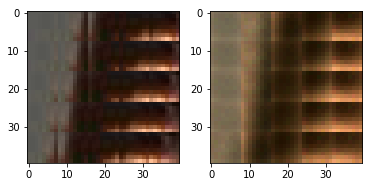

EPO: 14, recon_loss: 0.0069, total_loss: 0.0141, train_psnr:23.6450, validation_psnr:28.5265
EPO: 14, recon_loss: 0.0062, total_loss: 0.0112, train_psnr:23.6294, validation_psnr:28.3862
EPO: 14, recon_loss: 0.0099, total_loss: 0.0204, train_psnr:23.5916, validation_psnr:28.7692
EPO: 14, recon_loss: 0.0065, total_loss: 0.0194, train_psnr:23.5605, validation_psnr:28.5999
EPO: 14, recon_loss: 0.0051, total_loss: 0.0151, train_psnr:23.6143, validation_psnr:28.7066
EPO: 14, recon_loss: 0.0098, total_loss: 0.0178, train_psnr:23.6389, validation_psnr:28.7519
EPO: 14, recon_loss: 0.0083, total_loss: 0.0133, train_psnr:23.6692, validation_psnr:28.5216
EPO: 14, recon_loss: 0.0071, total_loss: 0.0148, train_psnr:23.6832, validation_psnr:28.8283
EPO: 14, recon_loss: 0.0093, total_loss: 0.0260, train_psnr:23.6461, validation_psnr:29.2272
EPO: 14, recon_loss: 0.0109, total_loss: 0.0209, train_psnr:23.7264, validation_psnr:29.2631
#########reconstruction test psnr: 27.8802 


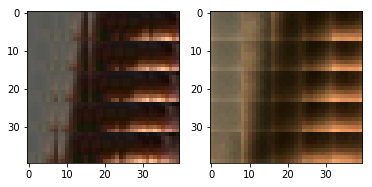

EPO: 14, recon_loss: 0.0223, total_loss: 0.0311, train_psnr:23.7429, validation_psnr:28.9371
EPO: 14, recon_loss: 0.0139, total_loss: 0.0190, train_psnr:23.7301, validation_psnr:28.8512
EPO: 14, recon_loss: 0.0102, total_loss: 0.0146, train_psnr:23.7335, validation_psnr:28.8051
EPO: 14, recon_loss: 0.0223, total_loss: 0.0286, train_psnr:23.6985, validation_psnr:28.7926
EPO: 14, recon_loss: 0.0099, total_loss: 0.0157, train_psnr:23.7785, validation_psnr:28.6082
EPO: 14, recon_loss: 0.0154, total_loss: 0.0244, train_psnr:23.7565, validation_psnr:28.6724
EPO: 14, recon_loss: 0.0147, total_loss: 0.0229, train_psnr:23.7490, validation_psnr:28.5951
EPO: 14, recon_loss: 0.0156, total_loss: 0.0225, train_psnr:23.6777, validation_psnr:28.7683
EPO: 14, recon_loss: 0.0307, total_loss: 0.0353, train_psnr:23.6354, validation_psnr:28.8762
EPO: 14, recon_loss: 0.0177, total_loss: 0.0305, train_psnr:23.5658, validation_psnr:29.0686
#########reconstruction test psnr: 27.7035 


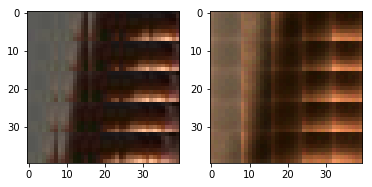

EPO: 14, recon_loss: 0.0264, total_loss: 0.0397, train_psnr:23.4758, validation_psnr:29.1657
EPO: 14, recon_loss: 0.0365, total_loss: 0.0489, train_psnr:23.5170, validation_psnr:29.1499
EPO: 14, recon_loss: 0.0196, total_loss: 0.0320, train_psnr:23.4260, validation_psnr:29.1396
EPO: 14, recon_loss: 0.0208, total_loss: 0.0319, train_psnr:23.3487, validation_psnr:29.0075
EPO: 14, recon_loss: 0.0081, total_loss: 0.0157, train_psnr:23.5321, validation_psnr:28.3451
EPO: 14, recon_loss: 0.0117, total_loss: 0.0195, train_psnr:23.5506, validation_psnr:28.4427
EPO: 14, recon_loss: 0.0152, total_loss: 0.0232, train_psnr:23.4921, validation_psnr:27.9568
EPO: 14, recon_loss: 0.0195, total_loss: 0.0308, train_psnr:23.5616, validation_psnr:28.6460
EPO: 14, recon_loss: 0.0197, total_loss: 0.0286, train_psnr:23.4991, validation_psnr:28.9717
EPO: 14, recon_loss: 0.0066, total_loss: 0.0180, train_psnr:23.5025, validation_psnr:28.3284
#########reconstruction test psnr: 27.1626 


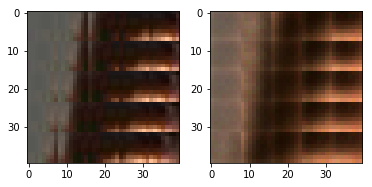

EPO: 14, recon_loss: 0.0171, total_loss: 0.0274, train_psnr:23.4744, validation_psnr:28.1458
EPO: 14, recon_loss: 0.0259, total_loss: 0.0351, train_psnr:23.4379, validation_psnr:28.0674
EPO: 14, recon_loss: 0.0063, total_loss: 0.0171, train_psnr:23.5091, validation_psnr:28.2275
EPO: 14, recon_loss: 0.0159, total_loss: 0.0230, train_psnr:23.4780, validation_psnr:28.4792
EPO: 14, recon_loss: 0.0119, total_loss: 0.0309, train_psnr:23.5287, validation_psnr:28.4159
EPO: 14, recon_loss: 0.0129, total_loss: 0.0311, train_psnr:23.5201, validation_psnr:28.8745
EPO: 14, recon_loss: 0.0470, total_loss: 0.0651, train_psnr:23.5984, validation_psnr:28.7535
EPO: 14, recon_loss: 0.0113, total_loss: 0.0322, train_psnr:23.6284, validation_psnr:28.8969
EPO: 14, recon_loss: 0.0151, total_loss: 0.0327, train_psnr:23.6119, validation_psnr:28.8615
EPO: 14, recon_loss: 0.0184, total_loss: 0.0349, train_psnr:23.5135, validation_psnr:29.2527
#########reconstruction test psnr: 27.9671 


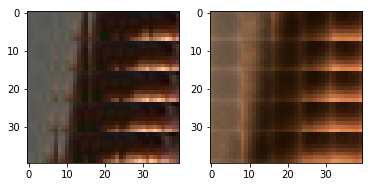

EPO: 14, recon_loss: 0.0128, total_loss: 0.0331, train_psnr:23.4626, validation_psnr:29.0793
EPO: 14, recon_loss: 0.0626, total_loss: 0.0772, train_psnr:23.4444, validation_psnr:28.9267
EPO: 14, recon_loss: 0.0232, total_loss: 0.0430, train_psnr:23.4722, validation_psnr:28.8247
EPO: 14, recon_loss: 0.0218, total_loss: 0.0409, train_psnr:23.4104, validation_psnr:28.7376
EPO: 14, recon_loss: 0.0068, total_loss: 0.0242, train_psnr:23.5824, validation_psnr:28.1361
EPO: 14, recon_loss: 0.0227, total_loss: 0.0432, train_psnr:23.5569, validation_psnr:28.2720
EPO: 14, recon_loss: 0.0607, total_loss: 0.0712, train_psnr:23.5674, validation_psnr:28.5918
EPO: 14, recon_loss: 0.0339, total_loss: 0.0423, train_psnr:23.6211, validation_psnr:27.8169
EPO: 14, recon_loss: 0.0100, total_loss: 0.0148, train_psnr:23.5837, validation_psnr:27.6003
EPO: 14, recon_loss: 0.0065, total_loss: 0.0140, train_psnr:23.5585, validation_psnr:28.1072
#########reconstruction test psnr: 26.9981 


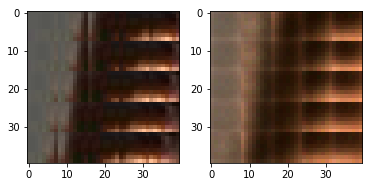

EPO: 14, recon_loss: 0.0070, total_loss: 0.0170, train_psnr:23.6748, validation_psnr:28.4079
EPO: 14, recon_loss: 0.0237, total_loss: 0.0311, train_psnr:23.6523, validation_psnr:28.7425
EPO: 14, recon_loss: 0.0090, total_loss: 0.0206, train_psnr:23.6317, validation_psnr:28.9601
EPO: 14, recon_loss: 0.0190, total_loss: 0.0294, train_psnr:23.6139, validation_psnr:29.0743
EPO: 14, recon_loss: 0.0040, total_loss: 0.0084, train_psnr:23.5619, validation_psnr:29.1323
EPO: 14, recon_loss: 0.0018, total_loss: 0.0051, train_psnr:23.5103, validation_psnr:29.1599
EPO: 14, recon_loss: 0.0060, total_loss: 0.0093, train_psnr:23.5900, validation_psnr:28.9589
EPO: 14, recon_loss: 0.0029, total_loss: 0.0044, train_psnr:23.5530, validation_psnr:28.7972
EPO: 14, recon_loss: 0.0042, total_loss: 0.0072, train_psnr:23.4937, validation_psnr:28.6952
EPO: 14, recon_loss: 0.0178, total_loss: 0.0338, train_psnr:23.4690, validation_psnr:28.9082
#########reconstruction test psnr: 27.6176 


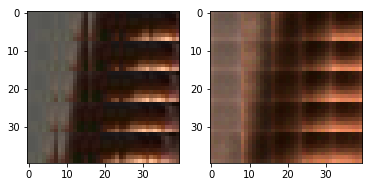

EPO: 14, recon_loss: 0.0080, total_loss: 0.0148, train_psnr:23.3812, validation_psnr:28.3045
EPO: 14, recon_loss: 0.0190, total_loss: 0.0253, train_psnr:23.2482, validation_psnr:28.1167
EPO: 14, recon_loss: 0.0099, total_loss: 0.0133, train_psnr:23.1241, validation_psnr:27.8510
EPO: 14, recon_loss: 0.0098, total_loss: 0.0124, train_psnr:23.0023, validation_psnr:27.9342
EPO: 14, recon_loss: 0.0191, total_loss: 0.0371, train_psnr:23.0318, validation_psnr:27.8953
EPO: 14, recon_loss: 0.0201, total_loss: 0.0311, train_psnr:23.2460, validation_psnr:27.9827
EPO: 14, recon_loss: 0.0244, total_loss: 0.0361, train_psnr:23.3488, validation_psnr:28.0762
EPO: 14, recon_loss: 0.0278, total_loss: 0.0408, train_psnr:23.4579, validation_psnr:28.3445
EPO: 14, recon_loss: 0.0119, total_loss: 0.0203, train_psnr:23.5067, validation_psnr:28.0839
EPO: 14, recon_loss: 0.0190, total_loss: 0.0258, train_psnr:23.5884, validation_psnr:27.9232
#########reconstruction test psnr: 26.7525 


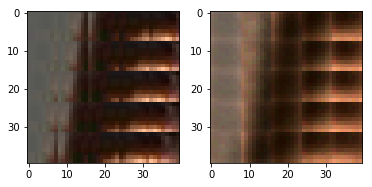

EPO: 14, recon_loss: 0.0114, total_loss: 0.0159, train_psnr:23.7080, validation_psnr:27.9636
EPO: 14, recon_loss: 0.0124, total_loss: 0.0169, train_psnr:23.7466, validation_psnr:28.1365
EPO: 14, recon_loss: 0.0102, total_loss: 0.0149, train_psnr:23.7475, validation_psnr:28.3035
EPO: 14, recon_loss: 0.0109, total_loss: 0.0169, train_psnr:23.8171, validation_psnr:28.2507
EPO: 14, recon_loss: 0.0049, total_loss: 0.0215, train_psnr:23.8277, validation_psnr:28.5689
EPO: 14, recon_loss: 0.0051, total_loss: 0.0134, train_psnr:23.8472, validation_psnr:28.4210
EPO: 14, recon_loss: 0.0207, total_loss: 0.0292, train_psnr:23.8133, validation_psnr:27.9819
EPO: 14, recon_loss: 0.0182, total_loss: 0.0254, train_psnr:23.8090, validation_psnr:28.1727
EPO: 14, recon_loss: 0.0123, total_loss: 0.0184, train_psnr:23.7967, validation_psnr:28.1631
EPO: 14, recon_loss: 0.0098, total_loss: 0.0163, train_psnr:23.7734, validation_psnr:28.5375
#########reconstruction test psnr: 27.2710 


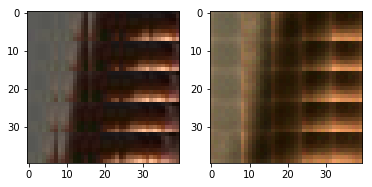

EPO: 14, recon_loss: 0.0041, total_loss: 0.0081, train_psnr:23.8351, validation_psnr:28.1755
EPO: 14, recon_loss: 0.0070, total_loss: 0.0108, train_psnr:23.8504, validation_psnr:28.0923
EPO: 14, recon_loss: 0.0098, total_loss: 0.0151, train_psnr:23.8581, validation_psnr:27.9015
EPO: 14, recon_loss: 0.0058, total_loss: 0.0091, train_psnr:23.8614, validation_psnr:27.9818
EPO: 14, recon_loss: 0.0117, total_loss: 0.0150, train_psnr:23.8547, validation_psnr:27.9267
EPO: 14, recon_loss: 0.0075, total_loss: 0.0129, train_psnr:23.8545, validation_psnr:28.5883
EPO: 14, recon_loss: 0.0125, total_loss: 0.0189, train_psnr:23.8175, validation_psnr:28.6249
EPO: 14, recon_loss: 0.0156, total_loss: 0.0233, train_psnr:23.7918, validation_psnr:28.6106
EPO: 14, recon_loss: 0.0114, total_loss: 0.0179, train_psnr:23.7318, validation_psnr:28.2056
EPO: 14, recon_loss: 0.0069, total_loss: 0.0122, train_psnr:23.6784, validation_psnr:27.9850
#########reconstruction test psnr: 26.8788 


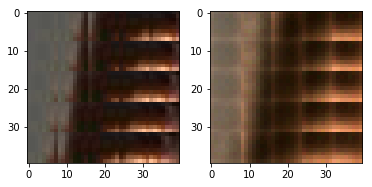

EPO: 14, recon_loss: 0.0089, total_loss: 0.0219, train_psnr:23.6519, validation_psnr:28.4402
EPO: 14, recon_loss: 0.0175, total_loss: 0.0288, train_psnr:23.6265, validation_psnr:28.3997
EPO: 14, recon_loss: 0.0340, total_loss: 0.0450, train_psnr:23.5999, validation_psnr:28.0527
EPO: 14, recon_loss: 0.0119, total_loss: 0.0199, train_psnr:23.6035, validation_psnr:28.0717
EPO: 14, recon_loss: 0.0422, total_loss: 0.0522, train_psnr:23.4268, validation_psnr:28.1879
EPO: 14, recon_loss: 0.0023, total_loss: 0.0080, train_psnr:23.4550, validation_psnr:28.4165
EPO: 14, recon_loss: 0.0062, total_loss: 0.0119, train_psnr:23.4046, validation_psnr:27.7976
EPO: 14, recon_loss: 0.0296, total_loss: 0.0365, train_psnr:23.3972, validation_psnr:27.6454
EPO: 14, recon_loss: 0.0078, total_loss: 0.0135, train_psnr:23.3788, validation_psnr:27.6514
EPO: 14, recon_loss: 0.0103, total_loss: 0.0163, train_psnr:23.3402, validation_psnr:27.9439
#########reconstruction test psnr: 26.8195 


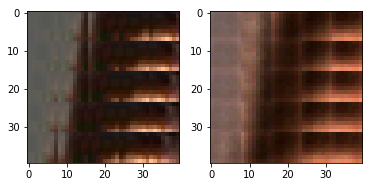

EPO: 14, recon_loss: 0.0114, total_loss: 0.0193, train_psnr:23.3685, validation_psnr:28.7300
EPO: 14, recon_loss: 0.0112, total_loss: 0.0217, train_psnr:23.3743, validation_psnr:29.0924
EPO: 14, recon_loss: 0.0236, total_loss: 0.0316, train_psnr:23.3676, validation_psnr:29.0800
EPO: 14, recon_loss: 0.0064, total_loss: 0.0135, train_psnr:23.3752, validation_psnr:29.0873
EPO: 14, recon_loss: 0.0139, total_loss: 0.0203, train_psnr:23.3308, validation_psnr:29.0622
EPO: 14, recon_loss: 0.0116, total_loss: 0.0166, train_psnr:23.4795, validation_psnr:28.9620
EPO: 14, recon_loss: 0.0150, total_loss: 0.0197, train_psnr:23.6635, validation_psnr:29.0224
EPO: 14, recon_loss: 0.0210, total_loss: 0.0312, train_psnr:23.7327, validation_psnr:29.0666
EPO: 14, recon_loss: 0.0085, total_loss: 0.0137, train_psnr:23.7566, validation_psnr:28.9031
EPO: 14, recon_loss: 0.0101, total_loss: 0.0167, train_psnr:23.7853, validation_psnr:28.7366
#########reconstruction test psnr: 27.4310 


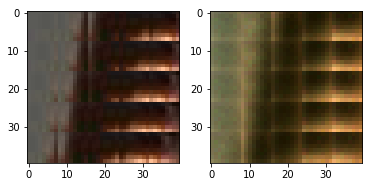

EPO: 14, recon_loss: 0.0171, total_loss: 0.0268, train_psnr:23.8316, validation_psnr:28.8140
EPO: 14, recon_loss: 0.0093, total_loss: 0.0187, train_psnr:23.8358, validation_psnr:28.5642
EPO: 14, recon_loss: 0.0249, total_loss: 0.0313, train_psnr:23.7354, validation_psnr:28.2978
EPO: 14, recon_loss: 0.0130, total_loss: 0.0224, train_psnr:23.6660, validation_psnr:28.8031
EPO: 14, recon_loss: 0.0187, total_loss: 0.0268, train_psnr:23.6106, validation_psnr:28.8874
EPO: 14, recon_loss: 0.0177, total_loss: 0.0345, train_psnr:23.5969, validation_psnr:29.0337
EPO: 14, recon_loss: 0.0029, total_loss: 0.0082, train_psnr:23.6614, validation_psnr:28.7953
EPO: 14, recon_loss: 0.0140, total_loss: 0.0189, train_psnr:23.7000, validation_psnr:28.6558
EPO: 14, recon_loss: 0.0068, total_loss: 0.0128, train_psnr:23.7182, validation_psnr:28.9702
EPO: 14, recon_loss: 0.0078, total_loss: 0.0142, train_psnr:23.7079, validation_psnr:29.0852
#########reconstruction test psnr: 27.6942 


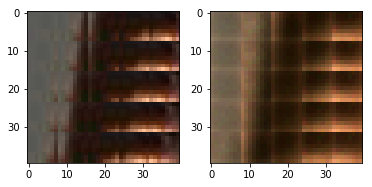

EPO: 14, recon_loss: 0.0109, total_loss: 0.0219, train_psnr:23.7224, validation_psnr:28.7979
EPO: 14, recon_loss: 0.0066, total_loss: 0.0141, train_psnr:23.7418, validation_psnr:28.5501
EPO: 14, recon_loss: 0.0251, total_loss: 0.0339, train_psnr:23.6562, validation_psnr:28.7208
EPO: 14, recon_loss: 0.0113, total_loss: 0.0200, train_psnr:23.6312, validation_psnr:28.4384
EPO: 14, recon_loss: 0.0253, total_loss: 0.0331, train_psnr:23.5579, validation_psnr:28.0975
EPO: 14, recon_loss: 0.0136, total_loss: 0.0283, train_psnr:23.5279, validation_psnr:28.3391
EPO: 14, recon_loss: 0.0062, total_loss: 0.0153, train_psnr:23.4853, validation_psnr:28.7307
EPO: 14, recon_loss: 0.0205, total_loss: 0.0298, train_psnr:23.4260, validation_psnr:28.4673
EPO: 14, recon_loss: 0.0084, total_loss: 0.0159, train_psnr:23.3770, validation_psnr:28.7865
EPO: 14, recon_loss: 0.0154, total_loss: 0.0229, train_psnr:23.3159, validation_psnr:28.7451
#########reconstruction test psnr: 27.4399 


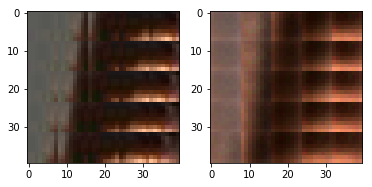

EPO: 14, recon_loss: 0.0073, total_loss: 0.0094, train_psnr:23.3084, validation_psnr:28.7520
EPO: 14, recon_loss: 0.0043, total_loss: 0.0068, train_psnr:23.4558, validation_psnr:28.7525
EPO: 14, recon_loss: 0.0066, total_loss: 0.0101, train_psnr:23.5084, validation_psnr:28.7568
EPO: 14, recon_loss: 0.0090, total_loss: 0.0136, train_psnr:23.4447, validation_psnr:28.8052
EPO: 14, recon_loss: 0.0126, total_loss: 0.0188, train_psnr:23.4521, validation_psnr:28.7470
EPO: 14, recon_loss: 0.0205, total_loss: 0.0408, train_psnr:23.4089, validation_psnr:28.9947
EPO: 14, recon_loss: 0.0200, total_loss: 0.0370, train_psnr:23.4196, validation_psnr:29.3874
EPO: 14, recon_loss: 0.0177, total_loss: 0.0354, train_psnr:23.4636, validation_psnr:29.2806
EPO: 14, recon_loss: 0.0210, total_loss: 0.0422, train_psnr:23.4380, validation_psnr:29.5618
EPO: 14, recon_loss: 0.0189, total_loss: 0.0420, train_psnr:23.4196, validation_psnr:29.2934
#########reconstruction test psnr: 27.8720 


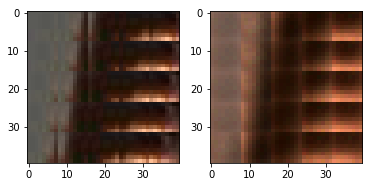

EPO: 14, recon_loss: 0.0077, total_loss: 0.0186, train_psnr:23.4120, validation_psnr:28.9031
EPO: 14, recon_loss: 0.0112, total_loss: 0.0198, train_psnr:23.4868, validation_psnr:28.1688
EPO: 14, recon_loss: 0.0328, total_loss: 0.0467, train_psnr:23.4275, validation_psnr:27.6611
EPO: 14, recon_loss: 0.0130, total_loss: 0.0282, train_psnr:23.5761, validation_psnr:28.9724
EPO: 14, recon_loss: 0.0142, total_loss: 0.0254, train_psnr:23.6156, validation_psnr:28.9864
EPO: 14, recon_loss: 0.0136, total_loss: 0.0247, train_psnr:23.6231, validation_psnr:29.0547
EPO: 14, recon_loss: 0.0120, total_loss: 0.0270, train_psnr:23.6412, validation_psnr:29.2119
EPO: 14, recon_loss: 0.0183, total_loss: 0.0308, train_psnr:23.6579, validation_psnr:29.2571
EPO: 14, recon_loss: 0.0177, total_loss: 0.0304, train_psnr:23.6582, validation_psnr:29.4555
EPO: 14, recon_loss: 0.0102, total_loss: 0.0198, train_psnr:23.6640, validation_psnr:29.2930
#########reconstruction test psnr: 27.9657 


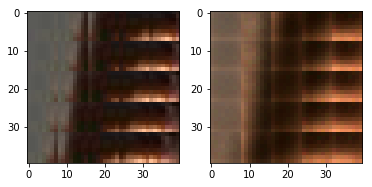

EPO: 14, recon_loss: 0.0145, total_loss: 0.0237, train_psnr:23.6414, validation_psnr:29.1410
EPO: 14, recon_loss: 0.0090, total_loss: 0.0178, train_psnr:23.6004, validation_psnr:29.0054
EPO: 14, recon_loss: 0.0158, total_loss: 0.0268, train_psnr:23.5249, validation_psnr:29.1632
EPO: 14, recon_loss: 0.0200, total_loss: 0.0283, train_psnr:23.4520, validation_psnr:29.1661
EPO: 14, recon_loss: 0.0067, total_loss: 0.0152, train_psnr:23.3933, validation_psnr:29.0260
EPO: 14, recon_loss: 0.0148, total_loss: 0.0241, train_psnr:23.3106, validation_psnr:28.9542
EPO: 14, recon_loss: 0.0054, total_loss: 0.0140, train_psnr:23.3585, validation_psnr:28.7510
EPO: 14, recon_loss: 0.0111, total_loss: 0.0226, train_psnr:23.4176, validation_psnr:28.7897
EPO: 14, recon_loss: 0.0278, total_loss: 0.0361, train_psnr:23.4398, validation_psnr:28.5159
EPO: 14, recon_loss: 0.0112, total_loss: 0.0235, train_psnr:23.4725, validation_psnr:28.8104
#########reconstruction test psnr: 27.5644 


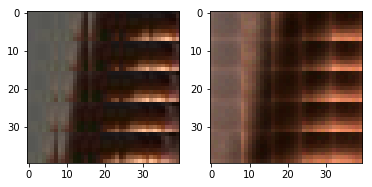

EPO: 14, recon_loss: 0.0214, total_loss: 0.0295, train_psnr:23.4345, validation_psnr:28.8420
EPO: 14, recon_loss: 0.0051, total_loss: 0.0150, train_psnr:23.4552, validation_psnr:28.6436
EPO: 14, recon_loss: 0.0106, total_loss: 0.0179, train_psnr:23.4756, validation_psnr:28.4362
EPO: 14, recon_loss: 0.0196, total_loss: 0.0270, train_psnr:23.4759, validation_psnr:28.8590
EPO: 14, recon_loss: 0.0094, total_loss: 0.0145, train_psnr:23.4881, validation_psnr:28.3684
EPO: 14, recon_loss: 0.0135, total_loss: 0.0245, train_psnr:23.4544, validation_psnr:28.5686
EPO: 14, recon_loss: 0.0059, total_loss: 0.0142, train_psnr:23.5536, validation_psnr:28.9249
EPO: 14, recon_loss: 0.0047, total_loss: 0.0132, train_psnr:23.6450, validation_psnr:28.9315
EPO: 14, recon_loss: 0.0143, total_loss: 0.0210, train_psnr:23.6451, validation_psnr:29.0884
EPO: 14, recon_loss: 0.0060, total_loss: 0.0122, train_psnr:23.7123, validation_psnr:28.7938
#########reconstruction test psnr: 27.5372 


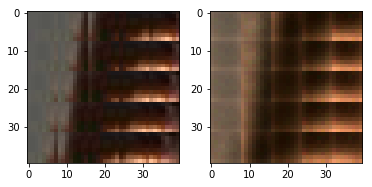

EPO: 14, recon_loss: 0.0095, total_loss: 0.0160, train_psnr:23.7143, validation_psnr:28.9008
EPO: 14, recon_loss: 0.0260, total_loss: 0.0419, train_psnr:23.6347, validation_psnr:28.4020
EPO: 14, recon_loss: 0.0206, total_loss: 0.0357, train_psnr:23.5321, validation_psnr:28.4399
EPO: 14, recon_loss: 0.0168, total_loss: 0.0238, train_psnr:23.3922, validation_psnr:27.9643
EPO: 14, recon_loss: 0.0223, total_loss: 0.0330, train_psnr:23.2622, validation_psnr:27.9938
EPO: 14, recon_loss: 0.0122, total_loss: 0.0185, train_psnr:23.1954, validation_psnr:28.2017
EPO: 14, recon_loss: 0.0091, total_loss: 0.0304, train_psnr:23.1322, validation_psnr:28.8067
EPO: 14, recon_loss: 0.0046, total_loss: 0.0187, train_psnr:23.1831, validation_psnr:28.2144
EPO: 14, recon_loss: 0.0223, total_loss: 0.0320, train_psnr:23.2872, validation_psnr:28.4820
EPO: 14, recon_loss: 0.0094, total_loss: 0.0186, train_psnr:23.3239, validation_psnr:28.8240
#########reconstruction test psnr: 27.4939 


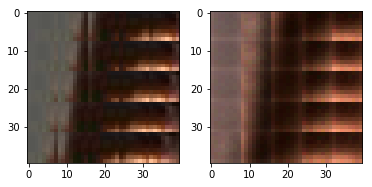

EPO: 14, recon_loss: 0.0191, total_loss: 0.0272, train_psnr:23.3733, validation_psnr:28.4503
EPO: 14, recon_loss: 0.0063, total_loss: 0.0098, train_psnr:23.4516, validation_psnr:28.8718
EPO: 14, recon_loss: 0.0026, total_loss: 0.0047, train_psnr:23.6072, validation_psnr:28.9313
EPO: 14, recon_loss: 0.0153, total_loss: 0.0188, train_psnr:23.6546, validation_psnr:28.8876
EPO: 14, recon_loss: 0.0044, total_loss: 0.0074, train_psnr:23.6892, validation_psnr:28.9759
EPO: 14, recon_loss: 0.0063, total_loss: 0.0094, train_psnr:23.7423, validation_psnr:28.8685
EPO: 14, recon_loss: 0.0139, total_loss: 0.0201, train_psnr:23.7516, validation_psnr:28.2902
EPO: 14, recon_loss: 0.0097, total_loss: 0.0165, train_psnr:23.7370, validation_psnr:28.2836
EPO: 14, recon_loss: 0.0186, total_loss: 0.0263, train_psnr:23.7505, validation_psnr:28.2403
EPO: 14, recon_loss: 0.0067, total_loss: 0.0123, train_psnr:23.7279, validation_psnr:28.2187
#########reconstruction test psnr: 27.0389 


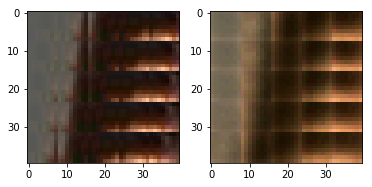

EPO: 14, recon_loss: 0.0087, total_loss: 0.0120, train_psnr:23.7578, validation_psnr:28.1811
EPO: 14, recon_loss: 0.0216, total_loss: 0.0376, train_psnr:23.7549, validation_psnr:28.4208
EPO: 14, recon_loss: 0.0148, total_loss: 0.0231, train_psnr:23.6978, validation_psnr:28.7197
EPO: 14, recon_loss: 0.0199, total_loss: 0.0271, train_psnr:23.5835, validation_psnr:28.6727
EPO: 14, recon_loss: 0.0133, total_loss: 0.0188, train_psnr:23.4912, validation_psnr:28.6015
EPO: 14, recon_loss: 0.0180, total_loss: 0.0245, train_psnr:23.3998, validation_psnr:28.6246
EPO: 14, recon_loss: 0.0241, total_loss: 0.0378, train_psnr:23.3404, validation_psnr:28.9253
EPO: 14, recon_loss: 0.0476, total_loss: 0.0670, train_psnr:23.4894, validation_psnr:28.1972
EPO: 14, recon_loss: 0.0151, total_loss: 0.0220, train_psnr:23.3463, validation_psnr:29.1002
EPO: 14, recon_loss: 0.0468, total_loss: 0.0567, train_psnr:18.5557, validation_psnr:26.2724
#########reconstruction test psnr: 25.3526 


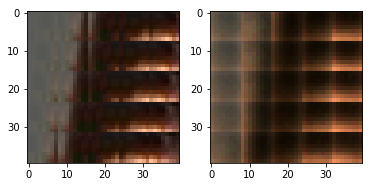

EPO: 14, recon_loss: 0.0150, total_loss: 0.0236, train_psnr:22.4073, validation_psnr:29.2384
EPO: 14, recon_loss: 0.0084, total_loss: 0.0162, train_psnr:23.1604, validation_psnr:28.7239
EPO: 14, recon_loss: 0.0036, total_loss: 0.0117, train_psnr:23.6260, validation_psnr:27.2156
EPO: 14, recon_loss: 0.0126, total_loss: 0.0185, train_psnr:23.6249, validation_psnr:27.5593
EPO: 14, recon_loss: 0.0101, total_loss: 0.0181, train_psnr:23.5521, validation_psnr:27.6582
EPO: 14, recon_loss: 0.0140, total_loss: 0.0196, train_psnr:23.4992, validation_psnr:27.5675
EPO: 14, recon_loss: 0.0053, total_loss: 0.0266, train_psnr:23.4045, validation_psnr:29.1425
EPO: 14, recon_loss: 0.0030, total_loss: 0.0113, train_psnr:23.5033, validation_psnr:28.5934
EPO: 14, recon_loss: 0.0103, total_loss: 0.0165, train_psnr:23.4802, validation_psnr:28.4375
EPO: 14, recon_loss: 0.0074, total_loss: 0.0141, train_psnr:23.5001, validation_psnr:28.6986
#########reconstruction test psnr: 27.4155 


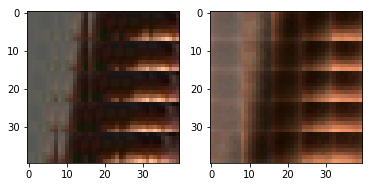

EPO: 14, recon_loss: 0.0028, total_loss: 0.0052, train_psnr:23.5086, validation_psnr:28.4782
EPO: 14, recon_loss: 0.0097, total_loss: 0.0166, train_psnr:23.4656, validation_psnr:28.9788
EPO: 14, recon_loss: 0.0109, total_loss: 0.0211, train_psnr:23.5942, validation_psnr:28.7994
EPO: 14, recon_loss: 0.0148, total_loss: 0.0229, train_psnr:23.5916, validation_psnr:28.8675
EPO: 14, recon_loss: 0.0201, total_loss: 0.0299, train_psnr:23.5636, validation_psnr:29.1744
EPO: 14, recon_loss: 0.0162, total_loss: 0.0254, train_psnr:23.6043, validation_psnr:28.8554
EPO: 14, recon_loss: 0.0195, total_loss: 0.0238, train_psnr:23.6453, validation_psnr:28.7814
EPO: 15, recon_loss: 0.0055, total_loss: 0.0084, train_psnr:23.7520, validation_psnr:28.5421
EPO: 15, recon_loss: 0.0066, total_loss: 0.0098, train_psnr:23.8013, validation_psnr:28.4883
EPO: 15, recon_loss: 0.0152, total_loss: 0.0211, train_psnr:23.7684, validation_psnr:28.6850
#########reconstruction test psnr: 27.4279 


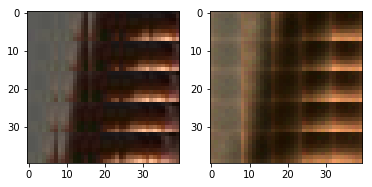

EPO: 15, recon_loss: 0.0075, total_loss: 0.0114, train_psnr:23.7711, validation_psnr:28.5067
EPO: 15, recon_loss: 0.0184, total_loss: 0.0223, train_psnr:23.7213, validation_psnr:28.3208
EPO: 15, recon_loss: 0.0039, total_loss: 0.0130, train_psnr:23.6761, validation_psnr:29.2738
EPO: 15, recon_loss: 0.0084, total_loss: 0.0158, train_psnr:23.6577, validation_psnr:29.2883
EPO: 15, recon_loss: 0.0133, total_loss: 0.0191, train_psnr:23.6513, validation_psnr:29.2866
EPO: 15, recon_loss: 0.0162, total_loss: 0.0218, train_psnr:23.6390, validation_psnr:28.9972
EPO: 15, recon_loss: 0.0152, total_loss: 0.0246, train_psnr:23.5805, validation_psnr:28.8721
EPO: 15, recon_loss: 0.0059, total_loss: 0.0145, train_psnr:23.6304, validation_psnr:28.8522
EPO: 15, recon_loss: 0.0056, total_loss: 0.0113, train_psnr:23.6320, validation_psnr:28.7343
EPO: 15, recon_loss: 0.0081, total_loss: 0.0147, train_psnr:23.6407, validation_psnr:28.9815
#########reconstruction test psnr: 27.6805 


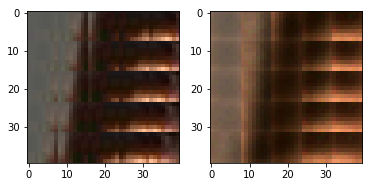

EPO: 15, recon_loss: 0.0079, total_loss: 0.0111, train_psnr:23.6600, validation_psnr:28.9062
EPO: 15, recon_loss: 0.0187, total_loss: 0.0255, train_psnr:23.6026, validation_psnr:28.1566
EPO: 15, recon_loss: 0.0101, total_loss: 0.0165, train_psnr:23.4884, validation_psnr:29.3285
EPO: 15, recon_loss: 0.0089, total_loss: 0.0146, train_psnr:23.2851, validation_psnr:29.1237
EPO: 15, recon_loss: 0.0115, total_loss: 0.0189, train_psnr:23.1776, validation_psnr:29.1554
EPO: 15, recon_loss: 0.0099, total_loss: 0.0164, train_psnr:23.0373, validation_psnr:29.0162
EPO: 15, recon_loss: 0.0118, total_loss: 0.0181, train_psnr:22.9413, validation_psnr:28.9340
EPO: 15, recon_loss: 0.0073, total_loss: 0.0116, train_psnr:23.1254, validation_psnr:29.1536
EPO: 15, recon_loss: 0.0066, total_loss: 0.0113, train_psnr:23.3009, validation_psnr:29.1859
EPO: 15, recon_loss: 0.0231, total_loss: 0.0282, train_psnr:23.3676, validation_psnr:29.1078
#########reconstruction test psnr: 27.7652 


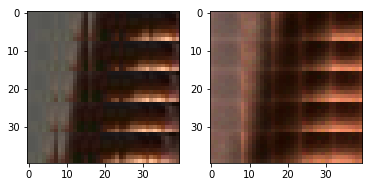

EPO: 15, recon_loss: 0.0055, total_loss: 0.0098, train_psnr:23.4648, validation_psnr:29.0181
EPO: 15, recon_loss: 0.0119, total_loss: 0.0147, train_psnr:23.5058, validation_psnr:29.0546
EPO: 15, recon_loss: 0.0194, total_loss: 0.0309, train_psnr:23.5207, validation_psnr:28.8526
EPO: 15, recon_loss: 0.0145, total_loss: 0.0265, train_psnr:23.4853, validation_psnr:28.4116
EPO: 15, recon_loss: 0.0209, total_loss: 0.0324, train_psnr:23.5576, validation_psnr:28.6466
EPO: 15, recon_loss: 0.0285, total_loss: 0.0371, train_psnr:23.5798, validation_psnr:28.5013
EPO: 15, recon_loss: 0.0169, total_loss: 0.0235, train_psnr:23.5751, validation_psnr:28.6236
EPO: 15, recon_loss: 0.0167, total_loss: 0.0310, train_psnr:23.6575, validation_psnr:28.7341
EPO: 15, recon_loss: 0.0074, total_loss: 0.0137, train_psnr:23.8162, validation_psnr:28.3061
EPO: 15, recon_loss: 0.0188, total_loss: 0.0250, train_psnr:23.8651, validation_psnr:27.8799
#########reconstruction test psnr: 26.8107 


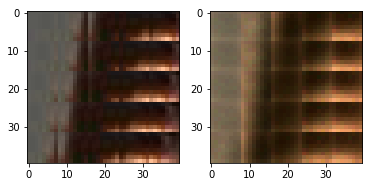

EPO: 15, recon_loss: 0.0084, total_loss: 0.0106, train_psnr:23.9134, validation_psnr:28.0575
EPO: 15, recon_loss: 0.0098, total_loss: 0.0156, train_psnr:23.9063, validation_psnr:27.2812
EPO: 15, recon_loss: 0.0036, total_loss: 0.0063, train_psnr:23.9058, validation_psnr:27.5515
EPO: 15, recon_loss: 0.0035, total_loss: 0.0072, train_psnr:23.8788, validation_psnr:28.2504
EPO: 15, recon_loss: 0.0097, total_loss: 0.0166, train_psnr:23.8304, validation_psnr:28.5442
EPO: 15, recon_loss: 0.0060, total_loss: 0.0131, train_psnr:23.8205, validation_psnr:28.7435
EPO: 15, recon_loss: 0.0081, total_loss: 0.0179, train_psnr:23.7654, validation_psnr:28.8229
EPO: 15, recon_loss: 0.0052, total_loss: 0.0175, train_psnr:23.7777, validation_psnr:28.9674
EPO: 15, recon_loss: 0.0048, total_loss: 0.0142, train_psnr:23.8178, validation_psnr:28.8706
EPO: 15, recon_loss: 0.0151, total_loss: 0.0229, train_psnr:23.8452, validation_psnr:28.7559
#########reconstruction test psnr: 27.5083 


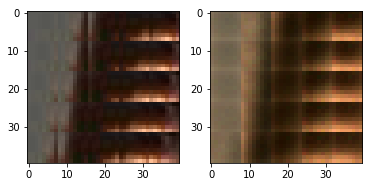

EPO: 15, recon_loss: 0.0038, total_loss: 0.0098, train_psnr:23.8712, validation_psnr:28.7811
EPO: 15, recon_loss: 0.0097, total_loss: 0.0170, train_psnr:23.9019, validation_psnr:28.9183
EPO: 15, recon_loss: 0.0130, total_loss: 0.0288, train_psnr:23.8558, validation_psnr:29.4308
EPO: 15, recon_loss: 0.0053, total_loss: 0.0128, train_psnr:23.9459, validation_psnr:29.2664
EPO: 15, recon_loss: 0.0290, total_loss: 0.0359, train_psnr:23.9305, validation_psnr:29.1085
EPO: 15, recon_loss: 0.0101, total_loss: 0.0152, train_psnr:23.9283, validation_psnr:28.9912
EPO: 15, recon_loss: 0.0092, total_loss: 0.0132, train_psnr:23.9230, validation_psnr:29.0248
EPO: 15, recon_loss: 0.0199, total_loss: 0.0282, train_psnr:23.9151, validation_psnr:28.8293
EPO: 15, recon_loss: 0.0085, total_loss: 0.0138, train_psnr:23.9857, validation_psnr:28.7749
EPO: 15, recon_loss: 0.0155, total_loss: 0.0240, train_psnr:23.9267, validation_psnr:28.7955
#########reconstruction test psnr: 27.5369 


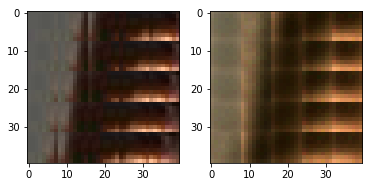

EPO: 15, recon_loss: 0.0121, total_loss: 0.0183, train_psnr:23.9524, validation_psnr:28.8004
EPO: 15, recon_loss: 0.0168, total_loss: 0.0238, train_psnr:23.8670, validation_psnr:28.9095
EPO: 15, recon_loss: 0.0265, total_loss: 0.0419, train_psnr:23.8159, validation_psnr:28.8633
EPO: 15, recon_loss: 0.0215, total_loss: 0.0349, train_psnr:23.7185, validation_psnr:29.2291
EPO: 15, recon_loss: 0.0248, total_loss: 0.0384, train_psnr:23.6487, validation_psnr:29.2642
EPO: 15, recon_loss: 0.0226, total_loss: 0.0351, train_psnr:23.6996, validation_psnr:29.3931
EPO: 15, recon_loss: 0.0139, total_loss: 0.0255, train_psnr:23.5883, validation_psnr:29.3423
EPO: 15, recon_loss: 0.0143, total_loss: 0.0262, train_psnr:23.5827, validation_psnr:28.8324
EPO: 15, recon_loss: 0.0083, total_loss: 0.0158, train_psnr:23.7255, validation_psnr:28.4414
EPO: 15, recon_loss: 0.0160, total_loss: 0.0261, train_psnr:23.7450, validation_psnr:28.7981
#########reconstruction test psnr: 27.5725 


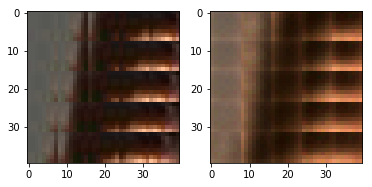

EPO: 15, recon_loss: 0.0180, total_loss: 0.0248, train_psnr:23.7220, validation_psnr:28.2816
EPO: 15, recon_loss: 0.0174, total_loss: 0.0296, train_psnr:23.7430, validation_psnr:28.6701
EPO: 15, recon_loss: 0.0259, total_loss: 0.0360, train_psnr:23.6755, validation_psnr:28.6345
EPO: 15, recon_loss: 0.0045, total_loss: 0.0137, train_psnr:23.6921, validation_psnr:28.4051
EPO: 15, recon_loss: 0.0202, total_loss: 0.0291, train_psnr:23.6660, validation_psnr:28.2931
EPO: 15, recon_loss: 0.0201, total_loss: 0.0297, train_psnr:23.6465, validation_psnr:28.1690
EPO: 15, recon_loss: 0.0077, total_loss: 0.0173, train_psnr:23.6909, validation_psnr:28.5624
EPO: 15, recon_loss: 0.0213, total_loss: 0.0314, train_psnr:23.6645, validation_psnr:28.3839
EPO: 15, recon_loss: 0.0112, total_loss: 0.0300, train_psnr:23.7271, validation_psnr:28.7156
EPO: 15, recon_loss: 0.0172, total_loss: 0.0334, train_psnr:23.7442, validation_psnr:29.1365
#########reconstruction test psnr: 27.8725 


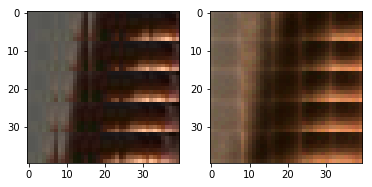

EPO: 15, recon_loss: 0.0355, total_loss: 0.0569, train_psnr:23.8083, validation_psnr:29.1124
EPO: 15, recon_loss: 0.0101, total_loss: 0.0281, train_psnr:23.8224, validation_psnr:29.0509
EPO: 15, recon_loss: 0.0194, total_loss: 0.0357, train_psnr:23.8005, validation_psnr:29.1067
EPO: 15, recon_loss: 0.0151, total_loss: 0.0311, train_psnr:23.6868, validation_psnr:29.3400
EPO: 15, recon_loss: 0.0194, total_loss: 0.0386, train_psnr:23.6481, validation_psnr:29.2373
EPO: 15, recon_loss: 0.0361, total_loss: 0.0537, train_psnr:23.7110, validation_psnr:29.0934
EPO: 15, recon_loss: 0.0323, total_loss: 0.0522, train_psnr:23.6380, validation_psnr:28.9311
EPO: 15, recon_loss: 0.0237, total_loss: 0.0415, train_psnr:23.5988, validation_psnr:28.9803
EPO: 15, recon_loss: 0.0064, total_loss: 0.0231, train_psnr:23.8013, validation_psnr:28.2105
EPO: 15, recon_loss: 0.0292, total_loss: 0.0461, train_psnr:23.7967, validation_psnr:28.2275
#########reconstruction test psnr: 27.2335 


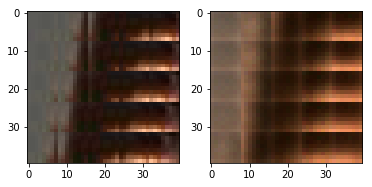

EPO: 15, recon_loss: 0.0461, total_loss: 0.0574, train_psnr:23.7520, validation_psnr:28.6582
EPO: 15, recon_loss: 0.0266, total_loss: 0.0325, train_psnr:23.7921, validation_psnr:28.0534
EPO: 15, recon_loss: 0.0117, total_loss: 0.0163, train_psnr:23.7663, validation_psnr:27.5092
EPO: 15, recon_loss: 0.0064, total_loss: 0.0134, train_psnr:23.8186, validation_psnr:28.3309
EPO: 15, recon_loss: 0.0077, total_loss: 0.0172, train_psnr:23.8650, validation_psnr:28.9211
EPO: 15, recon_loss: 0.0222, total_loss: 0.0302, train_psnr:23.8234, validation_psnr:29.0631
EPO: 15, recon_loss: 0.0085, total_loss: 0.0201, train_psnr:23.8135, validation_psnr:29.2386
EPO: 15, recon_loss: 0.0211, total_loss: 0.0296, train_psnr:23.8057, validation_psnr:29.2314
EPO: 15, recon_loss: 0.0022, total_loss: 0.0061, train_psnr:23.7377, validation_psnr:29.3042
EPO: 15, recon_loss: 0.0017, total_loss: 0.0043, train_psnr:23.7127, validation_psnr:29.2995
#########reconstruction test psnr: 27.9228 


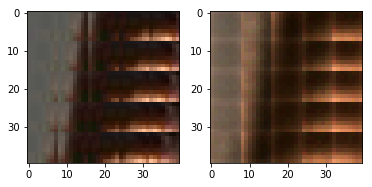

EPO: 15, recon_loss: 0.0070, total_loss: 0.0103, train_psnr:23.7923, validation_psnr:29.0754
EPO: 15, recon_loss: 0.0029, total_loss: 0.0047, train_psnr:23.7466, validation_psnr:28.9948
EPO: 15, recon_loss: 0.0061, total_loss: 0.0095, train_psnr:23.6773, validation_psnr:28.8302
EPO: 15, recon_loss: 0.0107, total_loss: 0.0226, train_psnr:23.6589, validation_psnr:28.9039
EPO: 15, recon_loss: 0.0073, total_loss: 0.0126, train_psnr:23.5368, validation_psnr:28.4150
EPO: 15, recon_loss: 0.0201, total_loss: 0.0259, train_psnr:23.4100, validation_psnr:28.2756
EPO: 15, recon_loss: 0.0088, total_loss: 0.0119, train_psnr:23.2695, validation_psnr:28.1537
EPO: 15, recon_loss: 0.0087, total_loss: 0.0124, train_psnr:23.1453, validation_psnr:28.3679
EPO: 15, recon_loss: 0.0151, total_loss: 0.0294, train_psnr:23.2552, validation_psnr:28.3142
EPO: 15, recon_loss: 0.0211, total_loss: 0.0328, train_psnr:23.4558, validation_psnr:28.2476
#########reconstruction test psnr: 27.0869 


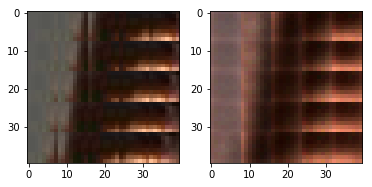

EPO: 15, recon_loss: 0.0226, total_loss: 0.0342, train_psnr:23.5442, validation_psnr:28.1204
EPO: 15, recon_loss: 0.0247, total_loss: 0.0378, train_psnr:23.6722, validation_psnr:28.3937
EPO: 15, recon_loss: 0.0104, total_loss: 0.0164, train_psnr:23.7031, validation_psnr:28.2146
EPO: 15, recon_loss: 0.0179, total_loss: 0.0246, train_psnr:23.8229, validation_psnr:28.0079
EPO: 15, recon_loss: 0.0098, total_loss: 0.0137, train_psnr:23.9207, validation_psnr:28.1544
EPO: 15, recon_loss: 0.0144, total_loss: 0.0204, train_psnr:23.9491, validation_psnr:28.3432
EPO: 15, recon_loss: 0.0077, total_loss: 0.0125, train_psnr:23.9484, validation_psnr:28.5304
EPO: 15, recon_loss: 0.0082, total_loss: 0.0127, train_psnr:23.9972, validation_psnr:28.4722
EPO: 15, recon_loss: 0.0087, total_loss: 0.0267, train_psnr:23.9762, validation_psnr:29.0824
EPO: 15, recon_loss: 0.0036, total_loss: 0.0106, train_psnr:24.0515, validation_psnr:28.4157
#########reconstruction test psnr: 27.2627 


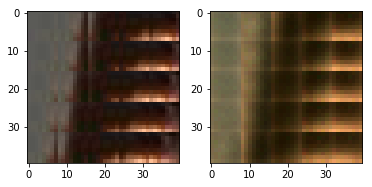

EPO: 15, recon_loss: 0.0220, total_loss: 0.0305, train_psnr:24.0049, validation_psnr:28.3611
EPO: 15, recon_loss: 0.0114, total_loss: 0.0171, train_psnr:24.0068, validation_psnr:28.3094
EPO: 15, recon_loss: 0.0124, total_loss: 0.0185, train_psnr:23.9956, validation_psnr:28.3877
EPO: 15, recon_loss: 0.0054, total_loss: 0.0085, train_psnr:23.9901, validation_psnr:28.5907
EPO: 15, recon_loss: 0.0038, total_loss: 0.0077, train_psnr:24.0436, validation_psnr:28.3465
EPO: 15, recon_loss: 0.0075, total_loss: 0.0118, train_psnr:24.0508, validation_psnr:28.1887
EPO: 15, recon_loss: 0.0066, total_loss: 0.0115, train_psnr:24.0710, validation_psnr:28.0794
EPO: 15, recon_loss: 0.0059, total_loss: 0.0093, train_psnr:24.0649, validation_psnr:28.0938
EPO: 15, recon_loss: 0.0140, total_loss: 0.0216, train_psnr:24.0280, validation_psnr:28.6081
EPO: 15, recon_loss: 0.0067, total_loss: 0.0123, train_psnr:24.0603, validation_psnr:28.7652
#########reconstruction test psnr: 27.5997 


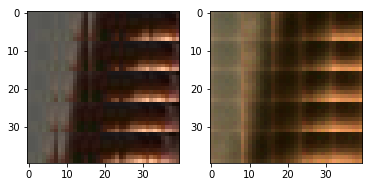

EPO: 15, recon_loss: 0.0166, total_loss: 0.0232, train_psnr:24.0201, validation_psnr:28.6496
EPO: 15, recon_loss: 0.0102, total_loss: 0.0177, train_psnr:23.9785, validation_psnr:28.7521
EPO: 15, recon_loss: 0.0078, total_loss: 0.0146, train_psnr:23.9171, validation_psnr:28.4236
EPO: 15, recon_loss: 0.0089, total_loss: 0.0252, train_psnr:23.8486, validation_psnr:28.9466
EPO: 15, recon_loss: 0.0100, total_loss: 0.0219, train_psnr:23.8489, validation_psnr:28.5055
EPO: 15, recon_loss: 0.0302, total_loss: 0.0400, train_psnr:23.8113, validation_psnr:28.5456
EPO: 15, recon_loss: 0.0203, total_loss: 0.0303, train_psnr:23.8106, validation_psnr:28.4615
EPO: 15, recon_loss: 0.0119, total_loss: 0.0197, train_psnr:23.7853, validation_psnr:28.3822
EPO: 15, recon_loss: 0.0362, total_loss: 0.0471, train_psnr:23.6451, validation_psnr:28.7436
EPO: 15, recon_loss: 0.0025, total_loss: 0.0074, train_psnr:23.6242, validation_psnr:28.4698
#########reconstruction test psnr: 27.3679 


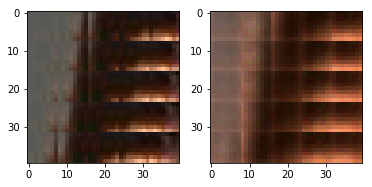

EPO: 15, recon_loss: 0.0110, total_loss: 0.0190, train_psnr:23.5994, validation_psnr:27.7230
EPO: 15, recon_loss: 0.0210, total_loss: 0.0283, train_psnr:23.5645, validation_psnr:27.6354
EPO: 15, recon_loss: 0.0101, total_loss: 0.0164, train_psnr:23.5542, validation_psnr:27.8114
EPO: 15, recon_loss: 0.0080, total_loss: 0.0153, train_psnr:23.5260, validation_psnr:28.1006
EPO: 15, recon_loss: 0.0130, total_loss: 0.0217, train_psnr:23.5558, validation_psnr:29.0273
EPO: 15, recon_loss: 0.0135, total_loss: 0.0239, train_psnr:23.5580, validation_psnr:29.3277
EPO: 15, recon_loss: 0.0175, total_loss: 0.0276, train_psnr:23.5518, validation_psnr:29.2756
EPO: 15, recon_loss: 0.0048, total_loss: 0.0107, train_psnr:23.5490, validation_psnr:29.2315
EPO: 15, recon_loss: 0.0202, total_loss: 0.0258, train_psnr:23.4936, validation_psnr:29.2359
EPO: 15, recon_loss: 0.0095, total_loss: 0.0136, train_psnr:23.7184, validation_psnr:29.1417
#########reconstruction test psnr: 27.8507 


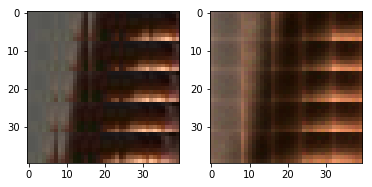

EPO: 15, recon_loss: 0.0195, total_loss: 0.0247, train_psnr:23.8062, validation_psnr:29.3196
EPO: 15, recon_loss: 0.0190, total_loss: 0.0274, train_psnr:23.9616, validation_psnr:29.1014
EPO: 15, recon_loss: 0.0099, total_loss: 0.0155, train_psnr:23.9642, validation_psnr:29.0216
EPO: 15, recon_loss: 0.0100, total_loss: 0.0159, train_psnr:23.9635, validation_psnr:28.8810
EPO: 15, recon_loss: 0.0156, total_loss: 0.0248, train_psnr:24.0551, validation_psnr:28.9325
EPO: 15, recon_loss: 0.0095, total_loss: 0.0176, train_psnr:24.0203, validation_psnr:28.7316
EPO: 15, recon_loss: 0.0269, total_loss: 0.0329, train_psnr:23.9174, validation_psnr:28.7628
EPO: 15, recon_loss: 0.0118, total_loss: 0.0216, train_psnr:23.8480, validation_psnr:28.9597
EPO: 15, recon_loss: 0.0171, total_loss: 0.0248, train_psnr:23.7756, validation_psnr:29.1096
EPO: 15, recon_loss: 0.0143, total_loss: 0.0255, train_psnr:23.8067, validation_psnr:29.2140
#########reconstruction test psnr: 27.9519 


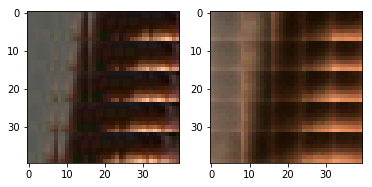

EPO: 15, recon_loss: 0.0031, total_loss: 0.0079, train_psnr:23.8602, validation_psnr:28.9667
EPO: 15, recon_loss: 0.0139, total_loss: 0.0193, train_psnr:23.8900, validation_psnr:28.9899
EPO: 15, recon_loss: 0.0085, total_loss: 0.0150, train_psnr:23.9136, validation_psnr:29.1283
EPO: 15, recon_loss: 0.0101, total_loss: 0.0170, train_psnr:23.9096, validation_psnr:29.2032
EPO: 15, recon_loss: 0.0110, total_loss: 0.0217, train_psnr:23.9216, validation_psnr:28.9473
EPO: 15, recon_loss: 0.0115, total_loss: 0.0192, train_psnr:23.9275, validation_psnr:28.7042
EPO: 15, recon_loss: 0.0271, total_loss: 0.0367, train_psnr:23.8612, validation_psnr:28.3901
EPO: 15, recon_loss: 0.0097, total_loss: 0.0184, train_psnr:23.8172, validation_psnr:28.6491
EPO: 15, recon_loss: 0.0234, total_loss: 0.0325, train_psnr:23.7395, validation_psnr:28.1959
EPO: 15, recon_loss: 0.0126, total_loss: 0.0244, train_psnr:23.7157, validation_psnr:28.6950
#########reconstruction test psnr: 27.4961 


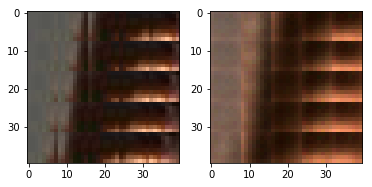

EPO: 15, recon_loss: 0.0049, total_loss: 0.0118, train_psnr:23.6648, validation_psnr:28.8684
EPO: 15, recon_loss: 0.0222, total_loss: 0.0323, train_psnr:23.6037, validation_psnr:28.7570
EPO: 15, recon_loss: 0.0075, total_loss: 0.0147, train_psnr:23.5419, validation_psnr:28.9114
EPO: 15, recon_loss: 0.0166, total_loss: 0.0245, train_psnr:23.4822, validation_psnr:28.9714
EPO: 15, recon_loss: 0.0060, total_loss: 0.0077, train_psnr:23.5209, validation_psnr:28.9212
EPO: 15, recon_loss: 0.0043, total_loss: 0.0070, train_psnr:23.6625, validation_psnr:28.9952
EPO: 15, recon_loss: 0.0106, total_loss: 0.0154, train_psnr:23.6929, validation_psnr:29.0578
EPO: 15, recon_loss: 0.0080, total_loss: 0.0135, train_psnr:23.6412, validation_psnr:28.9129
EPO: 15, recon_loss: 0.0116, total_loss: 0.0161, train_psnr:23.6074, validation_psnr:29.0628
EPO: 15, recon_loss: 0.0217, total_loss: 0.0407, train_psnr:23.6042, validation_psnr:29.2614
#########reconstruction test psnr: 27.9199 


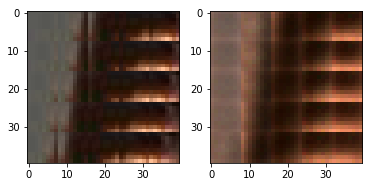

EPO: 15, recon_loss: 0.0165, total_loss: 0.0332, train_psnr:23.6405, validation_psnr:29.5257
EPO: 15, recon_loss: 0.0197, total_loss: 0.0419, train_psnr:23.5915, validation_psnr:29.3484
EPO: 15, recon_loss: 0.0154, total_loss: 0.0345, train_psnr:23.6293, validation_psnr:29.6784
EPO: 15, recon_loss: 0.0197, total_loss: 0.0420, train_psnr:23.5775, validation_psnr:29.4472
EPO: 15, recon_loss: 0.0061, total_loss: 0.0164, train_psnr:23.6431, validation_psnr:29.0778
EPO: 15, recon_loss: 0.0095, total_loss: 0.0172, train_psnr:23.6424, validation_psnr:28.0358
EPO: 15, recon_loss: 0.0212, total_loss: 0.0385, train_psnr:23.4795, validation_psnr:27.2712
EPO: 15, recon_loss: 0.0115, total_loss: 0.0249, train_psnr:23.7685, validation_psnr:29.0581
EPO: 15, recon_loss: 0.0098, total_loss: 0.0194, train_psnr:23.8108, validation_psnr:29.1282
EPO: 15, recon_loss: 0.0073, total_loss: 0.0259, train_psnr:23.8069, validation_psnr:29.3308
#########reconstruction test psnr: 28.0241 


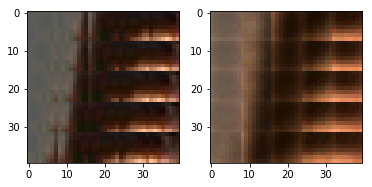

EPO: 15, recon_loss: 0.0101, total_loss: 0.0238, train_psnr:23.8488, validation_psnr:29.3939
EPO: 15, recon_loss: 0.0199, total_loss: 0.0333, train_psnr:23.8362, validation_psnr:29.4772
EPO: 15, recon_loss: 0.0091, total_loss: 0.0189, train_psnr:23.8598, validation_psnr:29.6082
EPO: 15, recon_loss: 0.0078, total_loss: 0.0170, train_psnr:23.8595, validation_psnr:29.4444
EPO: 15, recon_loss: 0.0134, total_loss: 0.0231, train_psnr:23.8514, validation_psnr:28.9853
EPO: 15, recon_loss: 0.0067, total_loss: 0.0158, train_psnr:23.7662, validation_psnr:29.2599
EPO: 15, recon_loss: 0.0246, total_loss: 0.0341, train_psnr:23.7061, validation_psnr:29.3003
EPO: 15, recon_loss: 0.0100, total_loss: 0.0182, train_psnr:23.6168, validation_psnr:29.3189
EPO: 15, recon_loss: 0.0067, total_loss: 0.0152, train_psnr:23.5620, validation_psnr:29.2625
EPO: 15, recon_loss: 0.0096, total_loss: 0.0159, train_psnr:23.5017, validation_psnr:28.6957
#########reconstruction test psnr: 27.5837 


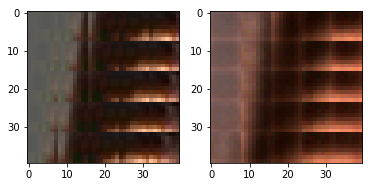

EPO: 15, recon_loss: 0.0052, total_loss: 0.0133, train_psnr:23.5453, validation_psnr:28.8795
EPO: 15, recon_loss: 0.0191, total_loss: 0.0319, train_psnr:23.6120, validation_psnr:28.8804
EPO: 15, recon_loss: 0.0184, total_loss: 0.0292, train_psnr:23.6181, validation_psnr:28.6884
EPO: 15, recon_loss: 0.0120, total_loss: 0.0238, train_psnr:23.6462, validation_psnr:29.0666
EPO: 15, recon_loss: 0.0220, total_loss: 0.0314, train_psnr:23.5930, validation_psnr:29.1972
EPO: 15, recon_loss: 0.0042, total_loss: 0.0119, train_psnr:23.6358, validation_psnr:28.8923
EPO: 15, recon_loss: 0.0193, total_loss: 0.0305, train_psnr:23.6602, validation_psnr:28.5747
EPO: 15, recon_loss: 0.0180, total_loss: 0.0239, train_psnr:23.6550, validation_psnr:28.9383
EPO: 15, recon_loss: 0.0149, total_loss: 0.0225, train_psnr:23.6611, validation_psnr:28.5818
EPO: 15, recon_loss: 0.0132, total_loss: 0.0218, train_psnr:23.6474, validation_psnr:28.7117
#########reconstruction test psnr: 27.5475 


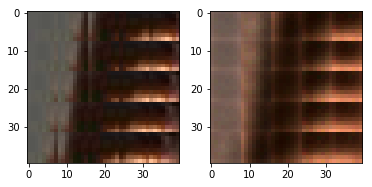

EPO: 15, recon_loss: 0.0047, total_loss: 0.0130, train_psnr:23.7685, validation_psnr:29.0945
EPO: 15, recon_loss: 0.0108, total_loss: 0.0217, train_psnr:23.8581, validation_psnr:29.0220
EPO: 15, recon_loss: 0.0079, total_loss: 0.0153, train_psnr:23.8394, validation_psnr:29.2213
EPO: 15, recon_loss: 0.0076, total_loss: 0.0134, train_psnr:23.8970, validation_psnr:28.9265
EPO: 15, recon_loss: 0.0081, total_loss: 0.0135, train_psnr:23.9105, validation_psnr:29.0262
EPO: 15, recon_loss: 0.0249, total_loss: 0.0425, train_psnr:23.7770, validation_psnr:28.9208
EPO: 15, recon_loss: 0.0200, total_loss: 0.0315, train_psnr:23.6927, validation_psnr:28.3413
EPO: 15, recon_loss: 0.0181, total_loss: 0.0259, train_psnr:23.5227, validation_psnr:28.4238
EPO: 15, recon_loss: 0.0217, total_loss: 0.0317, train_psnr:23.4214, validation_psnr:28.3448
EPO: 15, recon_loss: 0.0187, total_loss: 0.0241, train_psnr:23.3205, validation_psnr:28.6567
#########reconstruction test psnr: 27.4815 


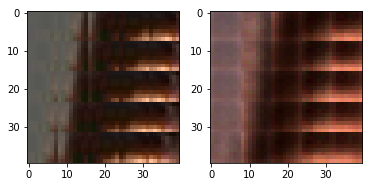

EPO: 15, recon_loss: 0.0078, total_loss: 0.0272, train_psnr:23.3234, validation_psnr:28.8654
EPO: 15, recon_loss: 0.0049, total_loss: 0.0175, train_psnr:23.3540, validation_psnr:28.5148
EPO: 15, recon_loss: 0.0209, total_loss: 0.0313, train_psnr:23.4683, validation_psnr:28.8599
EPO: 15, recon_loss: 0.0094, total_loss: 0.0181, train_psnr:23.5071, validation_psnr:29.0478
EPO: 15, recon_loss: 0.0214, total_loss: 0.0296, train_psnr:23.5546, validation_psnr:28.4867
EPO: 15, recon_loss: 0.0045, total_loss: 0.0072, train_psnr:23.6726, validation_psnr:28.9643
EPO: 15, recon_loss: 0.0031, total_loss: 0.0051, train_psnr:23.8099, validation_psnr:29.1132
EPO: 15, recon_loss: 0.0135, total_loss: 0.0181, train_psnr:23.8562, validation_psnr:29.0428
EPO: 15, recon_loss: 0.0038, total_loss: 0.0068, train_psnr:23.8806, validation_psnr:29.2016
EPO: 15, recon_loss: 0.0080, total_loss: 0.0118, train_psnr:23.9051, validation_psnr:29.1207
#########reconstruction test psnr: 27.8331 


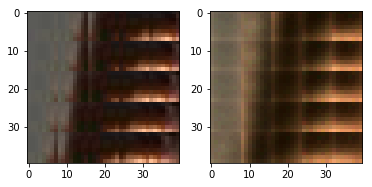

EPO: 15, recon_loss: 0.0139, total_loss: 0.0216, train_psnr:23.9289, validation_psnr:28.7930
EPO: 15, recon_loss: 0.0111, total_loss: 0.0191, train_psnr:23.9286, validation_psnr:28.4692
EPO: 15, recon_loss: 0.0138, total_loss: 0.0210, train_psnr:23.9051, validation_psnr:28.5314
EPO: 15, recon_loss: 0.0069, total_loss: 0.0125, train_psnr:23.9313, validation_psnr:28.3818
EPO: 15, recon_loss: 0.0094, total_loss: 0.0144, train_psnr:23.9457, validation_psnr:28.1467
EPO: 15, recon_loss: 0.0158, total_loss: 0.0259, train_psnr:23.9518, validation_psnr:28.6291
EPO: 15, recon_loss: 0.0146, total_loss: 0.0234, train_psnr:23.8563, validation_psnr:28.9642
EPO: 15, recon_loss: 0.0222, total_loss: 0.0272, train_psnr:23.7239, validation_psnr:28.7401
EPO: 15, recon_loss: 0.0155, total_loss: 0.0215, train_psnr:23.6423, validation_psnr:28.7342
EPO: 15, recon_loss: 0.0149, total_loss: 0.0203, train_psnr:23.5447, validation_psnr:28.8484
#########reconstruction test psnr: 27.6174 


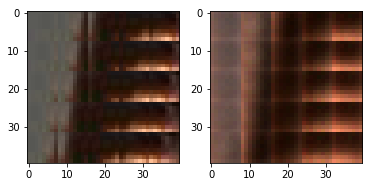

EPO: 15, recon_loss: 0.0186, total_loss: 0.0343, train_psnr:23.5534, validation_psnr:29.0033
EPO: 15, recon_loss: 0.0406, total_loss: 0.0558, train_psnr:23.6235, validation_psnr:28.6558
EPO: 15, recon_loss: 0.0220, total_loss: 0.0302, train_psnr:22.7874, validation_psnr:29.0914
EPO: 15, recon_loss: 0.0320, total_loss: 0.0414, train_psnr:19.9601, validation_psnr:28.0819
EPO: 15, recon_loss: 0.0130, total_loss: 0.0206, train_psnr:22.5951, validation_psnr:29.3983
EPO: 15, recon_loss: 0.0091, total_loss: 0.0164, train_psnr:23.7443, validation_psnr:27.8964
EPO: 15, recon_loss: 0.0037, total_loss: 0.0110, train_psnr:23.8129, validation_psnr:27.4480
EPO: 15, recon_loss: 0.0143, total_loss: 0.0191, train_psnr:23.7918, validation_psnr:27.7257
EPO: 15, recon_loss: 0.0070, total_loss: 0.0151, train_psnr:23.7207, validation_psnr:27.7615
EPO: 15, recon_loss: 0.0103, total_loss: 0.0149, train_psnr:23.6598, validation_psnr:27.8894
#########reconstruction test psnr: 26.8389 


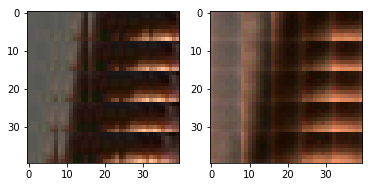

EPO: 15, recon_loss: 0.0073, total_loss: 0.0258, train_psnr:23.6288, validation_psnr:29.1081
EPO: 15, recon_loss: 0.0028, total_loss: 0.0108, train_psnr:23.6719, validation_psnr:28.8247
EPO: 15, recon_loss: 0.0092, total_loss: 0.0176, train_psnr:23.6741, validation_psnr:28.8738
EPO: 15, recon_loss: 0.0039, total_loss: 0.0077, train_psnr:23.6766, validation_psnr:28.7779
EPO: 15, recon_loss: 0.0027, total_loss: 0.0052, train_psnr:23.6753, validation_psnr:28.6179
EPO: 15, recon_loss: 0.0113, total_loss: 0.0221, train_psnr:23.6746, validation_psnr:29.0948
EPO: 15, recon_loss: 0.0116, total_loss: 0.0206, train_psnr:23.7786, validation_psnr:28.9592
EPO: 15, recon_loss: 0.0128, total_loss: 0.0224, train_psnr:23.7257, validation_psnr:29.0441
EPO: 15, recon_loss: 0.0149, total_loss: 0.0237, train_psnr:23.7935, validation_psnr:29.1936
EPO: 15, recon_loss: 0.0139, total_loss: 0.0220, train_psnr:23.7695, validation_psnr:28.9882
#########reconstruction test psnr: 27.6947 


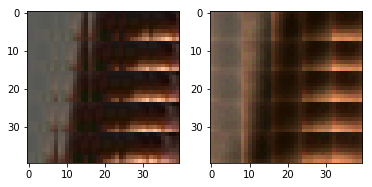

EPO: 16, recon_loss: 0.0080, total_loss: 0.0144, train_psnr:23.8727, validation_psnr:28.8963
EPO: 16, recon_loss: 0.0050, total_loss: 0.0079, train_psnr:23.9511, validation_psnr:28.6310
EPO: 16, recon_loss: 0.0127, total_loss: 0.0161, train_psnr:23.9798, validation_psnr:28.6974
EPO: 16, recon_loss: 0.0116, total_loss: 0.0165, train_psnr:23.9717, validation_psnr:28.6968
EPO: 16, recon_loss: 0.0066, total_loss: 0.0101, train_psnr:23.9522, validation_psnr:28.5885
EPO: 16, recon_loss: 0.0072, total_loss: 0.0236, train_psnr:23.8538, validation_psnr:29.3709
EPO: 16, recon_loss: 0.0033, total_loss: 0.0109, train_psnr:23.8519, validation_psnr:29.4964
EPO: 16, recon_loss: 0.0095, total_loss: 0.0166, train_psnr:23.8480, validation_psnr:29.5025
EPO: 16, recon_loss: 0.0126, total_loss: 0.0184, train_psnr:23.8418, validation_psnr:29.3890
EPO: 16, recon_loss: 0.0114, total_loss: 0.0176, train_psnr:23.8050, validation_psnr:29.2482
#########reconstruction test psnr: 27.9900 


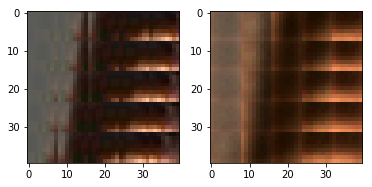

EPO: 16, recon_loss: 0.0112, total_loss: 0.0216, train_psnr:23.7836, validation_psnr:28.7811
EPO: 16, recon_loss: 0.0053, total_loss: 0.0129, train_psnr:23.8091, validation_psnr:29.0970
EPO: 16, recon_loss: 0.0081, total_loss: 0.0168, train_psnr:23.8156, validation_psnr:28.8577
EPO: 16, recon_loss: 0.0066, total_loss: 0.0116, train_psnr:23.8062, validation_psnr:29.0755
EPO: 16, recon_loss: 0.0102, total_loss: 0.0143, train_psnr:23.8135, validation_psnr:28.8070
EPO: 16, recon_loss: 0.0235, total_loss: 0.0303, train_psnr:23.6272, validation_psnr:27.8478
EPO: 16, recon_loss: 0.0095, total_loss: 0.0150, train_psnr:23.6168, validation_psnr:29.4672
EPO: 16, recon_loss: 0.0098, total_loss: 0.0181, train_psnr:23.4098, validation_psnr:29.2876
EPO: 16, recon_loss: 0.0117, total_loss: 0.0187, train_psnr:23.3060, validation_psnr:29.4534
EPO: 16, recon_loss: 0.0093, total_loss: 0.0148, train_psnr:23.1500, validation_psnr:29.1156
#########reconstruction test psnr: 27.9032 


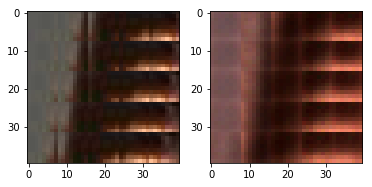

EPO: 16, recon_loss: 0.0103, total_loss: 0.0172, train_psnr:23.0847, validation_psnr:29.2125
EPO: 16, recon_loss: 0.0079, total_loss: 0.0121, train_psnr:23.3109, validation_psnr:29.3503
EPO: 16, recon_loss: 0.0099, total_loss: 0.0148, train_psnr:23.4886, validation_psnr:29.3420
EPO: 16, recon_loss: 0.0191, total_loss: 0.0244, train_psnr:23.5499, validation_psnr:29.2569
EPO: 16, recon_loss: 0.0053, total_loss: 0.0098, train_psnr:23.6475, validation_psnr:29.1783
EPO: 16, recon_loss: 0.0125, total_loss: 0.0157, train_psnr:23.6835, validation_psnr:29.2023
EPO: 16, recon_loss: 0.0220, total_loss: 0.0362, train_psnr:23.6680, validation_psnr:28.7320
EPO: 16, recon_loss: 0.0105, total_loss: 0.0202, train_psnr:23.6719, validation_psnr:28.7659
EPO: 16, recon_loss: 0.0204, total_loss: 0.0302, train_psnr:23.7243, validation_psnr:28.6501
EPO: 16, recon_loss: 0.0189, total_loss: 0.0263, train_psnr:23.7396, validation_psnr:28.8172
#########reconstruction test psnr: 27.6393 


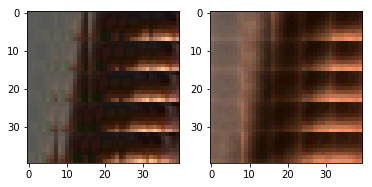

EPO: 16, recon_loss: 0.0278, total_loss: 0.0352, train_psnr:23.7396, validation_psnr:28.8867
EPO: 16, recon_loss: 0.0184, total_loss: 0.0302, train_psnr:23.8806, validation_psnr:28.9160
EPO: 16, recon_loss: 0.0090, total_loss: 0.0158, train_psnr:24.0128, validation_psnr:28.4414
EPO: 16, recon_loss: 0.0167, total_loss: 0.0228, train_psnr:24.0408, validation_psnr:27.8904
EPO: 16, recon_loss: 0.0111, total_loss: 0.0137, train_psnr:24.1002, validation_psnr:28.0808
EPO: 16, recon_loss: 0.0105, total_loss: 0.0154, train_psnr:24.0992, validation_psnr:27.4493
EPO: 16, recon_loss: 0.0034, total_loss: 0.0058, train_psnr:24.0772, validation_psnr:27.8209
EPO: 16, recon_loss: 0.0036, total_loss: 0.0077, train_psnr:24.0430, validation_psnr:28.5358
EPO: 16, recon_loss: 0.0119, total_loss: 0.0192, train_psnr:24.0006, validation_psnr:28.6639
EPO: 16, recon_loss: 0.0055, total_loss: 0.0122, train_psnr:23.9893, validation_psnr:29.0448
#########reconstruction test psnr: 27.7730 


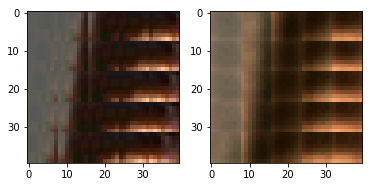

EPO: 16, recon_loss: 0.0083, total_loss: 0.0183, train_psnr:23.9408, validation_psnr:29.0801
EPO: 16, recon_loss: 0.0055, total_loss: 0.0162, train_psnr:23.9587, validation_psnr:29.1356
EPO: 16, recon_loss: 0.0052, total_loss: 0.0155, train_psnr:24.0006, validation_psnr:29.0720
EPO: 16, recon_loss: 0.0149, total_loss: 0.0230, train_psnr:24.0324, validation_psnr:28.7567
EPO: 16, recon_loss: 0.0033, total_loss: 0.0092, train_psnr:24.0610, validation_psnr:28.9399
EPO: 16, recon_loss: 0.0117, total_loss: 0.0190, train_psnr:24.0682, validation_psnr:29.1284
EPO: 16, recon_loss: 0.0211, total_loss: 0.0402, train_psnr:24.0414, validation_psnr:29.7190
EPO: 16, recon_loss: 0.0050, total_loss: 0.0125, train_psnr:24.1262, validation_psnr:29.4361
EPO: 16, recon_loss: 0.0300, total_loss: 0.0363, train_psnr:24.0983, validation_psnr:29.2553
EPO: 16, recon_loss: 0.0067, total_loss: 0.0117, train_psnr:24.1206, validation_psnr:29.0791
#########reconstruction test psnr: 27.8640 


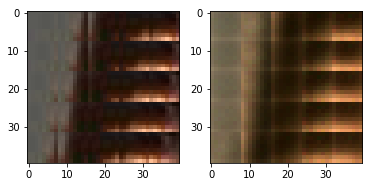

EPO: 16, recon_loss: 0.0091, total_loss: 0.0128, train_psnr:24.0919, validation_psnr:29.1304
EPO: 16, recon_loss: 0.0153, total_loss: 0.0234, train_psnr:24.1091, validation_psnr:28.9890
EPO: 16, recon_loss: 0.0073, total_loss: 0.0128, train_psnr:24.1706, validation_psnr:29.0114
EPO: 16, recon_loss: 0.0152, total_loss: 0.0224, train_psnr:24.1067, validation_psnr:28.5822
EPO: 16, recon_loss: 0.0091, total_loss: 0.0136, train_psnr:24.1240, validation_psnr:28.8769
EPO: 16, recon_loss: 0.0164, total_loss: 0.0220, train_psnr:24.0180, validation_psnr:29.2691
EPO: 16, recon_loss: 0.0296, total_loss: 0.0437, train_psnr:23.9693, validation_psnr:29.1633
EPO: 16, recon_loss: 0.0148, total_loss: 0.0273, train_psnr:23.8640, validation_psnr:29.4066
EPO: 16, recon_loss: 0.0328, total_loss: 0.0457, train_psnr:23.8079, validation_psnr:29.4009
EPO: 16, recon_loss: 0.0177, total_loss: 0.0297, train_psnr:23.8494, validation_psnr:29.5709
#########reconstruction test psnr: 28.3074 


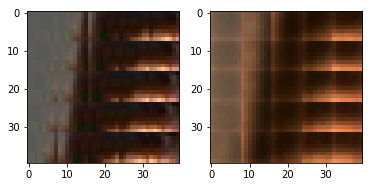

EPO: 16, recon_loss: 0.0151, total_loss: 0.0274, train_psnr:23.7085, validation_psnr:29.4193
EPO: 16, recon_loss: 0.0074, total_loss: 0.0187, train_psnr:23.8267, validation_psnr:28.8943
EPO: 16, recon_loss: 0.0075, total_loss: 0.0148, train_psnr:23.9021, validation_psnr:28.6553
EPO: 16, recon_loss: 0.0138, total_loss: 0.0244, train_psnr:23.9024, validation_psnr:28.7181
EPO: 16, recon_loss: 0.0107, total_loss: 0.0178, train_psnr:23.8506, validation_psnr:28.2975
EPO: 16, recon_loss: 0.0147, total_loss: 0.0265, train_psnr:23.9071, validation_psnr:29.1232
EPO: 16, recon_loss: 0.0101, total_loss: 0.0251, train_psnr:23.8635, validation_psnr:28.8490
EPO: 16, recon_loss: 0.0042, total_loss: 0.0134, train_psnr:23.8616, validation_psnr:28.4081
EPO: 16, recon_loss: 0.0273, total_loss: 0.0343, train_psnr:23.8026, validation_psnr:28.5458
EPO: 16, recon_loss: 0.0099, total_loss: 0.0183, train_psnr:23.8387, validation_psnr:28.4704
#########reconstruction test psnr: 27.4237 


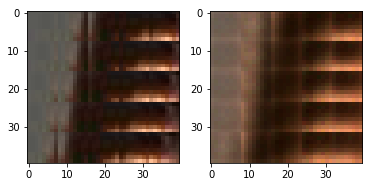

EPO: 16, recon_loss: 0.0095, total_loss: 0.0187, train_psnr:23.8583, validation_psnr:28.6692
EPO: 16, recon_loss: 0.0157, total_loss: 0.0324, train_psnr:23.8300, validation_psnr:28.4775
EPO: 16, recon_loss: 0.0101, total_loss: 0.0285, train_psnr:23.8939, validation_psnr:28.7990
EPO: 16, recon_loss: 0.0267, total_loss: 0.0460, train_psnr:23.9486, validation_psnr:29.3177
EPO: 16, recon_loss: 0.0270, total_loss: 0.0451, train_psnr:23.9952, validation_psnr:29.3192
EPO: 16, recon_loss: 0.0103, total_loss: 0.0273, train_psnr:23.9880, validation_psnr:29.2172
EPO: 16, recon_loss: 0.0335, total_loss: 0.0536, train_psnr:23.9681, validation_psnr:29.5222
EPO: 16, recon_loss: 0.0132, total_loss: 0.0298, train_psnr:23.8360, validation_psnr:29.5154
EPO: 16, recon_loss: 0.0243, total_loss: 0.0419, train_psnr:23.7656, validation_psnr:29.3437
EPO: 16, recon_loss: 0.0295, total_loss: 0.0469, train_psnr:23.9016, validation_psnr:29.5112
#########reconstruction test psnr: 28.3187 


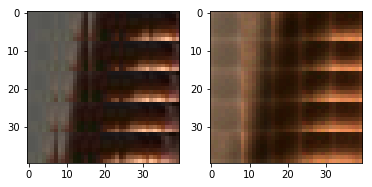

EPO: 16, recon_loss: 0.0222, total_loss: 0.0408, train_psnr:23.8233, validation_psnr:29.1720
EPO: 16, recon_loss: 0.0228, total_loss: 0.0388, train_psnr:23.7709, validation_psnr:29.1463
EPO: 16, recon_loss: 0.0060, total_loss: 0.0220, train_psnr:23.9754, validation_psnr:28.4645
EPO: 16, recon_loss: 0.0414, total_loss: 0.0554, train_psnr:23.9769, validation_psnr:28.4816
EPO: 16, recon_loss: 0.0340, total_loss: 0.0429, train_psnr:23.9852, validation_psnr:28.3744
EPO: 16, recon_loss: 0.0119, total_loss: 0.0171, train_psnr:23.9750, validation_psnr:28.0504
EPO: 16, recon_loss: 0.0105, total_loss: 0.0153, train_psnr:23.9463, validation_psnr:27.8745
EPO: 16, recon_loss: 0.0044, total_loss: 0.0117, train_psnr:24.0306, validation_psnr:28.4035
EPO: 16, recon_loss: 0.0093, total_loss: 0.0197, train_psnr:24.0399, validation_psnr:29.1365
EPO: 16, recon_loss: 0.0147, total_loss: 0.0242, train_psnr:23.9951, validation_psnr:29.2479
#########reconstruction test psnr: 28.0228 


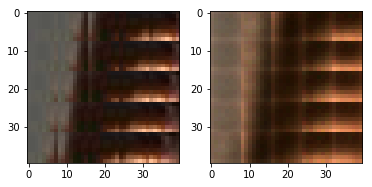

EPO: 16, recon_loss: 0.0097, total_loss: 0.0209, train_psnr:23.9721, validation_psnr:29.4555
EPO: 16, recon_loss: 0.0189, total_loss: 0.0302, train_psnr:23.9830, validation_psnr:29.3323
EPO: 16, recon_loss: 0.0015, total_loss: 0.0047, train_psnr:23.9375, validation_psnr:29.4603
EPO: 16, recon_loss: 0.0024, total_loss: 0.0058, train_psnr:23.9043, validation_psnr:29.4584
EPO: 16, recon_loss: 0.0062, total_loss: 0.0090, train_psnr:23.9502, validation_psnr:29.2281
EPO: 16, recon_loss: 0.0031, total_loss: 0.0051, train_psnr:23.9024, validation_psnr:29.0520
EPO: 16, recon_loss: 0.0077, total_loss: 0.0116, train_psnr:23.8314, validation_psnr:28.8602
EPO: 16, recon_loss: 0.0079, total_loss: 0.0156, train_psnr:23.7967, validation_psnr:28.8668
EPO: 16, recon_loss: 0.0107, total_loss: 0.0164, train_psnr:23.6483, validation_psnr:28.3666
EPO: 16, recon_loss: 0.0216, total_loss: 0.0279, train_psnr:23.5376, validation_psnr:28.3881
#########reconstruction test psnr: 27.3295 


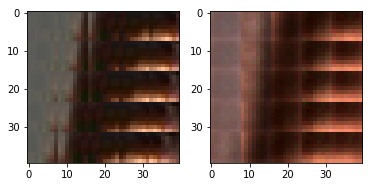

EPO: 16, recon_loss: 0.0080, total_loss: 0.0112, train_psnr:23.3862, validation_psnr:28.3622
EPO: 16, recon_loss: 0.0113, total_loss: 0.0147, train_psnr:23.2775, validation_psnr:28.2830
EPO: 16, recon_loss: 0.0152, total_loss: 0.0293, train_psnr:23.4529, validation_psnr:28.4931
EPO: 16, recon_loss: 0.0282, total_loss: 0.0429, train_psnr:23.6308, validation_psnr:28.4298
EPO: 16, recon_loss: 0.0230, total_loss: 0.0371, train_psnr:23.7357, validation_psnr:28.4005
EPO: 16, recon_loss: 0.0151, total_loss: 0.0251, train_psnr:23.8434, validation_psnr:28.5624
EPO: 16, recon_loss: 0.0157, total_loss: 0.0224, train_psnr:23.8702, validation_psnr:28.4157
EPO: 16, recon_loss: 0.0135, total_loss: 0.0201, train_psnr:24.0186, validation_psnr:28.1374
EPO: 16, recon_loss: 0.0106, total_loss: 0.0144, train_psnr:24.0999, validation_psnr:28.4094
EPO: 16, recon_loss: 0.0134, total_loss: 0.0201, train_psnr:24.0952, validation_psnr:28.7120
#########reconstruction test psnr: 27.4903 


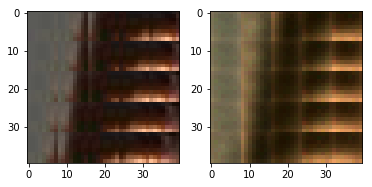

EPO: 16, recon_loss: 0.0064, total_loss: 0.0102, train_psnr:24.1112, validation_psnr:28.7533
EPO: 16, recon_loss: 0.0086, total_loss: 0.0140, train_psnr:24.1480, validation_psnr:28.7124
EPO: 16, recon_loss: 0.0081, total_loss: 0.0256, train_psnr:24.1981, validation_psnr:29.0007
EPO: 16, recon_loss: 0.0029, total_loss: 0.0098, train_psnr:24.2188, validation_psnr:28.5008
EPO: 16, recon_loss: 0.0263, total_loss: 0.0348, train_psnr:24.1940, validation_psnr:28.4737
EPO: 16, recon_loss: 0.0124, total_loss: 0.0184, train_psnr:24.1743, validation_psnr:28.4795
EPO: 16, recon_loss: 0.0140, total_loss: 0.0212, train_psnr:24.1554, validation_psnr:28.7571
EPO: 16, recon_loss: 0.0051, total_loss: 0.0081, train_psnr:24.1758, validation_psnr:28.6349
EPO: 16, recon_loss: 0.0041, total_loss: 0.0076, train_psnr:24.2214, validation_psnr:28.4374
EPO: 16, recon_loss: 0.0091, total_loss: 0.0143, train_psnr:24.2240, validation_psnr:28.0929
#########reconstruction test psnr: 27.0495 


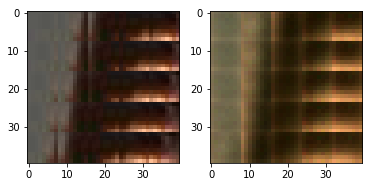

EPO: 16, recon_loss: 0.0035, total_loss: 0.0077, train_psnr:24.2525, validation_psnr:28.1035
EPO: 16, recon_loss: 0.0048, total_loss: 0.0079, train_psnr:24.2366, validation_psnr:28.2501
EPO: 16, recon_loss: 0.0118, total_loss: 0.0192, train_psnr:24.1907, validation_psnr:28.9767
EPO: 16, recon_loss: 0.0063, total_loss: 0.0121, train_psnr:24.2233, validation_psnr:28.9852
EPO: 16, recon_loss: 0.0219, total_loss: 0.0283, train_psnr:24.1769, validation_psnr:28.8365
EPO: 16, recon_loss: 0.0084, total_loss: 0.0157, train_psnr:24.1195, validation_psnr:28.9262
EPO: 16, recon_loss: 0.0064, total_loss: 0.0124, train_psnr:24.0714, validation_psnr:28.5674
EPO: 16, recon_loss: 0.0088, total_loss: 0.0245, train_psnr:24.0276, validation_psnr:28.8460
EPO: 16, recon_loss: 0.0089, total_loss: 0.0197, train_psnr:23.9921, validation_psnr:28.9021
EPO: 16, recon_loss: 0.0365, total_loss: 0.0457, train_psnr:23.9730, validation_psnr:28.5291
#########reconstruction test psnr: 27.4628 


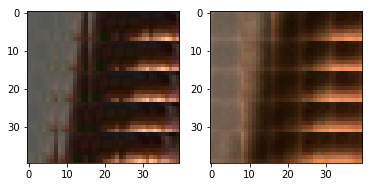

EPO: 16, recon_loss: 0.0124, total_loss: 0.0204, train_psnr:23.9793, validation_psnr:28.6629
EPO: 16, recon_loss: 0.0173, total_loss: 0.0261, train_psnr:23.9070, validation_psnr:28.9103
EPO: 16, recon_loss: 0.0084, total_loss: 0.0182, train_psnr:23.8224, validation_psnr:29.0097
EPO: 16, recon_loss: 0.0015, total_loss: 0.0061, train_psnr:23.7652, validation_psnr:28.4951
EPO: 16, recon_loss: 0.0140, total_loss: 0.0217, train_psnr:23.7484, validation_psnr:28.2364
EPO: 16, recon_loss: 0.0138, total_loss: 0.0189, train_psnr:23.7298, validation_psnr:28.0044
EPO: 16, recon_loss: 0.0109, total_loss: 0.0188, train_psnr:23.6977, validation_psnr:28.1342
EPO: 16, recon_loss: 0.0102, total_loss: 0.0202, train_psnr:23.6359, validation_psnr:29.1747
EPO: 16, recon_loss: 0.0159, total_loss: 0.0246, train_psnr:23.7130, validation_psnr:29.1338
EPO: 16, recon_loss: 0.0136, total_loss: 0.0237, train_psnr:23.7078, validation_psnr:29.5276
#########reconstruction test psnr: 28.2336 


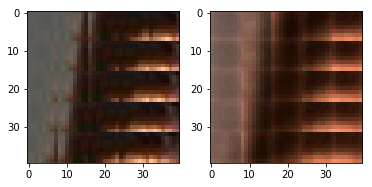

EPO: 16, recon_loss: 0.0134, total_loss: 0.0224, train_psnr:23.7036, validation_psnr:29.5060
EPO: 16, recon_loss: 0.0047, total_loss: 0.0103, train_psnr:23.6891, validation_psnr:29.4673
EPO: 16, recon_loss: 0.0194, total_loss: 0.0280, train_psnr:23.6090, validation_psnr:29.5015
EPO: 16, recon_loss: 0.0091, total_loss: 0.0130, train_psnr:23.9238, validation_psnr:29.3174
EPO: 16, recon_loss: 0.0183, total_loss: 0.0252, train_psnr:24.0067, validation_psnr:29.3893
EPO: 16, recon_loss: 0.0189, total_loss: 0.0265, train_psnr:24.0989, validation_psnr:29.2744
EPO: 16, recon_loss: 0.0099, total_loss: 0.0150, train_psnr:24.1105, validation_psnr:29.1385
EPO: 16, recon_loss: 0.0093, total_loss: 0.0150, train_psnr:24.1810, validation_psnr:28.8610
EPO: 16, recon_loss: 0.0121, total_loss: 0.0197, train_psnr:24.2437, validation_psnr:28.9397
EPO: 16, recon_loss: 0.0110, total_loss: 0.0192, train_psnr:24.1741, validation_psnr:28.8151
#########reconstruction test psnr: 27.6474 


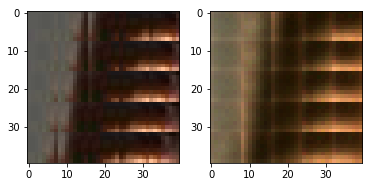

EPO: 16, recon_loss: 0.0197, total_loss: 0.0263, train_psnr:24.0578, validation_psnr:29.1110
EPO: 16, recon_loss: 0.0125, total_loss: 0.0226, train_psnr:23.9966, validation_psnr:29.0995
EPO: 16, recon_loss: 0.0202, total_loss: 0.0270, train_psnr:23.9252, validation_psnr:29.0717
EPO: 16, recon_loss: 0.0100, total_loss: 0.0178, train_psnr:23.9825, validation_psnr:29.2209
EPO: 16, recon_loss: 0.0050, total_loss: 0.0096, train_psnr:24.0234, validation_psnr:29.1693
EPO: 16, recon_loss: 0.0099, total_loss: 0.0153, train_psnr:24.0589, validation_psnr:29.2863
EPO: 16, recon_loss: 0.0084, total_loss: 0.0152, train_psnr:24.0742, validation_psnr:29.3467
EPO: 16, recon_loss: 0.0130, total_loss: 0.0217, train_psnr:24.0768, validation_psnr:29.3579
EPO: 16, recon_loss: 0.0099, total_loss: 0.0187, train_psnr:24.1079, validation_psnr:28.9603
EPO: 16, recon_loss: 0.0138, total_loss: 0.0219, train_psnr:24.0795, validation_psnr:28.9105
#########reconstruction test psnr: 27.7486 


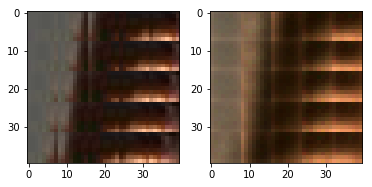

EPO: 16, recon_loss: 0.0316, total_loss: 0.0411, train_psnr:24.0079, validation_psnr:28.4241
EPO: 16, recon_loss: 0.0094, total_loss: 0.0188, train_psnr:23.9597, validation_psnr:28.8713
EPO: 16, recon_loss: 0.0290, total_loss: 0.0404, train_psnr:23.8672, validation_psnr:28.3390
EPO: 16, recon_loss: 0.0071, total_loss: 0.0152, train_psnr:23.8593, validation_psnr:28.8899
EPO: 16, recon_loss: 0.0050, total_loss: 0.0121, train_psnr:23.8022, validation_psnr:29.0014
EPO: 16, recon_loss: 0.0245, total_loss: 0.0360, train_psnr:23.7351, validation_psnr:29.0185
EPO: 16, recon_loss: 0.0091, total_loss: 0.0170, train_psnr:23.6691, validation_psnr:29.1642
EPO: 16, recon_loss: 0.0229, total_loss: 0.0306, train_psnr:23.6163, validation_psnr:28.9998
EPO: 16, recon_loss: 0.0058, total_loss: 0.0077, train_psnr:23.7080, validation_psnr:29.1093
EPO: 16, recon_loss: 0.0038, total_loss: 0.0066, train_psnr:23.8343, validation_psnr:29.1253
#########reconstruction test psnr: 27.8958 


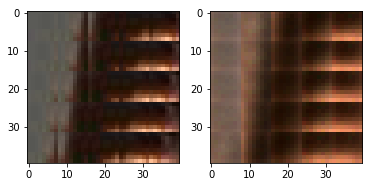

EPO: 16, recon_loss: 0.0131, total_loss: 0.0185, train_psnr:23.7957, validation_psnr:29.3672
EPO: 16, recon_loss: 0.0056, total_loss: 0.0115, train_psnr:23.7997, validation_psnr:29.0363
EPO: 16, recon_loss: 0.0151, total_loss: 0.0218, train_psnr:23.7577, validation_psnr:29.1679
EPO: 16, recon_loss: 0.0204, total_loss: 0.0395, train_psnr:23.7374, validation_psnr:29.6477
EPO: 16, recon_loss: 0.0149, total_loss: 0.0318, train_psnr:23.7738, validation_psnr:29.7260
EPO: 16, recon_loss: 0.0257, total_loss: 0.0483, train_psnr:23.7098, validation_psnr:29.4239
EPO: 16, recon_loss: 0.0135, total_loss: 0.0306, train_psnr:23.7673, validation_psnr:29.8560
EPO: 16, recon_loss: 0.0263, total_loss: 0.0472, train_psnr:23.7373, validation_psnr:29.5868
EPO: 16, recon_loss: 0.0059, total_loss: 0.0162, train_psnr:23.7975, validation_psnr:29.1073
EPO: 16, recon_loss: 0.0140, total_loss: 0.0212, train_psnr:23.7961, validation_psnr:28.2413
#########reconstruction test psnr: 27.2282 


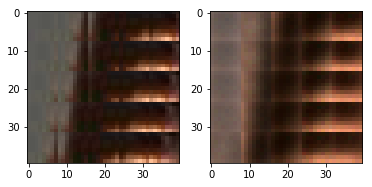

EPO: 16, recon_loss: 0.0206, total_loss: 0.0360, train_psnr:23.7684, validation_psnr:28.1171
EPO: 16, recon_loss: 0.0108, total_loss: 0.0223, train_psnr:23.9319, validation_psnr:29.2102
EPO: 16, recon_loss: 0.0097, total_loss: 0.0195, train_psnr:23.9701, validation_psnr:29.3015
EPO: 16, recon_loss: 0.0080, total_loss: 0.0256, train_psnr:23.9429, validation_psnr:29.6563
EPO: 16, recon_loss: 0.0098, total_loss: 0.0237, train_psnr:24.0031, validation_psnr:29.6830
EPO: 16, recon_loss: 0.0269, total_loss: 0.0395, train_psnr:23.9770, validation_psnr:29.6390
EPO: 16, recon_loss: 0.0058, total_loss: 0.0152, train_psnr:24.0205, validation_psnr:29.7191
EPO: 16, recon_loss: 0.0057, total_loss: 0.0144, train_psnr:24.0144, validation_psnr:29.6314
EPO: 16, recon_loss: 0.0131, total_loss: 0.0240, train_psnr:23.9973, validation_psnr:29.0908
EPO: 16, recon_loss: 0.0050, total_loss: 0.0141, train_psnr:23.9063, validation_psnr:29.3944
#########reconstruction test psnr: 28.1990 


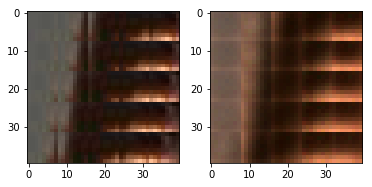

EPO: 16, recon_loss: 0.0275, total_loss: 0.0360, train_psnr:23.8465, validation_psnr:29.3223
EPO: 16, recon_loss: 0.0059, total_loss: 0.0145, train_psnr:23.7620, validation_psnr:29.3864
EPO: 16, recon_loss: 0.0075, total_loss: 0.0156, train_psnr:23.6925, validation_psnr:29.3843
EPO: 16, recon_loss: 0.0094, total_loss: 0.0155, train_psnr:23.6727, validation_psnr:28.7932
EPO: 16, recon_loss: 0.0047, total_loss: 0.0139, train_psnr:23.7074, validation_psnr:29.0425
EPO: 16, recon_loss: 0.0230, total_loss: 0.0341, train_psnr:23.7540, validation_psnr:29.2126
EPO: 16, recon_loss: 0.0142, total_loss: 0.0260, train_psnr:23.7788, validation_psnr:29.0744
EPO: 16, recon_loss: 0.0111, total_loss: 0.0202, train_psnr:23.7795, validation_psnr:29.2879
EPO: 16, recon_loss: 0.0112, total_loss: 0.0314, train_psnr:23.7564, validation_psnr:28.7777
EPO: 16, recon_loss: 0.0039, total_loss: 0.0118, train_psnr:23.7873, validation_psnr:29.0479
#########reconstruction test psnr: 27.8845 


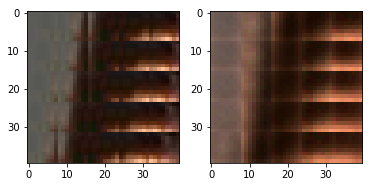

EPO: 16, recon_loss: 0.0249, total_loss: 0.0382, train_psnr:23.8048, validation_psnr:29.2901
EPO: 16, recon_loss: 0.0124, total_loss: 0.0171, train_psnr:23.7982, validation_psnr:29.0562
EPO: 16, recon_loss: 0.0131, total_loss: 0.0203, train_psnr:23.7972, validation_psnr:28.8894
EPO: 16, recon_loss: 0.0087, total_loss: 0.0212, train_psnr:23.7789, validation_psnr:29.4242
EPO: 16, recon_loss: 0.0044, total_loss: 0.0127, train_psnr:23.9437, validation_psnr:29.2219
EPO: 16, recon_loss: 0.0158, total_loss: 0.0250, train_psnr:24.0155, validation_psnr:29.2513
EPO: 16, recon_loss: 0.0062, total_loss: 0.0127, train_psnr:24.0186, validation_psnr:29.2694
EPO: 16, recon_loss: 0.0104, total_loss: 0.0158, train_psnr:24.0507, validation_psnr:29.1105
EPO: 16, recon_loss: 0.0189, total_loss: 0.0318, train_psnr:24.0575, validation_psnr:28.8925
EPO: 16, recon_loss: 0.0257, total_loss: 0.0422, train_psnr:23.9277, validation_psnr:28.8584
#########reconstruction test psnr: 27.7352 


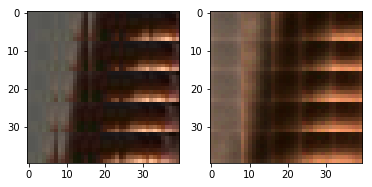

EPO: 16, recon_loss: 0.0194, total_loss: 0.0293, train_psnr:23.7951, validation_psnr:28.3395
EPO: 16, recon_loss: 0.0181, total_loss: 0.0283, train_psnr:23.6342, validation_psnr:28.6326
EPO: 16, recon_loss: 0.0260, total_loss: 0.0346, train_psnr:23.4973, validation_psnr:28.2869
EPO: 16, recon_loss: 0.0107, total_loss: 0.0157, train_psnr:23.4264, validation_psnr:28.7054
EPO: 16, recon_loss: 0.0058, total_loss: 0.0222, train_psnr:23.4671, validation_psnr:28.8065
EPO: 16, recon_loss: 0.0097, total_loss: 0.0217, train_psnr:23.5117, validation_psnr:28.9118
EPO: 16, recon_loss: 0.0156, total_loss: 0.0267, train_psnr:23.5985, validation_psnr:29.0971
EPO: 16, recon_loss: 0.0133, total_loss: 0.0222, train_psnr:23.6619, validation_psnr:29.1982
EPO: 16, recon_loss: 0.0224, total_loss: 0.0325, train_psnr:23.6936, validation_psnr:28.5657
EPO: 16, recon_loss: 0.0037, total_loss: 0.0056, train_psnr:23.8504, validation_psnr:29.1184
#########reconstruction test psnr: 27.9172 


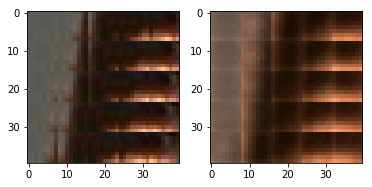

EPO: 16, recon_loss: 0.0068, total_loss: 0.0105, train_psnr:23.9702, validation_psnr:29.2516
EPO: 16, recon_loss: 0.0081, total_loss: 0.0115, train_psnr:23.9927, validation_psnr:29.2970
EPO: 16, recon_loss: 0.0036, total_loss: 0.0064, train_psnr:24.0274, validation_psnr:29.3815
EPO: 16, recon_loss: 0.0095, total_loss: 0.0141, train_psnr:24.0408, validation_psnr:29.2883
EPO: 16, recon_loss: 0.0149, total_loss: 0.0238, train_psnr:24.0647, validation_psnr:29.1867
EPO: 16, recon_loss: 0.0122, total_loss: 0.0198, train_psnr:24.0826, validation_psnr:28.6388
EPO: 16, recon_loss: 0.0126, total_loss: 0.0203, train_psnr:24.0319, validation_psnr:28.7228
EPO: 16, recon_loss: 0.0088, total_loss: 0.0140, train_psnr:24.0956, validation_psnr:28.5942
EPO: 16, recon_loss: 0.0150, total_loss: 0.0196, train_psnr:24.0887, validation_psnr:28.2275
EPO: 16, recon_loss: 0.0135, total_loss: 0.0223, train_psnr:24.0806, validation_psnr:28.8555
#########reconstruction test psnr: 27.7354 


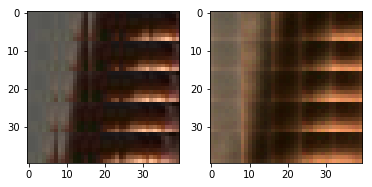

EPO: 16, recon_loss: 0.0131, total_loss: 0.0219, train_psnr:23.9660, validation_psnr:29.1462
EPO: 16, recon_loss: 0.0233, total_loss: 0.0283, train_psnr:23.8566, validation_psnr:29.0965
EPO: 16, recon_loss: 0.0131, total_loss: 0.0194, train_psnr:23.7580, validation_psnr:28.9225
EPO: 16, recon_loss: 0.0171, total_loss: 0.0230, train_psnr:23.6576, validation_psnr:28.8930
EPO: 16, recon_loss: 0.0225, total_loss: 0.0399, train_psnr:23.7210, validation_psnr:28.9029
EPO: 16, recon_loss: 0.0258, total_loss: 0.0355, train_psnr:23.7233, validation_psnr:29.1466
EPO: 16, recon_loss: 0.0284, total_loss: 0.0375, train_psnr:21.5259, validation_psnr:27.9636
EPO: 16, recon_loss: 0.0197, total_loss: 0.0267, train_psnr:21.3110, validation_psnr:29.2808
EPO: 16, recon_loss: 0.0136, total_loss: 0.0211, train_psnr:22.6504, validation_psnr:29.4957
EPO: 16, recon_loss: 0.0046, total_loss: 0.0110, train_psnr:23.9605, validation_psnr:27.8131
#########reconstruction test psnr: 26.8418 


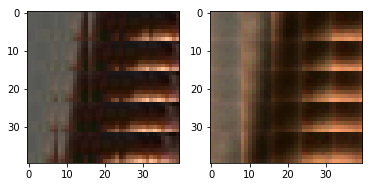

EPO: 16, recon_loss: 0.0057, total_loss: 0.0131, train_psnr:23.9717, validation_psnr:27.7488
EPO: 16, recon_loss: 0.0158, total_loss: 0.0197, train_psnr:23.9186, validation_psnr:27.7816
EPO: 16, recon_loss: 0.0097, total_loss: 0.0185, train_psnr:23.8463, validation_psnr:27.9977
EPO: 16, recon_loss: 0.0169, total_loss: 0.0222, train_psnr:23.7683, validation_psnr:27.8452
EPO: 16, recon_loss: 0.0064, total_loss: 0.0228, train_psnr:23.7574, validation_psnr:29.3263
EPO: 16, recon_loss: 0.0027, total_loss: 0.0105, train_psnr:23.7968, validation_psnr:28.9152
EPO: 16, recon_loss: 0.0114, total_loss: 0.0190, train_psnr:23.7953, validation_psnr:28.8306
EPO: 16, recon_loss: 0.0024, total_loss: 0.0055, train_psnr:23.8136, validation_psnr:28.9587
EPO: 16, recon_loss: 0.0032, total_loss: 0.0057, train_psnr:23.8103, validation_psnr:28.8374
EPO: 16, recon_loss: 0.0138, total_loss: 0.0231, train_psnr:23.8405, validation_psnr:29.2432
#########reconstruction test psnr: 27.9957 


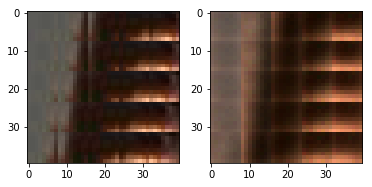

EPO: 16, recon_loss: 0.0107, total_loss: 0.0201, train_psnr:23.9222, validation_psnr:29.0720
EPO: 16, recon_loss: 0.0123, total_loss: 0.0218, train_psnr:23.8631, validation_psnr:29.0888
EPO: 16, recon_loss: 0.0124, total_loss: 0.0214, train_psnr:23.9725, validation_psnr:29.1756
EPO: 16, recon_loss: 0.0143, total_loss: 0.0206, train_psnr:23.9411, validation_psnr:29.0775
EPO: 17, recon_loss: 0.0063, total_loss: 0.0113, train_psnr:24.0312, validation_psnr:29.0466
EPO: 17, recon_loss: 0.0049, total_loss: 0.0076, train_psnr:24.1093, validation_psnr:28.7677
EPO: 17, recon_loss: 0.0152, total_loss: 0.0189, train_psnr:24.1263, validation_psnr:28.7769
EPO: 17, recon_loss: 0.0056, total_loss: 0.0093, train_psnr:24.1222, validation_psnr:28.7801
EPO: 17, recon_loss: 0.0053, total_loss: 0.0087, train_psnr:24.0955, validation_psnr:28.7706
EPO: 17, recon_loss: 0.0051, total_loss: 0.0178, train_psnr:24.0025, validation_psnr:29.4955
#########reconstruction test psnr: 28.2511 


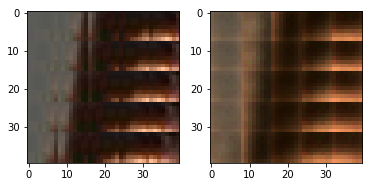

EPO: 17, recon_loss: 0.0033, total_loss: 0.0108, train_psnr:23.9879, validation_psnr:29.6306
EPO: 17, recon_loss: 0.0070, total_loss: 0.0143, train_psnr:23.9990, validation_psnr:29.4748
EPO: 17, recon_loss: 0.0066, total_loss: 0.0106, train_psnr:23.9891, validation_psnr:29.5017
EPO: 17, recon_loss: 0.0122, total_loss: 0.0188, train_psnr:23.9134, validation_psnr:29.0477
EPO: 17, recon_loss: 0.0052, total_loss: 0.0170, train_psnr:23.9469, validation_psnr:29.0601
EPO: 17, recon_loss: 0.0046, total_loss: 0.0112, train_psnr:23.9487, validation_psnr:29.1988
EPO: 17, recon_loss: 0.0085, total_loss: 0.0166, train_psnr:23.9475, validation_psnr:28.8980
EPO: 17, recon_loss: 0.0063, total_loss: 0.0101, train_psnr:23.9470, validation_psnr:29.1487
EPO: 17, recon_loss: 0.0103, total_loss: 0.0154, train_psnr:23.9754, validation_psnr:28.9567
EPO: 17, recon_loss: 0.0104, total_loss: 0.0171, train_psnr:23.9302, validation_psnr:29.4246
#########reconstruction test psnr: 28.1460 


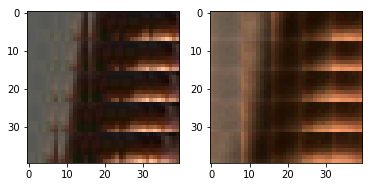

EPO: 17, recon_loss: 0.0100, total_loss: 0.0169, train_psnr:23.7013, validation_psnr:29.5949
EPO: 17, recon_loss: 0.0091, total_loss: 0.0155, train_psnr:23.4949, validation_psnr:29.4574
EPO: 17, recon_loss: 0.0094, total_loss: 0.0158, train_psnr:23.3994, validation_psnr:29.5535
EPO: 17, recon_loss: 0.0078, total_loss: 0.0125, train_psnr:23.2384, validation_psnr:29.2773
EPO: 17, recon_loss: 0.0099, total_loss: 0.0144, train_psnr:23.2222, validation_psnr:29.4637
EPO: 17, recon_loss: 0.0063, total_loss: 0.0109, train_psnr:23.4806, validation_psnr:29.5414
EPO: 17, recon_loss: 0.0109, total_loss: 0.0166, train_psnr:23.6447, validation_psnr:29.4426
EPO: 17, recon_loss: 0.0153, total_loss: 0.0210, train_psnr:23.7020, validation_psnr:29.4326
EPO: 17, recon_loss: 0.0057, total_loss: 0.0092, train_psnr:23.7890, validation_psnr:29.3475
EPO: 17, recon_loss: 0.0135, total_loss: 0.0196, train_psnr:23.8184, validation_psnr:29.3794
#########reconstruction test psnr: 28.1223 


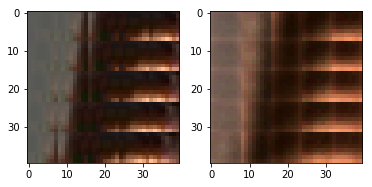

EPO: 17, recon_loss: 0.0105, total_loss: 0.0199, train_psnr:23.7718, validation_psnr:28.5774
EPO: 17, recon_loss: 0.0116, total_loss: 0.0210, train_psnr:23.8116, validation_psnr:28.9371
EPO: 17, recon_loss: 0.0199, total_loss: 0.0293, train_psnr:23.8436, validation_psnr:28.8622
EPO: 17, recon_loss: 0.0207, total_loss: 0.0306, train_psnr:23.8739, validation_psnr:28.8639
EPO: 17, recon_loss: 0.0193, total_loss: 0.0260, train_psnr:23.8800, validation_psnr:28.9683
EPO: 17, recon_loss: 0.0150, total_loss: 0.0232, train_psnr:24.0634, validation_psnr:29.0468
EPO: 17, recon_loss: 0.0116, total_loss: 0.0200, train_psnr:24.1534, validation_psnr:28.2920
EPO: 17, recon_loss: 0.0138, total_loss: 0.0188, train_psnr:24.2056, validation_psnr:28.1935
EPO: 17, recon_loss: 0.0102, total_loss: 0.0134, train_psnr:24.2426, validation_psnr:28.0608
EPO: 17, recon_loss: 0.0147, total_loss: 0.0213, train_psnr:24.2286, validation_psnr:27.4138
#########reconstruction test psnr: 26.5237 


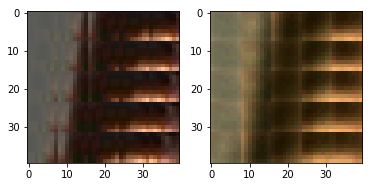

EPO: 17, recon_loss: 0.0032, total_loss: 0.0055, train_psnr:24.2075, validation_psnr:28.0593
EPO: 17, recon_loss: 0.0054, total_loss: 0.0115, train_psnr:24.1758, validation_psnr:28.8632
EPO: 17, recon_loss: 0.0103, total_loss: 0.0162, train_psnr:24.1422, validation_psnr:28.7984
EPO: 17, recon_loss: 0.0065, total_loss: 0.0131, train_psnr:24.1174, validation_psnr:29.3062
EPO: 17, recon_loss: 0.0111, total_loss: 0.0210, train_psnr:24.0670, validation_psnr:29.2202
EPO: 17, recon_loss: 0.0047, total_loss: 0.0151, train_psnr:24.1045, validation_psnr:29.2687
EPO: 17, recon_loss: 0.0043, total_loss: 0.0139, train_psnr:24.1472, validation_psnr:29.1483
EPO: 17, recon_loss: 0.0149, total_loss: 0.0223, train_psnr:24.1686, validation_psnr:28.8664
EPO: 17, recon_loss: 0.0036, total_loss: 0.0096, train_psnr:24.2094, validation_psnr:29.1305
EPO: 17, recon_loss: 0.0152, total_loss: 0.0227, train_psnr:24.2053, validation_psnr:29.2165
#########reconstruction test psnr: 27.9873 


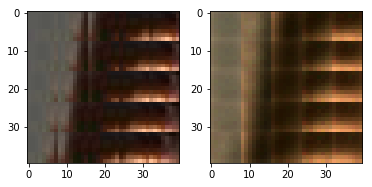

EPO: 17, recon_loss: 0.0188, total_loss: 0.0381, train_psnr:24.2050, validation_psnr:29.8186
EPO: 17, recon_loss: 0.0064, total_loss: 0.0143, train_psnr:24.2664, validation_psnr:29.5182
EPO: 17, recon_loss: 0.0230, total_loss: 0.0294, train_psnr:24.2381, validation_psnr:29.4091
EPO: 17, recon_loss: 0.0054, total_loss: 0.0097, train_psnr:24.2550, validation_psnr:29.2401
EPO: 17, recon_loss: 0.0132, total_loss: 0.0166, train_psnr:24.2316, validation_psnr:29.2465
EPO: 17, recon_loss: 0.0137, total_loss: 0.0222, train_psnr:24.2640, validation_psnr:29.1681
EPO: 17, recon_loss: 0.0059, total_loss: 0.0110, train_psnr:24.3142, validation_psnr:29.1845
EPO: 17, recon_loss: 0.0143, total_loss: 0.0221, train_psnr:24.2434, validation_psnr:28.8731
EPO: 17, recon_loss: 0.0090, total_loss: 0.0132, train_psnr:24.2589, validation_psnr:29.0319
EPO: 17, recon_loss: 0.0187, total_loss: 0.0263, train_psnr:24.1502, validation_psnr:29.3541
#########reconstruction test psnr: 28.1051 


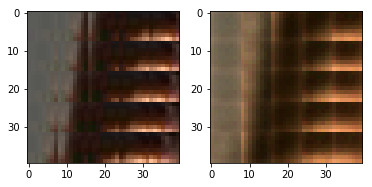

EPO: 17, recon_loss: 0.0175, total_loss: 0.0293, train_psnr:24.0789, validation_psnr:29.2443
EPO: 17, recon_loss: 0.0183, total_loss: 0.0306, train_psnr:23.9940, validation_psnr:29.6118
EPO: 17, recon_loss: 0.0388, total_loss: 0.0514, train_psnr:23.9318, validation_psnr:29.5157
EPO: 17, recon_loss: 0.0205, total_loss: 0.0330, train_psnr:23.9670, validation_psnr:29.6432
EPO: 17, recon_loss: 0.0145, total_loss: 0.0259, train_psnr:23.8640, validation_psnr:29.4595
EPO: 17, recon_loss: 0.0070, total_loss: 0.0168, train_psnr:23.9953, validation_psnr:28.9709
EPO: 17, recon_loss: 0.0075, total_loss: 0.0156, train_psnr:24.0355, validation_psnr:28.7940
EPO: 17, recon_loss: 0.0164, total_loss: 0.0247, train_psnr:23.9709, validation_psnr:28.1270
EPO: 17, recon_loss: 0.0085, total_loss: 0.0157, train_psnr:24.0089, validation_psnr:28.5876
EPO: 17, recon_loss: 0.0137, total_loss: 0.0237, train_psnr:24.0251, validation_psnr:29.3498
#########reconstruction test psnr: 28.1689 


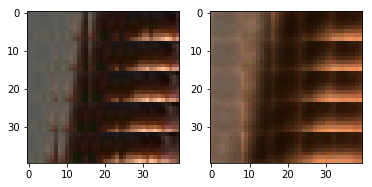

EPO: 17, recon_loss: 0.0084, total_loss: 0.0198, train_psnr:24.0019, validation_psnr:29.2377
EPO: 17, recon_loss: 0.0041, total_loss: 0.0130, train_psnr:23.9904, validation_psnr:28.6372
EPO: 17, recon_loss: 0.0229, total_loss: 0.0296, train_psnr:23.9597, validation_psnr:28.5774
EPO: 17, recon_loss: 0.0072, total_loss: 0.0164, train_psnr:23.9875, validation_psnr:28.5613
EPO: 17, recon_loss: 0.0102, total_loss: 0.0178, train_psnr:23.9800, validation_psnr:28.7984
EPO: 17, recon_loss: 0.0153, total_loss: 0.0318, train_psnr:23.9708, validation_psnr:28.8296
EPO: 17, recon_loss: 0.0109, total_loss: 0.0319, train_psnr:24.0216, validation_psnr:29.0689
EPO: 17, recon_loss: 0.0327, total_loss: 0.0493, train_psnr:24.0987, validation_psnr:29.4935
EPO: 17, recon_loss: 0.0147, total_loss: 0.0321, train_psnr:24.1341, validation_psnr:29.4846
EPO: 17, recon_loss: 0.0112, total_loss: 0.0274, train_psnr:24.1182, validation_psnr:29.3905
#########reconstruction test psnr: 28.1861 


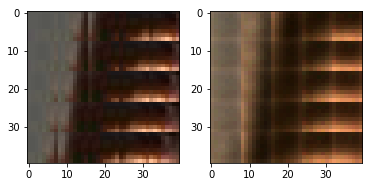

EPO: 17, recon_loss: 0.0213, total_loss: 0.0368, train_psnr:24.0581, validation_psnr:29.7375
EPO: 17, recon_loss: 0.0127, total_loss: 0.0296, train_psnr:23.9708, validation_psnr:29.6379
EPO: 17, recon_loss: 0.0377, total_loss: 0.0560, train_psnr:23.9082, validation_psnr:29.3795
EPO: 17, recon_loss: 0.0214, total_loss: 0.0389, train_psnr:24.0309, validation_psnr:29.4885
EPO: 17, recon_loss: 0.0215, total_loss: 0.0401, train_psnr:23.9493, validation_psnr:29.3509
EPO: 17, recon_loss: 0.0078, total_loss: 0.0239, train_psnr:24.0487, validation_psnr:28.6316
EPO: 17, recon_loss: 0.0091, total_loss: 0.0257, train_psnr:24.1237, validation_psnr:28.3681
EPO: 17, recon_loss: 0.0357, total_loss: 0.0484, train_psnr:24.1576, validation_psnr:28.5867
EPO: 17, recon_loss: 0.0364, total_loss: 0.0434, train_psnr:24.1547, validation_psnr:28.2059
EPO: 17, recon_loss: 0.0076, total_loss: 0.0122, train_psnr:24.0964, validation_psnr:28.1733
#########reconstruction test psnr: 27.2847 


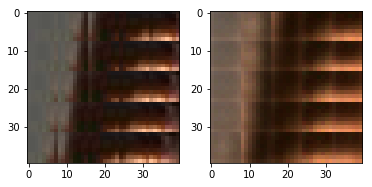

EPO: 17, recon_loss: 0.0099, total_loss: 0.0157, train_psnr:24.0730, validation_psnr:28.4887
EPO: 17, recon_loss: 0.0047, total_loss: 0.0134, train_psnr:24.1746, validation_psnr:28.6113
EPO: 17, recon_loss: 0.0130, total_loss: 0.0220, train_psnr:24.1336, validation_psnr:29.4342
EPO: 17, recon_loss: 0.0115, total_loss: 0.0210, train_psnr:24.1276, validation_psnr:29.3883
EPO: 17, recon_loss: 0.0108, total_loss: 0.0231, train_psnr:24.1000, validation_psnr:29.5910
EPO: 17, recon_loss: 0.0227, total_loss: 0.0349, train_psnr:24.1047, validation_psnr:29.4394
EPO: 17, recon_loss: 0.0016, total_loss: 0.0046, train_psnr:24.0781, validation_psnr:29.5851
EPO: 17, recon_loss: 0.0026, total_loss: 0.0062, train_psnr:24.0189, validation_psnr:29.5982
EPO: 17, recon_loss: 0.0042, total_loss: 0.0065, train_psnr:24.0564, validation_psnr:29.0469
EPO: 17, recon_loss: 0.0036, total_loss: 0.0057, train_psnr:23.9810, validation_psnr:28.9113
#########reconstruction test psnr: 27.7913 


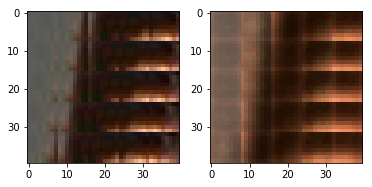

EPO: 17, recon_loss: 0.0109, total_loss: 0.0146, train_psnr:23.8313, validation_psnr:28.2999
EPO: 17, recon_loss: 0.0073, total_loss: 0.0138, train_psnr:23.8861, validation_psnr:28.9057
EPO: 17, recon_loss: 0.0128, total_loss: 0.0193, train_psnr:23.7437, validation_psnr:28.7639
EPO: 17, recon_loss: 0.0189, total_loss: 0.0245, train_psnr:23.6157, validation_psnr:28.3581
EPO: 17, recon_loss: 0.0079, total_loss: 0.0109, train_psnr:23.4659, validation_psnr:28.6051
EPO: 17, recon_loss: 0.0176, total_loss: 0.0211, train_psnr:23.3644, validation_psnr:28.5847
EPO: 17, recon_loss: 0.0152, total_loss: 0.0293, train_psnr:23.6088, validation_psnr:28.5891
EPO: 17, recon_loss: 0.0242, total_loss: 0.0376, train_psnr:23.7819, validation_psnr:28.7068
EPO: 17, recon_loss: 0.0208, total_loss: 0.0342, train_psnr:23.8812, validation_psnr:28.7659
EPO: 17, recon_loss: 0.0137, total_loss: 0.0226, train_psnr:23.9620, validation_psnr:28.5454
#########reconstruction test psnr: 27.4667 


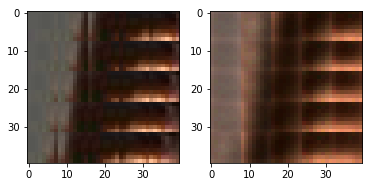

EPO: 17, recon_loss: 0.0180, total_loss: 0.0250, train_psnr:24.0165, validation_psnr:28.6337
EPO: 17, recon_loss: 0.0141, total_loss: 0.0203, train_psnr:24.1668, validation_psnr:28.4169
EPO: 17, recon_loss: 0.0105, total_loss: 0.0146, train_psnr:24.2531, validation_psnr:28.5279
EPO: 17, recon_loss: 0.0128, total_loss: 0.0195, train_psnr:24.2161, validation_psnr:28.9261
EPO: 17, recon_loss: 0.0091, total_loss: 0.0139, train_psnr:24.2496, validation_psnr:28.9421
EPO: 17, recon_loss: 0.0125, total_loss: 0.0186, train_psnr:24.2930, validation_psnr:28.8616
EPO: 17, recon_loss: 0.0091, total_loss: 0.0238, train_psnr:24.3479, validation_psnr:28.8762
EPO: 17, recon_loss: 0.0047, total_loss: 0.0103, train_psnr:24.3415, validation_psnr:28.7174
EPO: 17, recon_loss: 0.0187, total_loss: 0.0261, train_psnr:24.3251, validation_psnr:28.8638
EPO: 17, recon_loss: 0.0132, total_loss: 0.0192, train_psnr:24.3048, validation_psnr:28.6394
#########reconstruction test psnr: 27.5768 


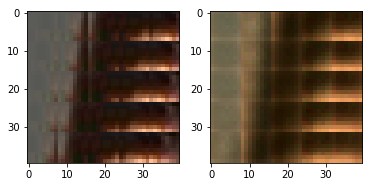

EPO: 17, recon_loss: 0.0169, total_loss: 0.0264, train_psnr:24.2770, validation_psnr:29.0289
EPO: 17, recon_loss: 0.0049, total_loss: 0.0082, train_psnr:24.3203, validation_psnr:28.7513
EPO: 17, recon_loss: 0.0044, total_loss: 0.0079, train_psnr:24.3601, validation_psnr:28.6740
EPO: 17, recon_loss: 0.0090, total_loss: 0.0139, train_psnr:24.3554, validation_psnr:28.2594
EPO: 17, recon_loss: 0.0028, total_loss: 0.0065, train_psnr:24.3881, validation_psnr:28.3275
EPO: 17, recon_loss: 0.0047, total_loss: 0.0077, train_psnr:24.3651, validation_psnr:28.5116
EPO: 17, recon_loss: 0.0095, total_loss: 0.0161, train_psnr:24.3354, validation_psnr:29.1647
EPO: 17, recon_loss: 0.0063, total_loss: 0.0118, train_psnr:24.3399, validation_psnr:29.1441
EPO: 17, recon_loss: 0.0228, total_loss: 0.0303, train_psnr:24.2983, validation_psnr:28.9433
EPO: 17, recon_loss: 0.0100, total_loss: 0.0179, train_psnr:24.2446, validation_psnr:29.0427
#########reconstruction test psnr: 27.9356 


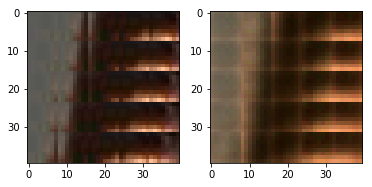

EPO: 17, recon_loss: 0.0067, total_loss: 0.0118, train_psnr:24.1885, validation_psnr:28.6800
EPO: 17, recon_loss: 0.0079, total_loss: 0.0192, train_psnr:24.1533, validation_psnr:28.9429
EPO: 17, recon_loss: 0.0076, total_loss: 0.0174, train_psnr:24.1397, validation_psnr:28.9132
EPO: 17, recon_loss: 0.0353, total_loss: 0.0456, train_psnr:24.1098, validation_psnr:28.6391
EPO: 17, recon_loss: 0.0096, total_loss: 0.0172, train_psnr:24.0934, validation_psnr:28.7168
EPO: 17, recon_loss: 0.0264, total_loss: 0.0337, train_psnr:23.9909, validation_psnr:29.1308
EPO: 17, recon_loss: 0.0039, total_loss: 0.0121, train_psnr:23.9208, validation_psnr:29.4739
EPO: 17, recon_loss: 0.0014, total_loss: 0.0059, train_psnr:23.8752, validation_psnr:28.5019
EPO: 17, recon_loss: 0.0225, total_loss: 0.0297, train_psnr:23.8583, validation_psnr:28.4239
EPO: 17, recon_loss: 0.0112, total_loss: 0.0159, train_psnr:23.8438, validation_psnr:28.1189
#########reconstruction test psnr: 27.1856 


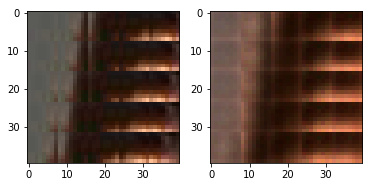

EPO: 17, recon_loss: 0.0109, total_loss: 0.0170, train_psnr:23.8044, validation_psnr:28.0950
EPO: 17, recon_loss: 0.0117, total_loss: 0.0198, train_psnr:23.7975, validation_psnr:29.1729
EPO: 17, recon_loss: 0.0140, total_loss: 0.0241, train_psnr:23.8220, validation_psnr:29.4592
EPO: 17, recon_loss: 0.0199, total_loss: 0.0268, train_psnr:23.8223, validation_psnr:29.5868
EPO: 17, recon_loss: 0.0085, total_loss: 0.0154, train_psnr:23.8170, validation_psnr:29.6694
EPO: 17, recon_loss: 0.0054, total_loss: 0.0106, train_psnr:23.7872, validation_psnr:29.6488
EPO: 17, recon_loss: 0.0139, total_loss: 0.0208, train_psnr:23.7754, validation_psnr:29.5644
EPO: 17, recon_loss: 0.0080, total_loss: 0.0121, train_psnr:24.0847, validation_psnr:29.4532
EPO: 17, recon_loss: 0.0219, total_loss: 0.0304, train_psnr:24.2154, validation_psnr:29.3063
EPO: 17, recon_loss: 0.0089, total_loss: 0.0136, train_psnr:24.2343, validation_psnr:29.3332
#########reconstruction test psnr: 28.1066 


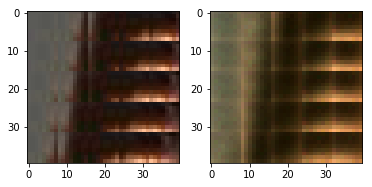

EPO: 17, recon_loss: 0.0085, total_loss: 0.0135, train_psnr:24.2402, validation_psnr:29.1749
EPO: 17, recon_loss: 0.0139, total_loss: 0.0231, train_psnr:24.3197, validation_psnr:29.1869
EPO: 17, recon_loss: 0.0112, total_loss: 0.0191, train_psnr:24.3689, validation_psnr:29.0411
EPO: 17, recon_loss: 0.0112, total_loss: 0.0194, train_psnr:24.2856, validation_psnr:28.9951
EPO: 17, recon_loss: 0.0160, total_loss: 0.0228, train_psnr:24.1693, validation_psnr:29.2915
EPO: 17, recon_loss: 0.0142, total_loss: 0.0238, train_psnr:24.1129, validation_psnr:29.2221
EPO: 17, recon_loss: 0.0102, total_loss: 0.0303, train_psnr:23.9938, validation_psnr:29.8126
EPO: 17, recon_loss: 0.0079, total_loss: 0.0136, train_psnr:24.1165, validation_psnr:29.3010
EPO: 17, recon_loss: 0.0072, total_loss: 0.0131, train_psnr:24.1344, validation_psnr:29.4185
EPO: 17, recon_loss: 0.0064, total_loss: 0.0114, train_psnr:24.1905, validation_psnr:29.4178
#########reconstruction test psnr: 28.1812 


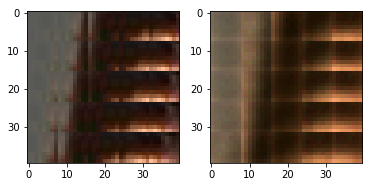

EPO: 17, recon_loss: 0.0101, total_loss: 0.0180, train_psnr:24.1943, validation_psnr:29.5351
EPO: 17, recon_loss: 0.0097, total_loss: 0.0187, train_psnr:24.2068, validation_psnr:29.3667
EPO: 17, recon_loss: 0.0063, total_loss: 0.0135, train_psnr:24.2390, validation_psnr:29.1594
EPO: 17, recon_loss: 0.0190, total_loss: 0.0266, train_psnr:24.1729, validation_psnr:29.1594
EPO: 17, recon_loss: 0.0263, total_loss: 0.0358, train_psnr:24.1308, validation_psnr:28.8013
EPO: 17, recon_loss: 0.0130, total_loss: 0.0242, train_psnr:24.0638, validation_psnr:29.0125
EPO: 17, recon_loss: 0.0327, total_loss: 0.0412, train_psnr:24.0177, validation_psnr:28.9998
EPO: 17, recon_loss: 0.0060, total_loss: 0.0139, train_psnr:23.9511, validation_psnr:29.2756
EPO: 17, recon_loss: 0.0080, total_loss: 0.0163, train_psnr:23.8944, validation_psnr:29.1594
EPO: 17, recon_loss: 0.0162, total_loss: 0.0265, train_psnr:23.8304, validation_psnr:29.2837
#########reconstruction test psnr: 28.0750 


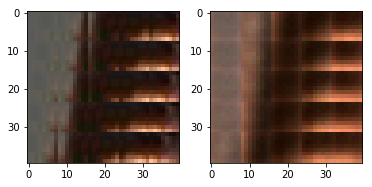

EPO: 17, recon_loss: 0.0121, total_loss: 0.0198, train_psnr:23.7730, validation_psnr:29.2801
EPO: 17, recon_loss: 0.0228, total_loss: 0.0304, train_psnr:23.6945, validation_psnr:29.2559
EPO: 17, recon_loss: 0.0052, total_loss: 0.0071, train_psnr:23.8574, validation_psnr:29.2885
EPO: 17, recon_loss: 0.0039, total_loss: 0.0066, train_psnr:23.9644, validation_psnr:29.3218
EPO: 17, recon_loss: 0.0144, total_loss: 0.0217, train_psnr:23.8337, validation_psnr:29.4587
EPO: 17, recon_loss: 0.0066, total_loss: 0.0124, train_psnr:23.9121, validation_psnr:29.2048
EPO: 17, recon_loss: 0.0136, total_loss: 0.0197, train_psnr:23.8418, validation_psnr:29.3792
EPO: 17, recon_loss: 0.0227, total_loss: 0.0400, train_psnr:23.8695, validation_psnr:29.8152
EPO: 17, recon_loss: 0.0116, total_loss: 0.0290, train_psnr:23.9095, validation_psnr:29.8553
EPO: 17, recon_loss: 0.0291, total_loss: 0.0489, train_psnr:23.8780, validation_psnr:29.6411
#########reconstruction test psnr: 28.3857 


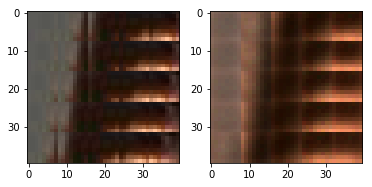

EPO: 17, recon_loss: 0.0147, total_loss: 0.0335, train_psnr:23.8731, validation_psnr:29.8932
EPO: 17, recon_loss: 0.0243, total_loss: 0.0467, train_psnr:23.8448, validation_psnr:29.7825
EPO: 17, recon_loss: 0.0062, total_loss: 0.0188, train_psnr:23.9080, validation_psnr:29.1398
EPO: 17, recon_loss: 0.0151, total_loss: 0.0207, train_psnr:23.8964, validation_psnr:28.4102
EPO: 17, recon_loss: 0.0161, total_loss: 0.0316, train_psnr:23.9716, validation_psnr:29.2602
EPO: 17, recon_loss: 0.0100, total_loss: 0.0203, train_psnr:24.0543, validation_psnr:29.3502
EPO: 17, recon_loss: 0.0137, total_loss: 0.0229, train_psnr:24.0915, validation_psnr:29.4826
EPO: 17, recon_loss: 0.0090, total_loss: 0.0267, train_psnr:24.0388, validation_psnr:29.8731
EPO: 17, recon_loss: 0.0106, total_loss: 0.0220, train_psnr:24.1144, validation_psnr:29.8299
EPO: 17, recon_loss: 0.0306, total_loss: 0.0416, train_psnr:24.0985, validation_psnr:29.8545
#########reconstruction test psnr: 28.6068 


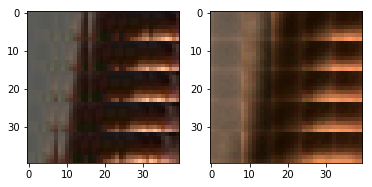

EPO: 17, recon_loss: 0.0063, total_loss: 0.0156, train_psnr:24.1290, validation_psnr:29.8615
EPO: 17, recon_loss: 0.0057, total_loss: 0.0162, train_psnr:24.1152, validation_psnr:29.7096
EPO: 17, recon_loss: 0.0130, total_loss: 0.0233, train_psnr:24.0999, validation_psnr:29.2249
EPO: 17, recon_loss: 0.0043, total_loss: 0.0144, train_psnr:24.0111, validation_psnr:29.5374
EPO: 17, recon_loss: 0.0291, total_loss: 0.0382, train_psnr:23.9496, validation_psnr:29.5647
EPO: 17, recon_loss: 0.0055, total_loss: 0.0138, train_psnr:23.8595, validation_psnr:29.5052
EPO: 17, recon_loss: 0.0103, total_loss: 0.0198, train_psnr:23.7900, validation_psnr:29.4677
EPO: 17, recon_loss: 0.0084, total_loss: 0.0146, train_psnr:23.7898, validation_psnr:28.9346
EPO: 17, recon_loss: 0.0056, total_loss: 0.0165, train_psnr:23.8387, validation_psnr:29.2052
EPO: 17, recon_loss: 0.0314, total_loss: 0.0390, train_psnr:23.8797, validation_psnr:28.9721
#########reconstruction test psnr: 27.8719 


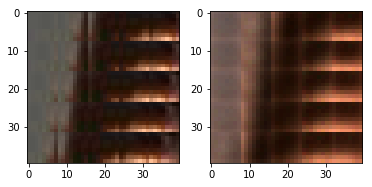

EPO: 17, recon_loss: 0.0087, total_loss: 0.0193, train_psnr:23.9132, validation_psnr:29.1817
EPO: 17, recon_loss: 0.0102, total_loss: 0.0174, train_psnr:23.8790, validation_psnr:29.4477
EPO: 17, recon_loss: 0.0107, total_loss: 0.0266, train_psnr:23.8804, validation_psnr:29.3741
EPO: 17, recon_loss: 0.0042, total_loss: 0.0119, train_psnr:23.9033, validation_psnr:29.1474
EPO: 17, recon_loss: 0.0295, total_loss: 0.0408, train_psnr:23.9164, validation_psnr:29.3479
EPO: 17, recon_loss: 0.0066, total_loss: 0.0102, train_psnr:23.9216, validation_psnr:29.0349
EPO: 17, recon_loss: 0.0135, total_loss: 0.0218, train_psnr:23.8895, validation_psnr:29.1510
EPO: 17, recon_loss: 0.0071, total_loss: 0.0193, train_psnr:23.8822, validation_psnr:29.6710
EPO: 17, recon_loss: 0.0041, total_loss: 0.0123, train_psnr:24.0775, validation_psnr:29.3858
EPO: 17, recon_loss: 0.0211, total_loss: 0.0283, train_psnr:24.1066, validation_psnr:29.5122
#########reconstruction test psnr: 28.2968 


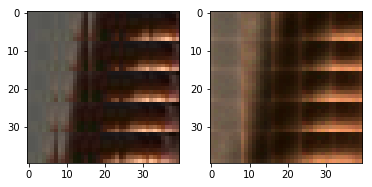

EPO: 17, recon_loss: 0.0040, total_loss: 0.0097, train_psnr:24.1552, validation_psnr:29.3346
EPO: 17, recon_loss: 0.0115, total_loss: 0.0173, train_psnr:24.1683, validation_psnr:29.3050
EPO: 17, recon_loss: 0.0254, total_loss: 0.0440, train_psnr:24.1327, validation_psnr:29.0904
EPO: 17, recon_loss: 0.0224, total_loss: 0.0379, train_psnr:24.0216, validation_psnr:29.0448
EPO: 17, recon_loss: 0.0172, total_loss: 0.0248, train_psnr:23.8732, validation_psnr:28.6159
EPO: 17, recon_loss: 0.0159, total_loss: 0.0270, train_psnr:23.7057, validation_psnr:28.7725
EPO: 17, recon_loss: 0.0137, total_loss: 0.0207, train_psnr:23.6074, validation_psnr:28.6627
EPO: 17, recon_loss: 0.0092, total_loss: 0.0292, train_psnr:23.5025, validation_psnr:29.2250
EPO: 17, recon_loss: 0.0043, total_loss: 0.0194, train_psnr:23.5656, validation_psnr:28.9127
EPO: 17, recon_loss: 0.0094, total_loss: 0.0196, train_psnr:23.6342, validation_psnr:29.0716
#########reconstruction test psnr: 27.9325 


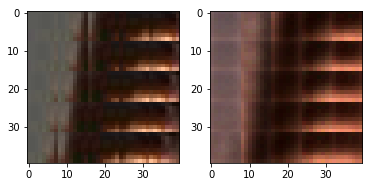

EPO: 17, recon_loss: 0.0125, total_loss: 0.0219, train_psnr:23.7066, validation_psnr:29.2651
EPO: 17, recon_loss: 0.0165, total_loss: 0.0270, train_psnr:23.7810, validation_psnr:29.2357
EPO: 17, recon_loss: 0.0088, total_loss: 0.0159, train_psnr:23.7982, validation_psnr:29.3291
EPO: 17, recon_loss: 0.0030, total_loss: 0.0048, train_psnr:24.0024, validation_psnr:29.2542
EPO: 17, recon_loss: 0.0101, total_loss: 0.0140, train_psnr:24.0742, validation_psnr:29.4594
EPO: 17, recon_loss: 0.0058, total_loss: 0.0085, train_psnr:24.0722, validation_psnr:29.5001
EPO: 17, recon_loss: 0.0045, total_loss: 0.0071, train_psnr:24.1504, validation_psnr:29.3997
EPO: 17, recon_loss: 0.0109, total_loss: 0.0152, train_psnr:24.2175, validation_psnr:29.1594
EPO: 17, recon_loss: 0.0101, total_loss: 0.0176, train_psnr:24.2112, validation_psnr:29.1475
EPO: 17, recon_loss: 0.0153, total_loss: 0.0230, train_psnr:24.2030, validation_psnr:28.8018
#########reconstruction test psnr: 27.6928 


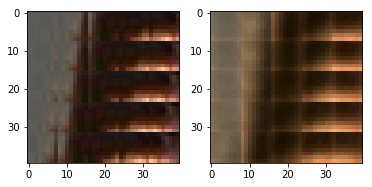

EPO: 17, recon_loss: 0.0111, total_loss: 0.0181, train_psnr:24.1638, validation_psnr:28.8509
EPO: 17, recon_loss: 0.0096, total_loss: 0.0138, train_psnr:24.2240, validation_psnr:28.6435
EPO: 17, recon_loss: 0.0210, total_loss: 0.0247, train_psnr:24.2071, validation_psnr:28.4388
EPO: 17, recon_loss: 0.0125, total_loss: 0.0207, train_psnr:24.1790, validation_psnr:29.0989
EPO: 17, recon_loss: 0.0180, total_loss: 0.0271, train_psnr:24.0425, validation_psnr:29.2937
EPO: 17, recon_loss: 0.0183, total_loss: 0.0234, train_psnr:23.9454, validation_psnr:29.1569
EPO: 17, recon_loss: 0.0134, total_loss: 0.0201, train_psnr:23.8417, validation_psnr:29.0565
EPO: 17, recon_loss: 0.0200, total_loss: 0.0258, train_psnr:23.7404, validation_psnr:29.1444
EPO: 17, recon_loss: 0.0200, total_loss: 0.0370, train_psnr:23.8376, validation_psnr:29.0300
EPO: 17, recon_loss: 0.0201, total_loss: 0.0270, train_psnr:23.8118, validation_psnr:29.3479
#########reconstruction test psnr: 28.0833 


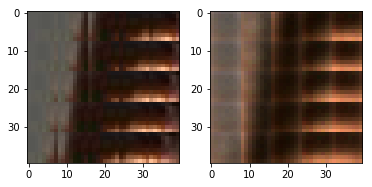

EPO: 17, recon_loss: 0.0384, total_loss: 0.0480, train_psnr:20.2127, validation_psnr:26.6559
EPO: 17, recon_loss: 0.0142, total_loss: 0.0209, train_psnr:22.2053, validation_psnr:29.5971
EPO: 17, recon_loss: 0.0140, total_loss: 0.0223, train_psnr:22.9218, validation_psnr:29.6084
EPO: 17, recon_loss: 0.0037, total_loss: 0.0100, train_psnr:24.0922, validation_psnr:27.8939
EPO: 17, recon_loss: 0.0068, total_loss: 0.0137, train_psnr:24.0813, validation_psnr:28.0512
EPO: 17, recon_loss: 0.0163, total_loss: 0.0208, train_psnr:24.0174, validation_psnr:28.1633
EPO: 17, recon_loss: 0.0144, total_loss: 0.0230, train_psnr:23.9395, validation_psnr:27.9029
EPO: 17, recon_loss: 0.0321, total_loss: 0.0383, train_psnr:23.8715, validation_psnr:28.1781
EPO: 17, recon_loss: 0.0059, total_loss: 0.0191, train_psnr:23.9027, validation_psnr:29.1918
EPO: 17, recon_loss: 0.0051, total_loss: 0.0114, train_psnr:23.8776, validation_psnr:28.8764
#########reconstruction test psnr: 27.7541 


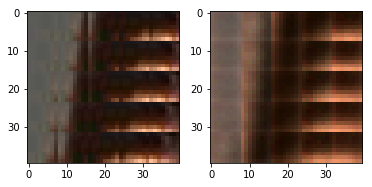

EPO: 17, recon_loss: 0.0096, total_loss: 0.0163, train_psnr:23.8983, validation_psnr:28.9431
EPO: 17, recon_loss: 0.0022, total_loss: 0.0049, train_psnr:23.9209, validation_psnr:29.0711
EPO: 17, recon_loss: 0.0048, total_loss: 0.0082, train_psnr:23.9022, validation_psnr:28.8549
EPO: 17, recon_loss: 0.0122, total_loss: 0.0209, train_psnr:24.0060, validation_psnr:29.1786
EPO: 17, recon_loss: 0.0107, total_loss: 0.0198, train_psnr:24.0319, validation_psnr:29.1431
EPO: 17, recon_loss: 0.0169, total_loss: 0.0261, train_psnr:24.0414, validation_psnr:29.0034
EPO: 17, recon_loss: 0.0135, total_loss: 0.0220, train_psnr:24.0818, validation_psnr:29.2357
EPO: 17, recon_loss: 0.0136, total_loss: 0.0180, train_psnr:24.0503, validation_psnr:29.2705
EPO: 18, recon_loss: 0.0053, total_loss: 0.0088, train_psnr:24.1717, validation_psnr:29.0424
EPO: 18, recon_loss: 0.0047, total_loss: 0.0074, train_psnr:24.2262, validation_psnr:28.9609
#########reconstruction test psnr: 27.8031 


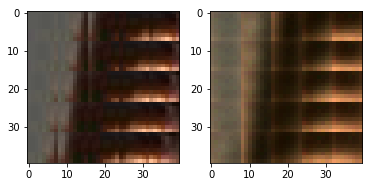

EPO: 18, recon_loss: 0.0171, total_loss: 0.0205, train_psnr:24.1801, validation_psnr:29.2626
EPO: 18, recon_loss: 0.0049, total_loss: 0.0090, train_psnr:24.2279, validation_psnr:28.9487
EPO: 18, recon_loss: 0.0092, total_loss: 0.0141, train_psnr:24.1932, validation_psnr:28.9005
EPO: 18, recon_loss: 0.0048, total_loss: 0.0166, train_psnr:24.1077, validation_psnr:29.6432
EPO: 18, recon_loss: 0.0044, total_loss: 0.0132, train_psnr:24.1002, validation_psnr:29.6463
EPO: 18, recon_loss: 0.0097, total_loss: 0.0164, train_psnr:24.0930, validation_psnr:29.5691
EPO: 18, recon_loss: 0.0071, total_loss: 0.0115, train_psnr:24.0974, validation_psnr:29.6373
EPO: 18, recon_loss: 0.0132, total_loss: 0.0209, train_psnr:24.0079, validation_psnr:29.2031
EPO: 18, recon_loss: 0.0047, total_loss: 0.0158, train_psnr:24.0604, validation_psnr:29.3817
EPO: 18, recon_loss: 0.0030, total_loss: 0.0075, train_psnr:24.0460, validation_psnr:29.2129
#########reconstruction test psnr: 28.0468 


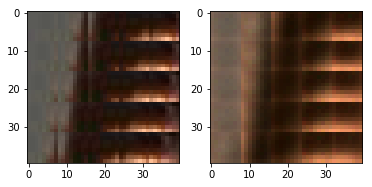

EPO: 18, recon_loss: 0.0088, total_loss: 0.0162, train_psnr:24.0777, validation_psnr:29.3645
EPO: 18, recon_loss: 0.0055, total_loss: 0.0080, train_psnr:24.0664, validation_psnr:29.3110
EPO: 18, recon_loss: 0.0116, total_loss: 0.0174, train_psnr:24.0785, validation_psnr:28.9828
EPO: 18, recon_loss: 0.0094, total_loss: 0.0172, train_psnr:23.9899, validation_psnr:29.6897
EPO: 18, recon_loss: 0.0096, total_loss: 0.0151, train_psnr:23.7565, validation_psnr:29.6038
EPO: 18, recon_loss: 0.0098, total_loss: 0.0164, train_psnr:23.5698, validation_psnr:29.5449
EPO: 18, recon_loss: 0.0085, total_loss: 0.0147, train_psnr:23.4600, validation_psnr:29.5824
EPO: 18, recon_loss: 0.0068, total_loss: 0.0116, train_psnr:23.3063, validation_psnr:29.3994
EPO: 18, recon_loss: 0.0102, total_loss: 0.0141, train_psnr:23.3765, validation_psnr:29.6238
EPO: 18, recon_loss: 0.0053, total_loss: 0.0102, train_psnr:23.6200, validation_psnr:29.6725
#########reconstruction test psnr: 28.4300 


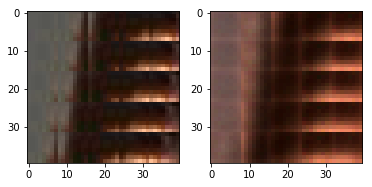

EPO: 18, recon_loss: 0.0149, total_loss: 0.0204, train_psnr:23.7573, validation_psnr:29.5376
EPO: 18, recon_loss: 0.0091, total_loss: 0.0133, train_psnr:23.8371, validation_psnr:29.5741
EPO: 18, recon_loss: 0.0089, total_loss: 0.0124, train_psnr:23.9123, validation_psnr:29.4592
EPO: 18, recon_loss: 0.0254, total_loss: 0.0418, train_psnr:23.9256, validation_psnr:29.4992
EPO: 18, recon_loss: 0.0089, total_loss: 0.0177, train_psnr:23.8843, validation_psnr:28.8679
EPO: 18, recon_loss: 0.0144, total_loss: 0.0249, train_psnr:23.9331, validation_psnr:29.0638
EPO: 18, recon_loss: 0.0224, total_loss: 0.0333, train_psnr:23.9508, validation_psnr:28.9364
EPO: 18, recon_loss: 0.0127, total_loss: 0.0200, train_psnr:23.9748, validation_psnr:29.0671
EPO: 18, recon_loss: 0.0096, total_loss: 0.0201, train_psnr:23.9966, validation_psnr:28.9396
EPO: 18, recon_loss: 0.0100, total_loss: 0.0168, train_psnr:24.2018, validation_psnr:29.1194
#########reconstruction test psnr: 28.0005 


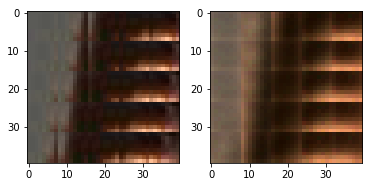

EPO: 18, recon_loss: 0.0137, total_loss: 0.0216, train_psnr:24.2636, validation_psnr:28.2092
EPO: 18, recon_loss: 0.0085, total_loss: 0.0117, train_psnr:24.3300, validation_psnr:28.3196
EPO: 18, recon_loss: 0.0110, total_loss: 0.0145, train_psnr:24.3498, validation_psnr:28.0972
EPO: 18, recon_loss: 0.0044, total_loss: 0.0082, train_psnr:24.3612, validation_psnr:27.8508
EPO: 18, recon_loss: 0.0046, total_loss: 0.0081, train_psnr:24.3165, validation_psnr:28.3842
EPO: 18, recon_loss: 0.0045, total_loss: 0.0097, train_psnr:24.2719, validation_psnr:29.0462
EPO: 18, recon_loss: 0.0098, total_loss: 0.0145, train_psnr:24.2486, validation_psnr:28.8963
EPO: 18, recon_loss: 0.0082, total_loss: 0.0159, train_psnr:24.2100, validation_psnr:29.4101
EPO: 18, recon_loss: 0.0122, total_loss: 0.0237, train_psnr:24.1555, validation_psnr:29.3826
EPO: 18, recon_loss: 0.0049, total_loss: 0.0145, train_psnr:24.2205, validation_psnr:29.3299
#########reconstruction test psnr: 28.1371 


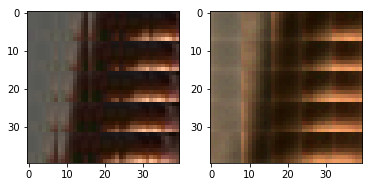

EPO: 18, recon_loss: 0.0066, total_loss: 0.0151, train_psnr:24.2669, validation_psnr:29.3035
EPO: 18, recon_loss: 0.0093, total_loss: 0.0154, train_psnr:24.2916, validation_psnr:29.1153
EPO: 18, recon_loss: 0.0039, total_loss: 0.0095, train_psnr:24.3209, validation_psnr:29.3348
EPO: 18, recon_loss: 0.0161, total_loss: 0.0261, train_psnr:24.3038, validation_psnr:29.3521
EPO: 18, recon_loss: 0.0231, total_loss: 0.0390, train_psnr:24.3247, validation_psnr:29.9045
EPO: 18, recon_loss: 0.0107, total_loss: 0.0191, train_psnr:24.3809, validation_psnr:29.5430
EPO: 18, recon_loss: 0.0189, total_loss: 0.0239, train_psnr:24.3358, validation_psnr:29.6014
EPO: 18, recon_loss: 0.0069, total_loss: 0.0109, train_psnr:24.3654, validation_psnr:29.3624
EPO: 18, recon_loss: 0.0139, total_loss: 0.0183, train_psnr:24.3303, validation_psnr:29.4497
EPO: 18, recon_loss: 0.0106, total_loss: 0.0172, train_psnr:24.4033, validation_psnr:29.1721
#########reconstruction test psnr: 28.0682 


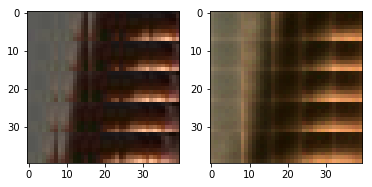

EPO: 18, recon_loss: 0.0105, total_loss: 0.0174, train_psnr:24.4010, validation_psnr:29.4191
EPO: 18, recon_loss: 0.0136, total_loss: 0.0223, train_psnr:24.3512, validation_psnr:28.8940
EPO: 18, recon_loss: 0.0126, total_loss: 0.0185, train_psnr:24.3438, validation_psnr:29.2593
EPO: 18, recon_loss: 0.0222, total_loss: 0.0287, train_psnr:24.2760, validation_psnr:29.4558
EPO: 18, recon_loss: 0.0160, total_loss: 0.0275, train_psnr:24.1766, validation_psnr:29.5115
EPO: 18, recon_loss: 0.0214, total_loss: 0.0331, train_psnr:24.0858, validation_psnr:29.7719
EPO: 18, recon_loss: 0.0377, total_loss: 0.0502, train_psnr:24.1018, validation_psnr:29.7249
EPO: 18, recon_loss: 0.0175, total_loss: 0.0294, train_psnr:24.0384, validation_psnr:29.7147
EPO: 18, recon_loss: 0.0176, total_loss: 0.0286, train_psnr:23.9404, validation_psnr:29.4891
EPO: 18, recon_loss: 0.0087, total_loss: 0.0159, train_psnr:24.1306, validation_psnr:29.1229
#########reconstruction test psnr: 28.0128 


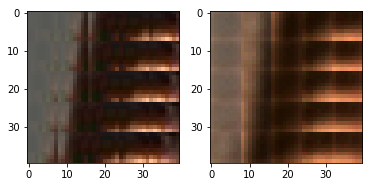

EPO: 18, recon_loss: 0.0079, total_loss: 0.0163, train_psnr:24.1458, validation_psnr:29.0155
EPO: 18, recon_loss: 0.0127, total_loss: 0.0200, train_psnr:24.0441, validation_psnr:28.2204
EPO: 18, recon_loss: 0.0117, total_loss: 0.0204, train_psnr:24.1436, validation_psnr:28.9507
EPO: 18, recon_loss: 0.0182, total_loss: 0.0277, train_psnr:24.1336, validation_psnr:29.5870
EPO: 18, recon_loss: 0.0052, total_loss: 0.0154, train_psnr:24.1112, validation_psnr:29.2246
EPO: 18, recon_loss: 0.0072, total_loss: 0.0157, train_psnr:24.0887, validation_psnr:28.7799
EPO: 18, recon_loss: 0.0239, total_loss: 0.0320, train_psnr:23.9795, validation_psnr:29.1462
EPO: 18, recon_loss: 0.0054, total_loss: 0.0149, train_psnr:24.0976, validation_psnr:28.6599
EPO: 18, recon_loss: 0.0095, total_loss: 0.0170, train_psnr:24.0734, validation_psnr:28.9260
EPO: 18, recon_loss: 0.0130, total_loss: 0.0327, train_psnr:24.0949, validation_psnr:28.8828
#########reconstruction test psnr: 27.8291 


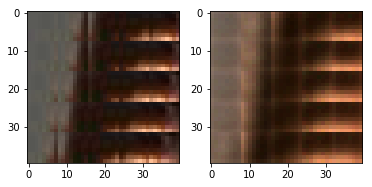

EPO: 18, recon_loss: 0.0106, total_loss: 0.0279, train_psnr:24.1285, validation_psnr:29.3473
EPO: 18, recon_loss: 0.0480, total_loss: 0.0653, train_psnr:24.1601, validation_psnr:29.7103
EPO: 18, recon_loss: 0.0090, total_loss: 0.0257, train_psnr:24.2342, validation_psnr:29.5505
EPO: 18, recon_loss: 0.0116, total_loss: 0.0301, train_psnr:24.2186, validation_psnr:29.4246
EPO: 18, recon_loss: 0.0203, total_loss: 0.0354, train_psnr:24.1387, validation_psnr:29.9941
EPO: 18, recon_loss: 0.0120, total_loss: 0.0311, train_psnr:24.0677, validation_psnr:29.7244
EPO: 18, recon_loss: 0.0459, total_loss: 0.0614, train_psnr:24.0370, validation_psnr:29.4698
EPO: 18, recon_loss: 0.0180, total_loss: 0.0366, train_psnr:24.1105, validation_psnr:29.4745
EPO: 18, recon_loss: 0.0205, total_loss: 0.0382, train_psnr:24.0288, validation_psnr:29.4011
EPO: 18, recon_loss: 0.0094, total_loss: 0.0263, train_psnr:24.2155, validation_psnr:28.7148
#########reconstruction test psnr: 27.7071 


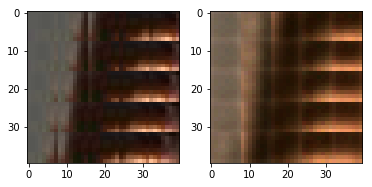

EPO: 18, recon_loss: 0.0088, total_loss: 0.0232, train_psnr:24.2268, validation_psnr:28.4183
EPO: 18, recon_loss: 0.0439, total_loss: 0.0563, train_psnr:24.2742, validation_psnr:28.7017
EPO: 18, recon_loss: 0.0415, total_loss: 0.0474, train_psnr:24.2194, validation_psnr:27.8049
EPO: 18, recon_loss: 0.0078, total_loss: 0.0140, train_psnr:24.1868, validation_psnr:28.3273
EPO: 18, recon_loss: 0.0072, total_loss: 0.0136, train_psnr:24.1751, validation_psnr:28.5790
EPO: 18, recon_loss: 0.0048, total_loss: 0.0137, train_psnr:24.2778, validation_psnr:28.8546
EPO: 18, recon_loss: 0.0221, total_loss: 0.0291, train_psnr:24.2566, validation_psnr:29.4697
EPO: 18, recon_loss: 0.0078, total_loss: 0.0186, train_psnr:24.2280, validation_psnr:29.5380
EPO: 18, recon_loss: 0.0129, total_loss: 0.0230, train_psnr:24.1873, validation_psnr:29.7281
EPO: 18, recon_loss: 0.0047, total_loss: 0.0114, train_psnr:24.1951, validation_psnr:29.6578
#########reconstruction test psnr: 28.4016 


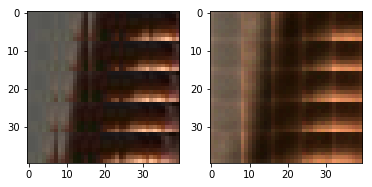

EPO: 18, recon_loss: 0.0016, total_loss: 0.0043, train_psnr:24.1694, validation_psnr:29.6713
EPO: 18, recon_loss: 0.0034, total_loss: 0.0069, train_psnr:24.1461, validation_psnr:29.6304
EPO: 18, recon_loss: 0.0029, total_loss: 0.0045, train_psnr:24.1204, validation_psnr:29.0339
EPO: 18, recon_loss: 0.0047, total_loss: 0.0070, train_psnr:23.8964, validation_psnr:28.4087
EPO: 18, recon_loss: 0.0149, total_loss: 0.0315, train_psnr:23.9513, validation_psnr:28.2368
EPO: 18, recon_loss: 0.0074, total_loss: 0.0141, train_psnr:23.9475, validation_psnr:28.9893
EPO: 18, recon_loss: 0.0143, total_loss: 0.0214, train_psnr:23.7973, validation_psnr:28.7181
EPO: 18, recon_loss: 0.0135, total_loss: 0.0175, train_psnr:23.6793, validation_psnr:28.7366
EPO: 18, recon_loss: 0.0101, total_loss: 0.0127, train_psnr:23.5176, validation_psnr:28.7470
EPO: 18, recon_loss: 0.0175, total_loss: 0.0317, train_psnr:23.4321, validation_psnr:28.1087
#########reconstruction test psnr: 27.1519 


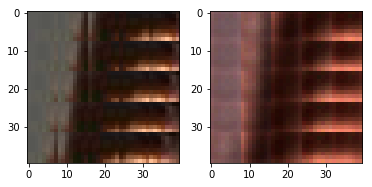

EPO: 18, recon_loss: 0.0164, total_loss: 0.0281, train_psnr:23.7406, validation_psnr:28.7302
EPO: 18, recon_loss: 0.0231, total_loss: 0.0356, train_psnr:23.9031, validation_psnr:28.9803
EPO: 18, recon_loss: 0.0202, total_loss: 0.0334, train_psnr:23.9822, validation_psnr:28.7602
EPO: 18, recon_loss: 0.0096, total_loss: 0.0175, train_psnr:24.0685, validation_psnr:28.7412
EPO: 18, recon_loss: 0.0148, total_loss: 0.0222, train_psnr:24.1181, validation_psnr:28.6575
EPO: 18, recon_loss: 0.0113, total_loss: 0.0157, train_psnr:24.2881, validation_psnr:28.6104
EPO: 18, recon_loss: 0.0112, total_loss: 0.0154, train_psnr:24.3581, validation_psnr:28.7870
EPO: 18, recon_loss: 0.0098, total_loss: 0.0155, train_psnr:24.3709, validation_psnr:28.9077
EPO: 18, recon_loss: 0.0087, total_loss: 0.0132, train_psnr:24.3655, validation_psnr:29.0803
EPO: 18, recon_loss: 0.0136, total_loss: 0.0200, train_psnr:24.4161, validation_psnr:28.9110
#########reconstruction test psnr: 27.7489 


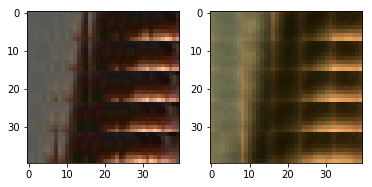

EPO: 18, recon_loss: 0.0086, total_loss: 0.0190, train_psnr:24.4607, validation_psnr:29.1363
EPO: 18, recon_loss: 0.0073, total_loss: 0.0149, train_psnr:24.4411, validation_psnr:28.6629
EPO: 18, recon_loss: 0.0195, total_loss: 0.0266, train_psnr:24.3975, validation_psnr:29.1017
EPO: 18, recon_loss: 0.0191, total_loss: 0.0256, train_psnr:24.4031, validation_psnr:28.8472
EPO: 18, recon_loss: 0.0109, total_loss: 0.0188, train_psnr:24.3901, validation_psnr:29.1232
EPO: 18, recon_loss: 0.0041, total_loss: 0.0075, train_psnr:24.4343, validation_psnr:28.8484
EPO: 18, recon_loss: 0.0054, total_loss: 0.0090, train_psnr:24.4558, validation_psnr:28.8129
EPO: 18, recon_loss: 0.0091, total_loss: 0.0147, train_psnr:24.4602, validation_psnr:28.3656
EPO: 18, recon_loss: 0.0037, total_loss: 0.0068, train_psnr:24.4832, validation_psnr:28.5703
EPO: 18, recon_loss: 0.0070, total_loss: 0.0106, train_psnr:24.4723, validation_psnr:28.6623
#########reconstruction test psnr: 27.6314 


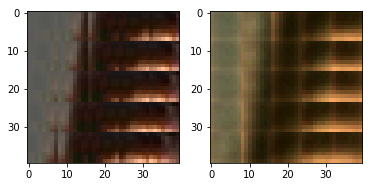

EPO: 18, recon_loss: 0.0081, total_loss: 0.0138, train_psnr:24.4682, validation_psnr:29.2216
EPO: 18, recon_loss: 0.0093, total_loss: 0.0155, train_psnr:24.4428, validation_psnr:29.1540
EPO: 18, recon_loss: 0.0174, total_loss: 0.0246, train_psnr:24.4001, validation_psnr:29.1662
EPO: 18, recon_loss: 0.0094, total_loss: 0.0167, train_psnr:24.3410, validation_psnr:29.0214
EPO: 18, recon_loss: 0.0067, total_loss: 0.0111, train_psnr:24.2745, validation_psnr:28.8096
EPO: 18, recon_loss: 0.0059, total_loss: 0.0154, train_psnr:24.2444, validation_psnr:29.1092
EPO: 18, recon_loss: 0.0064, total_loss: 0.0163, train_psnr:24.2238, validation_psnr:29.0107
EPO: 18, recon_loss: 0.0313, total_loss: 0.0413, train_psnr:24.1778, validation_psnr:28.9075
EPO: 18, recon_loss: 0.0087, total_loss: 0.0160, train_psnr:24.1770, validation_psnr:28.8727
EPO: 18, recon_loss: 0.0394, total_loss: 0.0498, train_psnr:24.0294, validation_psnr:29.1071
#########reconstruction test psnr: 28.0637 


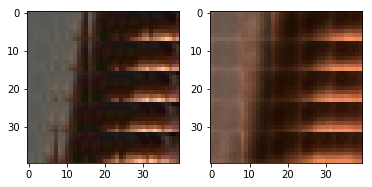

EPO: 18, recon_loss: 0.0033, total_loss: 0.0096, train_psnr:24.0084, validation_psnr:29.4230
EPO: 18, recon_loss: 0.0016, total_loss: 0.0065, train_psnr:23.9597, validation_psnr:28.3810
EPO: 18, recon_loss: 0.0265, total_loss: 0.0333, train_psnr:23.9586, validation_psnr:28.1972
EPO: 18, recon_loss: 0.0081, total_loss: 0.0128, train_psnr:23.9352, validation_psnr:28.4203
EPO: 18, recon_loss: 0.0092, total_loss: 0.0149, train_psnr:23.8894, validation_psnr:28.4753
EPO: 18, recon_loss: 0.0100, total_loss: 0.0183, train_psnr:23.8990, validation_psnr:29.2781
EPO: 18, recon_loss: 0.0120, total_loss: 0.0210, train_psnr:23.9129, validation_psnr:29.5987
EPO: 18, recon_loss: 0.0250, total_loss: 0.0321, train_psnr:23.9184, validation_psnr:29.5464
EPO: 18, recon_loss: 0.0056, total_loss: 0.0117, train_psnr:23.9104, validation_psnr:29.7454
EPO: 18, recon_loss: 0.0082, total_loss: 0.0133, train_psnr:23.8618, validation_psnr:29.7203
#########reconstruction test psnr: 28.4974 


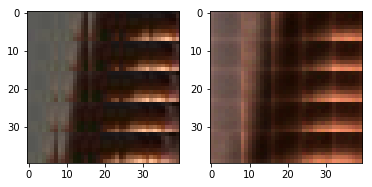

EPO: 18, recon_loss: 0.0113, total_loss: 0.0165, train_psnr:23.9402, validation_psnr:29.6070
EPO: 18, recon_loss: 0.0085, total_loss: 0.0118, train_psnr:24.2456, validation_psnr:29.4747
EPO: 18, recon_loss: 0.0178, total_loss: 0.0269, train_psnr:24.3433, validation_psnr:29.2766
EPO: 18, recon_loss: 0.0074, total_loss: 0.0115, train_psnr:24.3221, validation_psnr:29.3830
EPO: 18, recon_loss: 0.0081, total_loss: 0.0135, train_psnr:24.3891, validation_psnr:29.1356
EPO: 18, recon_loss: 0.0164, total_loss: 0.0267, train_psnr:24.4339, validation_psnr:29.3686
EPO: 18, recon_loss: 0.0093, total_loss: 0.0181, train_psnr:24.4594, validation_psnr:29.0848
EPO: 18, recon_loss: 0.0173, total_loss: 0.0238, train_psnr:24.3584, validation_psnr:29.1342
EPO: 18, recon_loss: 0.0112, total_loss: 0.0193, train_psnr:24.2542, validation_psnr:29.3455
EPO: 18, recon_loss: 0.0137, total_loss: 0.0219, train_psnr:24.1918, validation_psnr:29.3986
#########reconstruction test psnr: 28.2490 


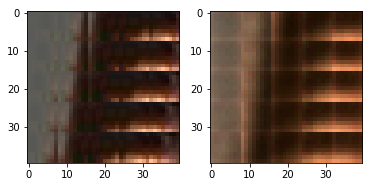

EPO: 18, recon_loss: 0.0125, total_loss: 0.0306, train_psnr:24.0708, validation_psnr:29.9945
EPO: 18, recon_loss: 0.0041, total_loss: 0.0088, train_psnr:24.2243, validation_psnr:29.4001
EPO: 18, recon_loss: 0.0101, total_loss: 0.0156, train_psnr:24.2200, validation_psnr:29.6131
EPO: 18, recon_loss: 0.0066, total_loss: 0.0124, train_psnr:24.2915, validation_psnr:29.5667
EPO: 18, recon_loss: 0.0078, total_loss: 0.0139, train_psnr:24.2908, validation_psnr:29.6772
EPO: 18, recon_loss: 0.0103, total_loss: 0.0198, train_psnr:24.3094, validation_psnr:29.3145
EPO: 18, recon_loss: 0.0061, total_loss: 0.0127, train_psnr:24.3329, validation_psnr:29.2785
EPO: 18, recon_loss: 0.0194, total_loss: 0.0264, train_psnr:24.2514, validation_psnr:29.2323
EPO: 18, recon_loss: 0.0180, total_loss: 0.0265, train_psnr:24.2193, validation_psnr:29.2817
EPO: 18, recon_loss: 0.0171, total_loss: 0.0279, train_psnr:24.1318, validation_psnr:29.1360
#########reconstruction test psnr: 28.0342 


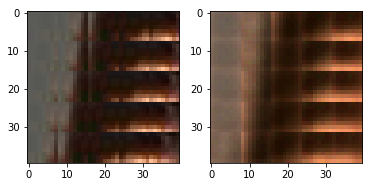

EPO: 18, recon_loss: 0.0123, total_loss: 0.0276, train_psnr:24.1059, validation_psnr:29.1027
EPO: 18, recon_loss: 0.0073, total_loss: 0.0156, train_psnr:24.0358, validation_psnr:29.3227
EPO: 18, recon_loss: 0.0088, total_loss: 0.0176, train_psnr:23.9844, validation_psnr:29.1405
EPO: 18, recon_loss: 0.0154, total_loss: 0.0234, train_psnr:23.9220, validation_psnr:29.4057
EPO: 18, recon_loss: 0.0139, total_loss: 0.0221, train_psnr:23.8469, validation_psnr:29.3642
EPO: 18, recon_loss: 0.0093, total_loss: 0.0128, train_psnr:23.7834, validation_psnr:29.3251
EPO: 18, recon_loss: 0.0049, total_loss: 0.0073, train_psnr:23.9855, validation_psnr:29.3883
EPO: 18, recon_loss: 0.0043, total_loss: 0.0072, train_psnr:24.0538, validation_psnr:29.5313
EPO: 18, recon_loss: 0.0100, total_loss: 0.0162, train_psnr:23.8881, validation_psnr:29.5565
EPO: 18, recon_loss: 0.0088, total_loss: 0.0146, train_psnr:24.0029, validation_psnr:29.2989
#########reconstruction test psnr: 28.0913 


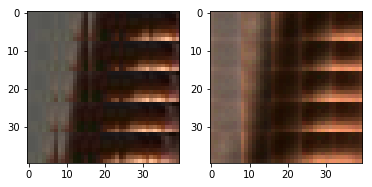

EPO: 18, recon_loss: 0.0143, total_loss: 0.0200, train_psnr:23.9461, validation_psnr:29.4057
EPO: 18, recon_loss: 0.0180, total_loss: 0.0360, train_psnr:23.9327, validation_psnr:30.0373
EPO: 18, recon_loss: 0.0100, total_loss: 0.0252, train_psnr:23.9916, validation_psnr:29.9875
EPO: 18, recon_loss: 0.0226, total_loss: 0.0422, train_psnr:23.9787, validation_psnr:30.0208
EPO: 18, recon_loss: 0.0169, total_loss: 0.0381, train_psnr:23.9543, validation_psnr:29.8667
EPO: 18, recon_loss: 0.0207, total_loss: 0.0429, train_psnr:23.8945, validation_psnr:29.9095
EPO: 18, recon_loss: 0.0058, total_loss: 0.0158, train_psnr:23.9863, validation_psnr:28.9023
EPO: 18, recon_loss: 0.0222, total_loss: 0.0312, train_psnr:23.9066, validation_psnr:28.3348
EPO: 18, recon_loss: 0.0111, total_loss: 0.0263, train_psnr:24.0854, validation_psnr:29.8360
EPO: 18, recon_loss: 0.0114, total_loss: 0.0212, train_psnr:24.1440, validation_psnr:29.5787
#########reconstruction test psnr: 28.3828 


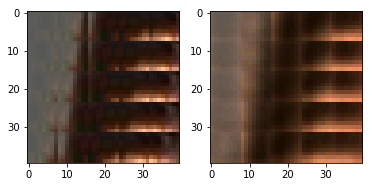

EPO: 18, recon_loss: 0.0160, total_loss: 0.0263, train_psnr:24.1662, validation_psnr:29.7113
EPO: 18, recon_loss: 0.0105, total_loss: 0.0253, train_psnr:24.1678, validation_psnr:29.7971
EPO: 18, recon_loss: 0.0138, total_loss: 0.0251, train_psnr:24.1979, validation_psnr:29.9553
EPO: 18, recon_loss: 0.0215, total_loss: 0.0333, train_psnr:24.2252, validation_psnr:29.9053
EPO: 18, recon_loss: 0.0069, total_loss: 0.0171, train_psnr:24.2138, validation_psnr:29.9407
EPO: 18, recon_loss: 0.0109, total_loss: 0.0201, train_psnr:24.1843, validation_psnr:29.8036
EPO: 18, recon_loss: 0.0097, total_loss: 0.0174, train_psnr:24.1699, validation_psnr:29.5269
EPO: 18, recon_loss: 0.0064, total_loss: 0.0160, train_psnr:24.0898, validation_psnr:29.6602
EPO: 18, recon_loss: 0.0229, total_loss: 0.0307, train_psnr:24.0159, validation_psnr:29.5056
EPO: 18, recon_loss: 0.0061, total_loss: 0.0143, train_psnr:23.9307, validation_psnr:29.5590
#########reconstruction test psnr: 28.4458 


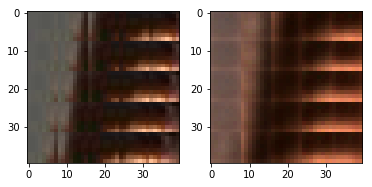

EPO: 18, recon_loss: 0.0118, total_loss: 0.0206, train_psnr:23.8335, validation_psnr:29.5504
EPO: 18, recon_loss: 0.0066, total_loss: 0.0135, train_psnr:23.8765, validation_psnr:29.2681
EPO: 18, recon_loss: 0.0073, total_loss: 0.0188, train_psnr:23.9332, validation_psnr:29.3645
EPO: 18, recon_loss: 0.0282, total_loss: 0.0350, train_psnr:23.9804, validation_psnr:29.1293
EPO: 18, recon_loss: 0.0090, total_loss: 0.0198, train_psnr:24.0064, validation_psnr:29.3730
EPO: 18, recon_loss: 0.0148, total_loss: 0.0218, train_psnr:23.9569, validation_psnr:29.5042
EPO: 18, recon_loss: 0.0073, total_loss: 0.0174, train_psnr:23.9815, validation_psnr:29.4432
EPO: 18, recon_loss: 0.0055, total_loss: 0.0134, train_psnr:23.9983, validation_psnr:29.2923
EPO: 18, recon_loss: 0.0221, total_loss: 0.0313, train_psnr:24.0038, validation_psnr:29.4565
EPO: 18, recon_loss: 0.0068, total_loss: 0.0105, train_psnr:24.0090, validation_psnr:29.0923
#########reconstruction test psnr: 27.9878 


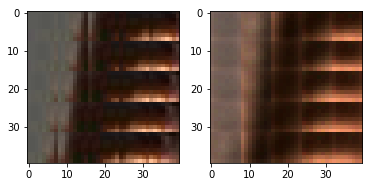

EPO: 18, recon_loss: 0.0146, total_loss: 0.0223, train_psnr:23.9763, validation_psnr:29.2530
EPO: 18, recon_loss: 0.0075, total_loss: 0.0177, train_psnr:24.0427, validation_psnr:29.5611
EPO: 18, recon_loss: 0.0038, total_loss: 0.0112, train_psnr:24.1806, validation_psnr:29.4970
EPO: 18, recon_loss: 0.0153, total_loss: 0.0211, train_psnr:24.2088, validation_psnr:29.6171
EPO: 18, recon_loss: 0.0044, total_loss: 0.0105, train_psnr:24.2555, validation_psnr:29.4145
EPO: 18, recon_loss: 0.0096, total_loss: 0.0148, train_psnr:24.2759, validation_psnr:29.3716
EPO: 18, recon_loss: 0.0236, total_loss: 0.0412, train_psnr:24.2129, validation_psnr:29.1516
EPO: 18, recon_loss: 0.0223, total_loss: 0.0361, train_psnr:24.0808, validation_psnr:29.1049
EPO: 18, recon_loss: 0.0153, total_loss: 0.0220, train_psnr:23.9280, validation_psnr:28.8018
EPO: 18, recon_loss: 0.0156, total_loss: 0.0258, train_psnr:23.7597, validation_psnr:28.8521
#########reconstruction test psnr: 27.8113 


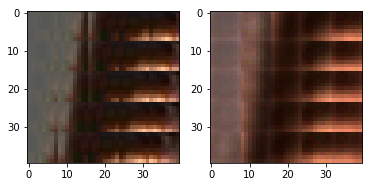

EPO: 18, recon_loss: 0.0109, total_loss: 0.0168, train_psnr:23.6677, validation_psnr:28.7393
EPO: 18, recon_loss: 0.0085, total_loss: 0.0282, train_psnr:23.5670, validation_psnr:29.5049
EPO: 18, recon_loss: 0.0038, total_loss: 0.0179, train_psnr:23.6430, validation_psnr:29.0848
EPO: 18, recon_loss: 0.0158, total_loss: 0.0255, train_psnr:23.7372, validation_psnr:29.1397
EPO: 18, recon_loss: 0.0105, total_loss: 0.0212, train_psnr:23.7943, validation_psnr:29.4115
EPO: 18, recon_loss: 0.0143, total_loss: 0.0231, train_psnr:23.8682, validation_psnr:29.3418
EPO: 18, recon_loss: 0.0094, total_loss: 0.0153, train_psnr:23.9312, validation_psnr:29.4745
EPO: 18, recon_loss: 0.0025, total_loss: 0.0042, train_psnr:24.1236, validation_psnr:29.3908
EPO: 18, recon_loss: 0.0160, total_loss: 0.0191, train_psnr:24.1875, validation_psnr:29.4470
EPO: 18, recon_loss: 0.0042, total_loss: 0.0066, train_psnr:24.1910, validation_psnr:29.5257
#########reconstruction test psnr: 28.3272 


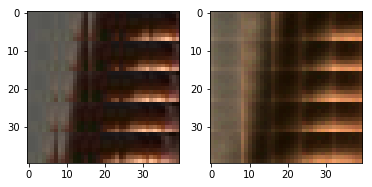

EPO: 18, recon_loss: 0.0044, total_loss: 0.0070, train_psnr:24.2643, validation_psnr:29.4447
EPO: 18, recon_loss: 0.0089, total_loss: 0.0141, train_psnr:24.3127, validation_psnr:29.1954
EPO: 18, recon_loss: 0.0097, total_loss: 0.0165, train_psnr:24.3043, validation_psnr:29.0257
EPO: 18, recon_loss: 0.0173, total_loss: 0.0253, train_psnr:24.2995, validation_psnr:28.7591
EPO: 18, recon_loss: 0.0089, total_loss: 0.0149, train_psnr:24.2681, validation_psnr:28.9166
EPO: 18, recon_loss: 0.0103, total_loss: 0.0139, train_psnr:24.3217, validation_psnr:28.7456
EPO: 18, recon_loss: 0.0150, total_loss: 0.0306, train_psnr:24.3088, validation_psnr:28.8551
EPO: 18, recon_loss: 0.0178, total_loss: 0.0274, train_psnr:24.2428, validation_psnr:29.2287
EPO: 18, recon_loss: 0.0136, total_loss: 0.0209, train_psnr:24.1056, validation_psnr:29.3533
EPO: 18, recon_loss: 0.0170, total_loss: 0.0217, train_psnr:24.0014, validation_psnr:29.1618
#########reconstruction test psnr: 28.0373 


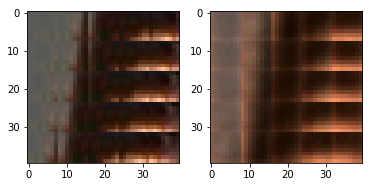

EPO: 18, recon_loss: 0.0144, total_loss: 0.0202, train_psnr:23.8982, validation_psnr:29.2002
EPO: 18, recon_loss: 0.0257, total_loss: 0.0372, train_psnr:23.7505, validation_psnr:29.5660
EPO: 18, recon_loss: 0.0352, total_loss: 0.0517, train_psnr:23.9509, validation_psnr:29.0442
EPO: 18, recon_loss: 0.0162, total_loss: 0.0229, train_psnr:23.7914, validation_psnr:29.6374
EPO: 18, recon_loss: 0.0389, total_loss: 0.0475, train_psnr:19.8469, validation_psnr:27.0801
EPO: 18, recon_loss: 0.0133, total_loss: 0.0200, train_psnr:22.5086, validation_psnr:29.6272
EPO: 18, recon_loss: 0.0243, total_loss: 0.0344, train_psnr:23.1684, validation_psnr:29.7312
EPO: 18, recon_loss: 0.0030, total_loss: 0.0095, train_psnr:24.1755, validation_psnr:28.0038
EPO: 18, recon_loss: 0.0085, total_loss: 0.0159, train_psnr:24.1646, validation_psnr:28.2023
EPO: 18, recon_loss: 0.0142, total_loss: 0.0201, train_psnr:24.0836, validation_psnr:28.4145
#########reconstruction test psnr: 27.4083 


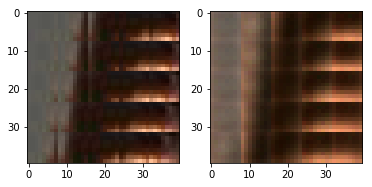

EPO: 18, recon_loss: 0.0153, total_loss: 0.0236, train_psnr:24.0120, validation_psnr:28.1264
EPO: 18, recon_loss: 0.0322, total_loss: 0.0402, train_psnr:23.9565, validation_psnr:28.2933
EPO: 18, recon_loss: 0.0034, total_loss: 0.0125, train_psnr:23.9981, validation_psnr:29.2806
EPO: 18, recon_loss: 0.0069, total_loss: 0.0128, train_psnr:23.9870, validation_psnr:29.2661
EPO: 18, recon_loss: 0.0101, total_loss: 0.0168, train_psnr:23.9846, validation_psnr:29.1880
EPO: 18, recon_loss: 0.0033, total_loss: 0.0065, train_psnr:23.9987, validation_psnr:29.0894
EPO: 18, recon_loss: 0.0062, total_loss: 0.0092, train_psnr:23.9738, validation_psnr:28.9678
EPO: 18, recon_loss: 0.0098, total_loss: 0.0190, train_psnr:24.0909, validation_psnr:29.2737
EPO: 18, recon_loss: 0.0105, total_loss: 0.0189, train_psnr:24.1087, validation_psnr:29.1429
EPO: 18, recon_loss: 0.0176, total_loss: 0.0260, train_psnr:24.1521, validation_psnr:29.3021
#########reconstruction test psnr: 28.1005 


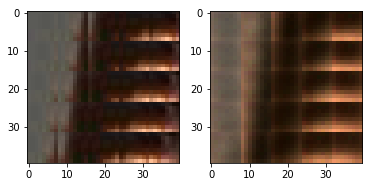

EPO: 18, recon_loss: 0.0122, total_loss: 0.0203, train_psnr:24.1568, validation_psnr:29.2723
EPO: 18, recon_loss: 0.0197, total_loss: 0.0244, train_psnr:24.1876, validation_psnr:29.2170
EPO: 19, recon_loss: 0.0057, total_loss: 0.0089, train_psnr:24.2851, validation_psnr:29.0603
EPO: 19, recon_loss: 0.0046, total_loss: 0.0074, train_psnr:24.3347, validation_psnr:29.0486
EPO: 19, recon_loss: 0.0194, total_loss: 0.0248, train_psnr:24.3242, validation_psnr:29.0425
EPO: 19, recon_loss: 0.0060, total_loss: 0.0100, train_psnr:24.3174, validation_psnr:29.0197
EPO: 19, recon_loss: 0.0138, total_loss: 0.0176, train_psnr:24.2616, validation_psnr:28.8303
EPO: 19, recon_loss: 0.0047, total_loss: 0.0156, train_psnr:24.2160, validation_psnr:29.7151
EPO: 19, recon_loss: 0.0069, total_loss: 0.0139, train_psnr:24.1975, validation_psnr:29.5929
EPO: 19, recon_loss: 0.0103, total_loss: 0.0160, train_psnr:24.1825, validation_psnr:29.7269
#########reconstruction test psnr: 28.5349 


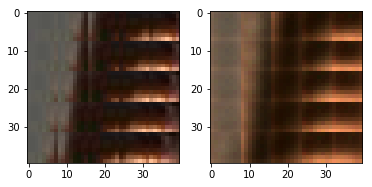

EPO: 19, recon_loss: 0.0090, total_loss: 0.0130, train_psnr:24.1842, validation_psnr:29.6559
EPO: 19, recon_loss: 0.0155, total_loss: 0.0242, train_psnr:24.1210, validation_psnr:29.3960
EPO: 19, recon_loss: 0.0043, total_loss: 0.0145, train_psnr:24.1489, validation_psnr:29.5667
EPO: 19, recon_loss: 0.0029, total_loss: 0.0070, train_psnr:24.1367, validation_psnr:29.3180
EPO: 19, recon_loss: 0.0079, total_loss: 0.0150, train_psnr:24.1599, validation_psnr:29.4987
EPO: 19, recon_loss: 0.0063, total_loss: 0.0083, train_psnr:24.1731, validation_psnr:29.5785
EPO: 19, recon_loss: 0.0136, total_loss: 0.0212, train_psnr:24.1864, validation_psnr:29.4084
EPO: 19, recon_loss: 0.0095, total_loss: 0.0156, train_psnr:24.0236, validation_psnr:29.8271
EPO: 19, recon_loss: 0.0093, total_loss: 0.0146, train_psnr:23.7771, validation_psnr:29.7499
EPO: 19, recon_loss: 0.0101, total_loss: 0.0154, train_psnr:23.6296, validation_psnr:29.6465
#########reconstruction test psnr: 28.4663 


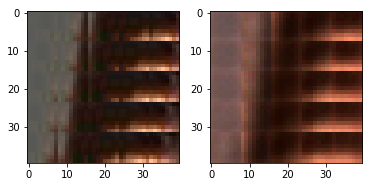

EPO: 19, recon_loss: 0.0082, total_loss: 0.0150, train_psnr:23.4963, validation_psnr:29.6677
EPO: 19, recon_loss: 0.0081, total_loss: 0.0134, train_psnr:23.3642, validation_psnr:29.5902
EPO: 19, recon_loss: 0.0082, total_loss: 0.0117, train_psnr:23.5196, validation_psnr:29.7115
EPO: 19, recon_loss: 0.0054, total_loss: 0.0103, train_psnr:23.7426, validation_psnr:29.7863
EPO: 19, recon_loss: 0.0160, total_loss: 0.0202, train_psnr:23.8507, validation_psnr:29.6321
EPO: 19, recon_loss: 0.0061, total_loss: 0.0097, train_psnr:23.9526, validation_psnr:29.5945
EPO: 19, recon_loss: 0.0093, total_loss: 0.0122, train_psnr:24.0018, validation_psnr:29.6539
EPO: 19, recon_loss: 0.0190, total_loss: 0.0305, train_psnr:24.0183, validation_psnr:29.4325
EPO: 19, recon_loss: 0.0075, total_loss: 0.0157, train_psnr:23.9555, validation_psnr:28.9532
EPO: 19, recon_loss: 0.0164, total_loss: 0.0284, train_psnr:24.0235, validation_psnr:29.3888
#########reconstruction test psnr: 28.2598 


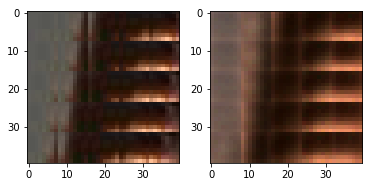

EPO: 19, recon_loss: 0.0205, total_loss: 0.0287, train_psnr:24.0459, validation_psnr:29.2315
EPO: 19, recon_loss: 0.0161, total_loss: 0.0227, train_psnr:24.0542, validation_psnr:29.0465
EPO: 19, recon_loss: 0.0141, total_loss: 0.0278, train_psnr:24.1073, validation_psnr:29.3728
EPO: 19, recon_loss: 0.0078, total_loss: 0.0148, train_psnr:24.3121, validation_psnr:28.9546
EPO: 19, recon_loss: 0.0163, total_loss: 0.0225, train_psnr:24.3597, validation_psnr:28.2335
EPO: 19, recon_loss: 0.0067, total_loss: 0.0090, train_psnr:24.4370, validation_psnr:28.5155
EPO: 19, recon_loss: 0.0064, total_loss: 0.0100, train_psnr:24.4502, validation_psnr:28.2550
EPO: 19, recon_loss: 0.0040, total_loss: 0.0073, train_psnr:24.4315, validation_psnr:27.9414
EPO: 19, recon_loss: 0.0035, total_loss: 0.0067, train_psnr:24.3940, validation_psnr:28.5887
EPO: 19, recon_loss: 0.0059, total_loss: 0.0122, train_psnr:24.3471, validation_psnr:29.1989
#########reconstruction test psnr: 28.0590 


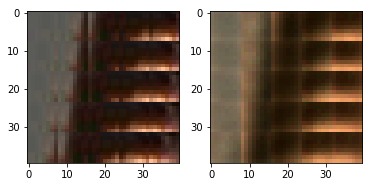

EPO: 19, recon_loss: 0.0056, total_loss: 0.0099, train_psnr:24.3292, validation_psnr:29.0536
EPO: 19, recon_loss: 0.0088, total_loss: 0.0182, train_psnr:24.2848, validation_psnr:29.5012
EPO: 19, recon_loss: 0.0049, total_loss: 0.0164, train_psnr:24.2441, validation_psnr:29.3579
EPO: 19, recon_loss: 0.0042, total_loss: 0.0131, train_psnr:24.3157, validation_psnr:29.4264
EPO: 19, recon_loss: 0.0077, total_loss: 0.0152, train_psnr:24.3516, validation_psnr:29.4783
EPO: 19, recon_loss: 0.0072, total_loss: 0.0117, train_psnr:24.3910, validation_psnr:29.2580
EPO: 19, recon_loss: 0.0063, total_loss: 0.0131, train_psnr:24.4039, validation_psnr:29.5507
EPO: 19, recon_loss: 0.0083, total_loss: 0.0230, train_psnr:24.3717, validation_psnr:29.8782
EPO: 19, recon_loss: 0.0090, total_loss: 0.0180, train_psnr:24.4546, validation_psnr:29.9652
EPO: 19, recon_loss: 0.0186, total_loss: 0.0271, train_psnr:24.4541, validation_psnr:29.7524
#########reconstruction test psnr: 28.5635 


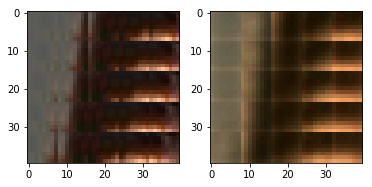

EPO: 19, recon_loss: 0.0122, total_loss: 0.0169, train_psnr:24.4419, validation_psnr:29.6002
EPO: 19, recon_loss: 0.0088, total_loss: 0.0129, train_psnr:24.4511, validation_psnr:29.4877
EPO: 19, recon_loss: 0.0195, total_loss: 0.0255, train_psnr:24.4127, validation_psnr:29.4871
EPO: 19, recon_loss: 0.0084, total_loss: 0.0136, train_psnr:24.5054, validation_psnr:29.2970
EPO: 19, recon_loss: 0.0124, total_loss: 0.0207, train_psnr:24.4723, validation_psnr:29.3162
EPO: 19, recon_loss: 0.0121, total_loss: 0.0195, train_psnr:24.4636, validation_psnr:29.2125
EPO: 19, recon_loss: 0.0131, total_loss: 0.0195, train_psnr:24.3985, validation_psnr:29.4275
EPO: 19, recon_loss: 0.0283, total_loss: 0.0326, train_psnr:24.3394, validation_psnr:29.5485
EPO: 19, recon_loss: 0.0159, total_loss: 0.0274, train_psnr:24.2524, validation_psnr:29.7013
EPO: 19, recon_loss: 0.0223, total_loss: 0.0348, train_psnr:24.1599, validation_psnr:29.8237
#########reconstruction test psnr: 28.6520 


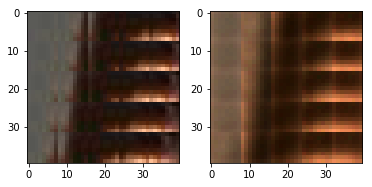

EPO: 19, recon_loss: 0.0331, total_loss: 0.0447, train_psnr:24.2097, validation_psnr:29.8818
EPO: 19, recon_loss: 0.0179, total_loss: 0.0291, train_psnr:24.1157, validation_psnr:29.7645
EPO: 19, recon_loss: 0.0193, total_loss: 0.0293, train_psnr:24.0386, validation_psnr:29.6076
EPO: 19, recon_loss: 0.0072, total_loss: 0.0140, train_psnr:24.2206, validation_psnr:29.2037
EPO: 19, recon_loss: 0.0100, total_loss: 0.0171, train_psnr:24.2326, validation_psnr:29.2313
EPO: 19, recon_loss: 0.0131, total_loss: 0.0204, train_psnr:24.1902, validation_psnr:28.7704
EPO: 19, recon_loss: 0.0165, total_loss: 0.0269, train_psnr:24.2451, validation_psnr:29.1620
EPO: 19, recon_loss: 0.0173, total_loss: 0.0254, train_psnr:24.1901, validation_psnr:29.7040
EPO: 19, recon_loss: 0.0056, total_loss: 0.0156, train_psnr:24.1831, validation_psnr:29.1861
EPO: 19, recon_loss: 0.0142, total_loss: 0.0234, train_psnr:24.1487, validation_psnr:28.9398
#########reconstruction test psnr: 27.8998 


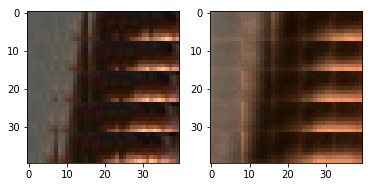

EPO: 19, recon_loss: 0.0206, total_loss: 0.0293, train_psnr:24.1124, validation_psnr:28.9568
EPO: 19, recon_loss: 0.0055, total_loss: 0.0149, train_psnr:24.1794, validation_psnr:28.8795
EPO: 19, recon_loss: 0.0137, total_loss: 0.0203, train_psnr:24.1443, validation_psnr:29.0929
EPO: 19, recon_loss: 0.0103, total_loss: 0.0271, train_psnr:24.1961, validation_psnr:29.0605
EPO: 19, recon_loss: 0.0110, total_loss: 0.0273, train_psnr:24.2075, validation_psnr:29.5255
EPO: 19, recon_loss: 0.0415, total_loss: 0.0584, train_psnr:24.3004, validation_psnr:29.5628
EPO: 19, recon_loss: 0.0096, total_loss: 0.0283, train_psnr:24.3161, validation_psnr:29.6235
EPO: 19, recon_loss: 0.0131, total_loss: 0.0289, train_psnr:24.3033, validation_psnr:29.5943
EPO: 19, recon_loss: 0.0157, total_loss: 0.0307, train_psnr:24.1979, validation_psnr:29.9759
EPO: 19, recon_loss: 0.0109, total_loss: 0.0290, train_psnr:24.1380, validation_psnr:29.7576
#########reconstruction test psnr: 28.6934 


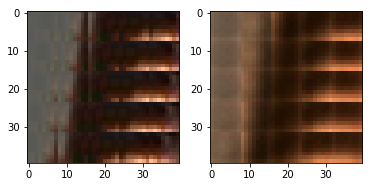

EPO: 19, recon_loss: 0.0532, total_loss: 0.0678, train_psnr:24.1628, validation_psnr:29.6855
EPO: 19, recon_loss: 0.0205, total_loss: 0.0382, train_psnr:24.1603, validation_psnr:29.4774
EPO: 19, recon_loss: 0.0187, total_loss: 0.0362, train_psnr:24.0763, validation_psnr:29.3890
EPO: 19, recon_loss: 0.0056, total_loss: 0.0207, train_psnr:24.3123, validation_psnr:28.8215
EPO: 19, recon_loss: 0.0175, total_loss: 0.0362, train_psnr:24.2831, validation_psnr:29.0622
EPO: 19, recon_loss: 0.0512, total_loss: 0.0618, train_psnr:24.3361, validation_psnr:28.5775
EPO: 19, recon_loss: 0.0299, total_loss: 0.0381, train_psnr:24.3052, validation_psnr:28.2109
EPO: 19, recon_loss: 0.0090, total_loss: 0.0134, train_psnr:24.2541, validation_psnr:28.2352
EPO: 19, recon_loss: 0.0052, total_loss: 0.0119, train_psnr:24.2628, validation_psnr:28.7137
EPO: 19, recon_loss: 0.0060, total_loss: 0.0149, train_psnr:24.3590, validation_psnr:29.1085
#########reconstruction test psnr: 28.0699 


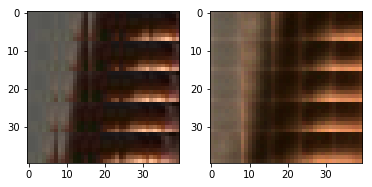

EPO: 19, recon_loss: 0.0218, total_loss: 0.0286, train_psnr:24.3428, validation_psnr:29.4732
EPO: 19, recon_loss: 0.0075, total_loss: 0.0179, train_psnr:24.3036, validation_psnr:29.6516
EPO: 19, recon_loss: 0.0149, total_loss: 0.0249, train_psnr:24.2759, validation_psnr:29.7898
EPO: 19, recon_loss: 0.0034, total_loss: 0.0074, train_psnr:24.2573, validation_psnr:29.7899
EPO: 19, recon_loss: 0.0015, total_loss: 0.0044, train_psnr:24.2454, validation_psnr:29.7403
EPO: 19, recon_loss: 0.0052, total_loss: 0.0082, train_psnr:24.2606, validation_psnr:29.3859
EPO: 19, recon_loss: 0.0032, total_loss: 0.0047, train_psnr:24.0844, validation_psnr:28.7961
EPO: 19, recon_loss: 0.0078, total_loss: 0.0107, train_psnr:23.2570, validation_psnr:27.0244
EPO: 19, recon_loss: 0.0147, total_loss: 0.0291, train_psnr:24.0835, validation_psnr:29.2281
EPO: 19, recon_loss: 0.0066, total_loss: 0.0128, train_psnr:23.9848, validation_psnr:29.1859
#########reconstruction test psnr: 28.1267 


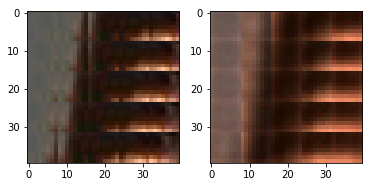

EPO: 19, recon_loss: 0.0148, total_loss: 0.0211, train_psnr:23.8363, validation_psnr:29.0214
EPO: 19, recon_loss: 0.0087, total_loss: 0.0118, train_psnr:23.6979, validation_psnr:28.7716
EPO: 19, recon_loss: 0.0086, total_loss: 0.0111, train_psnr:23.5647, validation_psnr:28.9253
EPO: 19, recon_loss: 0.0165, total_loss: 0.0328, train_psnr:23.6000, validation_psnr:28.8477
EPO: 19, recon_loss: 0.0168, total_loss: 0.0271, train_psnr:23.8526, validation_psnr:28.9063
EPO: 19, recon_loss: 0.0199, total_loss: 0.0309, train_psnr:23.9829, validation_psnr:28.9729
EPO: 19, recon_loss: 0.0201, total_loss: 0.0329, train_psnr:24.1042, validation_psnr:29.2308
EPO: 19, recon_loss: 0.0098, total_loss: 0.0176, train_psnr:24.1573, validation_psnr:28.9238
EPO: 19, recon_loss: 0.0173, total_loss: 0.0235, train_psnr:24.2574, validation_psnr:28.8110
EPO: 19, recon_loss: 0.0102, total_loss: 0.0143, train_psnr:24.3924, validation_psnr:28.7928
#########reconstruction test psnr: 27.6952 


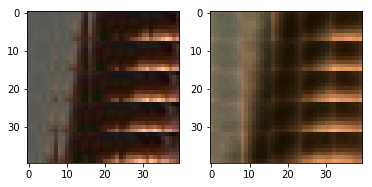

EPO: 19, recon_loss: 0.0110, total_loss: 0.0151, train_psnr:24.4557, validation_psnr:28.8954
EPO: 19, recon_loss: 0.0089, total_loss: 0.0132, train_psnr:24.4550, validation_psnr:29.0175
EPO: 19, recon_loss: 0.0097, total_loss: 0.0151, train_psnr:24.5252, validation_psnr:28.9232
EPO: 19, recon_loss: 0.0044, total_loss: 0.0187, train_psnr:24.5326, validation_psnr:29.1029
EPO: 19, recon_loss: 0.0045, total_loss: 0.0118, train_psnr:24.5480, validation_psnr:29.1634
EPO: 19, recon_loss: 0.0150, total_loss: 0.0235, train_psnr:24.5019, validation_psnr:28.8706
EPO: 19, recon_loss: 0.0161, total_loss: 0.0228, train_psnr:24.5023, validation_psnr:29.0117
EPO: 19, recon_loss: 0.0107, total_loss: 0.0163, train_psnr:24.4810, validation_psnr:29.0112
EPO: 19, recon_loss: 0.0088, total_loss: 0.0146, train_psnr:24.4602, validation_psnr:29.2903
EPO: 19, recon_loss: 0.0038, total_loss: 0.0073, train_psnr:24.5219, validation_psnr:28.8885
#########reconstruction test psnr: 27.8431 


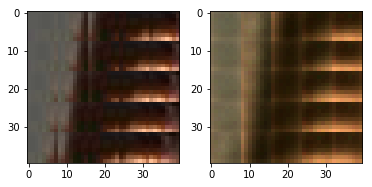

EPO: 19, recon_loss: 0.0063, total_loss: 0.0096, train_psnr:24.5414, validation_psnr:28.7964
EPO: 19, recon_loss: 0.0080, total_loss: 0.0130, train_psnr:24.5549, validation_psnr:28.6349
EPO: 19, recon_loss: 0.0046, total_loss: 0.0077, train_psnr:24.5550, validation_psnr:28.7409
EPO: 19, recon_loss: 0.0102, total_loss: 0.0134, train_psnr:24.5506, validation_psnr:28.7168
EPO: 19, recon_loss: 0.0065, total_loss: 0.0114, train_psnr:24.5564, validation_psnr:29.3084
EPO: 19, recon_loss: 0.0096, total_loss: 0.0159, train_psnr:24.5093, validation_psnr:29.3439
EPO: 19, recon_loss: 0.0136, total_loss: 0.0207, train_psnr:24.4682, validation_psnr:29.3610
EPO: 19, recon_loss: 0.0104, total_loss: 0.0163, train_psnr:24.3910, validation_psnr:28.9661
EPO: 19, recon_loss: 0.0061, total_loss: 0.0109, train_psnr:24.3324, validation_psnr:28.8880
EPO: 19, recon_loss: 0.0075, total_loss: 0.0190, train_psnr:24.3057, validation_psnr:29.2010
#########reconstruction test psnr: 28.1499 


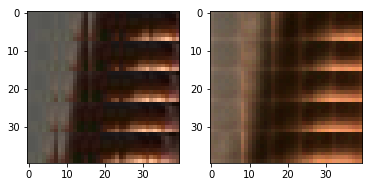

EPO: 19, recon_loss: 0.0147, total_loss: 0.0251, train_psnr:24.2614, validation_psnr:29.2497
EPO: 19, recon_loss: 0.0271, total_loss: 0.0379, train_psnr:24.2482, validation_psnr:28.9485
EPO: 19, recon_loss: 0.0102, total_loss: 0.0175, train_psnr:24.2401, validation_psnr:28.9113
EPO: 19, recon_loss: 0.0335, total_loss: 0.0439, train_psnr:24.0526, validation_psnr:29.0459
EPO: 19, recon_loss: 0.0020, total_loss: 0.0069, train_psnr:24.0668, validation_psnr:29.2599
EPO: 19, recon_loss: 0.0048, total_loss: 0.0100, train_psnr:24.0264, validation_psnr:28.6229
EPO: 19, recon_loss: 0.0253, total_loss: 0.0321, train_psnr:24.0166, validation_psnr:28.5537
EPO: 19, recon_loss: 0.0064, total_loss: 0.0116, train_psnr:24.0009, validation_psnr:28.5838
EPO: 19, recon_loss: 0.0090, total_loss: 0.0145, train_psnr:23.9612, validation_psnr:28.7186
EPO: 19, recon_loss: 0.0094, total_loss: 0.0166, train_psnr:23.9853, validation_psnr:29.2976
#########reconstruction test psnr: 28.1932 


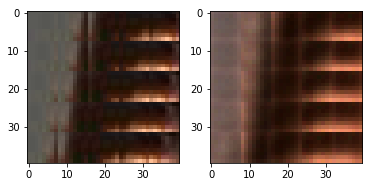

EPO: 19, recon_loss: 0.0098, total_loss: 0.0192, train_psnr:23.9799, validation_psnr:29.7397
EPO: 19, recon_loss: 0.0196, total_loss: 0.0272, train_psnr:23.9736, validation_psnr:29.7917
EPO: 19, recon_loss: 0.0052, total_loss: 0.0116, train_psnr:23.9815, validation_psnr:29.7713
EPO: 19, recon_loss: 0.0122, total_loss: 0.0180, train_psnr:23.9363, validation_psnr:29.7203
EPO: 19, recon_loss: 0.0112, total_loss: 0.0155, train_psnr:24.1197, validation_psnr:29.6105
EPO: 19, recon_loss: 0.0132, total_loss: 0.0175, train_psnr:24.3496, validation_psnr:29.5473
EPO: 19, recon_loss: 0.0186, total_loss: 0.0277, train_psnr:24.4511, validation_psnr:29.4683
EPO: 19, recon_loss: 0.0079, total_loss: 0.0124, train_psnr:24.4591, validation_psnr:29.3351
EPO: 19, recon_loss: 0.0090, total_loss: 0.0149, train_psnr:24.5071, validation_psnr:29.1046
EPO: 19, recon_loss: 0.0148, total_loss: 0.0238, train_psnr:24.5426, validation_psnr:29.3371
#########reconstruction test psnr: 28.2464 


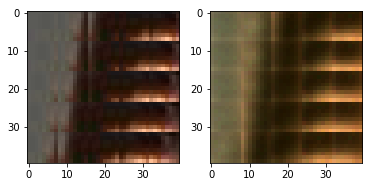

EPO: 19, recon_loss: 0.0082, total_loss: 0.0166, train_psnr:24.5203, validation_psnr:29.1955
EPO: 19, recon_loss: 0.0219, total_loss: 0.0279, train_psnr:24.3996, validation_psnr:28.9612
EPO: 19, recon_loss: 0.0110, total_loss: 0.0195, train_psnr:24.3247, validation_psnr:29.3824
EPO: 19, recon_loss: 0.0154, total_loss: 0.0232, train_psnr:24.2535, validation_psnr:29.4141
EPO: 19, recon_loss: 0.0149, total_loss: 0.0300, train_psnr:24.2202, validation_psnr:29.8208
EPO: 19, recon_loss: 0.0026, total_loss: 0.0071, train_psnr:24.3085, validation_psnr:29.4981
EPO: 19, recon_loss: 0.0127, total_loss: 0.0172, train_psnr:24.3560, validation_psnr:29.4180
EPO: 19, recon_loss: 0.0058, total_loss: 0.0112, train_psnr:24.3757, validation_psnr:29.6812
EPO: 19, recon_loss: 0.0069, total_loss: 0.0126, train_psnr:24.3651, validation_psnr:29.7982
EPO: 19, recon_loss: 0.0092, total_loss: 0.0190, train_psnr:24.3924, validation_psnr:29.5221
#########reconstruction test psnr: 28.3645 


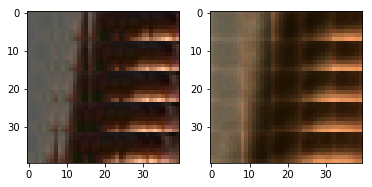

EPO: 19, recon_loss: 0.0060, total_loss: 0.0125, train_psnr:24.4073, validation_psnr:29.2591
EPO: 19, recon_loss: 0.0221, total_loss: 0.0302, train_psnr:24.3317, validation_psnr:29.2234
EPO: 19, recon_loss: 0.0090, total_loss: 0.0171, train_psnr:24.2765, validation_psnr:29.1536
EPO: 19, recon_loss: 0.0223, total_loss: 0.0296, train_psnr:24.1802, validation_psnr:28.8419
EPO: 19, recon_loss: 0.0116, total_loss: 0.0246, train_psnr:24.1561, validation_psnr:29.1759
EPO: 19, recon_loss: 0.0049, total_loss: 0.0130, train_psnr:24.1034, validation_psnr:29.4420
EPO: 19, recon_loss: 0.0174, total_loss: 0.0261, train_psnr:24.0367, validation_psnr:29.2304
EPO: 19, recon_loss: 0.0071, total_loss: 0.0138, train_psnr:23.9793, validation_psnr:29.5003
EPO: 19, recon_loss: 0.0127, total_loss: 0.0197, train_psnr:23.9046, validation_psnr:29.3862
EPO: 19, recon_loss: 0.0069, total_loss: 0.0087, train_psnr:23.9021, validation_psnr:29.4692
#########reconstruction test psnr: 28.2813 


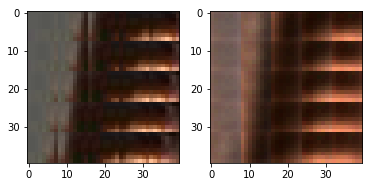

EPO: 19, recon_loss: 0.0039, total_loss: 0.0061, train_psnr:24.0854, validation_psnr:29.4710
EPO: 19, recon_loss: 0.0056, total_loss: 0.0089, train_psnr:24.1176, validation_psnr:29.6234
EPO: 19, recon_loss: 0.0085, total_loss: 0.0125, train_psnr:23.9772, validation_psnr:29.6317
EPO: 19, recon_loss: 0.0094, total_loss: 0.0154, train_psnr:24.0707, validation_psnr:29.4274
EPO: 19, recon_loss: 0.0171, total_loss: 0.0356, train_psnr:24.0211, validation_psnr:29.6994
EPO: 19, recon_loss: 0.0172, total_loss: 0.0326, train_psnr:24.0322, validation_psnr:30.0642
EPO: 19, recon_loss: 0.0151, total_loss: 0.0311, train_psnr:24.0657, validation_psnr:29.9678
EPO: 19, recon_loss: 0.0173, total_loss: 0.0366, train_psnr:24.0333, validation_psnr:30.2385
EPO: 19, recon_loss: 0.0157, total_loss: 0.0367, train_psnr:23.9941, validation_psnr:29.9305
EPO: 19, recon_loss: 0.0063, total_loss: 0.0160, train_psnr:24.0024, validation_psnr:29.7074
#########reconstruction test psnr: 28.5083 


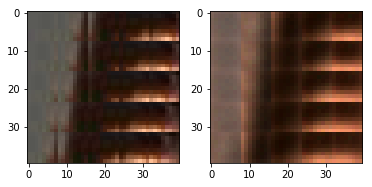

EPO: 19, recon_loss: 0.0088, total_loss: 0.0167, train_psnr:24.0808, validation_psnr:29.0994
EPO: 19, recon_loss: 0.0268, total_loss: 0.0400, train_psnr:23.9521, validation_psnr:28.3026
EPO: 19, recon_loss: 0.0104, total_loss: 0.0240, train_psnr:24.1703, validation_psnr:29.6743
EPO: 19, recon_loss: 0.0114, total_loss: 0.0217, train_psnr:24.2348, validation_psnr:29.5938
EPO: 19, recon_loss: 0.0107, total_loss: 0.0210, train_psnr:24.2510, validation_psnr:29.7495
EPO: 19, recon_loss: 0.0103, total_loss: 0.0235, train_psnr:24.2682, validation_psnr:29.9105
EPO: 19, recon_loss: 0.0162, total_loss: 0.0274, train_psnr:24.2830, validation_psnr:29.9663
EPO: 19, recon_loss: 0.0157, total_loss: 0.0271, train_psnr:24.2930, validation_psnr:30.1187
EPO: 19, recon_loss: 0.0085, total_loss: 0.0171, train_psnr:24.2888, validation_psnr:30.0389
EPO: 19, recon_loss: 0.0117, total_loss: 0.0202, train_psnr:24.2600, validation_psnr:29.8968
#########reconstruction test psnr: 28.7382 


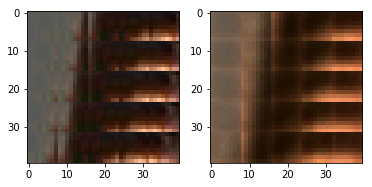

EPO: 19, recon_loss: 0.0075, total_loss: 0.0154, train_psnr:24.2206, validation_psnr:29.6463
EPO: 19, recon_loss: 0.0141, total_loss: 0.0239, train_psnr:24.1374, validation_psnr:29.7620
EPO: 19, recon_loss: 0.0179, total_loss: 0.0256, train_psnr:24.0493, validation_psnr:29.8205
EPO: 19, recon_loss: 0.0056, total_loss: 0.0133, train_psnr:23.9770, validation_psnr:29.6870
EPO: 19, recon_loss: 0.0124, total_loss: 0.0210, train_psnr:23.8757, validation_psnr:29.6198
EPO: 19, recon_loss: 0.0047, total_loss: 0.0123, train_psnr:23.9484, validation_psnr:29.4511
EPO: 19, recon_loss: 0.0094, total_loss: 0.0198, train_psnr:24.0135, validation_psnr:29.4679
EPO: 19, recon_loss: 0.0242, total_loss: 0.0320, train_psnr:24.0395, validation_psnr:29.0900
EPO: 19, recon_loss: 0.0094, total_loss: 0.0205, train_psnr:24.0673, validation_psnr:29.4477
EPO: 19, recon_loss: 0.0192, total_loss: 0.0267, train_psnr:24.0249, validation_psnr:29.5396
#########reconstruction test psnr: 28.4248 


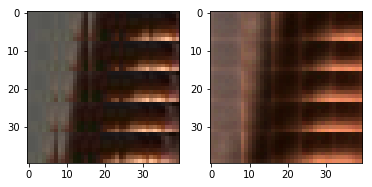

EPO: 19, recon_loss: 0.0042, total_loss: 0.0130, train_psnr:24.0535, validation_psnr:29.3751
EPO: 19, recon_loss: 0.0084, total_loss: 0.0152, train_psnr:24.0812, validation_psnr:29.2113
EPO: 19, recon_loss: 0.0169, total_loss: 0.0237, train_psnr:24.0719, validation_psnr:29.5264
EPO: 19, recon_loss: 0.0080, total_loss: 0.0127, train_psnr:24.0874, validation_psnr:29.1684
EPO: 19, recon_loss: 0.0115, total_loss: 0.0215, train_psnr:24.0565, validation_psnr:29.2930
EPO: 19, recon_loss: 0.0051, total_loss: 0.0124, train_psnr:24.1567, validation_psnr:29.6331
EPO: 19, recon_loss: 0.0043, total_loss: 0.0117, train_psnr:24.2649, validation_psnr:29.5990
EPO: 19, recon_loss: 0.0118, total_loss: 0.0181, train_psnr:24.2670, validation_psnr:29.7560
EPO: 19, recon_loss: 0.0052, total_loss: 0.0107, train_psnr:24.3360, validation_psnr:29.5015
EPO: 19, recon_loss: 0.0080, total_loss: 0.0140, train_psnr:24.3519, validation_psnr:29.5632
#########reconstruction test psnr: 28.4182 


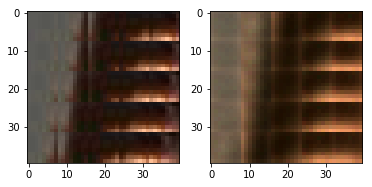

EPO: 19, recon_loss: 0.0220, total_loss: 0.0364, train_psnr:24.2404, validation_psnr:29.2280
EPO: 19, recon_loss: 0.0180, total_loss: 0.0317, train_psnr:24.1231, validation_psnr:29.2924
EPO: 19, recon_loss: 0.0141, total_loss: 0.0207, train_psnr:23.9521, validation_psnr:29.1120
EPO: 19, recon_loss: 0.0180, total_loss: 0.0281, train_psnr:23.8068, validation_psnr:28.8653
EPO: 19, recon_loss: 0.0107, total_loss: 0.0164, train_psnr:23.7069, validation_psnr:28.9401
EPO: 19, recon_loss: 0.0080, total_loss: 0.0271, train_psnr:23.6424, validation_psnr:29.6104
EPO: 19, recon_loss: 0.0039, total_loss: 0.0164, train_psnr:23.6980, validation_psnr:29.0725
EPO: 19, recon_loss: 0.0191, total_loss: 0.0282, train_psnr:23.8305, validation_psnr:29.2878
EPO: 19, recon_loss: 0.0075, total_loss: 0.0159, train_psnr:23.8742, validation_psnr:29.5197
EPO: 19, recon_loss: 0.0162, total_loss: 0.0239, train_psnr:23.9344, validation_psnr:29.1941
#########reconstruction test psnr: 28.0783 


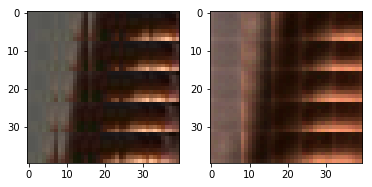

EPO: 19, recon_loss: 0.0057, total_loss: 0.0088, train_psnr:24.0477, validation_psnr:29.5189
EPO: 19, recon_loss: 0.0025, total_loss: 0.0042, train_psnr:24.2237, validation_psnr:29.4989
EPO: 19, recon_loss: 0.0139, total_loss: 0.0171, train_psnr:24.2834, validation_psnr:29.4740
EPO: 19, recon_loss: 0.0039, total_loss: 0.0066, train_psnr:24.3057, validation_psnr:29.5652
EPO: 19, recon_loss: 0.0055, total_loss: 0.0083, train_psnr:24.3712, validation_psnr:29.4412
EPO: 19, recon_loss: 0.0114, total_loss: 0.0174, train_psnr:24.3902, validation_psnr:29.2113
EPO: 19, recon_loss: 0.0081, total_loss: 0.0144, train_psnr:24.3747, validation_psnr:29.0076
EPO: 19, recon_loss: 0.0160, total_loss: 0.0232, train_psnr:24.3793, validation_psnr:28.9501
EPO: 19, recon_loss: 0.0058, total_loss: 0.0108, train_psnr:24.3613, validation_psnr:28.9772
EPO: 19, recon_loss: 0.0070, total_loss: 0.0103, train_psnr:24.3961, validation_psnr:28.7957
#########reconstruction test psnr: 27.7408 


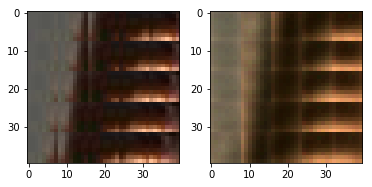

EPO: 19, recon_loss: 0.0170, total_loss: 0.0319, train_psnr:24.3842, validation_psnr:29.0650
EPO: 19, recon_loss: 0.0130, total_loss: 0.0203, train_psnr:24.2802, validation_psnr:29.3526
EPO: 19, recon_loss: 0.0171, total_loss: 0.0238, train_psnr:24.1402, validation_psnr:29.2731
EPO: 19, recon_loss: 0.0120, total_loss: 0.0169, train_psnr:24.0471, validation_psnr:29.2693
EPO: 19, recon_loss: 0.0162, total_loss: 0.0220, train_psnr:23.9402, validation_psnr:29.2447
EPO: 19, recon_loss: 0.0220, total_loss: 0.0343, train_psnr:23.8827, validation_psnr:29.5879
EPO: 19, recon_loss: 0.0427, total_loss: 0.0603, train_psnr:24.0419, validation_psnr:28.8821
EPO: 19, recon_loss: 0.0136, total_loss: 0.0197, train_psnr:23.8867, validation_psnr:29.6830
EPO: 19, recon_loss: 0.0325, total_loss: 0.0401, train_psnr:19.9258, validation_psnr:27.3864
EPO: 19, recon_loss: 0.0142, total_loss: 0.0219, train_psnr:22.9245, validation_psnr:29.6755
#########reconstruction test psnr: 28.3994 


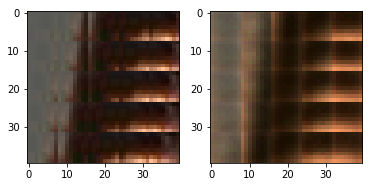

EPO: 19, recon_loss: 0.0078, total_loss: 0.0147, train_psnr:23.6664, validation_psnr:29.5801
EPO: 19, recon_loss: 0.0032, total_loss: 0.0103, train_psnr:24.2513, validation_psnr:28.2154
EPO: 19, recon_loss: 0.0104, total_loss: 0.0160, train_psnr:24.2238, validation_psnr:28.4045
EPO: 19, recon_loss: 0.0087, total_loss: 0.0159, train_psnr:24.1382, validation_psnr:28.4938
EPO: 19, recon_loss: 0.0124, total_loss: 0.0175, train_psnr:24.0642, validation_psnr:28.2949
EPO: 19, recon_loss: 0.0046, total_loss: 0.0234, train_psnr:23.9736, validation_psnr:29.7907
EPO: 19, recon_loss: 0.0026, total_loss: 0.0099, train_psnr:24.0585, validation_psnr:29.3045
EPO: 19, recon_loss: 0.0095, total_loss: 0.0150, train_psnr:24.0365, validation_psnr:29.2134
EPO: 19, recon_loss: 0.0066, total_loss: 0.0126, train_psnr:24.0531, validation_psnr:29.4625
EPO: 19, recon_loss: 0.0025, total_loss: 0.0047, train_psnr:24.0610, validation_psnr:29.1800
#########reconstruction test psnr: 28.0802 


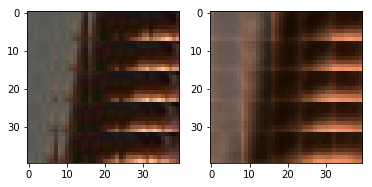

EPO: 19, recon_loss: 0.0084, total_loss: 0.0146, train_psnr:24.0380, validation_psnr:29.5537
EPO: 19, recon_loss: 0.0097, total_loss: 0.0187, train_psnr:24.1669, validation_psnr:29.3505


In [ ]:
batch_size = 64
learning_rate = 0.1
beta1 = 0.5
beta2 = 0.9
M = 5
z_dim = 64
tf.reset_default_graph()
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 50
sample_set = helper.Dataset('patch_celeba', glob(os.path.join(data_dir, 'validation/*.png'))[:2500])
#sample_images = next(sample_set.get_batches(25))
#sample_images *= 2

example_set = helper.Dataset('patch_celeba', glob(os.path.join(data_dir, 'validation/*.png'))[50:550:20])
example_images = next(sample_set.get_batches(25))
example_images *= 2



tiny_training_set = helper.Dataset('patch_celeba', glob(os.path.join(data_dir, 'sub_training/*.png'))[50:550:20])
training_sample_images = next(tiny_training_set.get_batches(25))
training_sample_images *= 2

celeba_dataset = helper.Dataset('patch_celeba', glob(os.path.join(data_dir, 'training/*.png')))


with tf.Graph().as_default():
    train_result, test_result = train(epochs, batch_size, z_dim, learning_rate, beta1, beta2, M, celeba_dataset.get_batches, 
         sample_set, example_images, training_sample_images, celeba_dataset.shape, celeba_dataset.image_mode)


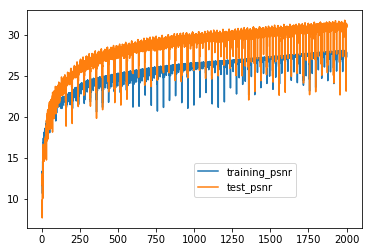

In [23]:
noad_train_result = train_result
noad_test_result = test_result
xcordinates = np.linspace(1,2000, num=len(train_result))
pyplot.plot(xcordinates, noad_train_result, label='training_psnr')
pyplot.plot(xcordinates, noad_test_result, label='test_psnr')
#pyplot.ylim(0.00, 0.04)
pyplot.legend(bbox_to_anchor=(0.5, 0.3), loc=2, borderaxespad=0.)
pyplot.show()

In [27]:
batch_size = 19
z_dim = 320

tf.reset_default_graph()
test_dataset = helper.Dataset('patch_celeba', glob(os.path.join(data_dir, 'testing/*.png')))
with tf.Graph().as_default():
    check_var(z_dim, test_dataset.get_batches, test_dataset.shape, test_dataset.image_mode)
    print(tf.get_collection('activations'))
    

 [*] Reading checkpoints...
INFO:tensorflow:Restoring parameters from ./checkpoint/spAE_scratch.model-126501

            We found a existing model and continue to train on it! 
            If you need a new model, delete checkpoint directory
['trainable_variables', 'variables', 'update_ops', 'activations', 'summaries']
[<tf.Tensor 'decoder/de_ac1:0' shape=(?, 320) dtype=float32>]


In [28]:
batch_size = 19
z_dim = 320

tf.reset_default_graph()
test_dataset = helper.Dataset('patch_celeba', glob(os.path.join(data_dir, 'testing/*.png')))

with tf.Graph().as_default():
    recon_patches, test_psnr = test(z_dim, test_dataset.get_batches, test_dataset.shape, test_dataset.image_mode)

 [*] Reading checkpoints...
INFO:tensorflow:Restoring parameters from ./checkpoint/spAE_scratch.model-126501

            We found a existing model and continue to train on it! 
            If you need a new model, delete checkpoint directory


In [29]:
def transform(images):
    return (((images - images.min()) * 255) / (images.max() - images.min())).astype(np.uint8)

27.0786314728


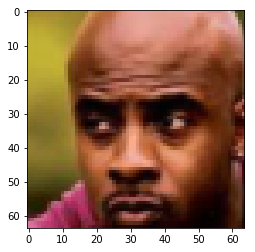

In [32]:
from sklearn.feature_extraction.image import extract_patches_2d, reconstruct_from_patches_2d
original_set = helper.Dataset('uiuc_celeba', glob(os.path.join(data_dir, 'resized_raw/26.png')))
#original_set = helper.Dataset('uiuc_celeba', glob(os.path.join('./data/img_align_celeba', '187652.jpg')))
sample_images = next(original_set.get_batches(1))#[0]
sample_images *= 2
#pyplot.imshow(sample_images)
pyplot.imshow(helper.images_square_grid(sample_images, 'RGB'))
#imgaling = './data/img_align_celeba'
#original_img = readImg(os.path.join(imgaling, '187652.jpg'))
#pyplot.imshow(transform(original_img))

ORIGINAL_SHAPE = (64,64,3)
recon_img = reconstruct_from_patches_2d(recon_patches, ORIGINAL_SHAPE).astype(np.float32)
print(compare_psnr(np.squeeze(sample_images), recon_img))


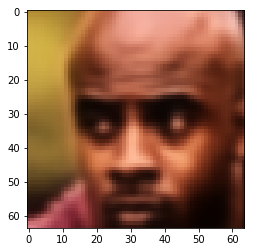

In [33]:
pyplot.imshow(transform(recon_img))

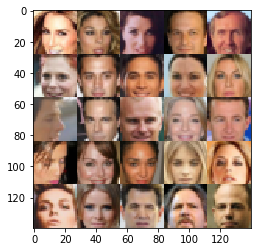

In [52]:
cmap = None
sample_images_grid = helper.images_square_grid(sample_images, celeba_dataset.image_mode)
pyplot.imshow(sample_images_grid, cmap=cmap)
pyplot.show()

In [45]:
from sklearn.feature_extraction.image import extract_patches


patches = extract_patches(resized_raw[-1], patch_shape=(8,8,3), extraction_step=2)
print(patches.shape)


(29, 29, 1, 8, 8, 3)


In [37]:
newpatches = np.squeeze(patches).reshape(29*29, 8,8,3)

In [39]:
newrecon = reconstruct_from_patches_2d(newpatches, ORIGINAL_SHAPE).astype(np.float32)

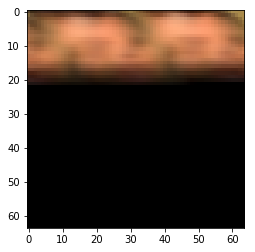

In [40]:
pyplot.imshow(transform(newrecon))